In [1]:
import sys
from pathlib import Path


repo_root = Path.cwd().resolve().parent
sys.path.insert(0, str(repo_root))

print(repo_root)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import warnings
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge

# Cheminformatics
from rdkit import Chem
from minervachem import fingerprinters as mfp
from minervachem.fingerprinters import GraphletFingerprinter
from minervachem.transformers import FingerprintFeaturizer
from minervachem.regressors import HierarchicalResidualModel
from minervachem.plotting import parity_plot_train_test
from minervachem.graphlet_dags import GraphletDAG, draw_projected_coefs

warnings.filterwarnings('ignore')
%matplotlib inline
%load_ext autoreload
%autoreload 2

print("✓ All imports successful")

/Users/lucyliu/Documents/interpretability
✓ All imports successful


## 1. Preprocessing the Data

Load QM9 dataset and create RDKit molecule objects.

In [2]:
df = pd.read_csv('./qm9_processed.csv')
print("Data frame shape:", df.shape)
print("Data frame columns:", df.columns.tolist())
print("\nExample molecule:")
print(df.iloc[0])

Data frame shape: (130831, 19)
Data frame columns: ['i', 'smiles', 'A', 'B', 'C', 'mu', 'alpha', 'e_homo', 'e_lumo', 'e_gap', 'E_R^2', 'zpve', 'U_0', 'U', 'H', 'G', 'C_v', 'E_self_sum', 'E_at']

Example molecule:
i                        1
smiles                   C
A                 157.7118
B                157.70997
C                157.70699
mu                     0.0
alpha                13.21
e_homo             -0.3877
e_lumo              0.1171
e_gap               0.5048
E_R^2              35.3641
zpve              0.044749
U_0          -25400.912075
U            -25399.112378
H               -40.475117
G               -40.498597
C_v                  6.469
E_self_sum   -25004.912181
E_at           -395.999894
Name: 0, dtype: object


⏱️  Time to create 130831 molecules: 4.74 seconds


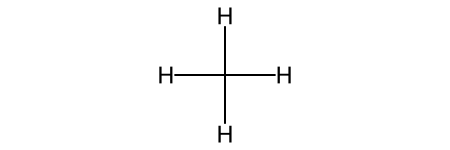

In [3]:
start = time.time()
df['mol'] = df['smiles'].map(lambda s: Chem.AddHs(Chem.MolFromSmiles(s)))
print(f"⏱️  Time to create {len(df)} molecules: {time.time() - start:.2f} seconds")

# Display first molecule
df['mol'].iloc[0]

## 2. Feature Engineering with Graphlet Fingerprints

Use **Minervachem's GraphletFingerprinter** to extract molecular substructures (graphlets).

From the proposal:
> "Graphlet decomposition provides a natural way to represent molecular structures through local subgraph patterns."

In [4]:
featurizer = FingerprintFeaturizer(
    fingerprinter=GraphletFingerprinter(max_len=5),  # Max graphlet size
    verbose=0,
    n_jobs=-1,      # Use all available cores
    chunk_size='auto',
)

print(f"✓ Featurizer initialized")
print(f"  Max graphlet length: {featurizer.fingerprinter.max_len}")

No elements to filter. Complete fingerprints are returned.
✓ Featurizer initialized
  Max graphlet length: 5


In [5]:
train, test = train_test_split(df, train_size=0.8, random_state=42)

print(f"Training set: {len(train)} molecules")
print(f"Test set:     {len(test)} molecules")

X_train = featurizer.fit_transform(train['mol'])
X_test = featurizer.transform(test['mol'])

Training set: 104664 molecules
Test set:     26167 molecules
Number of cores used: -1
Number of cores used: -1


## 3. Ridge Regression Baseline

Fit a simple linear model to establish baseline performance.

In [6]:
y_train = train['E_at'].values
y_test = test['E_at'].values

print(f"Target variable: E_at (Atomization Energy)")
print(f"  Train range: [{y_train.min():.2f}, {y_train.max():.2f}] kcal/mol")
print(f"  Test range:  [{y_test.min():.2f}, {y_test.max():.2f}] kcal/mol")



Target variable: E_at (Atomization Energy)
  Train range: [-2608.45, -213.09] kcal/mol
  Test range:  [-2605.66, -301.82] kcal/mol


In [7]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

model = Ridge(fit_intercept=False, alpha=1e-5, solver='sparse_cg', tol=1e-5)

start = time.time()
model.fit(X_train, y_train)
print(f"⏱️  Training time: {time.time() - start:.2f} seconds")

# Compute R² manually
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

print(f"\nPerformance Metrics:")
print(f"  Train R²:  {train_r2:.4f}")
print(f"  Test R²:   {test_r2:.4f}")
print(f"  Train MAE: {train_mae:.2f} kcal/mol")
print(f"  Test MAE:  {test_mae:.2f} kcal/mol")

⏱️  Training time: 1.29 seconds

Performance Metrics:
  Train R²:  0.9993
  Test R²:   0.9993
  Train MAE: 3.84 kcal/mol
  Test MAE:  3.89 kcal/mol


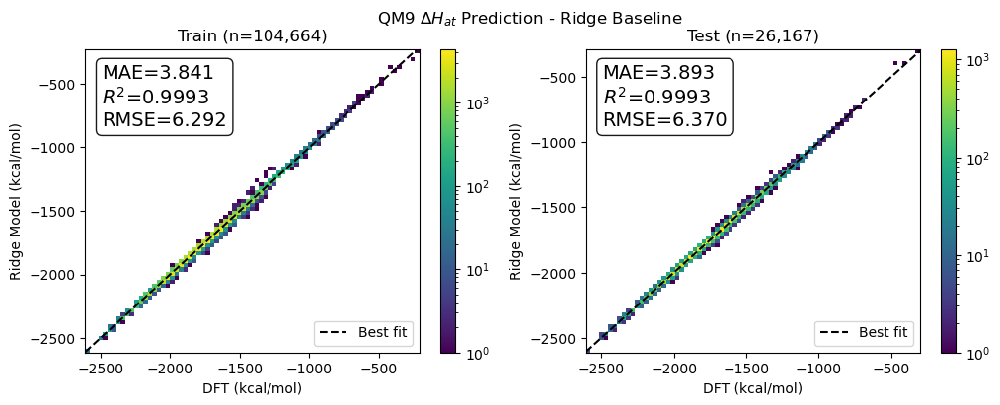

In [8]:
parity_plot_train_test(
    [X_train, X_test], 
    [y_train, y_test],
    model, 
    figsize=(12, 4),
    xlab='DFT (kcal/mol)', 
    ylab='Ridge Model (kcal/mol)', 
    title='QM9 $\Delta H_{at}$ Prediction - Ridge Baseline', 
    bins=75
)
plt.show()

## 4. Hierarchical Residual Model

From the proposal:
> "Hierarchical models can capture multi-scale structure by fitting residuals at each graphlet level."

This model fits graphlets of increasing size sequentially, capturing hierarchical patterns.

In [9]:
base_model = Ridge(fit_intercept=False, alpha=1e-5, solver='sparse_cg')
hmodel = HierarchicalResidualModel(regressor=base_model, verbose=1)

start = time.time()
hmodel.fit(X_train, y_train, levels=featurizer.bit_sizes_)
print(f"⏱️  Training time: {time.time() - start:.2f} seconds")

print(f"\nX_train shape: {X_train.shape}")
print(f"hmodel.coef_ shape: {hmodel.coef_.shape}")

Regressor levels::   0%|          | 0/5 [00:00<?, ?it/s]

⏱️  Training time: 29.08 seconds

X_train shape: (104664, 5995)
hmodel.coef_ shape: (5995,)


HIERARCHICAL MODEL PERFORMANCE
R² Score:
  Train: 0.9994
  Test:  0.9994

Mean Absolute Error (MAE):
  Train: 3.36 kcal/mol
  Test:  3.44 kcal/mol

Root Mean Squared Error (RMSE):
  Train: 5.75 kcal/mol
  Test:  5.87 kcal/mol


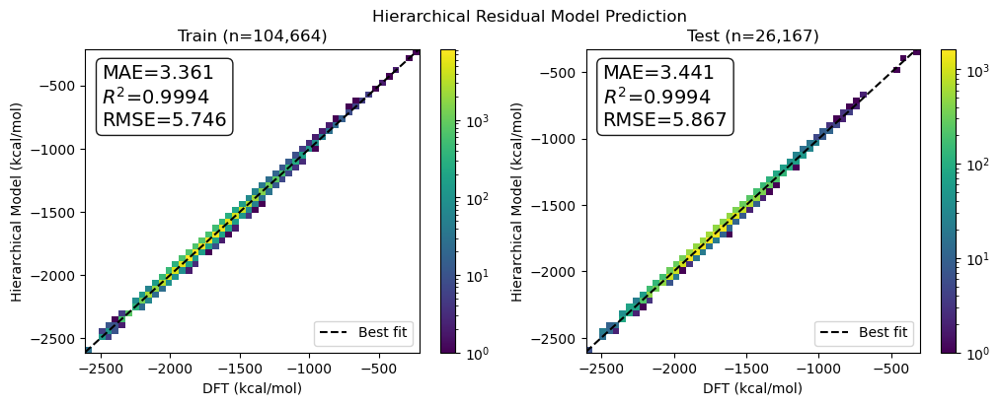

In [10]:
# Compute predictions
y_train_pred = hmodel.predict(X_train)
y_test_pred = hmodel.predict(X_test)

# Compute metrics manually
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("=" * 60)
print("HIERARCHICAL MODEL PERFORMANCE")
print("=" * 60)
print(f"R² Score:")
print(f"  Train: {train_r2:.4f}")
print(f"  Test:  {test_r2:.4f}")
print(f"\nMean Absolute Error (MAE):")
print(f"  Train: {train_mae:.2f} kcal/mol")
print(f"  Test:  {test_mae:.2f} kcal/mol")
print(f"\nRoot Mean Squared Error (RMSE):")
print(f"  Train: {train_rmse:.2f} kcal/mol")
print(f"  Test:  {test_rmse:.2f} kcal/mol")

# Visualize
parity_plot_train_test(
    [X_train, X_test], 
    [y_train, y_test],
    hmodel, 
    figsize=(12, 4),
    xlab='DFT (kcal/mol)', 
    ylab='Hierarchical Model (kcal/mol)', 
    title='Hierarchical Residual Model Prediction'
)
plt.savefig('hmodel_perf.png', dpi=150, bbox_inches='tight')
plt.show()

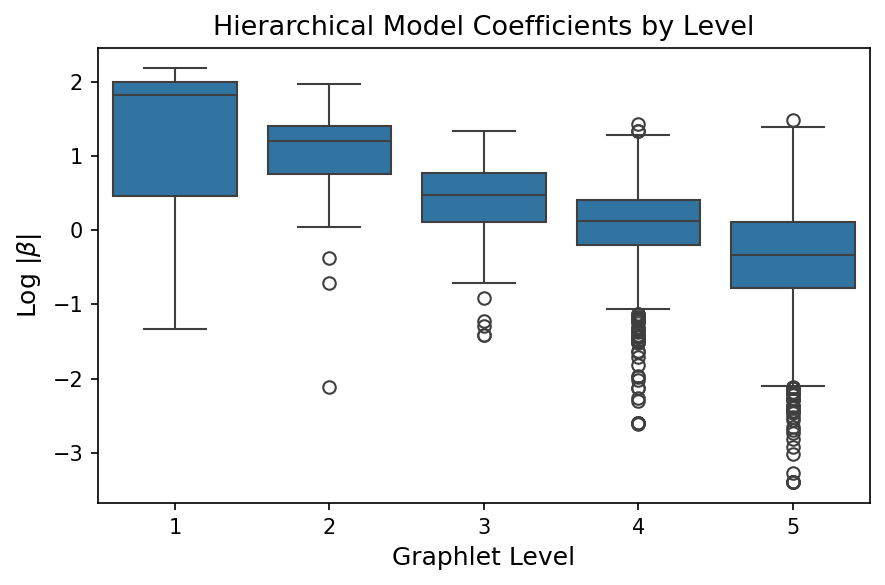

In [11]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
hmodel.plot_coefs()
plt.ylabel("Log |$\\beta$|", fontsize=12)
plt.xlabel("Graphlet Level", fontsize=12)
plt.title("Hierarchical Model Coefficients by Level", fontsize=13)
plt.tight_layout()
plt.show()

## 5. Bond-Level Projections (Original Minervachem Method)

Visualize how graphlet contributions project onto molecular bonds.

This is Minervachem's original interpretability approach using DAG (Directed Acyclic Graph) projections.

In [12]:
smiles_strings = ['CC', 'C=C', 'C#C']
mols = [Chem.AddHs(Chem.MolFromSmiles(s)) for s in smiles_strings]

dags = []
for mol, smiles in zip(mols, smiles_strings):
    dag = GraphletDAG(
        mol,
        fingerprinter=featurizer.fingerprinter,
        bit_ids=featurizer.bit_ids_,
        coef=hmodel.coef_
    )
    dags.append(dag)
    print(f"Created DAG for {smiles}: {mol.GetNumAtoms()} atoms, {mol.GetNumBonds()} bonds")

Created DAG for CC: 8 atoms, 7 bonds
Created DAG for C=C: 6 atoms, 5 bonds
Created DAG for C#C: 4 atoms, 3 bonds


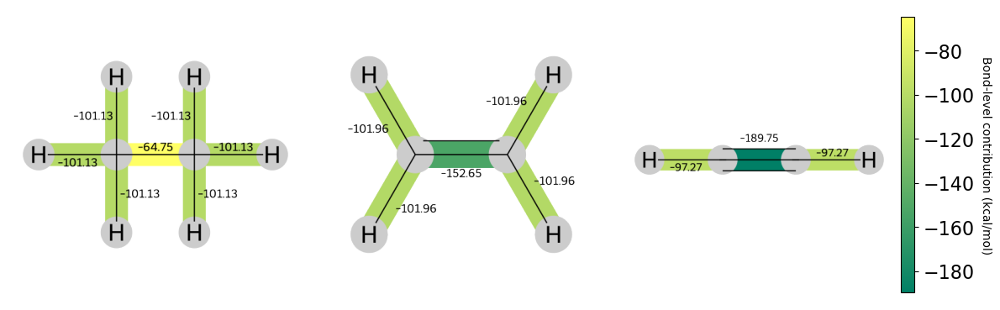

In [13]:
draw_projected_coefs(
    dags,
    level=2,
    figsize=(12, 12),
    ncol=len(dags),
    cbar_label='Bond-level contribution (kcal/mol)'
)
plt.tight_layout()
plt.savefig('hmodel_interp.png', dpi=150, bbox_inches='tight')
plt.show()

In [14]:
# Configure for single-threaded to avoid issues
featurizer.n_jobs = 1
featurizer.verbose = False

model_preds = hmodel.predict(featurizer.transform(mols))
dag_preds = [dag.project_to_layer(1).sum() for dag in dags]

print("Verification that DAG projections match model predictions:")
for smiles, model_pred, dag_pred in zip(smiles_strings, model_preds, dag_preds):
    print(f"  {smiles:6s}: Model={model_pred:8.3f}, DAG={dag_pred:8.3f}, "
          f"Diff={abs(model_pred - dag_pred):.6f}")

Number of cores used: 1
Verification that DAG projections match model predictions:
  CC    : Model=-671.529, DAG=-671.529, Diff=0.000000
  C=C   : Model=-560.499, DAG=-560.499, Diff=0.000000
  C#C   : Model=-384.301, DAG=-384.301, Diff=0.000000


---

# 6. PARTITION-BASED INTERPRETABILITY

This section implements the partition-based interpretability framework:

### Equation (2):
$$f(G) = \sum_p F_p + \sum_{p_1,p_2} F_{p_1,p_2} + \sum_{p_1,p_2,p_3} F_{p_1,p_2,p_3} + ...$$

Where:
- **$F_p$** = Contributions **within** partition $p$ 
- **$F_{p_1,p_2}$** = Interactions **between** two partitions → Less interpretable 
- **Higher-order** = Multi-partition interactions → Least interpretable 

### Goal:
> "The score may minimize higher-order contributions $F_{p_1p_2}$, $F_{p_1p_2p_3}$, etc., seeking a partition into regions with minimal interactions."

### Method:
> "For larger graphs, we will use greedy algorithms that evolve a random starting partition."

---

In [15]:
import importlib
import partition_interpretability

importlib.reload(partition_interpretability)

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    visualize_partition_comparison,
    partition_connectivity_penalty,
    connectivity_adjusted_score
)
print("=" * 80)
print("PARTITION-BASED INTERPRETABILITY FOR QM9 MOLECULES")
print("Using Minervachem Graphlets Directly")
print("=" * 80)

PARTITION-BASED INTERPRETABILITY FOR QM9 MOLECULES
Using Minervachem Graphlets Directly


In [16]:
interpreter_full = PartitionInterpreter(
    featurizer,
    hmodel,
    remove_single_atom_contributions=False
)

interpreter_no_atoms = PartitionInterpreter(
    featurizer,
    hmodel,
    remove_single_atom_contributions=True
)

# Main notebook mode:
interpreter = interpreter_full

print("\n✓ PartitionInterpreter initialized")
print(f"  Using minervachem: {interpreter.is_minervachem}")
print(f"  Graphlet types: {len(featurizer.bit_ids_)}")
print(f"  Model coefficients: {len(hmodel.coef_)}")
print(f"  Max graphlet size: {featurizer.fingerprinter.max_len}")


✓ PartitionInterpreter initialized
  Using minervachem: True
  Graphlet types: 5995
  Model coefficients: 5995
  Max graphlet size: 5


In [17]:
atom_indices = sorted(
    interpreter_no_atoms.atom_level_indices
)

print(
    "Single-atom feature count:",
    len(atom_indices)
)

print(
    "No-atom coefficients are zero:",
    np.allclose(
        interpreter_no_atoms.coefficients[
            atom_indices
        ],
        0.0
    )
)

Single-atom feature count: 15
No-atom coefficients are zero: True


In [18]:
test_reset = test.reset_index(drop=True)

# Select molecules of different sizes
small_idx = test_reset[test_reset['mol'].apply(lambda m: m.GetNumAtoms() < 8)].index[0]
medium_idx = test_reset[test_reset['mol'].apply(lambda m: 8 <= m.GetNumAtoms() < 12)].index[0]
large_idx = test_reset[test_reset['mol'].apply(lambda m: m.GetNumAtoms() >= 12)].index[0]

selected_mols = [
    (test_reset.loc[small_idx, 'mol'], test_reset.loc[small_idx, 'smiles'], 'Small'),
    (test_reset.loc[medium_idx, 'mol'], test_reset.loc[medium_idx, 'smiles'], 'Medium'),
    (test_reset.loc[large_idx, 'mol'], test_reset.loc[large_idx, 'smiles'], 'Large')
]

print("=" * 80)
print("SELECTED MOLECULES FOR DETAILED PARTITION ANALYSIS")
print("=" * 80)

for mol, smiles, size_label in selected_mols:
    print(f"\n[{size_label}] {smiles}")
    print(f"  Atoms: {mol.GetNumAtoms()}, Bonds: {mol.GetNumBonds()}")
    pred = hmodel.predict(featurizer.transform([mol]))[0]
    print(f"  Predicted ΔH_at: {pred:.2f} kcal/mol")
    
    actual_idx = test_reset[test_reset['smiles'] == smiles].index
    if len(actual_idx) > 0:
        actual = test_reset.loc[actual_idx[0], 'E_at']
        print(f"  Actual ΔH_at: {actual:.2f} kcal/mol")
        print(f"  Error: {abs(pred - actual):.2f} kcal/mol")

SELECTED MOLECULES FOR DETAILED PARTITION ANALYSIS

[Small] FC(F)(F)F
  Atoms: 5, Bonds: 4
Number of cores used: 1
  Predicted ΔH_at: -481.03 kcal/mol
  Actual ΔH_at: -478.90 kcal/mol
  Error: 2.12 kcal/mol

[Medium] O=C1NN=CN=C1
  Atoms: 10, Bonds: 10
Number of cores used: 1
  Predicted ΔH_at: -1039.79 kcal/mol
  Actual ΔH_at: -1041.95 kcal/mol
  Error: 2.16 kcal/mol

[Large] COC12CC1OC2CO
  Atoms: 19, Bonds: 20
Number of cores used: 1
  Predicted ΔH_at: -1765.75 kcal/mol
  Actual ΔH_at: -1767.24 kcal/mol
  Error: 1.49 kcal/mol


### Compare Partitioning Strategies

Test different ways to partition molecules:
1. **Functional Groups** - Chemistry-aware (e.g., C=O, NH₂)
2. **Distance-based** - Clustering by graph distance
3. **Random** - Baseline control

**Goal:** Find which strategy minimizes higher-order interactions (maximizes interpretability score)


════════════════════════════════════════════════════════════════════════════════
PARTITION COMPARISON: BASELINES vs GREEDY VARIANTS
════════════════════════════════════════════════════════════════════════════════

Strategies tested:
  1. Distance baseline (graph distance clustering)
  2. Random baseline (random assignment)
  3. Greedy-Random (random init + greedy optimization)
  4. Greedy-Distance (distance init + greedy optimization)
  'greedy algorithms that evolve a random starting partition'
  'seeking a partition into regions with minimal interactions'
════════════════════════════════════════════════════════════════════════════════


ANALYZING Small MOLECULE: FC(F)(F)F

Comparing strategies for: FC(F)(F)F
  Testing k values: [2]
  Greedy iterations: 100
  Connectivity weight: 0.100
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
  Distance (k=2): raw=0.9980, penalty=0.0000, adjusted=0.9980
  Random (k=2): raw=0.9971, penalty=0.4000, adjusted=0.9

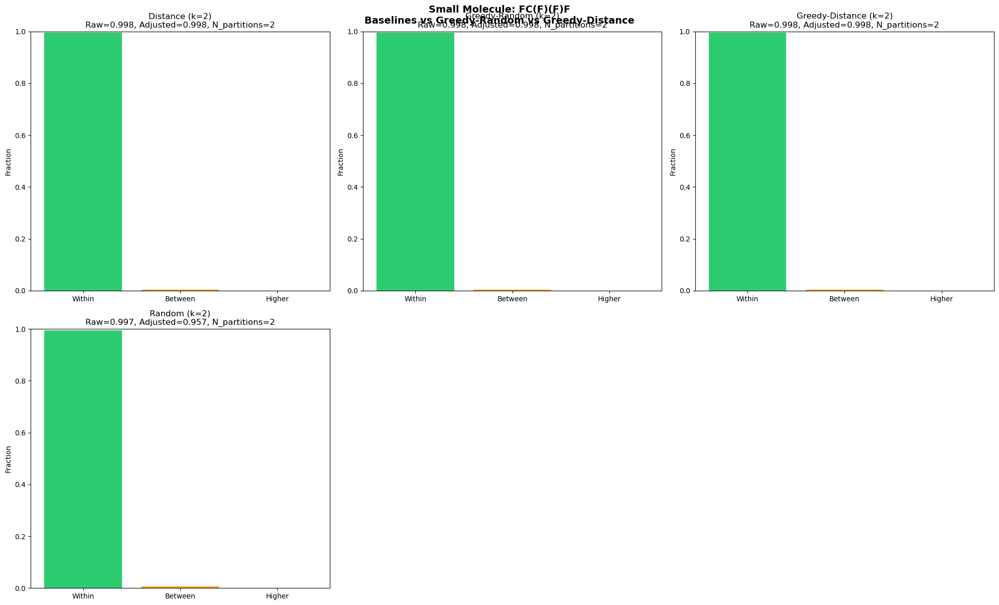


✓ Partition compariso displayed

ANALYZING Medium MOLECULE: O=C1NN=CN=C1

Comparing strategies for: O=C1NN=CN=C1
  Testing k values: [2]
  Greedy iterations: 100
  Connectivity weight: 0.100
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
  Distance (k=2): raw=0.9964, penalty=0.0000, adjusted=0.9964
  Random (k=2): raw=0.9974, penalty=0.4000, adjusted=0.9574
  Greedy-Random (k=2): raw=0.9999, penalty=0.0000, adjusted=0.9999
  Greedy-Distance (k=2): raw=0.9964, penalty=0.0000, adjusted=0.9964

  Top strategies by adjusted score:
    🏆 Greedy-Random (k=2)       raw=0.9999, penalty=0.0000, adjusted=0.9999
    2. Distance (k=2)            raw=0.9964, penalty=0.0000, adjusted=0.9964
    3. Greedy-Distance (k=2)     raw=0.9964, penalty=0.0000, adjusted=0.9964
    4. Random (k=2)              raw=0.9974, penalty=0.4000, adjusted=0.9574

  Greedy strategy comparison:
    Best Greedy-Random:   k=2, adjusted=0.9999
    Best Greedy-Distance: k=2, adjusted=0.996

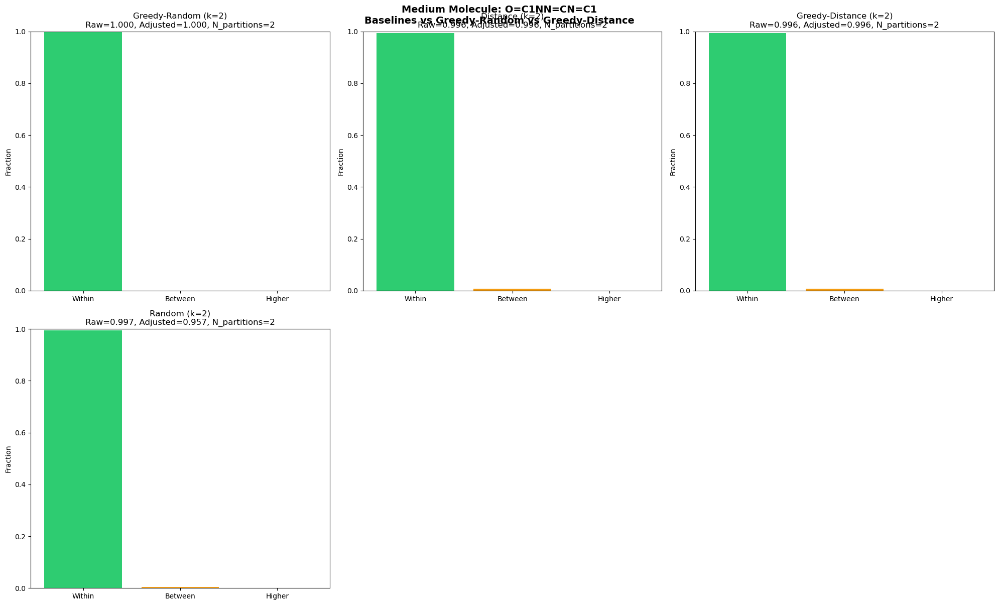


✓ Partition compariso displayed

ANALYZING Large MOLECULE: COC12CC1OC2CO

Comparing strategies for: COC12CC1OC2CO
  Testing k values: [2]
  Greedy iterations: 100
  Connectivity weight: 0.100
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
  Distance (k=2): raw=0.9905, penalty=0.0000, adjusted=0.9905
  Random (k=2): raw=0.9916, penalty=0.8947, adjusted=0.9022
  Greedy-Random (k=2): raw=0.9999, penalty=0.2105, adjusted=0.9789
  Greedy-Distance (k=2): raw=0.9948, penalty=0.0000, adjusted=0.9948

  Top strategies by adjusted score:
    🏆 Greedy-Distance (k=2)     raw=0.9948, penalty=0.0000, adjusted=0.9948
    2. Distance (k=2)            raw=0.9905, penalty=0.0000, adjusted=0.9905
    3. Greedy-Random (k=2)       raw=0.9999, penalty=0.2105, adjusted=0.9789
    4. Random (k=2)              raw=0.9916, penalty=0.8947, adjusted=0.9022

  Greedy strategy comparison:
    Best Greedy-Random:   k=2, adjusted=0.9789
    Best Greedy-Distance: k=2, adjusted=0.99

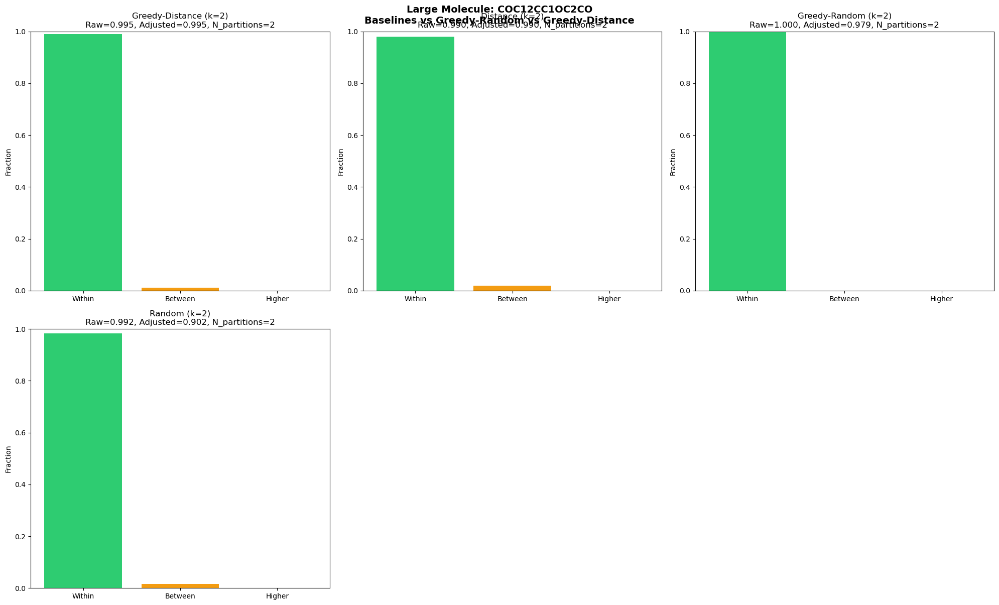


✓ Partition compariso displayed

════════════════════════════════════════════════════════════════════════════════
SUMMARY ACROSS ALL MOLECULES
════════════════════════════════════════════════════════════════════════════════

Molecule        Overall Winner  Best Raw Score  Best Adjusted Score  Connectivity Penalty
   Small        Distance (k=2)        0.998008             0.998008                   0.0
  Medium   Greedy-Random (k=2)        0.999883             0.999883                   0.0
   Large Greedy-Distance (k=2)        0.994836             0.994836                   0.0

────────────────────────────────────────────────────────────────────────────────
KEY FINDINGS:
────────────────────────────────────────────────────────────────────────────────

Wins by Method:
  Distance            : 1/3 molecules
  Greedy-Random       : 1/3 molecules
  Greedy-Distance     : 1/3 molecules

Average Adjusted Scores by Method:
  Distance            : 0.9950
  Random              : 0.9389
  Greedy

In [19]:
from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    visualize_partition_comparison
)

from typing import Dict
import matplotlib.pyplot as plt


def compare_with_greedy(
    mol,
    interpreter,
    smiles="",
    k_values=(2, 3, 4),
    greedy_iters=100,
    connectivity_weight=0.10,
    disconnected_singleton_weight=2.0,
    verbose=True
):
    """
    Compare baseline and optimized partition methods using both:

    1. Raw graphlet interpretability score
    2. Connectivity-adjusted score

    adjusted_score =
        raw_score
        - connectivity_weight * connectivity_penalty
    """
    
    if verbose and smiles:
        print(f"\nComparing strategies for: {smiles}")
        print(f"  Testing k values: {list(k_values)}")
        print(f"  Greedy iterations: {greedy_iters}")
        print(
            f"  Connectivity weight: "
            f"{connectivity_weight:.3f}"
        )

    results = []

    def store_result(
        strategy,
        method,
        k,
        interpretation
    ):
        """Compute and store all metrics for one partition result."""

        partition = interpretation.partition
        breakdown = interpretation.get_contribution_breakdown()

        connectivity_penalty = partition_connectivity_penalty(
            mol=mol,
            partition=partition,
            disconnected_singleton_weight=(
                disconnected_singleton_weight
            )
        )

        adjusted_score = connectivity_adjusted_score(
            mol=mol,
            interpretation=interpretation,
            connectivity_weight=connectivity_weight,
            disconnected_singleton_weight=(
                disconnected_singleton_weight
            )
        )
        result = {
            "Strategy": strategy,
            "Method": method,
            "k": k,
            "N_partitions": len(
                set(partition.values())
            ),

            # Original graphlet score
            "Score": interpretation.score,

            # Connectivity terms
            "Connectivity Penalty": connectivity_penalty,
            "Adjusted Score": adjusted_score,

            "Within %": 100 * breakdown["within_frac"],
            "Between %": 100 * breakdown["between_frac"],
            "Higher %": 100 * breakdown["higher_frac"],
            "Interpretation": interpretation
        }

        results.append(result)

        if verbose:
            print(
                f"  {strategy}: "
                f"raw={interpretation.score:.4f}, "
                f"penalty={connectivity_penalty:.4f}, "
                f"adjusted={adjusted_score:.4f}"
            )

    
    # =========================================================================
    # 1. DISTANCE BASELINE
    # =========================================================================

    for k in k_values:
        partition = ChemicalPartitioner.distance_partition(
            mol,
            n_clusters=k,
            seed=42
        )

        interpretation = (
            interpreter.compute_partition_contributions(
                mol,
                partition
            )
        )

        store_result(
            strategy=f"Distance (k={k})",
            method="Distance",
            k=k,
            interpretation=interpretation
        )

    # =========================================================================
    # 2. RANDOM BASELINE
    # =========================================================================

    for k in k_values:
        partition = ChemicalPartitioner.random_partition(
            mol,
            n_clusters=k,
            seed=42
        )

        interpretation = (
            interpreter.compute_partition_contributions(
                mol,
                partition
            )
        )

        store_result(
            strategy=f"Random (k={k})",
            method="Random",
            k=k,
            interpretation=interpretation
        )

    # =========================================================================
    # 3. GREEDY-RANDOM
    # =========================================================================

    for k in k_values:
        optimizer_k = PartitionOptimizer(
            interpreter=interpreter,
            min_partitions=k,
            max_partitions=k,
            connectivity_weight=connectivity_weight,
            disconnected_singleton_weight=(
                disconnected_singleton_weight
            )
        )

        best_interpretation = (
            optimizer_k.optimize_partition_random(
                mol=mol,
                n_iterations=greedy_iters,
                seed=42,
                verbose=False
            )
        )

        store_result(
            strategy=f"Greedy-Random (k={k})",
            method="Greedy-Random",
            k=k,
            interpretation=best_interpretation
        )

    # =========================================================================
    # 4. GREEDY-DISTANCE
    # =========================================================================

    for k in k_values:
        optimizer_k = PartitionOptimizer(
            interpreter=interpreter,
            min_partitions=k,
            max_partitions=k,
            connectivity_weight=connectivity_weight,
            disconnected_singleton_weight=(
                disconnected_singleton_weight
            )
        )

        best_interpretation = (
            optimizer_k.optimize_partition_distance(
                mol=mol,
                n_clusters=k,
                n_iterations=greedy_iters,
                seed=42,
                verbose=False
            )
        )

        store_result(
            strategy=f"Greedy-Distance (k={k})",
            method="Greedy-Distance",
            k=k,
            interpretation=best_interpretation
        )

    # =========================================================================
    # SORT BY CONNECTIVITY-ADJUSTED SCORE
    # =========================================================================

    results.sort(
        key=lambda result: result["Adjusted Score"],
        reverse=True
    )

    if verbose:
        print("\n  Top strategies by adjusted score:")

        for rank, result in enumerate(
            results[:5],
            start=1
        ):
            marker = "🏆" if rank == 1 else f"{rank}."

            print(
                f"    {marker} "
                f"{result['Strategy']:25s} "
                f"raw={result['Score']:.4f}, "
                f"penalty="
                f"{result['Connectivity Penalty']:.4f}, "
                f"adjusted="
                f"{result['Adjusted Score']:.4f}"
            )

        greedy_random_results = [
            result
            for result in results
            if result["Method"] == "Greedy-Random"
        ]

        greedy_distance_results = [
            result
            for result in results
            if result["Method"] == "Greedy-Distance"
        ]

        if (
            greedy_random_results
            and greedy_distance_results
        ):
            best_greedy_random = max(
                greedy_random_results,
                key=lambda result:
                result["Adjusted Score"]
            )

            best_greedy_distance = max(
                greedy_distance_results,
                key=lambda result:
                result["Adjusted Score"]
            )

            print("\n  Greedy strategy comparison:")

            print(
                "    Best Greedy-Random:   "
                f"k={best_greedy_random['k']}, "
                f"adjusted="
                f"{best_greedy_random['Adjusted Score']:.4f}"
            )

            print(
                "    Best Greedy-Distance: "
                f"k={best_greedy_distance['k']}, "
                f"adjusted="
                f"{best_greedy_distance['Adjusted Score']:.4f}"
            )

    return results

def optimize_partition_random_wrapper(
    optimizer,
    mol,
    n_clusters: int,
    n_iterations: int = 100,
    seed: int = 42,
    verbose: bool = False,
) -> Dict[int, int]:
    """
    Run random-start greedy optimization with exactly n_clusters.
    """
    temp_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight,
        disconnected_singleton_weight=optimizer.disconnected_singleton_weight
    )

    best_interp = temp_optimizer.optimize_partition_random(
        mol=mol,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose,
    )

    return best_interp.partition


def optimize_partition_distance_wrapper(
    optimizer,
    mol,
    n_clusters: int,
    n_iterations: int = 100,
    seed: int = 42,
    verbose: bool = False,
) -> Dict[int, int]:
    """
    Run distance-start greedy optimization with exactly n_clusters.
    """
    temp_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight,
        disconnected_singleton_weight=optimizer.disconnected_singleton_weight
    )

    best_interp = temp_optimizer.optimize_partition_distance(
        mol=mol,
        n_clusters=n_clusters,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose,
    )

    return best_interp.partition

# ═══════════════════════════════════════════════════════════════════════════
# MAIN LOOP
# ═══════════════════════════════════════════════════════════════════════════

all_results = {}

# Define k values to test 
k_values = [2]  

print(f"\n{'═'*80}")
print(f"PARTITION COMPARISON: BASELINES vs GREEDY VARIANTS")
print(f"{'═'*80}")
print(f"\nStrategies tested:")
print(f"  1. Distance baseline (graph distance clustering)")
print(f"  2. Random baseline (random assignment)")
print(f"  3. Greedy-Random (random init + greedy optimization)")
print(f"  4. Greedy-Distance (distance init + greedy optimization)")
print(f"  'greedy algorithms that evolve a random starting partition'")
print(f"  'seeking a partition into regions with minimal interactions'")
print(f"{'═'*80}\n")

for mol, smiles, size_label in selected_mols:
    print(f"\n{'=' * 80}")
    print(f"ANALYZING {size_label} MOLECULE: {smiles}")
    print(f"{'=' * 80}")
    
    # All strategies (Distance, Random, Greedy-Random, Greedy-Distance) use k_values consistently
    results = compare_with_greedy(
        mol=mol,
        interpreter=interpreter,
        smiles=smiles,
        k_values=k_values,
        greedy_iters=100,
        connectivity_weight=0.10,
        disconnected_singleton_weight=2.0,
        verbose=True
    )
    
    all_results[size_label] = results
    
    # Visualize comparison (now includes both greedy strategies)
    fig = visualize_partition_comparison(mol, results, figsize=(20, 12))
    plt.suptitle(f'{size_label} Molecule: {smiles}\n'
                 f'Baselines vs Greedy-Random vs Greedy-Distance', 
                 fontsize=14, fontweight='bold', y=1.00)
    # plt.savefig(f'partition_comparison_{size_label.lower()}_both_greedy.png', 
    #             dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"\n✓ Partition compariso displayed")


# ═══════════════════════════════════════════════════════════════════════════
# SUMMARY ACROSS ALL MOLECULES
# ═══════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*80}")
print(f"SUMMARY ACROSS ALL MOLECULES")
print(f"{'═'*80}\n")

summary_table = []
for size_label, results in all_results.items():
    best_result = results[0]  # Already sorted by score
    
    # Find best of each type
    best_distance = max([r for r in results if r['Method'] == 'Distance'], 
                        key=lambda x: x['Adjusted Score'])
    best_random = max([r for r in results if r['Method'] == 'Random'], 
                      key=lambda x: x['Adjusted Score'])
    best_greedy_random = max([r for r in results if r['Method'] == 'Greedy-Random'], 
                             key=lambda x: x['Adjusted Score'])
    best_greedy_distance = max([r for r in results if r['Method'] == 'Greedy-Distance'], 
                               key=lambda x: x['Adjusted Score'])
    
    summary_table.append({
        "Molecule": size_label,
        "Overall Winner": best_result["Strategy"],
        "Best Raw Score": best_result["Score"],
        "Best Adjusted Score": best_result["Adjusted Score"],
        "Connectivity Penalty": (
            best_result["Connectivity Penalty"]
        )
    })

import pandas as pd
summary_df = pd.DataFrame(summary_table)
print(summary_df.to_string(index=False))

print(f"\n{'─'*80}")
print(f"KEY FINDINGS:")
print(f"{'─'*80}")

# Count wins by method
winners = [results[0]['Method'] for results in all_results.values()]
from collections import Counter
win_counts = Counter(winners)

print(f"\nWins by Method:")
for method, count in win_counts.most_common():
    print(f"  {method:20s}: {count}/{len(all_results)} molecules")

# Average improvement
print(f"\nAverage Adjusted Scores by Method:")
method_scores = {'Distance': [], 'Random': [], 'Greedy-Random': [], 'Greedy-Distance': []}
for results in all_results.values():
    for result in results:
        method_scores[result['Method']].append(result['Adjusted Score'])

for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance']:
    scores = method_scores[method]
    if scores:
        mean_score = sum(scores) / len(scores)
        print(f"  {method:20s}: {mean_score:.4f}")

print(f"\n{'═'*80}\n")


Saved score-distribution plot to 'large_molecule_greedy_distance_100_initializations_score_distributions.png'


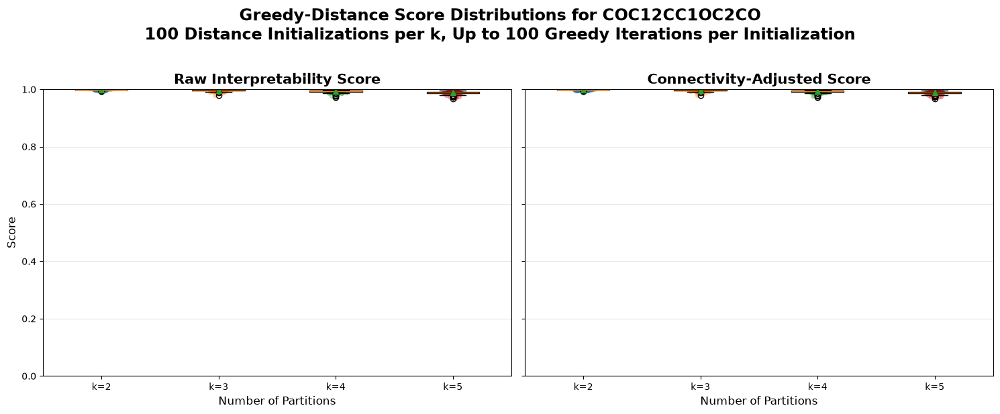

Saved score-versus-k plot to 'large_molecule_greedy_distance_100_initializations_score_vs_k.png'


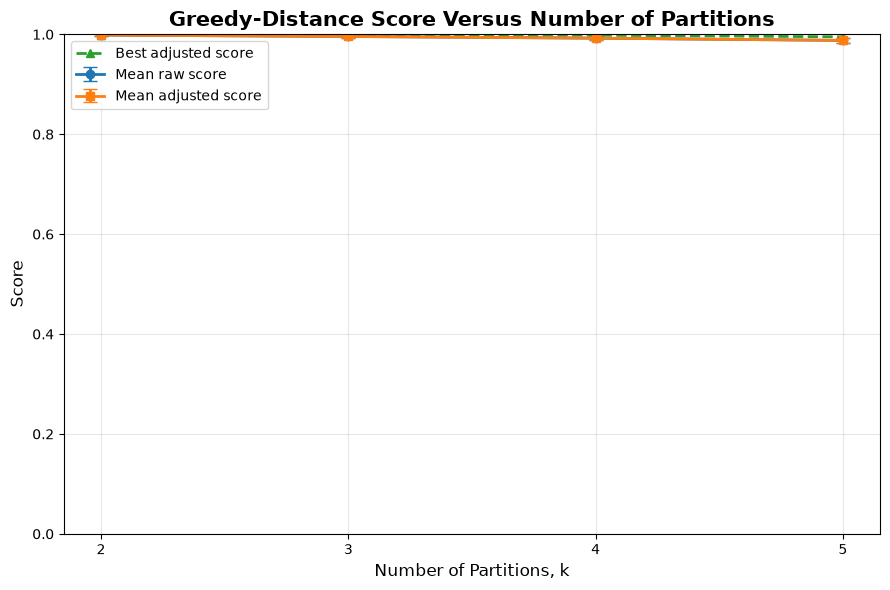


BEST GREEDY-DISTANCE RESULT FOR EACH k

k=2
  Best initialization: 6
  Seed: 20047
  Raw score: 0.999655
  Connectivity penalty: 0.000000
  Adjusted score: 0.999655
  Within fraction: 0.999310
  Between fraction: 0.000690
  Higher fraction: 0.000000
  Cross-partition bonds: [19]
  Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 1}

k=3
  Best initialization: 31
  Seed: 30072
  Raw score: 0.999238
  Connectivity penalty: 0.000000
  Adjusted score: 0.999238
  Within fraction: 0.998476
  Between fraction: 0.001524
  Higher fraction: 0.000000
  Cross-partition bonds: [0, 19]
  Partition: {0: 2, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 2, 10: 2, 11: 2, 12: 1, 13: 1, 14: 1, 15: 1, 16: 1, 17: 1, 18: 0}

k=4
  Best initialization: 26
  Seed: 40067
  Raw score: 0.998260
  Connectivity penalty: 0.000000
  Adjusted score: 0.998260
  Within fraction: 0.997240
  Between fraction: 0.002040
  Higher fractio

In [ ]:
# =============================================================================
# PLOT RAW AND ADJUSTED SCORE DISTRIBUTIONS
# =============================================================================

raw_scores_by_k = [
    greedy_distance_score_df.loc[
        greedy_distance_score_df["k"] == k,
        "Raw Score"
    ].to_numpy()
    for k in K_VALUES
]

adjusted_scores_by_k = [
    greedy_distance_score_df.loc[
        greedy_distance_score_df["k"] == k,
        "Adjusted Score"
    ].to_numpy()
    for k in K_VALUES
]

fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15, 6),
    sharey=True,
)


# -----------------------------------------------------------------------------
# Raw score distributions
# -----------------------------------------------------------------------------

axes[0].boxplot(
    raw_scores_by_k,
    tick_labels=[f"k={k}" for k in K_VALUES],
    showmeans=True,
    meanline=False,
    patch_artist=True,
)

axes[0].set_title(
    "Raw Interpretability Score",
    fontsize=15,
    fontweight="bold",
)

axes[0].set_xlabel(
    "Number of Partitions",
    fontsize=12,
)

axes[0].set_ylabel(
    "Score",
    fontsize=12,
)

axes[0].set_ylim(0.0, 1.0)
axes[0].grid(axis="y", alpha=0.3)


# Add individual initialization scores with horizontal jitter.
jitter_rng = np.random.default_rng(BASE_SEED)

for position, scores in enumerate(
    raw_scores_by_k,
    start=1,
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[0].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18,
    )


# -----------------------------------------------------------------------------
# Adjusted score distributions
# -----------------------------------------------------------------------------

axes[1].boxplot(
    adjusted_scores_by_k,
    tick_labels=[f"k={k}" for k in K_VALUES],
    showmeans=True,
    meanline=False,
    patch_artist=True,
)

axes[1].set_title(
    "Connectivity-Adjusted Score",
    fontsize=15,
    fontweight="bold",
)

axes[1].set_xlabel(
    "Number of Partitions",
    fontsize=12,
)

axes[1].set_ylim(0.0, 1.0)
axes[1].grid(axis="y", alpha=0.3)

for position, scores in enumerate(
    adjusted_scores_by_k,
    start=1,
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[1].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18,
    )

fig.suptitle(
    f"Greedy-Distance Score Distributions for {large_smiles}\n"
    f"{N_INITIALIZATIONS} Distance Initializations per k, "
    f"Up to {GREEDY_ITERATIONS} Greedy Iterations per Initialization",
    fontsize=17,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()

score_distribution_filename = (
    "large_molecule_greedy_distance_"
    "100_initializations_score_distributions.png"
)

plt.savefig(
    score_distribution_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved score-distribution plot to "
    f"'{score_distribution_filename}'"
)

plt.show()


# =============================================================================
# PLOT MEAN SCORE VERSUS k
# =============================================================================

raw_mean = (
    greedy_distance_score_df
    .groupby("k")["Raw Score"]
    .mean()
    .reindex(K_VALUES)
)

raw_std = (
    greedy_distance_score_df
    .groupby("k")["Raw Score"]
    .std()
    .reindex(K_VALUES)
)

adjusted_mean = (
    greedy_distance_score_df
    .groupby("k")["Adjusted Score"]
    .mean()
    .reindex(K_VALUES)
)

adjusted_std = (
    greedy_distance_score_df
    .groupby("k")["Adjusted Score"]
    .std()
    .reindex(K_VALUES)
)

k_array = np.asarray(K_VALUES)

fig, ax = plt.subplots(
    figsize=(9, 6)
)

ax.errorbar(
    k_array,
    raw_mean.to_numpy(),
    yerr=raw_std.to_numpy(),
    marker="o",
    linewidth=2,
    capsize=5,
    label="Mean raw score",
)

ax.errorbar(
    k_array,
    adjusted_mean.to_numpy(),
    yerr=adjusted_std.to_numpy(),
    marker="s",
    linewidth=2,
    capsize=5,
    label="Mean adjusted score",
)

# Best adjusted score found among the 100 initializations.
best_adjusted_scores = np.asarray([
    best_interpretations[k]["Adjusted Score"]
    for k in K_VALUES
])

ax.plot(
    k_array,
    best_adjusted_scores,
    marker="^",
    linestyle="--",
    linewidth=2,
    label="Best adjusted score",
)

ax.set_title(
    "Greedy-Distance Score Versus Number of Partitions",
    fontsize=15,
    fontweight="bold",
)

ax.set_xlabel(
    "Number of Partitions, k",
    fontsize=12,
)

ax.set_ylabel(
    "Score",
    fontsize=12,
)

ax.set_xticks(K_VALUES)
ax.set_ylim(0.0, 1.0)
ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()

score_vs_k_filename = (
    "large_molecule_greedy_distance_"
    "100_initializations_score_vs_k.png"
)

plt.savefig(
    score_vs_k_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"Saved score-versus-k plot to "
    f"'{score_vs_k_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FOR EACH k
# =============================================================================

print("\n" + "=" * 80)
print("BEST GREEDY-DISTANCE RESULT FOR EACH k")
print("=" * 80)

for k in K_VALUES:
    result = best_interpretations[k]

    print(f"\nk={k}")

    print(
        f"  Best initialization: "
        f"{result['Initialization']}"
    )

    print(
        f"  Seed: "
        f"{result['Seed']}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Within fraction: "
        f"{result['Within Fraction']:.6f}"
    )

    print(
        f"  Between fraction: "
        f"{result['Between Fraction']:.6f}"
    )

    print(
        f"  Higher fraction: "
        f"{result['Higher Fraction']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    print(
        f"  Partition: "
        f"{result['Partition']}"
    )


Small MOLECULE: FC(F)(F)F

Found 4 methods with exactly k=2 partitions


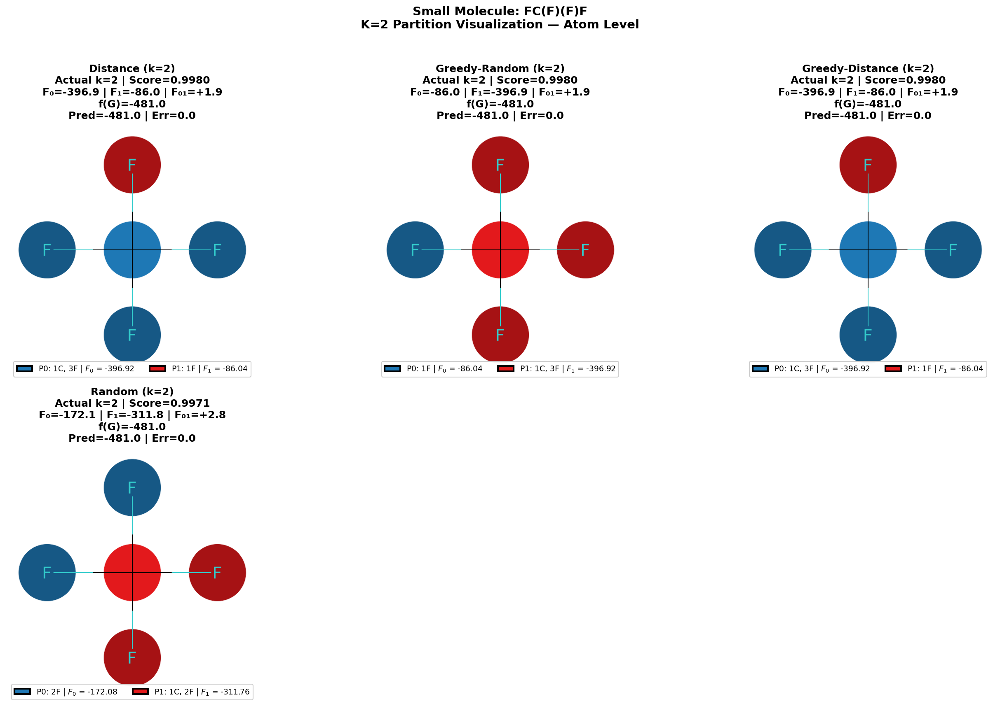

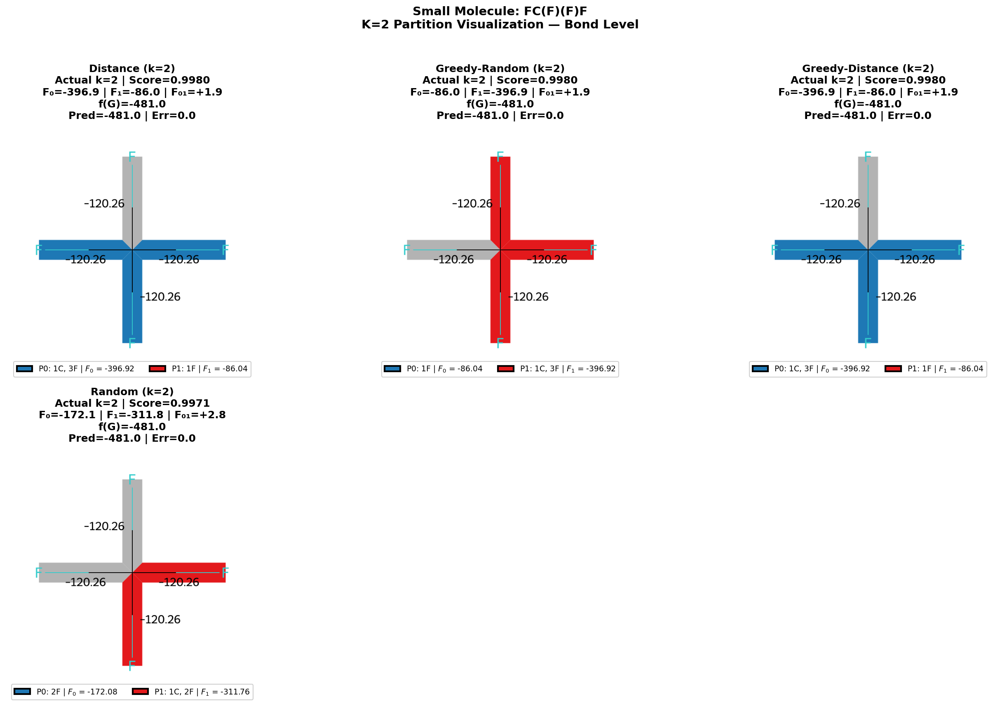


Partition details:

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[2], symbols=['F'], F_0=-86.039
  P1: atoms=[0, 1, 3, 4], symbols=['F', 'C', 'F', 'F'], F_1=-396.921
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[2, 3], symbols=['F', 'F'], F_0=-172.079
  P1: atoms=[0, 1, 4], symbols=['F', 'C', 'F'], F_1=-311.755
  Pair terms:
    F_(0, 1) = +2.806

Medium MOLECULE: O=C1NN=CN=C1

Found 4 methods with exactly k=2 partitions


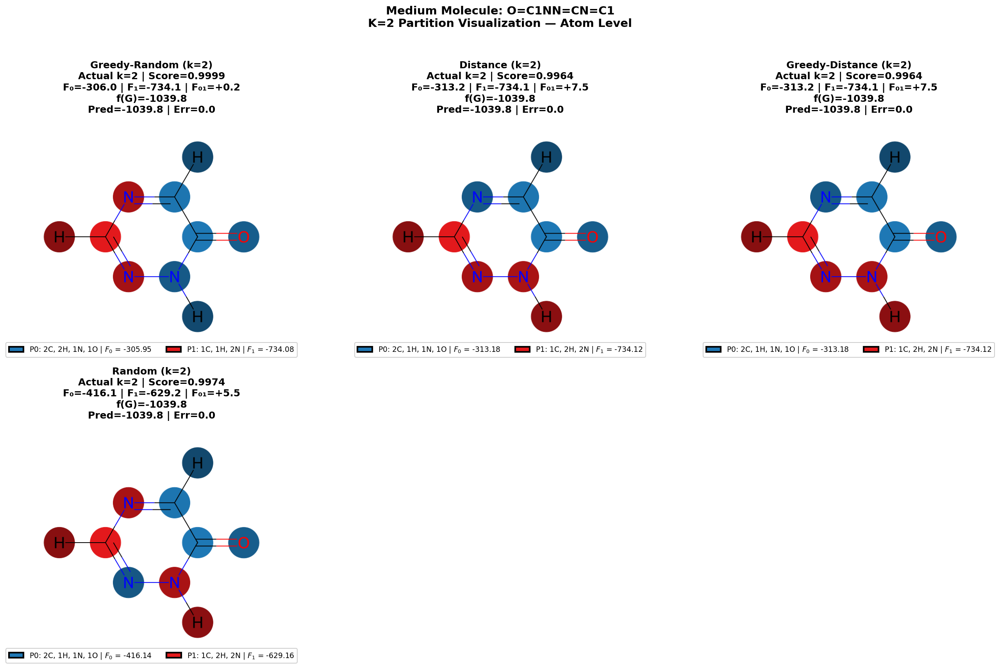

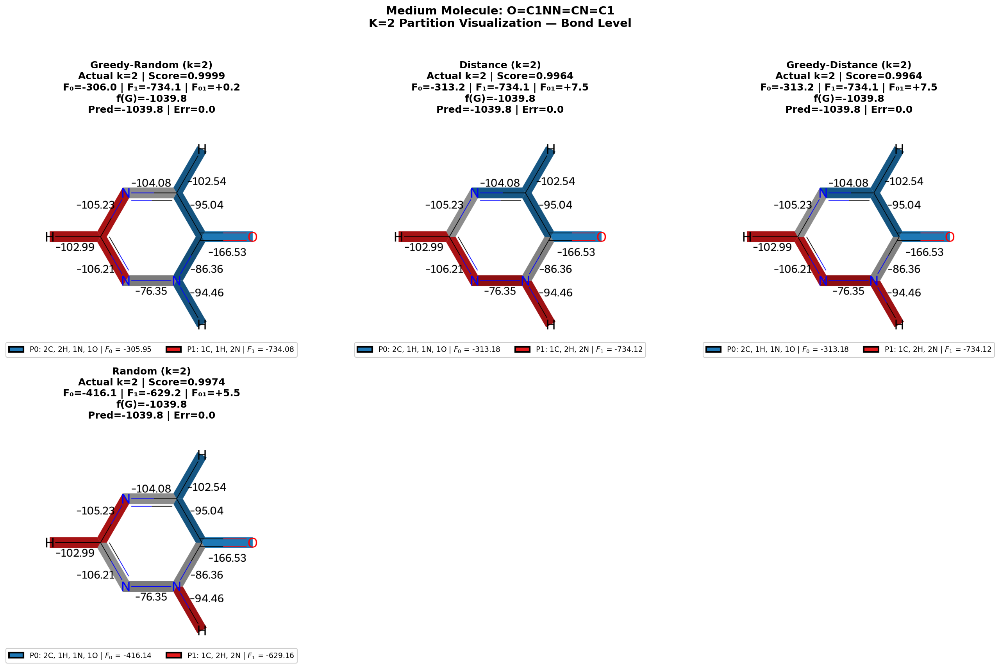


Partition details:

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 6, 7, 9], symbols=['O', 'C', 'N', 'C', 'H', 'H'], F_0=-305.954
  P1: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_1=-734.081
  Pair terms:
    F_(0, 1) = +0.244

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 3, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-416.144
  P1: atoms=[2, 4, 5, 7, 8], symbols=['N', 'C', 'N', 'H', 'H'], F_1=-629.155
  Pair terms:
    F_(0, 1) = +5.509

Large MOLECULE: COC12CC1OC2CO

Found 4 me

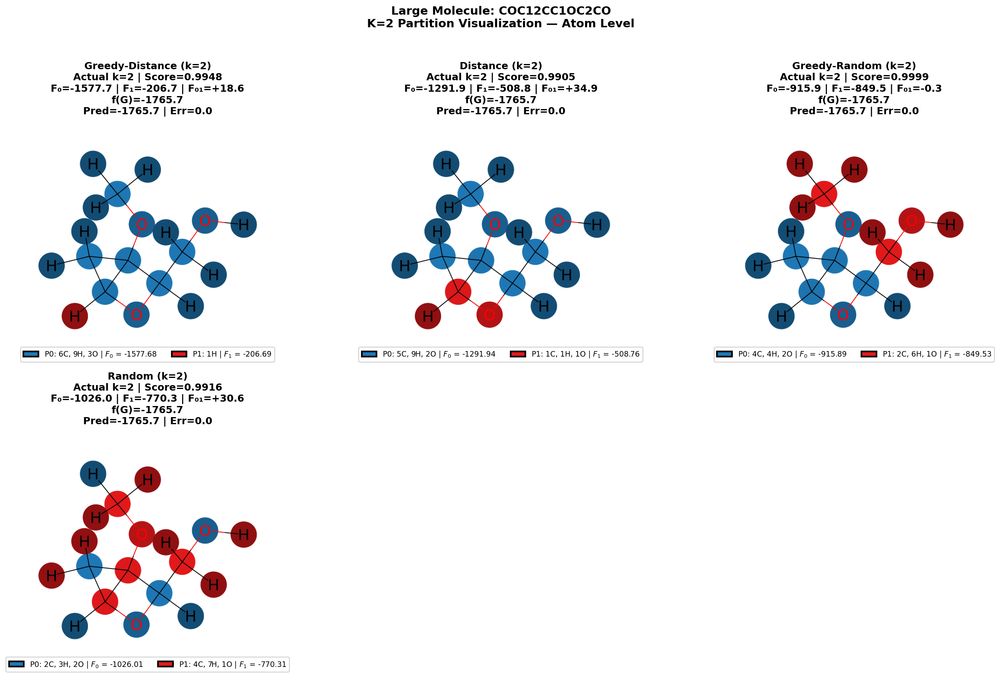

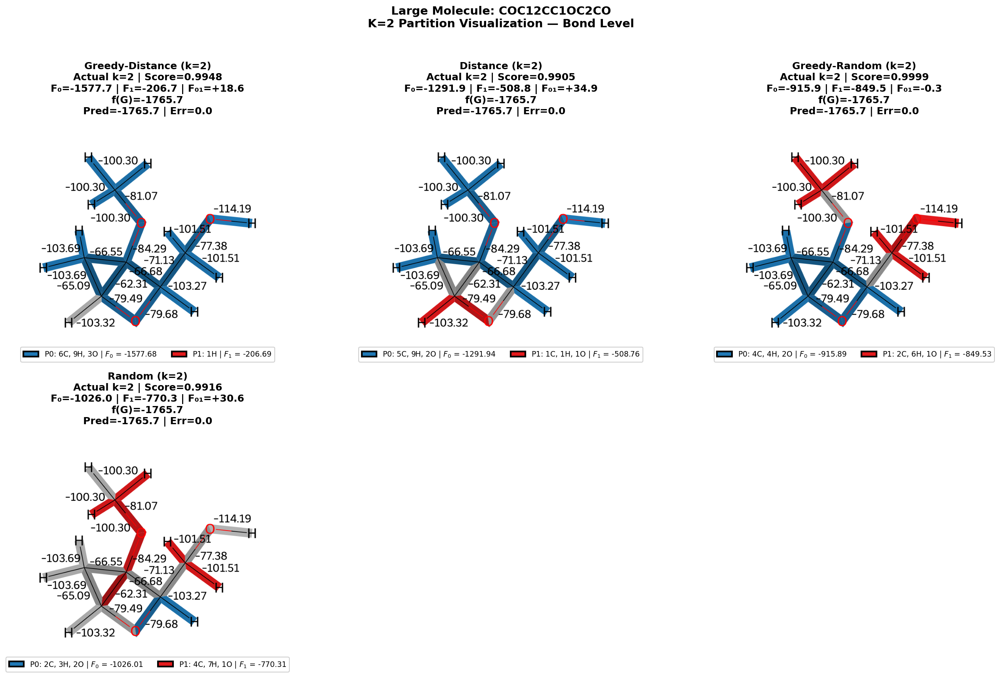


Partition details:

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1577.679
  P1: atoms=[14], symbols=['H'], F_1=-206.693
  Pair terms:
    F_(0, 1) = +18.623

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1291.937
  P1: atoms=[4, 5, 14], symbols=['C', 'O', 'H'], F_1=-508.761
  Pair terms:
    F_(0, 1) = +34.950

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[1, 2, 3, 4, 5, 6, 12, 13, 14, 15], symbols=['O', 'C', 'C', 'C', 'O', 'C', 'H', 'H', 'H', 'H'], F_0=-915.895
  P1: atoms=[0, 7, 8, 9, 10, 11, 16, 17, 18], symbols=['C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-849.529
  Pair terms:
    F_(0, 1) = -0.325

Random (k=2)
Actual part

In [20]:

from partition_visualization import draw_projected_coefs_with_partitions

# ═══════════════════════════════════════════════════════════════════════════
# GENERAL K-PARTITION VISUALIZATION
# ═══════════════════════════════════════════════════════════════════════════

K_TO_PLOT = 2

for mol, smiles, size_label in selected_mols:
    print(f"\n{'=' * 80}")
    print(f"{size_label} MOLECULE: {smiles}")
    print(f"{'=' * 80}")

    results = all_results[size_label]

    # Keep only results that actually have K_TO_PLOT partitions
    selected_results = [
        r for r in results
        if r["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(f"⚠️ No results found with exactly k={K_TO_PLOT} partitions")
        continue

    selected_results.sort(
        key=lambda x: x["Adjusted Score"],
        reverse=True
    )
    selected_results = selected_results[:6]

    print(f"\nFound {len(selected_results)} methods with exactly k={K_TO_PLOT} partitions")

    dags = []
    partitions = []
    within_contribs = []
    titles = []

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(set(partition.values()))

        dag = GraphletDAG(
            mol,
            fingerprinter=featurizer.fingerprinter,
            bit_ids=featurizer.bit_ids_,
            coef=interpreter.coefficients
        )

        dags.append(dag)
        partitions.append(partition)
        within_contribs.append(interp.within_partition)

        within_sum = sum(interp.within_partition.values())
        between_sum = sum(interp.between_partition.values())
        higher_sum = sum(interp.higher_order.values())
        f_G = within_sum + between_sum + higher_sum

        title = f"{result['Strategy']}\n"
        title += f"Actual k={len(partition_ids)} | Score={result['Score']:.4f}\n"
        F0 = interp.within_partition.get(0, 0.0)
        F1 = interp.within_partition.get(1, 0.0)
        F01 = sum(interp.between_partition.values())
        F_higher = sum(interp.higher_order.values())
        f_G = F0 + F1 + F01 + F_higher

        title += f"F₀={F0:+.1f} | F₁={F1:+.1f} | F₀₁={F01:+.1f}\n"
        title += f"f(G)={f_G:+.1f}"

        model_pred = interp.total_prediction

        title += (
            f"\nPred={model_pred:+.1f} | "
            f"Err={abs(f_G - model_pred):.1f}"
        )

        titles.append(title)

    # Atom-level visualization
    fig, axes = draw_projected_coefs_with_partitions(
        graphlet_dags=dags,
        partitions=partitions,
        within_partition_contribs=within_contribs,
        level=1,
        ncol=3,
        titles=titles,
        show_coefficients=True,
        show_bond_labels=False,
        cmap_name="distinct",
        figsize=(18, 6 * ((len(selected_results) + 2) // 3)),
        dpi=150,
        img_size=(600, 600),
        highlight_radius=0.5
    )

    plt.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — Atom Level",
        fontsize=14,
        fontweight="bold",
        y=0.98
    )

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig(
        f"k{K_TO_PLOT}_partition_viz_atom_{size_label.lower()}.png",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    # Bond-level visualization
    dags_bond = [
        GraphletDAG(
            mol,
            fingerprinter=featurizer.fingerprinter,
            bit_ids=featurizer.bit_ids_,
            coef=interpreter.coefficients
        )
        for _ in selected_results
    ]

    fig, axes = draw_projected_coefs_with_partitions(
        graphlet_dags=dags_bond,
        partitions=partitions,
        within_partition_contribs=within_contribs,
        level=2,
        ncol=3,
        titles=titles,
        show_coefficients=True,
        show_bond_labels=True,
        label_precision=2,
        cmap_name="distinct",
        figsize=(18, 6 * ((len(selected_results) + 2) // 3)),
        dpi=150,
        img_size=(700, 700),
        highlight_radius=0.5
    )

    plt.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — Bond Level",
        fontsize=14,
        fontweight="bold",
        y=0.98
    )

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig(
        f"k{K_TO_PLOT}_partition_viz_bond_{size_label.lower()}.png",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    print("\nPartition details:")
    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(set(partition.values()))

        print(f"\n{result['Strategy']}")
        print(f"Actual partitions: {partition_ids}")

        for p_id in partition_ids:
            atoms_in_p = [
                idx for idx, part in partition.items()
                if part == p_id
            ]
            symbols = [
                mol.GetAtomWithIdx(idx).GetSymbol()
                for idx in atoms_in_p
            ]

            print(
                f"  P{p_id}: atoms={atoms_in_p}, "
                f"symbols={symbols}, "
                f"F_{p_id}={interp.within_partition.get(p_id, 0.0):+.3f}"
            )

        if interp.between_partition:
            print("  Pair terms:")
            for pair, val in sorted(interp.between_partition.items()):
                print(f"    F_{pair} = {val:+.3f}")

        if interp.higher_order:
            print("  Higher-order terms:")
            for parts, val in sorted(interp.higher_order.items()):
                print(f"    F_{parts} = {val:+.3f}")


Small MOLECULE: FC(F)(F)F

Found 4 methods with exactly k=2 partitions


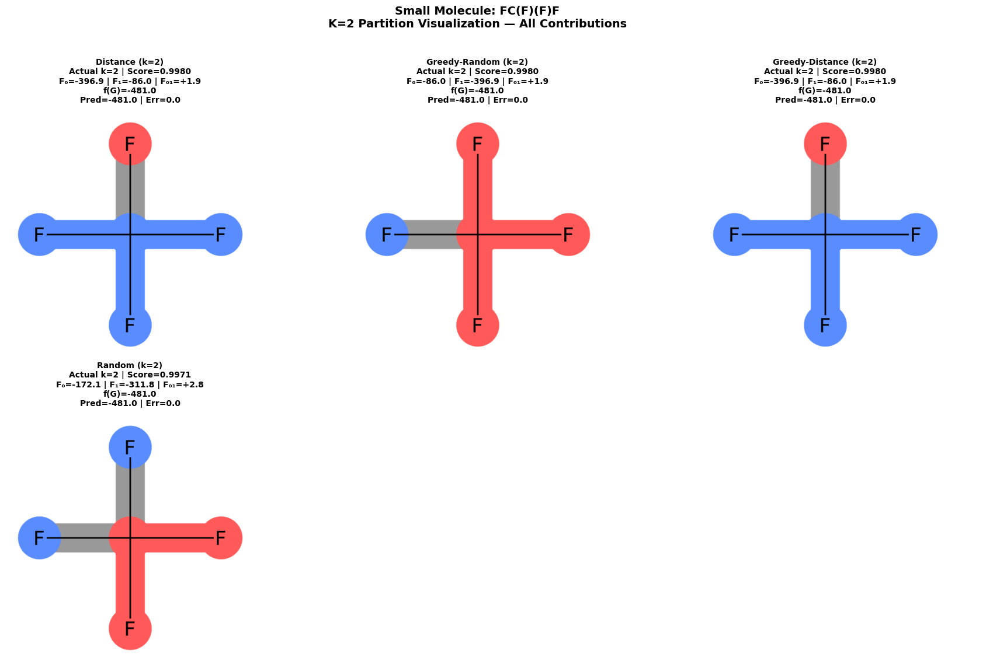


Partition details:

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[2], symbols=['F'], F_0=-86.039
  P1: atoms=[0, 1, 3, 4], symbols=['F', 'C', 'F', 'F'], F_1=-396.921
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[2, 3], symbols=['F', 'F'], F_0=-172.079
  P1: atoms=[0, 1, 4], symbols=['F', 'C', 'F'], F_1=-311.755
  Pair terms:
    F_(0, 1) = +2.806

Medium MOLECULE: O=C1NN=CN=C1

Found 4 methods with exactly k=2 partitions


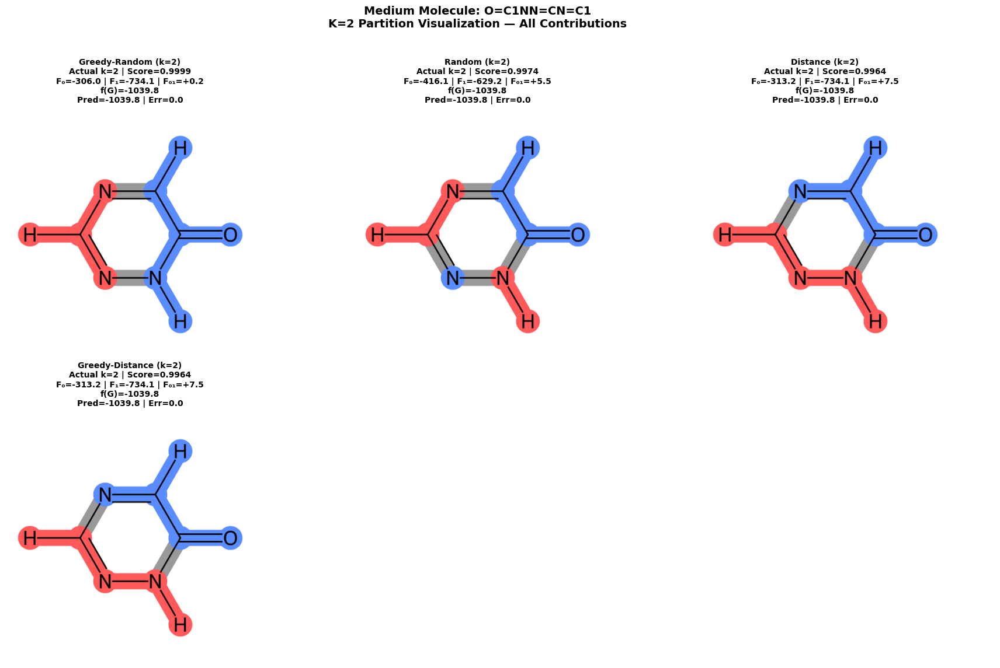


Partition details:

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 6, 7, 9], symbols=['O', 'C', 'N', 'C', 'H', 'H'], F_0=-305.954
  P1: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_1=-734.081
  Pair terms:
    F_(0, 1) = +0.244

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 3, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-416.144
  P1: atoms=[2, 4, 5, 7, 8], symbols=['N', 'C', 'N', 'H', 'H'], F_1=-629.155
  Pair terms:
    F_(0, 1) = +5.509

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Large MOLECULE: COC12CC1OC2CO

Found 4 me

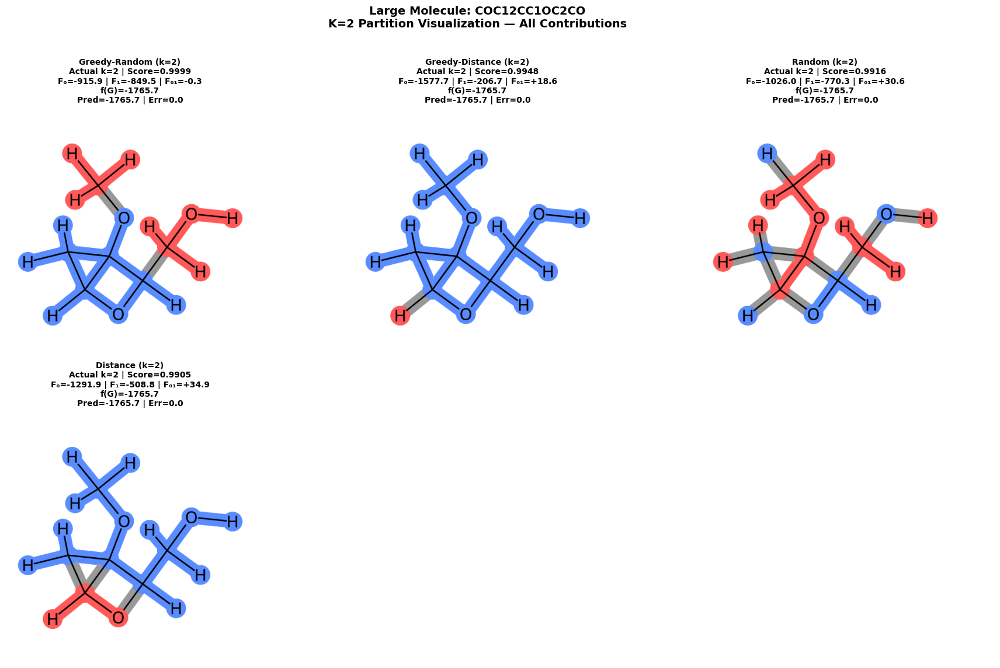


Partition details:

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[1, 2, 3, 4, 5, 6, 12, 13, 14, 15], symbols=['O', 'C', 'C', 'C', 'O', 'C', 'H', 'H', 'H', 'H'], F_0=-915.895
  P1: atoms=[0, 7, 8, 9, 10, 11, 16, 17, 18], symbols=['C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-849.529
  Pair terms:
    F_(0, 1) = -0.325

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1577.679
  P1: atoms=[14], symbols=['H'], F_1=-206.693
  Pair terms:
    F_(0, 1) = +18.623

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[3, 5, 6, 8, 9, 14, 15], symbols=['C', 'O', 'C', 'O', 'H', 'H', 'H'], F_0=-1026.014
  P1: atoms=[0, 1, 2, 4, 7, 10, 11, 12, 13, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-770.307
  Pair terms:
    F_(0, 1) = +30.572

Distance (k=2)
Actual part

In [21]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import io

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),
    1: (1.00, 0.35, 0.35),
    2: (0.35, 0.80, 0.45),
    3: (0.80, 0.55, 1.00),
}

def mol_to_partition_image(mol, partition, img_size=(500, 500)):
    drawer = rdMolDraw2D.MolDraw2DCairo(img_size[0], img_size[1])

    opts = drawer.drawOptions()
    opts.useBWAtomPalette()
    opts.fillHighlights = True
    opts.highlightRadius = 0.35
    opts.bondLineWidth = 3

    atoms_to_highlight = []
    atom_colors = {}

    for atom_idx, pid in partition.items():
        atom_idx = int(atom_idx)
        atoms_to_highlight.append(atom_idx)
        atom_colors[atom_idx] = PARTITION_COLORS.get(pid, (0.75, 0.75, 0.75))

    bonds_to_highlight = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        a1 = bond.GetBeginAtomIdx()
        a2 = bond.GetEndAtomIdx()

        p1 = partition.get(a1)
        p2 = partition.get(a2)

        bonds_to_highlight.append(bond_idx)

        if p1 == p2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(p1, (0.75, 0.75, 0.75))
        else:
            bond_colors[bond_idx] = (0.60, 0.60, 0.60)

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()
    return Image.open(io.BytesIO(drawer.GetDrawingText()))


def draw_rdkit_partition_grid(
    mol,
    partitions,
    titles,
    mols_per_row=3,
    img_size=(500, 500),
    title_fontsize=10,
    figsize=None
):
    n = len(partitions)
    n_rows = (n + mols_per_row - 1) // mols_per_row

    if figsize is None:
        figsize = (18, 6 * n_rows)

    fig, axes = plt.subplots(
        n_rows,
        mols_per_row,
        figsize=figsize
    )

    axes = np.array(axes).reshape(-1)

    for ax, partition, title in zip(axes, partitions, titles):
        img = mol_to_partition_image(
            mol,
            partition,
            img_size=img_size
        )

        ax.imshow(img)
        ax.axis("off")
        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight="bold",
            pad=10
        )

    for ax in axes[n:]:
        ax.axis("off")

    return fig


K_TO_PLOT = 2

for mol, smiles, size_label in selected_mols:
    print(f"\n{'=' * 80}")
    print(f"{size_label} MOLECULE: {smiles}")
    print(f"{'=' * 80}")

    results = all_results[size_label]

    selected_results = [
        r for r in results
        if r["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(f"⚠️ No results found with exactly k={K_TO_PLOT} partitions")
        continue

    selected_results.sort(key=lambda x: x["Score"], reverse=True)
    selected_results = selected_results[:6]

    print(
        f"\nFound {len(selected_results)} methods "
        f"with exactly k={K_TO_PLOT} partitions"
    )

    partitions = []
    titles = []

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(set(partition.values()))

        partitions.append(partition)

        F0 = interp.within_partition.get(0, 0.0)
        F1 = interp.within_partition.get(1, 0.0)
        F01 = sum(interp.between_partition.values())
        F_higher = sum(interp.higher_order.values())
        f_G = F0 + F1 + F01 + F_higher

        title = f"{result['Strategy']}\n"
        title += f"Actual k={len(partition_ids)} | Score={result['Score']:.4f}\n"
        title += f"F₀={F0:+.1f} | F₁={F1:+.1f} | F₀₁={F01:+.1f}\n"
        title += f"f(G)={f_G:+.1f}"

        model_pred = interp.total_prediction

        title += (
            f"\nPred={model_pred:+.1f} | "
            f"Err={abs(f_G - model_pred):.1f}"
        )

        titles.append(title)

    fig = draw_rdkit_partition_grid(
        mol,
        partitions,
        titles,
        mols_per_row=3,
        img_size=(500, 500),
        title_fontsize=10,
        figsize=(18, 6 * ((len(selected_results) + 2) // 3))
    )

    plt.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — All Contributions",
        fontsize=14,
        fontweight="bold",
        y=0.98
    )

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])

    plt.savefig(
        f"k{K_TO_PLOT}_partition_viz_rdkit_{size_label.lower()}.png",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    print("\nPartition details:")

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(set(partition.values()))

        print(f"\n{result['Strategy']}")
        print(f"Actual partitions: {partition_ids}")

        for p_id in partition_ids:
            atoms_in_p = [
                idx for idx, part in partition.items()
                if part == p_id
            ]

            symbols = [
                mol.GetAtomWithIdx(idx).GetSymbol()
                for idx in atoms_in_p
            ]

            print(
                f"  P{p_id}: atoms={atoms_in_p}, "
                f"symbols={symbols}, "
                f"F_{p_id}={interp.within_partition.get(p_id, 0.0):+.3f}"
            )

        if interp.between_partition:
            print("  Pair terms:")
            for pair, val in sorted(interp.between_partition.items()):
                print(f"    F_{pair} = {val:+.3f}")

        if interp.higher_order:
            print("  Higher-order terms:")
            for parts, val in sorted(interp.higher_order.items()):
                print(f"    F_{parts} = {val:+.3f}")


Small MOLECULE: FC(F)(F)F

Running Metropolis-Hastings with k=2, beta=20.0, iterations=5000
Metropolis-Hastings result: k=2, raw=0.9980, penalty=0.0000, adjusted=0.9980

Plotting 5 methods with exactly k=2 partitions
  Distance (k=2): raw=0.9980, penalty=0.0000, adjusted=0.9980
  Greedy-Random (k=2): raw=0.9980, penalty=0.0000, adjusted=0.9980
  Greedy-Distance (k=2): raw=0.9980, penalty=0.0000, adjusted=0.9980
  Metropolis-Hastings: raw=0.9980, penalty=0.0000, adjusted=0.9980
  Random (k=2): raw=0.9971, penalty=0.4000, adjusted=0.9571


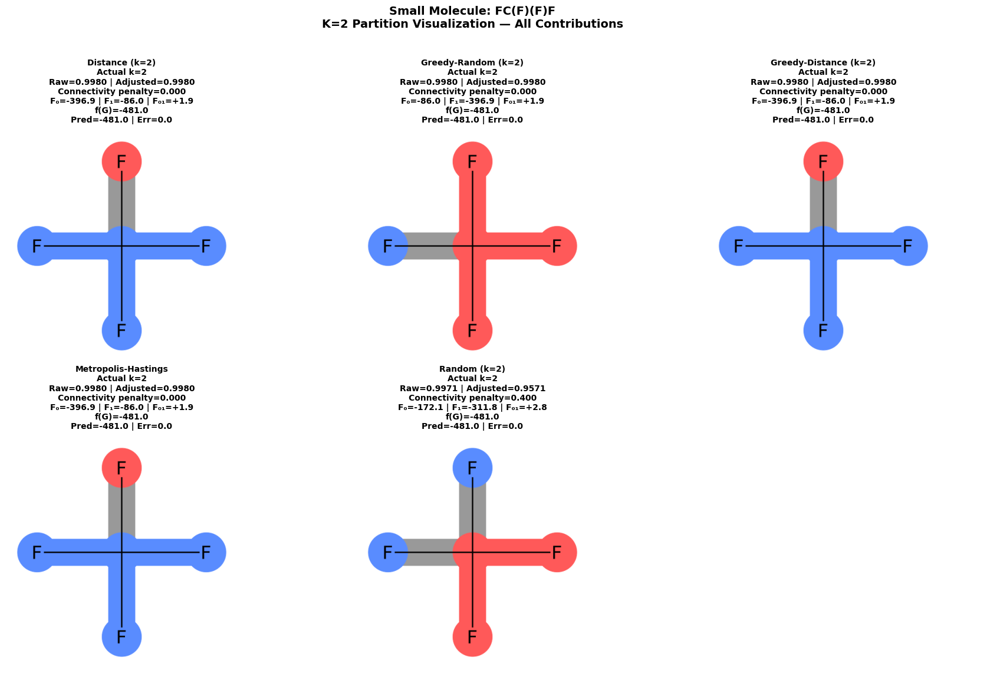


Partition details:

Distance (k=2)
Score: 0.998008
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Random (k=2)
Score: 0.998008
Actual partitions: [0, 1]
  P0: atoms=[2], symbols=['F'], F_0=-86.039
  P1: atoms=[0, 1, 3, 4], symbols=['F', 'C', 'F', 'F'], F_1=-396.921
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Distance (k=2)
Score: 0.998008
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Metropolis-Hastings
Score: 0.998008
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Random (k=2)
Score: 0.997117
Actual partitions: [0, 1]
  P0: atoms=[2, 3], symbols=['F', 'F'], F_0=-172.079
  P1: atoms=[0, 1, 4], sym

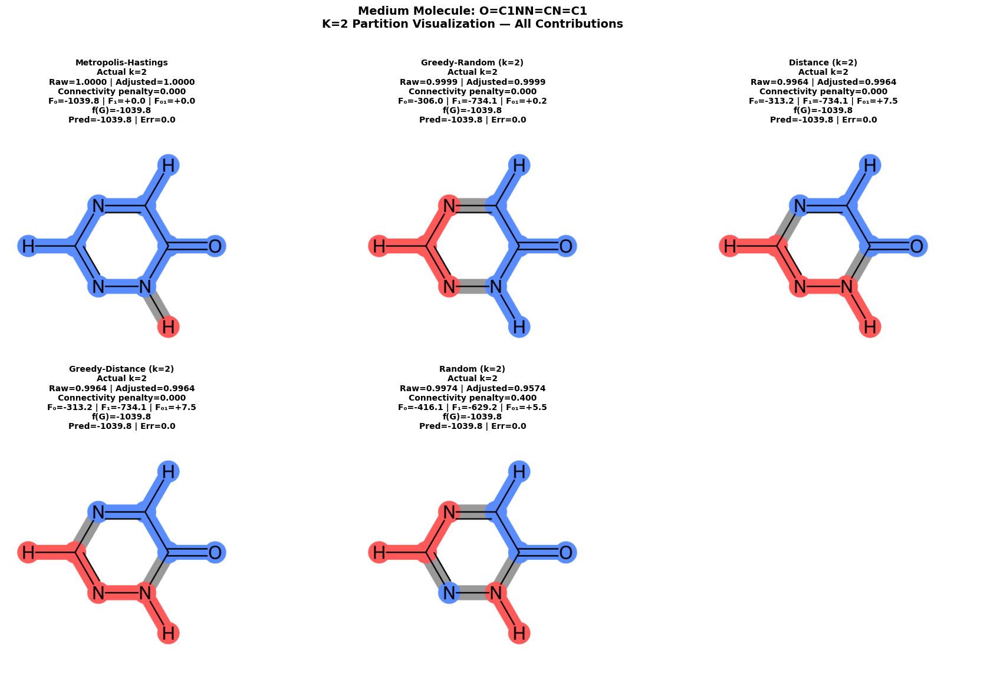


Partition details:

Metropolis-Hastings
Score: 1.000000
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 8, 9], symbols=['O', 'C', 'N', 'N', 'C', 'N', 'C', 'H', 'H'], F_0=-1039.791
  P1: atoms=[7], symbols=['H'], F_1=+0.000

Greedy-Random (k=2)
Score: 0.999883
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 6, 7, 9], symbols=['O', 'C', 'N', 'C', 'H', 'H'], F_0=-305.954
  P1: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_1=-734.081
  Pair terms:
    F_(0, 1) = +0.244

Distance (k=2)
Score: 0.996443
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Greedy-Distance (k=2)
Score: 0.996443
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Random 

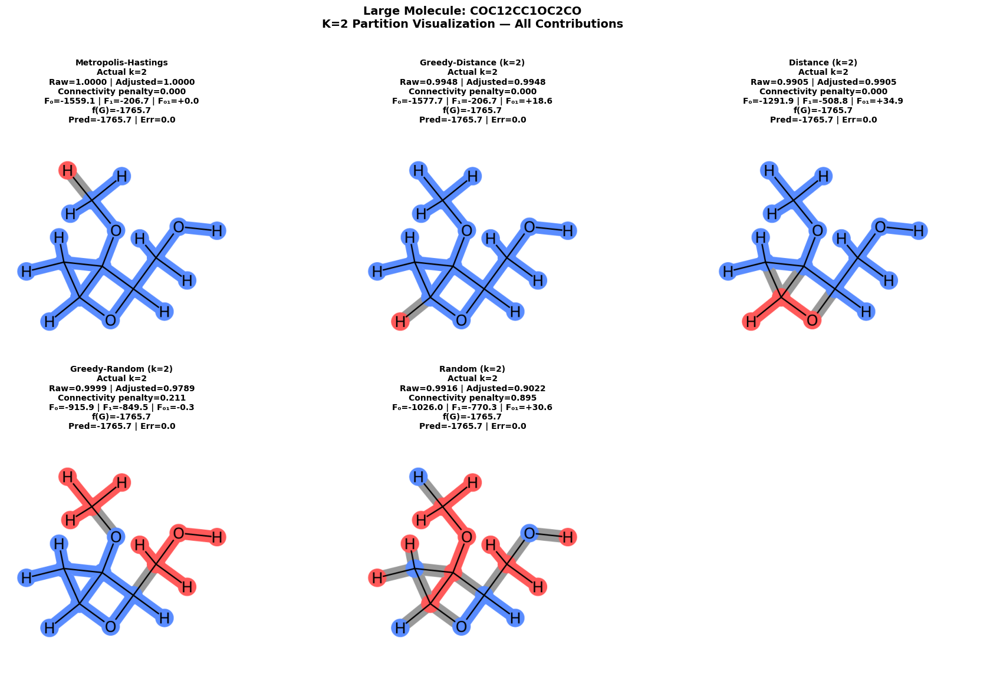


Partition details:

Metropolis-Hastings
Score: 1.000000
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1559.056
  P1: atoms=[9], symbols=['H'], F_1=-206.693

Greedy-Distance (k=2)
Score: 0.994836
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1577.679
  P1: atoms=[14], symbols=['H'], F_1=-206.693
  Pair terms:
    F_(0, 1) = +18.623

Distance (k=2)
Score: 0.990480
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1291.937
  P1: atoms=[4, 5, 14], symbols=['C', 'O', 'H'], F_1=-508.761
  Pair terms:
    F_(0, 1) = +34.950

Greedy-Rand

In [22]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import io

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score
)

CONNECTIVITY_WEIGHT = 0.10

optimizer_k = PartitionOptimizer(
    interpreter=interpreter,
    min_partitions=K_TO_PLOT,
    max_partitions=K_TO_PLOT,
    connectivity_weight=CONNECTIVITY_WEIGHT
)

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),
    1: (1.00, 0.35, 0.35),
    2: (0.35, 0.80, 0.45),
    3: (0.80, 0.55, 1.00),
}

def mol_to_partition_image(mol, partition, img_size=(500, 500)):
    drawer = rdMolDraw2D.MolDraw2DCairo(img_size[0], img_size[1])

    opts = drawer.drawOptions()
    opts.useBWAtomPalette()
    opts.fillHighlights = True
    opts.highlightRadius = 0.35
    opts.bondLineWidth = 3

    atoms_to_highlight = []
    atom_colors = {}

    for atom_idx, pid in partition.items():
        atom_idx = int(atom_idx)
        atoms_to_highlight.append(atom_idx)
        atom_colors[atom_idx] = PARTITION_COLORS.get(pid, (0.75, 0.75, 0.75))

    bonds_to_highlight = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        a1 = bond.GetBeginAtomIdx()
        a2 = bond.GetEndAtomIdx()

        p1 = partition.get(a1)
        p2 = partition.get(a2)

        bonds_to_highlight.append(bond_idx)

        if p1 == p2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(p1, (0.75, 0.75, 0.75))
        else:
            bond_colors[bond_idx] = (0.60, 0.60, 0.60)

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()
    return Image.open(io.BytesIO(drawer.GetDrawingText()))


def draw_rdkit_partition_grid(
    mol,
    partitions,
    titles,
    mols_per_row=3,
    img_size=(500, 500),
    title_fontsize=10,
    figsize=None
):
    n = len(partitions)
    n_rows = (n + mols_per_row - 1) // mols_per_row

    if figsize is None:
        figsize = (18, 6 * n_rows)

    fig, axes = plt.subplots(
        n_rows,
        mols_per_row,
        figsize=figsize
    )

    axes = np.array(axes).reshape(-1)

    for ax, partition, title in zip(axes, partitions, titles):
        img = mol_to_partition_image(
            mol,
            partition,
            img_size=img_size
        )

        ax.imshow(img)
        ax.axis("off")
        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight="bold",
            pad=10
        )

    for ax in axes[n:]:
        ax.axis("off")

    return fig


K_TO_PLOT = 2

CONNECTIVITY_WEIGHT = 0.10

MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42

optimizer_k = PartitionOptimizer(
    interpreter=interpreter,
    min_partitions=K_TO_PLOT,
    max_partitions=K_TO_PLOT,
    connectivity_weight=CONNECTIVITY_WEIGHT
)

for mol, smiles, size_label in selected_mols:
    print(f"\n{'=' * 80}")
    print(f"{size_label} MOLECULE: {smiles}")
    print(f"{'=' * 80}")

    # Make a copy so rerunning this cell does not permanently append
    # duplicate Metropolis-Hastings results to all_results.
    results = list(all_results[size_label])

    for result in results:
        interp = result["Interpretation"]

        if "Connectivity Penalty" not in result:
            result["Connectivity Penalty"] = (
                partition_connectivity_penalty(
                    mol,
                    interp.partition
                )
            )

        if "Adjusted Score" not in result:
            result["Adjusted Score"] = (
                connectivity_adjusted_score(
                    mol=mol,
                    interpretation=interp,
                    connectivity_weight=CONNECTIVITY_WEIGHT
                )
            )

    # =====================================================================
    # ADD METROPOLIS-HASTINGS RESULT
    # =====================================================================
    print(
        f"\nRunning Metropolis-Hastings with "
        f"k={K_TO_PLOT}, beta={MH_BETA}, "
        f"iterations={MH_ITERATIONS}"
    )

    mh_interp = (
        optimizer_k.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=K_TO_PLOT,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    mh_connectivity_penalty = partition_connectivity_penalty(
        mol,
        mh_interp.partition
    )

    mh_adjusted_score = connectivity_adjusted_score(
        mol=mol,
        interpretation=mh_interp,
        connectivity_weight=CONNECTIVITY_WEIGHT
    )

    mh_result = {
        "Strategy": "Metropolis-Hastings",
        "Method": "Metropolis-Hastings",
        "k": K_TO_PLOT,
        "Score": mh_interp.score,
        "Connectivity Penalty": mh_connectivity_penalty,
        "Adjusted Score": mh_adjusted_score,
        "N_partitions": len(
            set(mh_interp.partition.values())
        ),
        "Interpretation": mh_interp
    }

    results.append(mh_result)

    print(
        f"Metropolis-Hastings result: "
        f"k={mh_result['N_partitions']}, "
        f"raw={mh_result['Score']:.4f}, "
        f"penalty={mh_result['Connectivity Penalty']:.4f}, "
        f"adjusted={mh_result['Adjusted Score']:.4f}"
    )

    # =====================================================================
    # KEEP ONLY RESULTS WITH THE REQUESTED NUMBER OF PARTITIONS
    # =====================================================================
    selected_results = [
        result
        for result in results
        if result["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(
            f"⚠️ No results found with exactly "
            f"k={K_TO_PLOT} partitions"
        )
        continue

    # =====================================================================
    # GUARANTEE THAT METROPOLIS-HASTINGS IS SHOWN
    #
    # Keep the five best non-MH methods and always include MH.
    # This produces at most six panels.
    # =====================================================================
    mh_results = [
        result
        for result in selected_results
        if result["Strategy"] == "Metropolis-Hastings"
    ]

    non_mh_results = [
        result
        for result in selected_results
        if result["Strategy"] != "Metropolis-Hastings"
    ]

    non_mh_results.sort(
        key=lambda result: result["Adjusted Score"],
        reverse=True
    )

    selected_results = non_mh_results[:5] + mh_results[:1]

    # Sort the final six methods by score while retaining MH.
    selected_results.sort(
        key=lambda result: result["Adjusted Score"],
        reverse=True
    )

    print(
        f"\nPlotting {len(selected_results)} methods "
        f"with exactly k={K_TO_PLOT} partitions"
    )

    for result in selected_results:
        print(
            f"  {result['Strategy']}: "
            f"raw={result['Score']:.4f}, "
            f"penalty={result['Connectivity Penalty']:.4f}, "
            f"adjusted={result['Adjusted Score']:.4f}"
        )

    partitions = []
    titles = []

    # =====================================================================
    # BUILD PANEL TITLES
    # =====================================================================
    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(
            set(partition.values())
        )

        partitions.append(partition)

        # For k=2, these correspond to the two within-partition terms.
        F0 = interp.within_partition.get(0, 0.0)
        F1 = interp.within_partition.get(1, 0.0)

        # Sum all graphlets spanning two partitions.
        F01 = sum(
            interp.between_partition.values()
        )

        # Sum graphlets spanning three or more partitions.
        F_higher = sum(
            interp.higher_order.values()
        )

        # Reconstructed model prediction.
        f_G = F0 + F1 + F01 + F_higher

        model_pred = interp.total_prediction
        decomposition_error = abs(
            f_G - model_pred
        )

        title = (
            f"{result['Strategy']}\n"
            f"Actual k={len(partition_ids)}\n"
            f"Raw={result['Score']:.4f} | "
            f"Adjusted={result['Adjusted Score']:.4f}\n"
            f"Connectivity penalty="
            f"{result['Connectivity Penalty']:.3f}\n"
            f"F₀={F0:+.1f} | "
            f"F₁={F1:+.1f} | "
            f"F₀₁={F01:+.1f}\n"
            f"f(G)={f_G:+.1f}\n"
            f"Pred={model_pred:+.1f} | "
            f"Err={decomposition_error:.1f}"
        )

        titles.append(title)

    # =====================================================================
    # DRAW PARTITION GRID
    # =====================================================================
    n_rows = (
        len(selected_results) + 2
    ) // 3

    fig = draw_rdkit_partition_grid(
        mol=mol,
        partitions=partitions,
        titles=titles,
        mols_per_row=3,
        img_size=(500, 500),
        title_fontsize=10,
        figsize=(18, 6 * n_rows)
    )

    plt.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — "
        f"All Contributions",
        fontsize=14,
        fontweight="bold",
        y=0.98
    )

    plt.tight_layout(
        rect=[0, 0.03, 1, 0.96]
    )

    plt.savefig(
        (
            f"k{K_TO_PLOT}_partition_viz_rdkit_"
            f"{size_label.lower()}_mh.png"
        ),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    # =====================================================================
    # PRINT PARTITION DETAILS
    # =====================================================================
    print("\nPartition details:")

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(
            set(partition.values())
        )

        print(
            f"\n{result['Strategy']}"
        )
        print(
            f"Score: {result['Score']:.6f}"
        )
        print(
            f"Actual partitions: {partition_ids}"
        )

        for partition_id in partition_ids:
            atoms_in_partition = [
                atom_idx
                for atom_idx, assigned_partition
                in partition.items()
                if assigned_partition == partition_id
            ]

            symbols = [
                mol.GetAtomWithIdx(atom_idx).GetSymbol()
                for atom_idx in atoms_in_partition
            ]

            within_contribution = (
                interp.within_partition.get(
                    partition_id,
                    0.0
                )
            )

            print(
                f"  P{partition_id}: "
                f"atoms={atoms_in_partition}, "
                f"symbols={symbols}, "
                f"F_{partition_id}="
                f"{within_contribution:+.3f}"
            )

        if interp.between_partition:
            print("  Pair terms:")

            for pair, value in sorted(
                interp.between_partition.items()
            ):
                print(
                    f"    F_{pair} = {value:+.3f}"
                )

        if interp.higher_order:
            print("  Higher-order terms:")

            for parts, value in sorted(
                interp.higher_order.items()
            ):
                print(
                    f"    F_{parts} = {value:+.3f}"
                )


MEDIUM MOLECULE: O=C1NN=CN=C1
Distance (k=3): actual k=3, score=0.9878, adjusted=0.9878
Random (k=3): actual k=3, score=0.9864, adjusted=0.9264
Greedy-Random (k=3): actual k=3, score=0.9967, adjusted=0.9767
Greedy-Distance (k=3): actual k=3, score=0.9950, adjusted=0.9950
Metropolis-Hastings (k=3): actual k=3, score=0.9999, adjusted=0.9999

Plotting 5 methods with exactly k=3 partitions
  Metropolis-Hastings (k=3): score=0.9999

Plotting 5 methods with exactly k=3 partitions
  Metropolis-Hastings (k=3): score=0.9999
  Greedy-Distance (k=3): score=0.9950
  Distance (k=3): score=0.9878
  Greedy-Random (k=3): score=0.9967
  Random (k=3): score=0.9864
  Greedy-Distance (k=3): score=0.9950

Plotting 5 methods with exactly k=3 partitions
  Metropolis-Hastings (k=3): score=0.9999
  Greedy-Distance (k=3): score=0.9950
  Distance (k=3): score=0.9878
  Greedy-Random (k=3): score=0.9967
  Random (k=3): score=0.9864
  Distance (k=3): score=0.9878

Plotting 5 methods with exactly k=3 partitions
  M

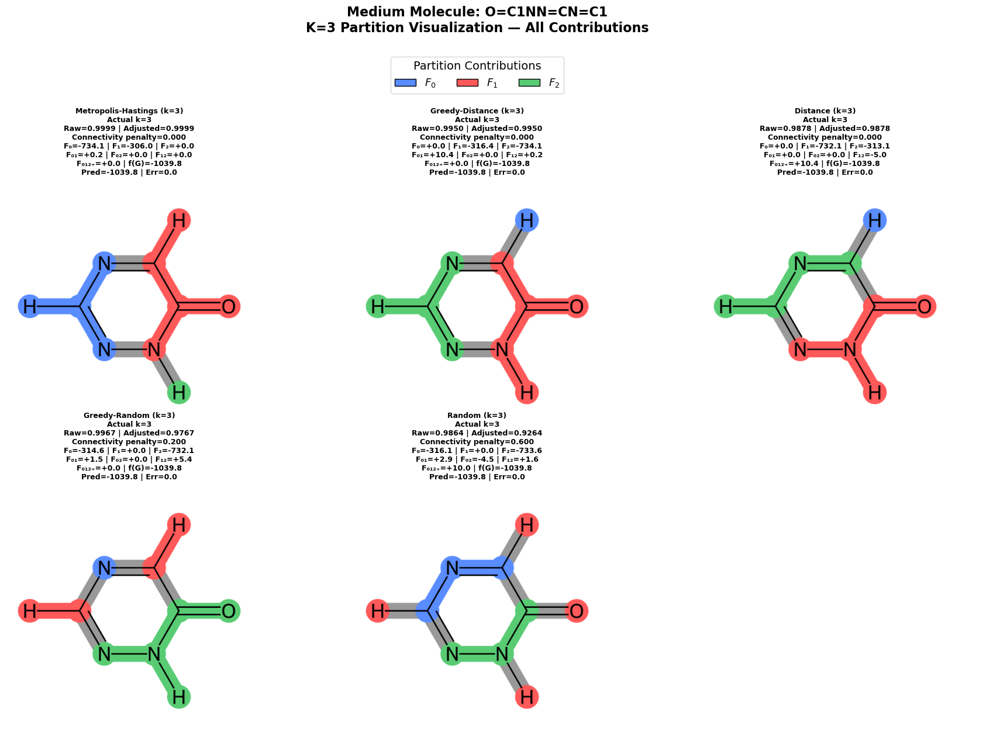


Partition details:

Metropolis-Hastings (k=3)
Score: 0.999883
Actual partitions: [0, 1, 2]
  P0: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_0=-734.081
  P1: atoms=[0, 1, 2, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_1=-305.954
  P2: atoms=[7], symbols=['H'], F_2=+0.000
  Pair terms:
    F_(0, 1) = +0.244
  Higher-order terms: none

Greedy-Distance (k=3)
Score: 0.994969
Actual partitions: [0, 1, 2]
  P0: atoms=[9], symbols=['H'], F_0=+0.000
  P1: atoms=[0, 1, 2, 6, 7], symbols=['O', 'C', 'N', 'C', 'H'], F_1=-316.387
  P2: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_2=-734.081
  Pair terms:
    F_(0, 1) = +10.433
    F_(1, 2) = +0.244
  Higher-order terms: none

Distance (k=3)
Score: 0.987794
Actual partitions: [0, 1, 2]
  P0: atoms=[9], symbols=['H'], F_0=+0.000
  P1: atoms=[0, 1, 2, 3, 7], symbols=['O', 'C', 'N', 'N', 'H'], F_1=-732.059
  P2: atoms=[4, 5, 6, 8], symbols=['C', 'N', 'C', 'H'], F_2=-313.140
  Pair terms:
    F_(1, 2) = -5.025
  Higher-order terms:
    F

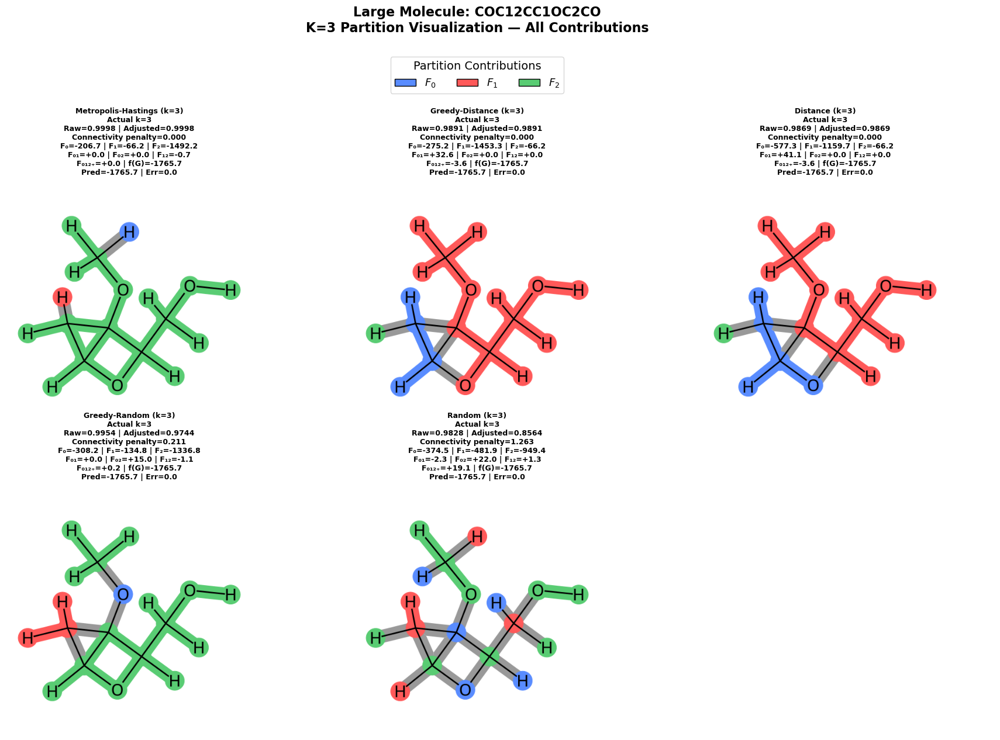


Partition details:

Metropolis-Hastings (k=3)
Score: 0.999810
Actual partitions: [0, 1, 2]
  P0: atoms=[11], symbols=['H'], F_0=-206.693
  P1: atoms=[12], symbols=['H'], F_1=-66.224
  P2: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_2=-1492.162
  Pair terms:
    F_(1, 2) = -0.671
  Higher-order terms: none

Greedy-Distance (k=3)
Score: 0.989130
Actual partitions: [0, 1, 2]
  P0: atoms=[3, 4, 12, 14], symbols=['C', 'C', 'H', 'H'], F_0=-275.236
  P1: atoms=[0, 1, 2, 5, 6, 7, 8, 9, 10, 11, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-1453.295
  P2: atoms=[13], symbols=['H'], F_2=-66.224
  Pair terms:
    F_(0, 1) = +32.606
  Higher-order terms:
    F_(0, 1, 2) = -3.600

Distance (k=3)
Score: 0.986925
Actual partitions: [0, 1, 2]
  P0: atoms=[3, 4, 5, 12, 14], symbols=['C', 'C', 'O', 'H', 'H'], F_0=-577.325
  P1: ato

In [23]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import io
from matplotlib.patches import Patch


# =============================================================================
# PARTITION COLORS
# =============================================================================

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}


# =============================================================================
# DRAW ONE MOLECULE WITH PARTITION HIGHLIGHTING
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(500, 500)
):
    """
    Draw an RDKit molecule with atoms colored by partition.

    Bonds inside the same partition use that partition's color.
    Bonds crossing partitions are colored gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    opts = drawer.drawOptions()
    opts.useBWAtomPalette()
    opts.fillHighlights = True
    opts.highlightRadius = 0.35
    opts.bondLineWidth = 3

    atoms_to_highlight = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        atoms_to_highlight.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    bonds_to_highlight = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition.get(atom_1)
        partition_2 = partition.get(atom_2)

        bonds_to_highlight.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# DRAW A GRID OF PARTITION METHODS
# =============================================================================

def draw_rdkit_partition_grid(
    mol,
    partitions,
    titles,
    mols_per_row=3,
    img_size=(500, 500),
    title_fontsize=10,
    figsize=None
):
    """
    Draw several partitioning methods for the same molecule.
    """
    n_methods = len(partitions)

    n_rows = (
        n_methods + mols_per_row - 1
    ) // mols_per_row

    if figsize is None:
        figsize = (
            18,
            6 * n_rows
        )

    fig, axes = plt.subplots(
        n_rows,
        mols_per_row,
        figsize=figsize,
        squeeze=False
    )

    axes = axes.reshape(-1)

    for ax, partition, title in zip(
        axes,
        partitions,
        titles
    ):
        image = mol_to_partition_image(
            mol,
            partition,
            img_size=img_size
        )

        ax.imshow(image)
        ax.axis("off")

        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight="bold",
            pad=10
        )

    # Hide unused subplot axes.
    for ax in axes[n_methods:]:
        ax.axis("off")

    return fig


# =============================================================================
# ANALYSIS SETTINGS
# =============================================================================

K_TO_PLOT = 3


greedy_optimizer = PartitionOptimizer(
    interpreter=interpreter,
    min_partitions=K_TO_PLOT,
    max_partitions=K_TO_PLOT
)

# Process only these molecule-size categories.
TARGET_SIZE_LABELS = {
    "medium",
    "large"
}

# Metropolis-Hastings settings.
MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42

# Maximum number of methods displayed per molecule.
MAX_METHODS = 6


# =============================================================================
# VISUALIZE MEDIUM AND LARGE MOLECULES WITH k=3
# =============================================================================

for mol, smiles, size_label in selected_mols:

    # -------------------------------------------------------------------------
    # Keep only medium and large molecules.
    # -------------------------------------------------------------------------
    normalized_size_label = str(
        size_label
    ).strip().lower()

    if normalized_size_label not in TARGET_SIZE_LABELS:
        continue

    print(f"\n{'=' * 80}")
    print(
        f"{size_label.upper()} MOLECULE: "
        f"{smiles}"
    )
    print(f"{'=' * 80}")

    # =========================================================================
    # COMPUTE ALL METHODS DIRECTLY WITH k=3
    # =========================================================================

    results = []

    # Use an optimizer constrained to exactly K_TO_PLOT partitions.
    optimizer_k = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=CONNECTIVITY_WEIGHT
    )


    def add_result(strategy_name, interpretation):
        """Store one result using the same format as the plotting code."""
        actual_k = len(
            set(interpretation.partition.values())
        )
        
        connectivity_penalty = partition_connectivity_penalty(
            mol,
            interpretation.partition
        )

        adjusted_score = connectivity_adjusted_score(
            mol=mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT
        )

        results.append({
            "Strategy": strategy_name,
            "Score": interpretation.score,
            "Adjusted Score": adjusted_score,
            "Connectivity Penalty": connectivity_penalty,
            "N_partitions": actual_k,
            "Interpretation": interpretation
        })

        print(
            f"{strategy_name}: "
            f"actual k={actual_k}, "
            f"score={interpretation.score:.4f}, "
            f"adjusted={adjusted_score:.4f}"
        )


    # -------------------------------------------------------------------------
    # 1. Distance baseline
    # -------------------------------------------------------------------------

    distance_partition = (
        ChemicalPartitioner.distance_partition(
            mol,
            n_clusters=K_TO_PLOT,
            seed=42
        )
    )

    distance_interp = (
        interpreter.compute_partition_contributions(
            mol,
            distance_partition
        )
    )

    add_result(
        f"Distance (k={K_TO_PLOT})",
        distance_interp
    )


    # -------------------------------------------------------------------------
    # 2. Random baseline
    # -------------------------------------------------------------------------

    random_partition = (
        ChemicalPartitioner.random_partition(
            mol,
            n_clusters=K_TO_PLOT,
            seed=42
        )
    )

    random_interp = (
        interpreter.compute_partition_contributions(
            mol,
            random_partition
        )
    )

    add_result(
        f"Random (k={K_TO_PLOT})",
        random_interp
    )


    # -------------------------------------------------------------------------
    # 3. Greedy-Random
    # -------------------------------------------------------------------------

    greedy_random_interp = (
        optimizer_k.optimize_partition_random(
            mol=mol,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    )

    add_result(
        f"Greedy-Random (k={K_TO_PLOT})",
        greedy_random_interp
    )


    # -------------------------------------------------------------------------
    # 4. Greedy-Distance
    # -------------------------------------------------------------------------

    greedy_distance_interp = (
        optimizer_k.optimize_partition_distance(
            mol=mol,
            n_clusters=K_TO_PLOT,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    )

    add_result(
        f"Greedy-Distance (k={K_TO_PLOT})",
        greedy_distance_interp
    )


    # -------------------------------------------------------------------------
    # 5. Metropolis-Hastings
    # -------------------------------------------------------------------------

    mh_interp = (
        optimizer_k.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=K_TO_PLOT,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    add_result(
        f"Metropolis-Hastings (k={K_TO_PLOT})",
        mh_interp
    )

    # =========================================================================
    # KEEP ONLY METHODS THAT ACTUALLY PRODUCED k=3
    # =========================================================================

    selected_results = [
        result
        for result in results
        if result["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(
            "⚠️ No results found with exactly "
            f"k={K_TO_PLOT} partitions"
        )
        continue

        # =========================================================================
        # GUARANTEE THAT METROPOLIS-HASTINGS IS INCLUDED
        # =========================================================================

        # Keep only methods that actually produced exactly k=3.
    selected_results = [
        result
        for result in results
        if result["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(
            f"⚠️ No methods produced exactly "
            f"k={K_TO_PLOT} partitions"
        )
        continue

    # Sort all methods by interpretability score.
    selected_results.sort(
        key=lambda result: result["Adjusted Score"],
        reverse=True
    )

    selected_results = selected_results[:MAX_METHODS]

    print(
        f"\nPlotting {len(selected_results)} methods "
        f"with exactly k={K_TO_PLOT} partitions"
    )

    for result in selected_results:
        print(
            f"  {result['Strategy']}: "
            f"score={result['Score']:.4f}"
        )

        # Sort all displayed methods by score.
        selected_results.sort(
            key=lambda result: result["Adjusted Score"],
            reverse=True
        )

        print(
            f"\nPlotting {len(selected_results)} methods "
            f"with exactly k={K_TO_PLOT} partitions"
        )

        for result in selected_results:
            print(
                f"  {result['Strategy']}: "
                f"score={result['Score']:.4f}"
            )

    # =========================================================================
    # BUILD PARTITIONS AND TITLES
    # =========================================================================

    partitions = []
    titles = []

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition

        partition_ids = sorted(
            set(
                partition.values()
            )
        )

        partitions.append(
            partition
        )

        # ---------------------------------------------------------------------
        # Within-partition contributions
        # ---------------------------------------------------------------------

        F0 = interp.within_partition.get(
            0,
            0.0
        )

        F1 = interp.within_partition.get(
            1,
            0.0
        )

        F2 = interp.within_partition.get(
            2,
            0.0
        )

        # ---------------------------------------------------------------------
        # Pairwise between-partition contributions
        # ---------------------------------------------------------------------

        F01 = interp.between_partition.get(
            (0, 1),
            0.0
        )

        F02 = interp.between_partition.get(
            (0, 2),
            0.0
        )

        F12 = interp.between_partition.get(
            (1, 2),
            0.0
        )

        # ---------------------------------------------------------------------
        # Graphlets spanning three or more partitions
        #
        # For exactly k=3, this will normally be F_(0,1,2).
        # ---------------------------------------------------------------------

        F012_plus = sum(
            interp.higher_order.values()
        )

        # Reconstruct the full graphlet-model prediction.
        f_G = (
            F0
            + F1
            + F2
            + F01
            + F02
            + F12
            + F012_plus
        )

        model_prediction = (
            interp.total_prediction
        )

        decomposition_error = abs(
            f_G - model_prediction
        )

        title = (
            f"{result['Strategy']}\n"
            f"Actual k={len(partition_ids)}\n"
            f"Raw={result['Score']:.4f} | "
            f"Adjusted={result['Adjusted Score']:.4f}\n"
            f"Connectivity penalty="
            f"{result['Connectivity Penalty']:.3f}\n"
            f"F₀={F0:+.1f} | "
            f"F₁={F1:+.1f} | "
            f"F₂={F2:+.1f}\n"
            f"F₀₁={F01:+.1f} | "
            f"F₀₂={F02:+.1f} | "
            f"F₁₂={F12:+.1f}\n"
            f"F₀₁₂₊={F012_plus:+.1f} | "
            f"f(G)={f_G:+.1f}\n"
            f"Pred={model_prediction:+.1f} | "
            f"Err={decomposition_error:.1f}"
        )

        titles.append(
            title
        )

    # =========================================================================
    # DRAW PARTITION GRID
    # =========================================================================

    n_rows = (
        len(selected_results) + 2
    ) // 3

    fig = draw_rdkit_partition_grid(
        mol=mol,
        partitions=partitions,
        titles=titles,
        mols_per_row=3,
        img_size=(500, 500),
        title_fontsize=9,
        figsize=(
            18,
            6.5 * n_rows
        )
    )

    legend_handles = []

    partition_ids = sorted(
        {
            pid
            for partition in partitions
            for pid in partition.values()
        }
    )

    for pid in partition_ids:
        legend_handles.append(
            Patch(
                facecolor=PARTITION_COLORS[pid],
                edgecolor="black",
                label=fr"$F_{{{pid}}}$"
            )
        )

    fig.legend(
        handles=legend_handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.93),
        ncol=len(legend_handles),
        fontsize=13,
        title="Partition Contributions",
        title_fontsize=14,
        frameon=True
    )

    fig.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — "
        "All Contributions",
        fontsize=16,
        fontweight="bold",
        y=0.99
    )

    plt.tight_layout(
        rect=[
            0,
            0.02,
            1,
            0.90
        ]
    )

    safe_size_label = (
        normalized_size_label
        .replace(" ", "_")
    )

    output_filename = (
        f"k{K_TO_PLOT}_partition_viz_rdkit_"
        f"{safe_size_label}_mh.png"
    )

    plt.savefig(
        output_filename,
        dpi=300,
        bbox_inches="tight"
    )

    print(
        f"\n✓ Saved figure to "
        f"'{output_filename}'"
    )

    plt.show()

    # =========================================================================
    # PRINT DETAILED PARTITION INFORMATION
    # =========================================================================

    print("\nPartition details:")

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition

        partition_ids = sorted(
            set(
                partition.values()
            )
        )

        print(
            f"\n{result['Strategy']}"
        )

        print(
            f"Score: "
            f"{result['Score']:.6f}"
        )

        print(
            f"Actual partitions: "
            f"{partition_ids}"
        )

        # ---------------------------------------------------------------------
        # Atoms assigned to each partition
        # ---------------------------------------------------------------------

        for partition_id in partition_ids:
            atoms_in_partition = [
                atom_idx
                for atom_idx, assigned_partition
                in partition.items()
                if assigned_partition == partition_id
            ]

            symbols = [
                mol.GetAtomWithIdx(
                    atom_idx
                ).GetSymbol()
                for atom_idx in atoms_in_partition
            ]

            within_contribution = (
                interp.within_partition.get(
                    partition_id,
                    0.0
                )
            )

            print(
                f"  P{partition_id}: "
                f"atoms={atoms_in_partition}, "
                f"symbols={symbols}, "
                f"F_{partition_id}="
                f"{within_contribution:+.3f}"
            )

        # ---------------------------------------------------------------------
        # Pairwise graphlet contributions
        # ---------------------------------------------------------------------

        if interp.between_partition:
            print(
                "  Pair terms:"
            )

            for pair, value in sorted(
                interp.between_partition.items()
            ):
                print(
                    f"    F_{pair} = "
                    f"{value:+.3f}"
                )

        # ---------------------------------------------------------------------
        # Three-partition or higher graphlet contributions
        # ---------------------------------------------------------------------

        if interp.higher_order:
            print(
                "  Higher-order terms:"
            )

            for partition_tuple, value in sorted(
                interp.higher_order.items()
            ):
                print(
                    f"    F_{partition_tuple} = "
                    f"{value:+.3f}"
                )
        else:
            print(
                "  Higher-order terms: none"
            )


MEDIUM MOLECULE: O=C1NN=CN=C1
Distance (k=4): actual k=4, raw=0.9904, penalty=0.0000, adjusted=0.9904
Random (k=4): actual k=4, raw=0.9821, penalty=1.0000, adjusted=0.8821
Greedy-Random (k=4): actual k=4, raw=0.9923, penalty=0.2000, adjusted=0.9723
Greedy-Distance (k=4): actual k=4, raw=0.9950, penalty=0.0000, adjusted=0.9950
Metropolis-Hastings (k=4): actual k=4, raw=0.9989, penalty=0.0000, adjusted=0.9989

Plotting 5 methods with exactly k=4 partitions
  Metropolis-Hastings (k=4): raw=0.9989, adjusted=0.9989
  Greedy-Distance (k=4): raw=0.9950, adjusted=0.9950
  Distance (k=4): raw=0.9904, adjusted=0.9904
  Greedy-Random (k=4): raw=0.9923, adjusted=0.9723
  Random (k=4): raw=0.9821, adjusted=0.8821

Saved figure to 'k4_partition_viz_rdkit_medium_mh.png'


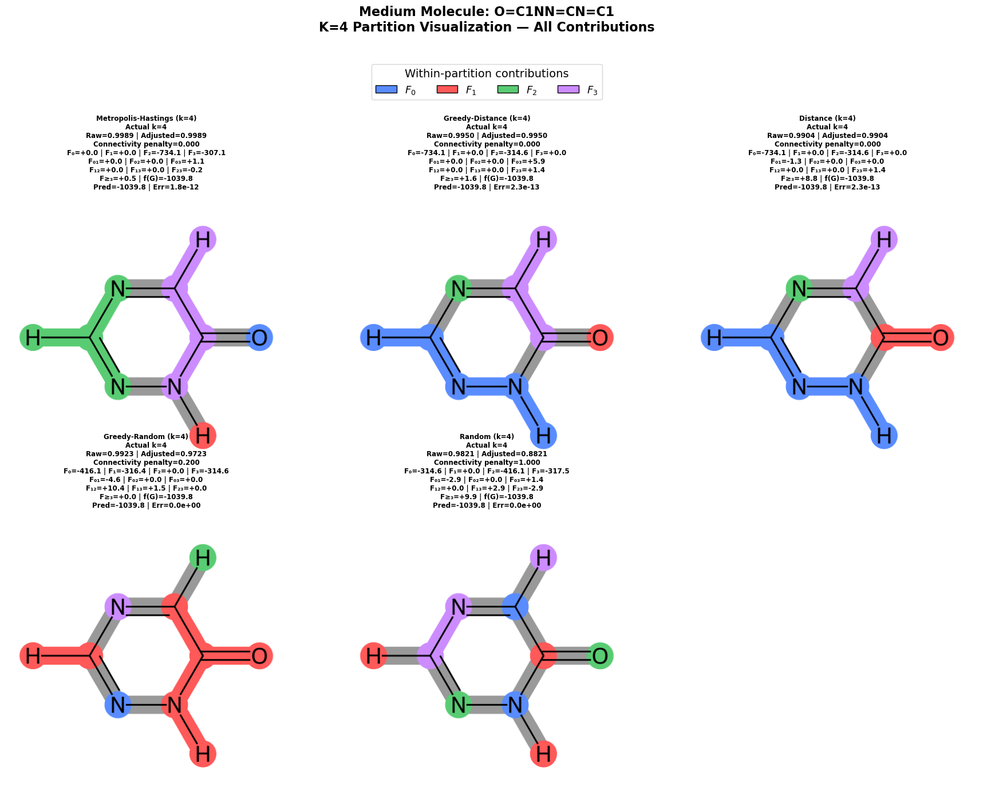


Partition details:

Metropolis-Hastings (k=4)
Raw score: 0.998903
Adjusted score: 0.998903
Connectivity penalty: 0.000000
Actual partitions: [0, 1, 2, 3]
  P0: atoms=[0], symbols=['O'], F_0=+0.000
  P1: atoms=[7], symbols=['H'], F_1=+0.000
  P2: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_2=-734.081
  P3: atoms=[1, 2, 6, 9], symbols=['C', 'N', 'C', 'H'], F_3=-307.070
  Pair terms:
    F_03 = +1.116
    F_23 = -0.228
  Higher-order terms:
    F_023 = +0.472

Greedy-Distance (k=4)
Raw score: 0.995031
Adjusted score: 0.995031
Connectivity penalty: 0.000000
Actual partitions: [0, 1, 2, 3]
  P0: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_0=-734.118
  P1: atoms=[0], symbols=['O'], F_1=+0.000
  P2: atoms=[5], symbols=['N'], F_2=-314.596
  P3: atoms=[1, 6, 9], symbols=['C', 'C', 'H'], F_3=+0.000
  Pair terms:
    F_02 = +0.036
    F_03 = +5.878
    F_23 = +1.420
  Higher-order terms:
    F_013 = +1.588

Distance (k=4)
Raw score: 0.990405
Adjusted score: 0.990405
Conne

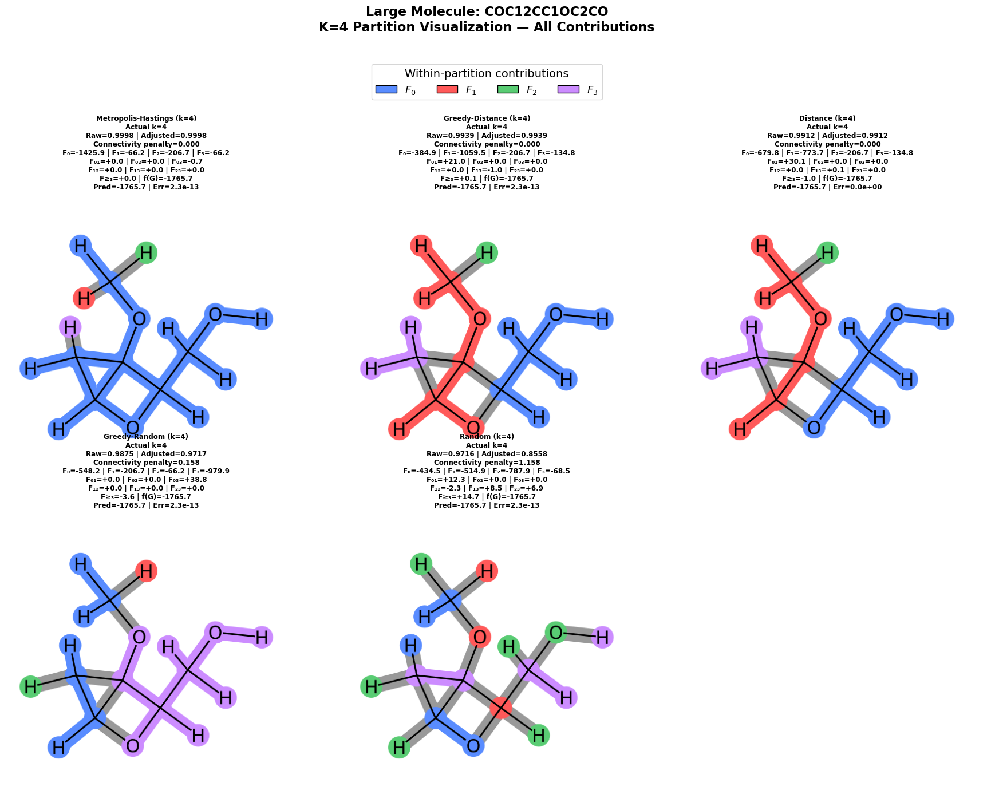


Partition details:

Metropolis-Hastings (k=4)
Raw score: 0.999810
Adjusted score: 0.999810
Connectivity penalty: 0.000000
Actual partitions: [0, 1, 2, 3]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1425.938
  P1: atoms=[10], symbols=['H'], F_1=-66.224
  P2: atoms=[11], symbols=['H'], F_2=-206.693
  P3: atoms=[12], symbols=['H'], F_3=-66.224
  Pair terms:
    F_03 = -0.671
  Higher-order terms: none

Greedy-Distance (k=4)
Raw score: 0.993868
Adjusted score: 0.993868
Connectivity penalty: 0.000000
Actual partitions: [0, 1, 2, 3]
  P0: atoms=[6, 7, 8, 15, 16, 17, 18], symbols=['C', 'C', 'O', 'H', 'H', 'H', 'H'], F_0=-384.939
  P1: atoms=[0, 1, 2, 4, 5, 9, 10, 14], symbols=['C', 'O', 'C', 'C', 'O', 'H', 'H', 'H'], F_1=-1059.462
  P2: atoms=[11], symbols=['H'], F_2=-206.693
  P3: atoms=[3, 12, 13], symbols=['C', 'H', 'H'], F_3=-134.766
  Pair terms:
    F_01 = +21.033
    

In [24]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import io
from matplotlib.patches import Patch


# =============================================================================
# PARTITION COLORS
# =============================================================================

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}


# =============================================================================
# DRAW ONE MOLECULE WITH PARTITION HIGHLIGHTING
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(500, 500)
):
    """
    Draw an RDKit molecule with atoms colored by partition.

    Bonds inside the same partition use that partition's color.
    Bonds crossing partitions are colored gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    opts = drawer.drawOptions()
    opts.useBWAtomPalette()
    opts.fillHighlights = True
    opts.highlightRadius = 0.35
    opts.bondLineWidth = 3

    atoms_to_highlight = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        atoms_to_highlight.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    bonds_to_highlight = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition.get(atom_1)
        partition_2 = partition.get(atom_2)

        bonds_to_highlight.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# DRAW A GRID OF PARTITION METHODS
# =============================================================================

def draw_rdkit_partition_grid(
    mol,
    partitions,
    titles,
    mols_per_row=3,
    img_size=(500, 500),
    title_fontsize=10,
    figsize=None
):
    """
    Draw several partitioning methods for the same molecule.
    """
    n_methods = len(partitions)

    n_rows = (
        n_methods + mols_per_row - 1
    ) // mols_per_row

    if figsize is None:
        figsize = (
            18,
            6 * n_rows
        )

    fig, axes = plt.subplots(
        n_rows,
        mols_per_row,
        figsize=figsize,
        squeeze=False
    )

    axes = axes.reshape(-1)

    for ax, partition, title in zip(
        axes,
        partitions,
        titles
    ):
        image = mol_to_partition_image(
            mol,
            partition,
            img_size=img_size
        )

        ax.imshow(image)
        ax.axis("off")

        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight="bold",
            pad=10
        )

    for ax in axes[n_methods:]:
        ax.axis("off")

    return fig


# =============================================================================
# ANALYSIS SETTINGS
# =============================================================================

K_TO_PLOT = 4

TARGET_SIZE_LABELS = {
    "medium",
    "large"
}

MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42

MAX_METHODS = 6


# =============================================================================
# VISUALIZE MEDIUM AND LARGE MOLECULES WITH k=4
# =============================================================================

for mol, smiles, size_label in selected_mols:

    normalized_size_label = str(
        size_label
    ).strip().lower()

    if normalized_size_label not in TARGET_SIZE_LABELS:
        continue

    # Four nonempty partitions require at least four atoms.
    if mol.GetNumAtoms() < K_TO_PLOT:
        print(
            f"Skipping {smiles}: only "
            f"{mol.GetNumAtoms()} atoms, but "
            f"k={K_TO_PLOT} was requested."
        )
        continue

    print(f"\n{'=' * 80}")
    print(
        f"{size_label.upper()} MOLECULE: "
        f"{smiles}"
    )
    print(f"{'=' * 80}")

    results = []

    optimizer_k = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=CONNECTIVITY_WEIGHT
    )


    def add_result(strategy_name, interpretation):
        """Store one partition result."""
        actual_k = len(
            set(interpretation.partition.values())
        )

        connectivity_penalty = (
            partition_connectivity_penalty(
                mol=mol,
                partition=interpretation.partition
            )
        )

        adjusted_score = connectivity_adjusted_score(
            mol=mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT
        )

        results.append({
            "Strategy": strategy_name,
            "Score": interpretation.score,
            "Adjusted Score": adjusted_score,
            "Connectivity Penalty": connectivity_penalty,
            "N_partitions": actual_k,
            "Interpretation": interpretation
        })

        print(
            f"{strategy_name}: "
            f"actual k={actual_k}, "
            f"raw={interpretation.score:.4f}, "
            f"penalty={connectivity_penalty:.4f}, "
            f"adjusted={adjusted_score:.4f}"
        )


    # =========================================================================
    # 1. DISTANCE BASELINE
    # =========================================================================

    distance_partition = (
        ChemicalPartitioner.distance_partition(
            mol=mol,
            n_clusters=K_TO_PLOT,
            seed=42
        )
    )

    distance_interp = (
        interpreter.compute_partition_contributions(
            mol,
            distance_partition
        )
    )

    add_result(
        f"Distance (k={K_TO_PLOT})",
        distance_interp
    )


    # =========================================================================
    # 2. RANDOM BASELINE
    # =========================================================================

    random_partition = (
        ChemicalPartitioner.random_partition(
            mol=mol,
            n_clusters=K_TO_PLOT,
            seed=42
        )
    )

    random_interp = (
        interpreter.compute_partition_contributions(
            mol,
            random_partition
        )
    )

    add_result(
        f"Random (k={K_TO_PLOT})",
        random_interp
    )


    # =========================================================================
    # 3. GREEDY-RANDOM
    # =========================================================================

    greedy_random_interp = (
        optimizer_k.optimize_partition_random(
            mol=mol,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    )

    add_result(
        f"Greedy-Random (k={K_TO_PLOT})",
        greedy_random_interp
    )


    # =========================================================================
    # 4. GREEDY-DISTANCE
    # =========================================================================

    greedy_distance_interp = (
        optimizer_k.optimize_partition_distance(
            mol=mol,
            n_clusters=K_TO_PLOT,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    )

    add_result(
        f"Greedy-Distance (k={K_TO_PLOT})",
        greedy_distance_interp
    )


    # =========================================================================
    # 5. METROPOLIS-HASTINGS
    # =========================================================================

    mh_interp = (
        optimizer_k.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=K_TO_PLOT,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    add_result(
        f"Metropolis-Hastings (k={K_TO_PLOT})",
        mh_interp
    )


    # =========================================================================
    # KEEP ONLY METHODS WITH EXACTLY FOUR ACTIVE PARTITIONS
    # =========================================================================

    selected_results = [
        result
        for result in results
        if result["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(
            f"No methods produced exactly "
            f"k={K_TO_PLOT} partitions."
        )
        continue

    selected_results.sort(
        key=lambda result: result["Adjusted Score"],
        reverse=True
    )

    selected_results = selected_results[:MAX_METHODS]

    print(
        f"\nPlotting {len(selected_results)} methods "
        f"with exactly k={K_TO_PLOT} partitions"
    )

    for result in selected_results:
        print(
            f"  {result['Strategy']}: "
            f"raw={result['Score']:.4f}, "
            f"adjusted={result['Adjusted Score']:.4f}"
        )


    # =========================================================================
    # BUILD PARTITIONS AND TITLES
    # =========================================================================

    partitions = []
    titles = []

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition

        partition_ids = sorted(
            set(partition.values())
        )

        partitions.append(partition)

        # ---------------------------------------------------------------------
        # Within-partition contributions
        # ---------------------------------------------------------------------

        F0 = interp.within_partition.get(0, 0.0)
        F1 = interp.within_partition.get(1, 0.0)
        F2 = interp.within_partition.get(2, 0.0)
        F3 = interp.within_partition.get(3, 0.0)

        # ---------------------------------------------------------------------
        # Pairwise between-partition contributions
        # ---------------------------------------------------------------------

        F01 = interp.between_partition.get((0, 1), 0.0)
        F02 = interp.between_partition.get((0, 2), 0.0)
        F03 = interp.between_partition.get((0, 3), 0.0)
        F12 = interp.between_partition.get((1, 2), 0.0)
        F13 = interp.between_partition.get((1, 3), 0.0)
        F23 = interp.between_partition.get((2, 3), 0.0)

        # ---------------------------------------------------------------------
        # Graphlets spanning at least three partitions
        # ---------------------------------------------------------------------

        F3_plus = sum(
            interp.higher_order.values()
        )

        # ---------------------------------------------------------------------
        # Reconstruct prediction from all stored terms
        # ---------------------------------------------------------------------

        f_G = (
            sum(interp.within_partition.values())
            + sum(interp.between_partition.values())
            + sum(interp.higher_order.values())
        )

        model_prediction = interp.total_prediction

        decomposition_error = abs(
            f_G - model_prediction
        )

        title = (
            f"{result['Strategy']}\n"
            f"Actual k={len(partition_ids)}\n"
            f"Raw={result['Score']:.4f} | "
            f"Adjusted={result['Adjusted Score']:.4f}\n"
            f"Connectivity penalty="
            f"{result['Connectivity Penalty']:.3f}\n"

            f"F₀={F0:+.1f} | "
            f"F₁={F1:+.1f} | "
            f"F₂={F2:+.1f} | "
            f"F₃={F3:+.1f}\n"

            f"F₀₁={F01:+.1f} | "
            f"F₀₂={F02:+.1f} | "
            f"F₀₃={F03:+.1f}\n"

            f"F₁₂={F12:+.1f} | "
            f"F₁₃={F13:+.1f} | "
            f"F₂₃={F23:+.1f}\n"

            f"F≥₃={F3_plus:+.1f} | "
            f"f(G)={f_G:+.1f}\n"

            f"Pred={model_prediction:+.1f} | "
            f"Err={decomposition_error:.1e}"
        )

        titles.append(title)


    # =========================================================================
    # DRAW PARTITION GRID
    # =========================================================================

    n_rows = (
        len(selected_results) + 2
    ) // 3

    fig = draw_rdkit_partition_grid(
        mol=mol,
        partitions=partitions,
        titles=titles,
        mols_per_row=3,
        img_size=(500, 500),
        title_fontsize=8.5,
        figsize=(
            18,
            7.2 * n_rows
        )
    )


    # =========================================================================
    # ADD PARTITION-COLOR LEGEND
    # =========================================================================

    legend_handles = [
        Patch(
            facecolor=PARTITION_COLORS[pid],
            edgecolor="black",
            label=fr"$F_{{{pid}}}$"
        )
        for pid in range(K_TO_PLOT)
    ]

    fig.legend(
        handles=legend_handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.925),
        ncol=K_TO_PLOT,
        fontsize=13,
        title="Within-partition contributions",
        title_fontsize=14,
        frameon=True
    )


    # =========================================================================
    # FIGURE TITLE AND LAYOUT
    # =========================================================================

    fig.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — "
        "All Contributions",
        fontsize=16,
        fontweight="bold",
        y=0.99
    )

    plt.tight_layout(
        rect=[
            0,
            0.02,
            1,
            0.88
        ]
    )


    # =========================================================================
    # SAVE FIGURE
    # =========================================================================

    safe_size_label = (
        normalized_size_label
        .replace(" ", "_")
    )

    output_filename = (
        f"k{K_TO_PLOT}_partition_viz_rdkit_"
        f"{safe_size_label}_mh.png"
    )

    plt.savefig(
        output_filename,
        dpi=300,
        bbox_inches="tight"
    )

    print(
        f"\nSaved figure to "
        f"'{output_filename}'"
    )

    plt.show()


    # =========================================================================
    # PRINT DETAILED PARTITION INFORMATION
    # =========================================================================

    print("\nPartition details:")

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition

        partition_ids = sorted(
            set(partition.values())
        )

        print(f"\n{result['Strategy']}")

        print(
            f"Raw score: "
            f"{result['Score']:.6f}"
        )

        print(
            f"Adjusted score: "
            f"{result['Adjusted Score']:.6f}"
        )

        print(
            f"Connectivity penalty: "
            f"{result['Connectivity Penalty']:.6f}"
        )

        print(
            f"Actual partitions: "
            f"{partition_ids}"
        )

        # ---------------------------------------------------------------------
        # Atoms assigned to each partition
        # ---------------------------------------------------------------------

        for partition_id in partition_ids:
            atoms_in_partition = [
                atom_idx
                for atom_idx, assigned_partition
                in partition.items()
                if assigned_partition == partition_id
            ]

            symbols = [
                mol.GetAtomWithIdx(
                    atom_idx
                ).GetSymbol()
                for atom_idx in atoms_in_partition
            ]

            within_contribution = (
                interp.within_partition.get(
                    partition_id,
                    0.0
                )
            )

            print(
                f"  P{partition_id}: "
                f"atoms={atoms_in_partition}, "
                f"symbols={symbols}, "
                f"F_{partition_id}="
                f"{within_contribution:+.3f}"
            )

        # ---------------------------------------------------------------------
        # Pairwise contributions
        # ---------------------------------------------------------------------

        if interp.between_partition:
            print("  Pair terms:")

            for pair, value in sorted(
                interp.between_partition.items()
            ):
                pair_label = "".join(
                    str(pid)
                    for pid in pair
                )

                print(
                    f"    F_{pair_label} = "
                    f"{value:+.3f}"
                )
        else:
            print("  Pair terms: none")

        # ---------------------------------------------------------------------
        # Three-partition and four-partition contributions
        # ---------------------------------------------------------------------

        if interp.higher_order:
            print("  Higher-order terms:")

            for partition_tuple, value in sorted(
                interp.higher_order.items()
            ):
                tuple_label = "".join(
                    str(pid)
                    for pid in partition_tuple
                )

                print(
                    f"    F_{tuple_label} = "
                    f"{value:+.3f}"
                )
        else:
            print("  Higher-order terms: none")

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Metropolis-Hastings k values: [2, 3, 4, 5]
Iterations per k: 5000
Initialization: distance
Seed: 42

Running Metropolis-Hastings for k=2...
  actual k=2, raw=1.0000, penalty=0.0000, adjusted=1.0000

Running Metropolis-Hastings for k=3...
  actual k=3, raw=0.9998, penalty=0.0000, adjusted=0.9998

Running Metropolis-Hastings for k=4...
  actual k=4, raw=0.9998, penalty=0.0000, adjusted=0.9998

Running Metropolis-Hastings for k=5...
  actual k=5, raw=0.9995, penalty=0.0000, adjusted=0.9995

Saved visualization to 'large_molecule_metropolis_hastings_partitions_k2_to_k5.png'


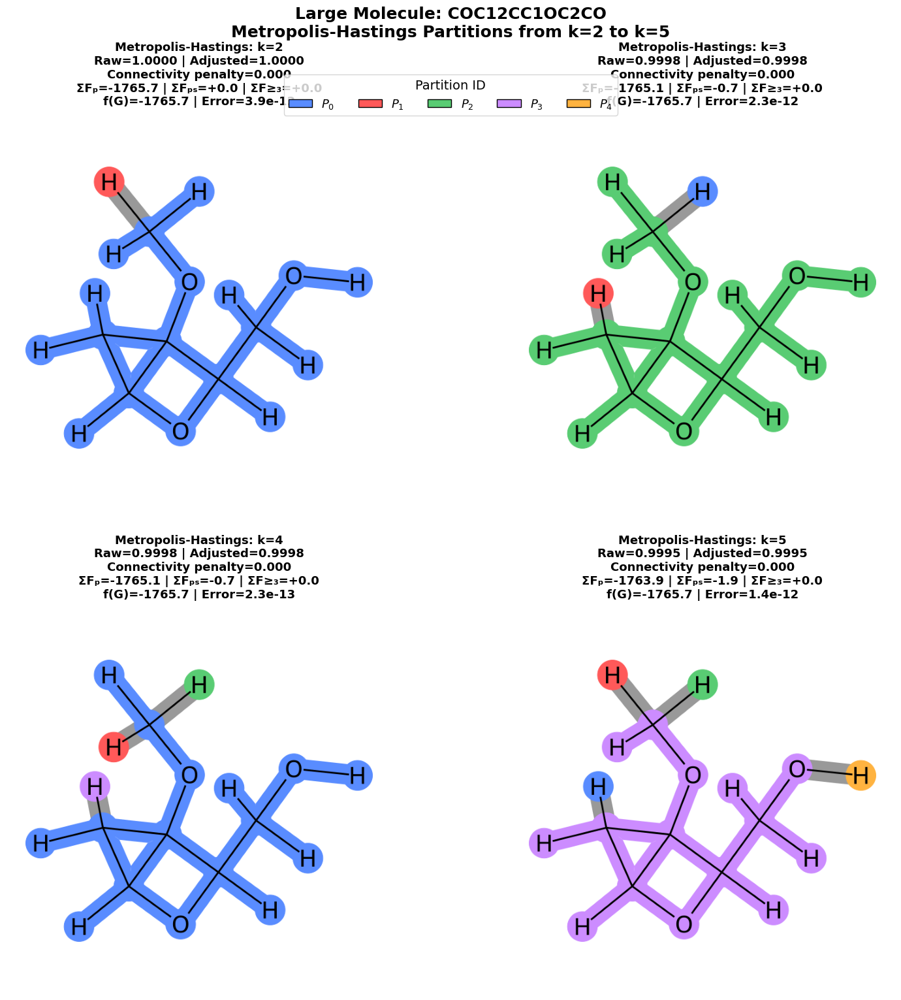


METROPOLIS-HASTINGS PARTITION DETAILS

Metropolis-Hastings, k=2
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1559.056
  P1: atoms=[9], symbols=['H'], F_1=-206.693

Metropolis-Hastings, k=3
  Raw score: 0.999810
  Connectivity penalty: 0.000000
  Adjusted score: 0.999810
  P0: atoms=[11], symbols=['H'], F_0=-206.693
  P1: atoms=[12], symbols=['H'], F_1=-66.224
  P2: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_2=-1492.162
  Pair terms:
    F_(1, 2)=-0.671

Metropolis-Hastings, k=4
  Raw score: 0.999810
  Connectivity penalty: 0.000000
  Adjusted score: 0.999810
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C'

In [25]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_VALUES_TO_PLOT = (2, 3, 4, 5)

MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42

CONNECTIVITY_WEIGHT = 0.10
DISCONNECTED_SINGLETON_WEIGHT = 2.0


# Five colors are needed because k=5 uses partition IDs 0 through 4.
PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
    4: (1.00, 0.70, 0.25),  # Orange
}


# =============================================================================
# FIND THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule with size_label='Large' was found in selected_mols."
    )

# Use the first molecule labeled Large.
large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < max(K_VALUES_TO_PLOT):
    raise ValueError(
        f"The large molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot be divided into {max(K_VALUES_TO_PLOT)} "
        "nonempty partitions."
    )

print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Metropolis-Hastings k values: {list(K_VALUES_TO_PLOT)}")
print(f"Iterations per k: {MH_ITERATIONS}")
print(f"Initialization: {MH_INITIALIZATION}")
print(f"Seed: {MH_SEED}")
print("=" * 80)


# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored according to partition membership.

    Bonds within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN METROPOLIS-HASTINGS FOR k=2 THROUGH k=5
# =============================================================================

mh_results = []

for k in K_VALUES_TO_PLOT:

    print(f"\nRunning Metropolis-Hastings for k={k}...")

    # Construct a separate optimizer constrained to exactly this k.
    optimizer_k = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=k,
        max_partitions=k,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    interpretation = (
        optimizer_k.optimize_partition_metropolis_hastings(
            mol=large_mol,
            n_clusters=k,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    partition = interpretation.partition

    actual_k = len(
        set(partition.values())
    )

    connectivity_penalty = (
        partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    adjusted_score = (
        connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    if actual_k != k:
        raise RuntimeError(
            f"Metropolis-Hastings requested k={k}, "
            f"but returned actual k={actual_k}."
        )

    mh_results.append({
        "k": k,
        "Actual k": actual_k,
        "Partition": partition,
        "Interpretation": interpretation,
        "Raw Score": interpretation.score,
        "Connectivity Penalty": connectivity_penalty,
        "Adjusted Score": adjusted_score,
    })

    print(
        f"  actual k={actual_k}, "
        f"raw={interpretation.score:.4f}, "
        f"penalty={connectivity_penalty:.4f}, "
        f"adjusted={adjusted_score:.4f}"
    )


# =============================================================================
# BUILD 2 x 2 VISUALIZATION
# =============================================================================

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(16, 16),
    squeeze=False
)

axes = axes.reshape(-1)

for ax, result in zip(axes, mh_results):

    k = result["k"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    image = mol_to_partition_image(
        mol=large_mol,
        partition=partition,
        img_size=(650, 650)
    )

    # Total signed contribution in each category.
    within_sum = sum(
        interpretation.within_partition.values()
    )

    between_sum = sum(
        interpretation.between_partition.values()
    )

    higher_sum = sum(
        interpretation.higher_order.values()
    )

    reconstructed_prediction = (
        within_sum
        + between_sum
        + higher_sum
    )

    decomposition_error = abs(
        reconstructed_prediction
        - interpretation.total_prediction
    )

    title = (
        f"Metropolis-Hastings: k={k}\n"
        f"Raw={result['Raw Score']:.4f} | "
        f"Adjusted={result['Adjusted Score']:.4f}\n"
        f"Connectivity penalty="
        f"{result['Connectivity Penalty']:.3f}\n"
        f"ΣFₚ={within_sum:+.1f} | "
        f"ΣFₚₛ={between_sum:+.1f} | "
        f"ΣF≥₃={higher_sum:+.1f}\n"
        f"f(G)={reconstructed_prediction:+.1f} | "
        f"Error={decomposition_error:.1e}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=13,
        fontweight="bold",
        pad=12
    )


# =============================================================================
# ADD A COMMON PARTITION-COLOR LEGEND
# =============================================================================

legend_handles = [
    Patch(
        facecolor=PARTITION_COLORS[partition_id],
        edgecolor="black",
        label=fr"$P_{{{partition_id}}}$"
    )
    for partition_id in range(
        max(K_VALUES_TO_PLOT)
    )
]

fig.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.925),
    ncol=max(K_VALUES_TO_PLOT),
    fontsize=13,
    title="Partition ID",
    title_fontsize=14,
    frameon=True
)

fig.suptitle(
    f"Large Molecule: {large_smiles}\n"
    "Metropolis-Hastings Partitions from k=2 to k=5",
    fontsize=18,
    fontweight="bold",
    y=0.985
)

fig.subplots_adjust(
    left=0.04,
    right=0.96,
    bottom=0.04,
    top=0.88,
    hspace=0.28,
    wspace=0.10
)

output_filename = (
    "large_molecule_metropolis_hastings_"
    "partitions_k2_to_k5.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PRINT PARTITION DETAILS
# =============================================================================

print("\n" + "=" * 80)
print("METROPOLIS-HASTINGS PARTITION DETAILS")
print("=" * 80)

for result in mh_results:

    k = result["k"]
    interpretation = result["Interpretation"]
    partition = result["Partition"]

    print(f"\nMetropolis-Hastings, k={k}")

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    for partition_id in sorted(
        set(partition.values())
    ):
        atoms = [
            atom_idx
            for atom_idx, assigned_partition
            in partition.items()
            if assigned_partition == partition_id
        ]

        symbols = [
            large_mol
            .GetAtomWithIdx(atom_idx)
            .GetSymbol()
            for atom_idx in atoms
        ]

        within_contribution = (
            interpretation.within_partition.get(
                partition_id,
                0.0
            )
        )

        print(
            f"  P{partition_id}: "
            f"atoms={atoms}, "
            f"symbols={symbols}, "
            f"F_{partition_id}="
            f"{within_contribution:+.3f}"
        )

    if interpretation.between_partition:
        print("  Pair terms:")

        for pair, value in sorted(
            interpretation.between_partition.items()
        ):
            print(
                f"    F_{pair}={value:+.3f}"
            )

    if interpretation.higher_order:
        print("  Higher-order terms:")

        for partition_ids, value in sorted(
            interpretation.higher_order.items()
        ):
            print(
                f"    F_{partition_ids}="
                f"{value:+.3f}"
            )

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Greedy-Distance k values: [2, 3, 4, 5]
Iterations per k: 100
Seed: 42
Connectivity weight: 0.1

Running Greedy-Distance for k=2...
  actual k=2, raw=0.9948, penalty=0.0000, adjusted=0.9948, cross bonds=1

Running Greedy-Distance for k=3...
  actual k=3, raw=0.9891, penalty=0.0000, adjusted=0.9891, cross bonds=4

Running Greedy-Distance for k=4...
  actual k=4, raw=0.9939, penalty=0.0000, adjusted=0.9939, cross bonds=5

Running Greedy-Distance for k=5...
  actual k=5, raw=0.9877, penalty=0.0000, adjusted=0.9877, cross bonds=6

Saved visualization to 'large_molecule_greedy_distance_partitions_k2_to_k5.png'


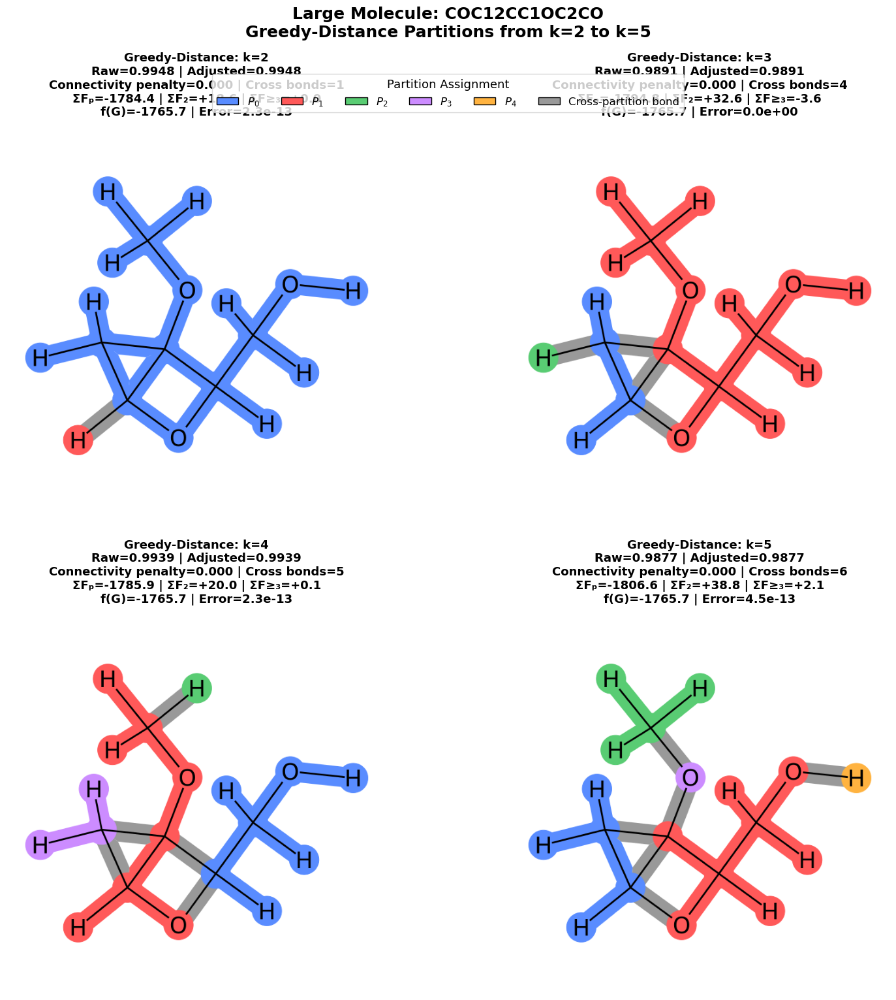


GREEDY-DISTANCE PARTITION DETAILS

Greedy-Distance, k=2
  Raw score: 0.994836
  Connectivity penalty: 0.000000
  Adjusted score: 0.994836
  Cross-partition bonds: [15]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1577.679
  P1: atoms=[14], symbols=['H'], F_1=-206.693
  Pair terms:
    F_(0, 1)=+18.623

Greedy-Distance, k=3
  Raw score: 0.989130
  Connectivity penalty: 0.000000
  Adjusted score: 0.989130
  Cross-partition bonds: [2, 4, 8, 14]
  P0: atoms=[3, 4, 12, 14], symbols=['C', 'C', 'H', 'H'], F_0=-275.236
  P1: atoms=[0, 1, 2, 5, 6, 7, 8, 9, 10, 11, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-1453.295
  P2: atoms=[13], symbols=['H'], F_2=-66.224
  Pair terms:
    F_(0, 1)=+32.606
  Higher-order terms:
    F_(0, 1, 2)=-3.600

Greedy-Distance, k=4
  Raw score: 0.993868
  Connectivity penalt

In [26]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_VALUES_TO_PLOT = (2, 3, 4, 5)

GREEDY_ITERATIONS = 100
GREEDY_SEED = 42

CONNECTIVITY_WEIGHT = 0.10
DISCONNECTED_SINGLETON_WEIGHT = 2.0


# Five colors are needed because k=5 uses partition IDs 0 through 4.
PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
    4: (1.00, 0.70, 0.25),  # Orange
}


# =============================================================================
# FIND THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule with size_label='Large' was found in selected_mols."
    )

# Use the first molecule labeled Large.
large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < max(K_VALUES_TO_PLOT):
    raise ValueError(
        f"The large molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot be divided into {max(K_VALUES_TO_PLOT)} "
        "nonempty partitions."
    )

print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Greedy-Distance k values: {list(K_VALUES_TO_PLOT)}")
print(f"Iterations per k: {GREEDY_ITERATIONS}")
print(f"Seed: {GREEDY_SEED}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print("=" * 80)


# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition membership.

    Bonds within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN GREEDY-DISTANCE FOR k=2 THROUGH k=5
# =============================================================================

greedy_distance_results = []

for k in K_VALUES_TO_PLOT:

    print(
        f"\nRunning Greedy-Distance for k={k}..."
    )

    # Constrain the optimizer to exactly k nonempty partitions.
    optimizer_k = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=k,
        max_partitions=k,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    interpretation = (
        optimizer_k.optimize_partition_distance(
            mol=large_mol,
            n_clusters=k,
            n_iterations=GREEDY_ITERATIONS,
            seed=GREEDY_SEED,
            verbose=False
        )
    )

    partition = interpretation.partition

    actual_k = len(
        set(partition.values())
    )

    connectivity_penalty = (
        partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    adjusted_score = (
        connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    if actual_k != k:
        raise RuntimeError(
            f"Greedy-Distance requested k={k}, "
            f"but returned actual k={actual_k}."
        )

    cross_partition_bonds = [
        bond.GetIdx()
        for bond in large_mol.GetBonds()
        if (
            partition[bond.GetBeginAtomIdx()]
            != partition[bond.GetEndAtomIdx()]
        )
    ]

    greedy_distance_results.append({
        "k": k,
        "Actual k": actual_k,
        "Partition": partition,
        "Interpretation": interpretation,
        "Raw Score": interpretation.score,
        "Connectivity Penalty": connectivity_penalty,
        "Adjusted Score": adjusted_score,
        "Cross Bonds": cross_partition_bonds,
        "N Cross Bonds": len(cross_partition_bonds),
    })

    print(
        f"  actual k={actual_k}, "
        f"raw={interpretation.score:.4f}, "
        f"penalty={connectivity_penalty:.4f}, "
        f"adjusted={adjusted_score:.4f}, "
        f"cross bonds={len(cross_partition_bonds)}"
    )


# =============================================================================
# BUILD 2 x 2 VISUALIZATION
# =============================================================================

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(16, 16),
    squeeze=False
)

axes = axes.reshape(-1)

for ax, result in zip(
    axes,
    greedy_distance_results
):
    k = result["k"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    image = mol_to_partition_image(
        mol=large_mol,
        partition=partition,
        img_size=(650, 650)
    )

    # Total signed contribution in each category.
    within_sum = sum(
        interpretation.within_partition.values()
    )

    between_sum = sum(
        interpretation.between_partition.values()
    )

    higher_sum = sum(
        interpretation.higher_order.values()
    )

    reconstructed_prediction = (
        within_sum
        + between_sum
        + higher_sum
    )

    decomposition_error = abs(
        reconstructed_prediction
        - interpretation.total_prediction
    )

    title = (
        f"Greedy-Distance: k={k}\n"
        f"Raw={result['Raw Score']:.4f} | "
        f"Adjusted={result['Adjusted Score']:.4f}\n"
        f"Connectivity penalty="
        f"{result['Connectivity Penalty']:.3f} | "
        f"Cross bonds={result['N Cross Bonds']}\n"
        f"ΣFₚ={within_sum:+.1f} | "
        f"ΣF₂={between_sum:+.1f} | "
        f"ΣF≥₃={higher_sum:+.1f}\n"
        f"f(G)={reconstructed_prediction:+.1f} | "
        f"Error={decomposition_error:.1e}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=13,
        fontweight="bold",
        pad=12
    )


# =============================================================================
# ADD A COMMON PARTITION-COLOR LEGEND
# =============================================================================

legend_handles = [
    Patch(
        facecolor=PARTITION_COLORS[partition_id],
        edgecolor="black",
        label=fr"$P_{{{partition_id}}}$"
    )
    for partition_id in range(
        max(K_VALUES_TO_PLOT)
    )
]

legend_handles.append(
    Patch(
        facecolor=(0.60, 0.60, 0.60),
        edgecolor="black",
        label="Cross-partition bond"
    )
)

fig.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.925),
    ncol=len(legend_handles),
    fontsize=12,
    title="Partition Assignment",
    title_fontsize=13,
    frameon=True
)

fig.suptitle(
    f"Large Molecule: {large_smiles}\n"
    "Greedy-Distance Partitions from k=2 to k=5",
    fontsize=18,
    fontweight="bold",
    y=0.985
)

fig.subplots_adjust(
    left=0.04,
    right=0.96,
    bottom=0.04,
    top=0.87,
    hspace=0.28,
    wspace=0.10
)

output_filename = (
    "large_molecule_greedy_distance_"
    "partitions_k2_to_k5.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PRINT PARTITION DETAILS
# =============================================================================

print("\n" + "=" * 80)
print("GREEDY-DISTANCE PARTITION DETAILS")
print("=" * 80)

for result in greedy_distance_results:

    k = result["k"]
    interpretation = result["Interpretation"]
    partition = result["Partition"]

    print(f"\nGreedy-Distance, k={k}")

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    for partition_id in sorted(
        set(partition.values())
    ):
        atoms = [
            atom_idx
            for atom_idx, assigned_partition
            in partition.items()
            if assigned_partition == partition_id
        ]

        symbols = [
            large_mol
            .GetAtomWithIdx(atom_idx)
            .GetSymbol()
            for atom_idx in atoms
        ]

        within_contribution = (
            interpretation.within_partition.get(
                partition_id,
                0.0
            )
        )

        print(
            f"  P{partition_id}: "
            f"atoms={atoms}, "
            f"symbols={symbols}, "
            f"F_{partition_id}="
            f"{within_contribution:+.3f}"
        )

    if interpretation.between_partition:
        print("  Pair terms:")

        for pair, value in sorted(
            interpretation.between_partition.items()
        ):
            print(
                f"    F_{pair}={value:+.3f}"
            )

    if interpretation.higher_order:
        print("  Higher-order terms:")

        for partition_ids, value in sorted(
            interpretation.higher_order.items()
        ):
            print(
                f"    F_{partition_ids}="
                f"{value:+.3f}"
            )

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Partition counts: [2, 3, 4, 5]
Independent initializations per k: 100
MH iterations per initialization: 1000
MH beta: 20.0
Connectivity weight: 0.1

Running Metropolis-Hastings for k=2...
  Completed   1/100: current adjusted=0.9997, best adjusted=0.9997
  Completed  10/100: current adjusted=1.0000, best adjusted=1.0000
  Completed  20/100: current adjusted=0.9983, best adjusted=1.0000
  Completed  30/100: current adjusted=1.0000, best adjusted=1.0000
  Completed  40/100: current adjusted=0.9998, best adjusted=1.0000
  Completed  50/100: current adjusted=0.9982, best adjusted=1.0000
  Completed  60/100: current adjusted=0.9982, best adjusted=1.0000
  Completed  70/100: current adjusted=0.9997, best adjusted=1.0000
  Completed  80/100: current adjusted=0.9997, best adjusted=1.0000
  Completed  90/100: current adjusted=0.9998, best adjusted=1.0000
  Completed 100/100: current adjusted=1.0000, best adjusted=1.0000
  Best for k=2: raw=1.0000, penalty

,k,Initialization,Seed,Actual k,Raw Score,Connectivity Penalty,Adjusted Score,Within Fraction,Between Fraction,Higher Fraction,Within Sum,Between Sum,Higher Sum
0,2,1,20042,2,0.999655,0.0,0.999655,0.999311,0.000689,0.0,-1764.531467,-1.217255,0.0
1,2,2,20043,2,1.000000,0.0,1.000000,1.000000,0.000000,0.0,-1765.748722,0.000000,0.0
2,2,3,20044,2,0.999655,0.0,0.999655,0.999311,0.000689,0.0,-1764.531467,-1.217255,0.0
3,2,4,20045,2,1.000000,0.0,1.000000,1.000000,0.000000,0.0,-1765.748722,0.000000,0.0
4,2,5,20046,2,0.998264,0.0,0.998264,0.996528,0.003472,0.0,-1771.921755,6.173033,0.0



METROPOLIS-HASTINGS SCORE SUMMARY


,k,N,Raw_Mean,Raw_Std,Raw_Min,Raw_Max,Adjusted_Mean,Adjusted_Std,Adjusted_Min,Adjusted_Max,Penalty_Mean,Penalty_Std
0,2,100,0.999318,0.000964,0.994836,1.000000,0.999318,0.000964,0.994836,1.000000,0.0,0.0
1,3,100,0.998684,0.001303,0.993171,1.000000,0.998684,0.001303,0.993171,1.000000,0.0,0.0
2,4,100,0.997320,0.001749,0.991651,1.000000,0.997320,0.001749,0.991651,1.000000,0.0,0.0
3,5,100,0.995671,0.002132,0.990104,0.999655,0.995671,0.002132,0.990104,0.999655,0.0,0.0



Saved score-distribution plot to 'large_molecule_metropolis_hastings_100_initializations_score_distributions.png'


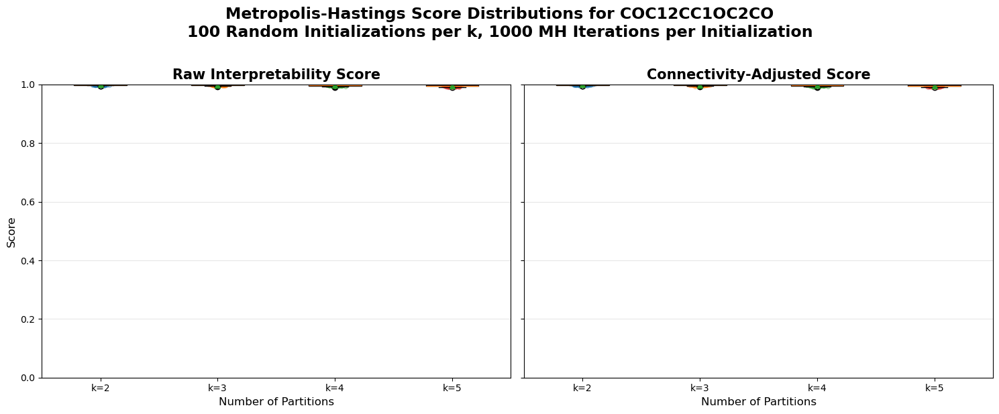

Saved score-versus-k plot to 'large_molecule_metropolis_hastings_100_initializations_score_vs_k.png'


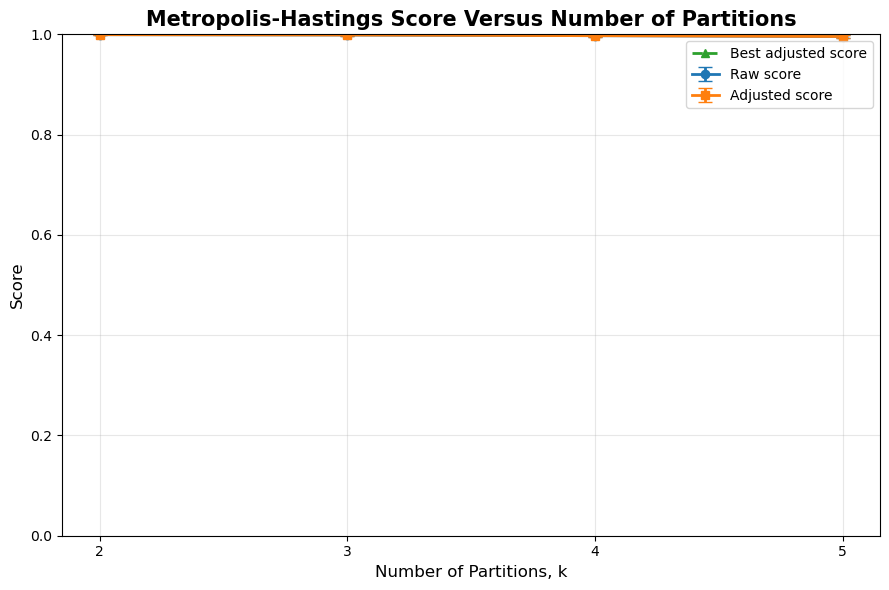


BEST METROPOLIS-HASTINGS RESULT FOR EACH k

k=2
  Best initialization: 2
  Seed: 20043
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fraction: 0.000000
  Partition: {0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 0, 10: 1, 11: 1, 12: 1, 13: 1, 14: 1, 15: 1, 16: 1, 17: 1, 18: 1}

k=3
  Best initialization: 13
  Seed: 30054
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fraction: 0.000000
  Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 2, 11: 1, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0}

k=4
  Best initialization: 81
  Seed: 40122
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fraction: 0.000000
  Partition: {0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_VALUES = (2, 3, 4, 5)

N_INITIALIZATIONS = 100

# Number of MH proposals within each independent run.
MH_ITERATIONS = 1000
MH_BETA = 20.0

BASE_SEED = 42

CONNECTIVITY_WEIGHT = 0.10
DISCONNECTED_SINGLETON_WEIGHT = 2.0


# =============================================================================
# FIND THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule with size_label='Large' was found in selected_mols."
    )

large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < max(K_VALUES):
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot be divided into {max(K_VALUES)} nonempty partitions."
    )

print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Partition counts: {list(K_VALUES)}")
print(f"Independent initializations per k: {N_INITIALIZATIONS}")
print(f"MH iterations per initialization: {MH_ITERATIONS}")
print(f"MH beta: {MH_BETA}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print("=" * 80)


# =============================================================================
# RUN 100 METROPOLIS-HASTINGS INITIALIZATIONS FOR EACH k
# =============================================================================

mh_results = []

# Store the best interpretation found for each k.
best_interpretations = {}

for k in K_VALUES:

    print(f"\nRunning Metropolis-Hastings for k={k}...")

    optimizer_k = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=k,
        max_partitions=k,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    best_adjusted_score = -np.inf
    best_result = None

    for initialization_index in range(N_INITIALIZATIONS):

        # Different deterministic seed for every (k, initialization) pair.
        run_seed = (
            BASE_SEED
            + 10_000 * k
            + initialization_index
        )

        interpretation = (
            optimizer_k.optimize_partition_metropolis_hastings(
                mol=large_mol,
                n_clusters=k,
                n_iterations=MH_ITERATIONS,
                beta=MH_BETA,
                initialization="random",
                seed=run_seed,
                verbose=False,
            )
        )

        partition = interpretation.partition
        actual_k = len(set(partition.values()))

        if actual_k != k:
            raise RuntimeError(
                f"Requested k={k}, but initialization "
                f"{initialization_index + 1} returned actual k={actual_k}."
            )

        connectivity_penalty = partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            ),
        )

        adjusted_score = connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            ),
        )

        within_sum = sum(
            interpretation.within_partition.values()
        )

        between_sum = sum(
            interpretation.between_partition.values()
        )

        higher_sum = sum(
            interpretation.higher_order.values()
        )

        breakdown = interpretation.get_contribution_breakdown()

        result = {
            "k": k,
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Actual k": actual_k,
            "Raw Score": interpretation.score,
            "Connectivity Penalty": connectivity_penalty,
            "Adjusted Score": adjusted_score,
            "Within Fraction": breakdown["within_frac"],
            "Between Fraction": breakdown["between_frac"],
            "Higher Fraction": breakdown["higher_frac"],
            "Within Sum": within_sum,
            "Between Sum": between_sum,
            "Higher Sum": higher_sum,
            "Partition": partition.copy(),
            "Interpretation": interpretation,
        }

        mh_results.append(result)

        if adjusted_score > best_adjusted_score:
            best_adjusted_score = adjusted_score
            best_result = result

        if (
            initialization_index == 0
            or (initialization_index + 1) % 10 == 0
        ):
            print(
                f"  Completed {initialization_index + 1:3d}/"
                f"{N_INITIALIZATIONS}: "
                f"current adjusted={adjusted_score:.4f}, "
                f"best adjusted={best_adjusted_score:.4f}"
            )

    best_interpretations[k] = best_result

    print(
        f"  Best for k={k}: "
        f"raw={best_result['Raw Score']:.4f}, "
        f"penalty={best_result['Connectivity Penalty']:.4f}, "
        f"adjusted={best_result['Adjusted Score']:.4f}, "
        f"initialization={best_result['Initialization']}"
    )


# =============================================================================
# CONVERT RESULTS TO A DATAFRAME
# =============================================================================

mh_score_df = pd.DataFrame([
    {
        key: value
        for key, value in result.items()
        if key not in {
            "Partition",
            "Interpretation",
        }
    }
    for result in mh_results
])

print("\nResult shape:")
print(mh_score_df.shape)

print("\nFirst rows:")
display(mh_score_df.head())


# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

mh_summary_df = (
    mh_score_df
    .groupby("k")
    .agg(
        N=("Adjusted Score", "size"),
        Raw_Mean=("Raw Score", "mean"),
        Raw_Std=("Raw Score", "std"),
        Raw_Min=("Raw Score", "min"),
        Raw_Max=("Raw Score", "max"),
        Adjusted_Mean=("Adjusted Score", "mean"),
        Adjusted_Std=("Adjusted Score", "std"),
        Adjusted_Min=("Adjusted Score", "min"),
        Adjusted_Max=("Adjusted Score", "max"),
        Penalty_Mean=("Connectivity Penalty", "mean"),
        Penalty_Std=("Connectivity Penalty", "std"),
    )
    .reset_index()
)

print("\n" + "=" * 80)
print("METROPOLIS-HASTINGS SCORE SUMMARY")
print("=" * 80)

display(mh_summary_df.round(6))


# =============================================================================
# PLOT RAW AND ADJUSTED SCORE DISTRIBUTIONS
# =============================================================================

raw_scores_by_k = [
    mh_score_df.loc[
        mh_score_df["k"] == k,
        "Raw Score"
    ].to_numpy()
    for k in K_VALUES
]

adjusted_scores_by_k = [
    mh_score_df.loc[
        mh_score_df["k"] == k,
        "Adjusted Score"
    ].to_numpy()
    for k in K_VALUES
]

fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15, 6),
    sharey=True,
)

# -----------------------------------------------------------------------------
# Raw score distributions
# -----------------------------------------------------------------------------

raw_boxplot = axes[0].boxplot(
    raw_scores_by_k,
    labels=[f"k={k}" for k in K_VALUES],
    showmeans=True,
    meanline=False,
    patch_artist=True,
)

axes[0].set_title(
    "Raw Interpretability Score",
    fontsize=15,
    fontweight="bold",
)

axes[0].set_xlabel(
    "Number of Partitions",
    fontsize=12,
)

axes[0].set_ylabel(
    "Score",
    fontsize=12,
)

axes[0].set_ylim(0.0, 1.0)
axes[0].grid(axis="y", alpha=0.3)

# Add individual initialization scores with horizontal jitter.
jitter_rng = np.random.default_rng(BASE_SEED)

for position, scores in enumerate(
    raw_scores_by_k,
    start=1,
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[0].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18,
    )


# -----------------------------------------------------------------------------
# Adjusted score distributions
# -----------------------------------------------------------------------------

adjusted_boxplot = axes[1].boxplot(
    adjusted_scores_by_k,
    labels=[f"k={k}" for k in K_VALUES],
    showmeans=True,
    meanline=False,
    patch_artist=True,
)

axes[1].set_title(
    "Connectivity-Adjusted Score",
    fontsize=15,
    fontweight="bold",
)

axes[1].set_xlabel(
    "Number of Partitions",
    fontsize=12,
)

axes[1].set_ylim(0.0, 1.0)
axes[1].grid(axis="y", alpha=0.3)

for position, scores in enumerate(
    adjusted_scores_by_k,
    start=1,
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[1].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18,
    )

fig.suptitle(
    f"Metropolis-Hastings Score Distributions for {large_smiles}\n"
    f"{N_INITIALIZATIONS} Random Initializations per k, "
    f"{MH_ITERATIONS} MH Iterations per Initialization",
    fontsize=17,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()

score_distribution_filename = (
    "large_molecule_metropolis_hastings_"
    "100_initializations_score_distributions.png"
)

plt.savefig(
    score_distribution_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved score-distribution plot to "
    f"'{score_distribution_filename}'"
)

plt.show()


# =============================================================================
# PLOT MEAN SCORE VERSUS k
# =============================================================================

raw_mean = (
    mh_score_df
    .groupby("k")["Raw Score"]
    .mean()
    .reindex(K_VALUES)
)

raw_std = (
    mh_score_df
    .groupby("k")["Raw Score"]
    .std()
    .reindex(K_VALUES)
)

adjusted_mean = (
    mh_score_df
    .groupby("k")["Adjusted Score"]
    .mean()
    .reindex(K_VALUES)
)

adjusted_std = (
    mh_score_df
    .groupby("k")["Adjusted Score"]
    .std()
    .reindex(K_VALUES)
)

k_array = np.asarray(K_VALUES)

fig, ax = plt.subplots(
    figsize=(9, 6)
)

ax.errorbar(
    k_array,
    raw_mean.to_numpy(),
    yerr=raw_std.to_numpy(),
    marker="o",
    linewidth=2,
    capsize=5,
    label="Raw score",
)

ax.errorbar(
    k_array,
    adjusted_mean.to_numpy(),
    yerr=adjusted_std.to_numpy(),
    marker="s",
    linewidth=2,
    capsize=5,
    label="Adjusted score",
)

# Plot the best adjusted score found at each k.
best_adjusted_scores = np.asarray([
    best_interpretations[k]["Adjusted Score"]
    for k in K_VALUES
])

ax.plot(
    k_array,
    best_adjusted_scores,
    marker="^",
    linestyle="--",
    linewidth=2,
    label="Best adjusted score",
)

ax.set_title(
    "Metropolis-Hastings Score Versus Number of Partitions",
    fontsize=15,
    fontweight="bold",
)

ax.set_xlabel(
    "Number of Partitions, k",
    fontsize=12,
)

ax.set_ylabel(
    "Score",
    fontsize=12,
)

ax.set_xticks(K_VALUES)
ax.set_ylim(0.0, 1.0)
ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()

score_vs_k_filename = (
    "large_molecule_metropolis_hastings_"
    "100_initializations_score_vs_k.png"
)

plt.savefig(
    score_vs_k_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"Saved score-versus-k plot to "
    f"'{score_vs_k_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FOR EACH k
# =============================================================================

print("\n" + "=" * 80)
print("BEST METROPOLIS-HASTINGS RESULT FOR EACH k")
print("=" * 80)

for k in K_VALUES:
    result = best_interpretations[k]
    interpretation = result["Interpretation"]

    print(f"\nk={k}")
    print(
        f"  Best initialization: "
        f"{result['Initialization']}"
    )
    print(
        f"  Seed: "
        f"{result['Seed']}"
    )
    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )
    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )
    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )
    print(
        f"  Within fraction: "
        f"{result['Within Fraction']:.6f}"
    )
    print(
        f"  Between fraction: "
        f"{result['Between Fraction']:.6f}"
    )
    print(
        f"  Higher fraction: "
        f"{result['Higher Fraction']:.6f}"
    )
    print(
        f"  Partition: "
        f"{result['Partition']}"
    )


# =============================================================================
# SAVE NUMERICAL RESULTS
# =============================================================================

mh_score_df.to_csv(
    "large_molecule_metropolis_hastings_"
    "100_initializations_scores.csv",
    index=False,
)

mh_summary_df.to_csv(
    "large_molecule_metropolis_hastings_"
    "100_initializations_summary.csv",
    index=False,
)

print("\nSaved numerical results to:")
print(
    "  large_molecule_metropolis_hastings_"
    "100_initializations_scores.csv"
)
print(
    "  large_molecule_metropolis_hastings_"
    "100_initializations_summary.csv"
)

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Partition counts: [2, 3, 4, 5]
Independent initializations per k: 100
Greedy iterations per initialization: 100
Connectivity weight: 0.1

Running Greedy-Distance for k=2...
  Completed   1/100: current adjusted=0.9920, best adjusted=0.9920
  Completed  10/100: current adjusted=0.9920, best adjusted=1.0000
  Completed  20/100: current adjusted=0.9983, best adjusted=1.0000
  Completed  30/100: current adjusted=0.9982, best adjusted=1.0000
  Completed  40/100: current adjusted=0.9942, best adjusted=1.0000
  Completed  50/100: current adjusted=0.9982, best adjusted=1.0000
  Completed  60/100: current adjusted=0.9997, best adjusted=1.0000
  Completed  70/100: current adjusted=0.9942, best adjusted=1.0000
  Completed  80/100: current adjusted=0.9983, best adjusted=1.0000
  Completed  90/100: current adjusted=0.9997, best adjusted=1.0000
  Completed 100/100: current adjusted=0.9982, best adjusted=1.0000
  Best for k=2: raw=1.0000, penalty=0.0000, adjust

,k,Initialization,Seed,Actual k,Raw Score,Connectivity Penalty,Adjusted Score,Within Fraction,Between Fraction,Higher Fraction,Within Sum,Between Sum,Higher Sum,N Cross Bonds
0,2,1,20042,2,0.992048,0.0,0.992048,0.984096,0.015904,0.0,-1794.754612,29.005889,0.0,3
1,2,2,20043,2,0.998264,0.0,0.998264,0.996528,0.003472,0.0,-1771.921755,6.173033,0.0,1
2,2,3,20044,2,1.000000,0.0,1.000000,1.000000,0.000000,0.0,-1765.748722,0.000000,0.0,1
3,2,4,20045,2,0.998160,0.0,0.998160,0.996320,0.003680,0.0,-1759.250633,-6.498089,0.0,1
4,2,5,20046,2,0.998264,0.0,0.998264,0.996528,0.003472,0.0,-1771.921755,6.173033,0.0,1



GREEDY-DISTANCE SCORE SUMMARY


,k,N,Raw_Mean,Raw_Std,Raw_Min,Raw_Max,Adjusted_Mean,Adjusted_Std,Adjusted_Min,Adjusted_Max,Penalty_Mean,Penalty_Std,Cross_Bonds_Mean,Cross_Bonds_Std
0,2,100,0.996949,0.002599,0.988753,1.000000,0.996949,0.002599,0.988753,1.000000,0.0,0.0,1.44,0.656283
1,3,100,0.994110,0.003218,0.983101,0.998264,0.994110,0.003218,0.983101,0.998264,0.0,0.0,2.69,0.747994
2,4,100,0.992671,0.003429,0.984900,1.000000,0.992671,0.003429,0.984900,1.000000,0.0,0.0,3.85,0.783349
3,5,100,0.989734,0.003585,0.981091,0.998160,0.989734,0.003585,0.981091,0.998160,0.0,0.0,5.06,0.763035



Saved score-distribution plot to 'large_molecule_greedy_distance_100_initializations_score_distributions.png'


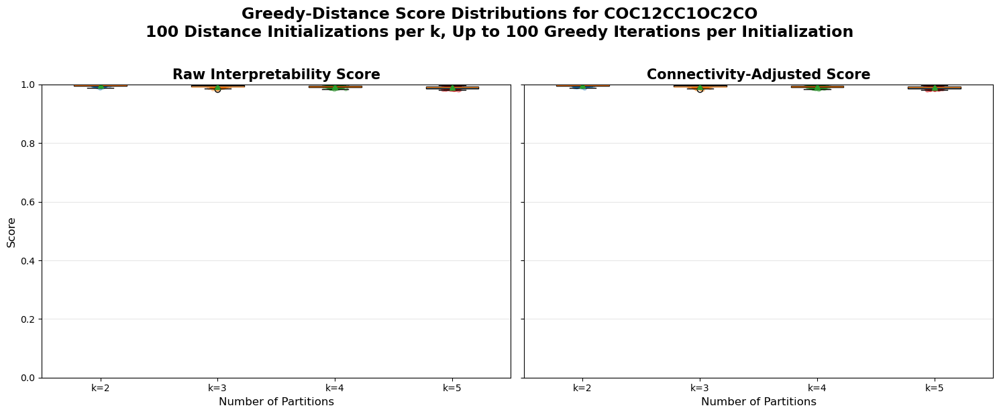

Saved score-versus-k plot to 'large_molecule_greedy_distance_100_initializations_score_vs_k.png'


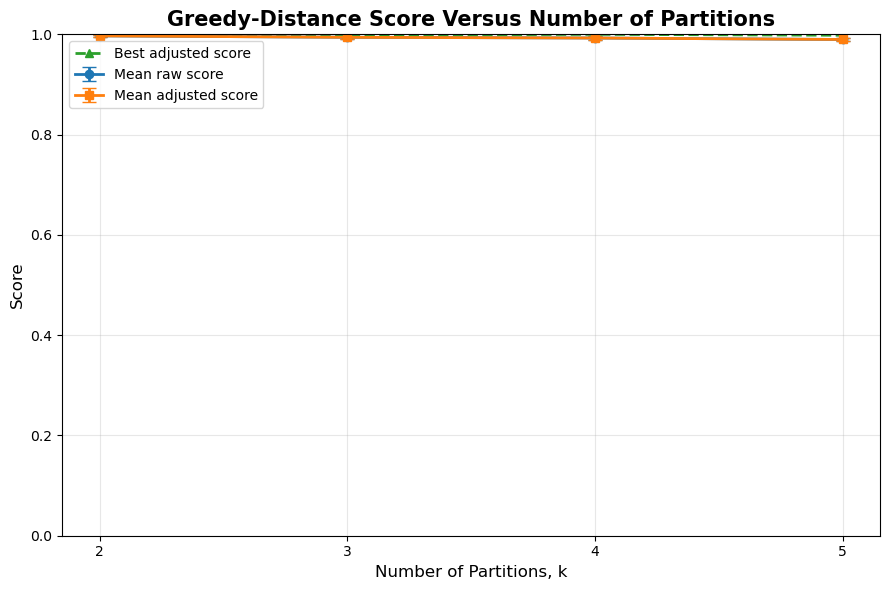


BEST GREEDY-DISTANCE RESULT FOR EACH k

k=2
  Best initialization: 3
  Seed: 20044
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fraction: 0.000000
  Cross-partition bonds: [11]
  Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 1, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0}

k=3
  Best initialization: 14
  Seed: 30055
  Raw score: 0.998264
  Connectivity penalty: 0.000000
  Adjusted score: 0.998264
  Within fraction: 0.996528
  Between fraction: 0.003472
  Higher fraction: 0.000000
  Cross-partition bonds: [0, 10]
  Partition: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 2, 10: 0, 11: 0, 12: 1, 13: 1, 14: 1, 15: 1, 16: 1, 17: 1, 18: 1}

k=4
  Best initialization: 58
  Seed: 40099
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fractio

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_VALUES = (2, 3, 4, 5)

# Number of independent distance-based starting partitions for each k.
N_INITIALIZATIONS = 100

# Maximum number of systematic best-neighbor greedy iterations per run.
GREEDY_ITERATIONS = 100

BASE_SEED = 42

CONNECTIVITY_WEIGHT = 0.10
DISCONNECTED_SINGLETON_WEIGHT = 2.0


# =============================================================================
# FIND THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule with size_label='Large' was found in selected_mols."
    )

large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < max(K_VALUES):
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot be divided into {max(K_VALUES)} nonempty partitions."
    )

print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Partition counts: {list(K_VALUES)}")
print(f"Independent initializations per k: {N_INITIALIZATIONS}")
print(f"Greedy iterations per initialization: {GREEDY_ITERATIONS}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print("=" * 80)


# =============================================================================
# RUN 100 GREEDY-DISTANCE INITIALIZATIONS FOR EACH k
# =============================================================================

greedy_distance_results = []

# Store the best interpretation found for each k.
best_interpretations = {}

for k in K_VALUES:

    print(f"\nRunning Greedy-Distance for k={k}...")

    optimizer_k = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=k,
        max_partitions=k,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    best_adjusted_score = -np.inf
    best_result = None

    for initialization_index in range(N_INITIALIZATIONS):

        # A different seed produces a different set of distance seed atoms.
        run_seed = (
            BASE_SEED
            + 10_000 * k
            + initialization_index
        )

        interpretation = optimizer_k.optimize_partition_distance(
            mol=large_mol,
            n_clusters=k,
            n_iterations=GREEDY_ITERATIONS,
            seed=run_seed,
            verbose=False,
        )

        partition = interpretation.partition
        actual_k = len(set(partition.values()))

        if actual_k != k:
            raise RuntimeError(
                f"Requested k={k}, but initialization "
                f"{initialization_index + 1} returned actual k={actual_k}."
            )

        connectivity_penalty = partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            ),
        )

        adjusted_score = connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            ),
        )

        within_sum = sum(
            interpretation.within_partition.values()
        )

        between_sum = sum(
            interpretation.between_partition.values()
        )

        higher_sum = sum(
            interpretation.higher_order.values()
        )

        breakdown = interpretation.get_contribution_breakdown()

        cross_partition_bonds = [
            bond.GetIdx()
            for bond in large_mol.GetBonds()
            if (
                partition[bond.GetBeginAtomIdx()]
                != partition[bond.GetEndAtomIdx()]
            )
        ]

        result = {
            "k": k,
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Actual k": actual_k,
            "Raw Score": interpretation.score,
            "Connectivity Penalty": connectivity_penalty,
            "Adjusted Score": adjusted_score,
            "Within Fraction": breakdown["within_frac"],
            "Between Fraction": breakdown["between_frac"],
            "Higher Fraction": breakdown["higher_frac"],
            "Within Sum": within_sum,
            "Between Sum": between_sum,
            "Higher Sum": higher_sum,
            "N Cross Bonds": len(cross_partition_bonds),
            "Cross Bonds": cross_partition_bonds,
            "Partition": partition.copy(),
            "Interpretation": interpretation,
        }

        greedy_distance_results.append(result)

        if adjusted_score > best_adjusted_score:
            best_adjusted_score = adjusted_score
            best_result = result

        if (
            initialization_index == 0
            or (initialization_index + 1) % 10 == 0
        ):
            print(
                f"  Completed {initialization_index + 1:3d}/"
                f"{N_INITIALIZATIONS}: "
                f"current adjusted={adjusted_score:.4f}, "
                f"best adjusted={best_adjusted_score:.4f}"
            )

    best_interpretations[k] = best_result

    print(
        f"  Best for k={k}: "
        f"raw={best_result['Raw Score']:.4f}, "
        f"penalty={best_result['Connectivity Penalty']:.4f}, "
        f"adjusted={best_result['Adjusted Score']:.4f}, "
        f"initialization={best_result['Initialization']}"
    )


# =============================================================================
# CONVERT RESULTS TO A DATAFRAME
# =============================================================================

greedy_distance_score_df = pd.DataFrame([
    {
        key: value
        for key, value in result.items()
        if key not in {
            "Partition",
            "Interpretation",
            "Cross Bonds",
        }
    }
    for result in greedy_distance_results
])

print("\nResult shape:")
print(greedy_distance_score_df.shape)

print("\nFirst rows:")
display(greedy_distance_score_df.head())


# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

greedy_distance_summary_df = (
    greedy_distance_score_df
    .groupby("k")
    .agg(
        N=("Adjusted Score", "size"),
        Raw_Mean=("Raw Score", "mean"),
        Raw_Std=("Raw Score", "std"),
        Raw_Min=("Raw Score", "min"),
        Raw_Max=("Raw Score", "max"),
        Adjusted_Mean=("Adjusted Score", "mean"),
        Adjusted_Std=("Adjusted Score", "std"),
        Adjusted_Min=("Adjusted Score", "min"),
        Adjusted_Max=("Adjusted Score", "max"),
        Penalty_Mean=("Connectivity Penalty", "mean"),
        Penalty_Std=("Connectivity Penalty", "std"),
        Cross_Bonds_Mean=("N Cross Bonds", "mean"),
        Cross_Bonds_Std=("N Cross Bonds", "std"),
    )
    .reset_index()
)

print("\n" + "=" * 80)
print("GREEDY-DISTANCE SCORE SUMMARY")
print("=" * 80)

display(greedy_distance_summary_df.round(6))


# =============================================================================
# PLOT RAW AND ADJUSTED SCORE DISTRIBUTIONS
# =============================================================================

raw_scores_by_k = [
    greedy_distance_score_df.loc[
        greedy_distance_score_df["k"] == k,
        "Raw Score"
    ].to_numpy()
    for k in K_VALUES
]

adjusted_scores_by_k = [
    greedy_distance_score_df.loc[
        greedy_distance_score_df["k"] == k,
        "Adjusted Score"
    ].to_numpy()
    for k in K_VALUES
]

fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15, 6),
    sharey=True,
)


# -----------------------------------------------------------------------------
# Raw score distributions
# -----------------------------------------------------------------------------

axes[0].boxplot(
    raw_scores_by_k,
    tick_labels=[f"k={k}" for k in K_VALUES],
    showmeans=True,
    meanline=False,
    patch_artist=True,
)

axes[0].set_title(
    "Raw Interpretability Score",
    fontsize=15,
    fontweight="bold",
)

axes[0].set_xlabel(
    "Number of Partitions",
    fontsize=12,
)

axes[0].set_ylabel(
    "Score",
    fontsize=12,
)

axes[0].set_ylim(0.0, 1.0)
axes[0].grid(axis="y", alpha=0.3)


# Add individual initialization scores with horizontal jitter.
jitter_rng = np.random.default_rng(BASE_SEED)

for position, scores in enumerate(
    raw_scores_by_k,
    start=1,
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[0].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18,
    )


# -----------------------------------------------------------------------------
# Adjusted score distributions
# -----------------------------------------------------------------------------

axes[1].boxplot(
    adjusted_scores_by_k,
    tick_labels=[f"k={k}" for k in K_VALUES],
    showmeans=True,
    meanline=False,
    patch_artist=True,
)

axes[1].set_title(
    "Connectivity-Adjusted Score",
    fontsize=15,
    fontweight="bold",
)

axes[1].set_xlabel(
    "Number of Partitions",
    fontsize=12,
)

axes[1].set_ylim(0.0, 1.0)
axes[1].grid(axis="y", alpha=0.3)

for position, scores in enumerate(
    adjusted_scores_by_k,
    start=1,
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[1].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18,
    )

fig.suptitle(
    f"Greedy-Distance Score Distributions for {large_smiles}\n"
    f"{N_INITIALIZATIONS} Distance Initializations per k, "
    f"Up to {GREEDY_ITERATIONS} Greedy Iterations per Initialization",
    fontsize=17,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()

score_distribution_filename = (
    "large_molecule_greedy_distance_"
    "100_initializations_score_distributions.png"
)

plt.savefig(
    score_distribution_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved score-distribution plot to "
    f"'{score_distribution_filename}'"
)

plt.show()


# =============================================================================
# PLOT MEAN SCORE VERSUS k
# =============================================================================

raw_mean = (
    greedy_distance_score_df
    .groupby("k")["Raw Score"]
    .mean()
    .reindex(K_VALUES)
)

raw_std = (
    greedy_distance_score_df
    .groupby("k")["Raw Score"]
    .std()
    .reindex(K_VALUES)
)

adjusted_mean = (
    greedy_distance_score_df
    .groupby("k")["Adjusted Score"]
    .mean()
    .reindex(K_VALUES)
)

adjusted_std = (
    greedy_distance_score_df
    .groupby("k")["Adjusted Score"]
    .std()
    .reindex(K_VALUES)
)

k_array = np.asarray(K_VALUES)

fig, ax = plt.subplots(
    figsize=(9, 6)
)

ax.errorbar(
    k_array,
    raw_mean.to_numpy(),
    yerr=raw_std.to_numpy(),
    marker="o",
    linewidth=2,
    capsize=5,
    label="Mean raw score",
)

ax.errorbar(
    k_array,
    adjusted_mean.to_numpy(),
    yerr=adjusted_std.to_numpy(),
    marker="s",
    linewidth=2,
    capsize=5,
    label="Mean adjusted score",
)

# Best adjusted score found among the 100 initializations.
best_adjusted_scores = np.asarray([
    best_interpretations[k]["Adjusted Score"]
    for k in K_VALUES
])

ax.plot(
    k_array,
    best_adjusted_scores,
    marker="^",
    linestyle="--",
    linewidth=2,
    label="Best adjusted score",
)

ax.set_title(
    "Greedy-Distance Score Versus Number of Partitions",
    fontsize=15,
    fontweight="bold",
)

ax.set_xlabel(
    "Number of Partitions, k",
    fontsize=12,
)

ax.set_ylabel(
    "Score",
    fontsize=12,
)

ax.set_xticks(K_VALUES)
ax.set_ylim(0.0, 1.0)
ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()

score_vs_k_filename = (
    "large_molecule_greedy_distance_"
    "100_initializations_score_vs_k.png"
)

plt.savefig(
    score_vs_k_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"Saved score-versus-k plot to "
    f"'{score_vs_k_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FOR EACH k
# =============================================================================

print("\n" + "=" * 80)
print("BEST GREEDY-DISTANCE RESULT FOR EACH k")
print("=" * 80)

for k in K_VALUES:
    result = best_interpretations[k]

    print(f"\nk={k}")

    print(
        f"  Best initialization: "
        f"{result['Initialization']}"
    )

    print(
        f"  Seed: "
        f"{result['Seed']}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Within fraction: "
        f"{result['Within Fraction']:.6f}"
    )

    print(
        f"  Between fraction: "
        f"{result['Between Fraction']:.6f}"
    )

    print(
        f"  Higher fraction: "
        f"{result['Higher Fraction']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    print(
        f"  Partition: "
        f"{result['Partition']}"
    )


# =============================================================================
# SAVE NUMERICAL RESULTS
# =============================================================================

greedy_distance_score_df.to_csv(
    "large_molecule_greedy_distance_"
    "100_initializations_scores.csv",
    index=False,
)

greedy_distance_summary_df.to_csv(
    "large_molecule_greedy_distance_"
    "100_initializations_summary.csv",
    index=False,
)

print("\nSaved numerical results to:")

print(
    "  large_molecule_greedy_distance_"
    "100_initializations_scores.csv"
)

print(
    "  large_molecule_greedy_distance_"
    "100_initializations_summary.csv"
)

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Requested partitions: k=4
Score lambda values: [0.01, 0.1, 0.5, 1.0, 1.5]
MH iterations per lambda: 5000
MH beta: 20.0
MH initialization: distance
MH seed: 42

Running Metropolis-Hastings with k=4, lambda=0.01...
  actual k=4, raw=0.9998, penalty=0.0000, adjusted=0.9998, cross bonds=3

Running Metropolis-Hastings with k=4, lambda=0.10...
  actual k=4, raw=0.9998, penalty=0.0000, adjusted=0.9998, cross bonds=3

Running Metropolis-Hastings with k=4, lambda=0.50...
  actual k=4, raw=0.9998, penalty=0.0000, adjusted=0.9998, cross bonds=3

Running Metropolis-Hastings with k=4, lambda=1.00...
  actual k=4, raw=0.9998, penalty=0.0000, adjusted=0.9998, cross bonds=3

Running Metropolis-Hastings with k=4, lambda=1.50...
  actual k=4, raw=0.9981, penalty=0.0000, adjusted=0.9981, cross bonds=3

Saved visualization to 'large_molecule_metropolis_hastings_k4_lambda_comparison.png'


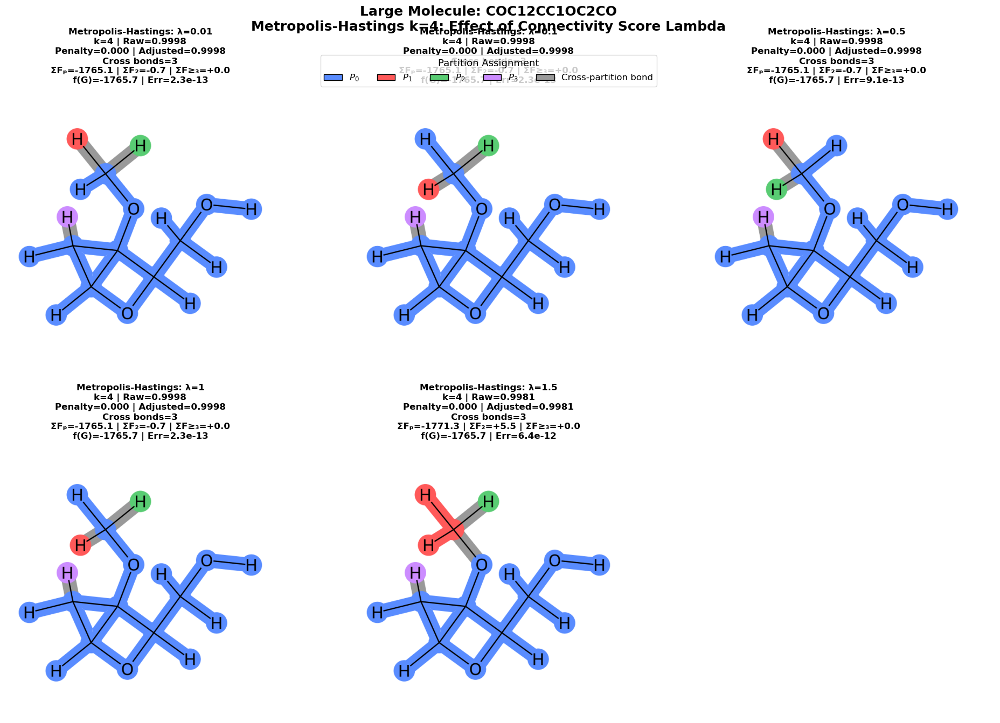


LAMBDA COMPARISON
  Lambda  Raw Score  Connectivity Penalty  Adjusted Score  Cross-Partition Bonds  Actual k
0.010000   0.999810              0.000000        0.999810                      3         4
0.100000   0.999810              0.000000        0.999810                      3         4
0.500000   0.999810              0.000000        0.999810                      3         4
1.000000   0.999810              0.000000        0.999810                      3         4
1.500000   0.998076              0.000000        0.998076                      3         4

PARTITION DETAILS BY LAMBDA

Lambda=0.01
  Raw score: 0.999810
  Connectivity penalty: 0.000000
  Adjusted score: 0.999810
  Cross-partition bonds: [10, 12, 13]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 13, 14, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1285.469
  P1: atoms=[9], symbols=['H'], F_1=-206.693
  P2: atoms=[11], symbols=['H'], F_2=-206.693
  P3: ato

In [29]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

SCORE_LAMBDAS = (
    0.01,
    0.10,
    0.50,
    1.00,
    1.50,
)

DISCONNECTED_SINGLETON_WEIGHT = 2.0

MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42


PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}


# =============================================================================
# SELECT THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule labeled 'Large' was found in selected_mols."
    )

large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < K_TO_PLOT:
    raise ValueError(
        f"The large molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_PLOT} nonempty partitions."
    )


print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Requested partitions: k={K_TO_PLOT}")
print(f"Score lambda values: {list(SCORE_LAMBDAS)}")
print(f"MH iterations per lambda: {MH_ITERATIONS}")
print(f"MH beta: {MH_BETA}")
print(f"MH initialization: {MH_INITIALIZATION}")
print(f"MH seed: {MH_SEED}")
print("=" * 80)


# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition.

    Bonds contained within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN METROPOLIS-HASTINGS FOR EACH SCORE LAMBDA
# =============================================================================

lambda_results = []

for score_lambda in SCORE_LAMBDAS:

    print(
        f"\nRunning Metropolis-Hastings with "
        f"k={K_TO_PLOT}, lambda={score_lambda:.2f}..."
    )

    # Each lambda must have its own optimizer because lambda is part
    # of the objective used during optimization.
    optimizer_lambda = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=score_lambda,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    interpretation = (
        optimizer_lambda
        .optimize_partition_metropolis_hastings(
            mol=large_mol,
            n_clusters=K_TO_PLOT,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    partition = interpretation.partition

    actual_k = len(
        set(partition.values())
    )

    if actual_k != K_TO_PLOT:
        raise RuntimeError(
            f"Lambda={score_lambda} requested k={K_TO_PLOT}, "
            f"but Metropolis-Hastings returned k={actual_k}."
        )

    connectivity_penalty = (
        partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    adjusted_score = (
        connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=score_lambda,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    # Count graph bonds that cross partition boundaries.
    cross_partition_bonds = [
        bond.GetIdx()
        for bond in large_mol.GetBonds()
        if (
            partition[bond.GetBeginAtomIdx()]
            != partition[bond.GetEndAtomIdx()]
        )
    ]

    lambda_results.append({
        "Lambda": score_lambda,
        "Partition": partition,
        "Interpretation": interpretation,
        "Actual k": actual_k,
        "Raw Score": interpretation.score,
        "Connectivity Penalty": connectivity_penalty,
        "Adjusted Score": adjusted_score,
        "Cross Bonds": cross_partition_bonds,
        "N Cross Bonds": len(cross_partition_bonds),
    })

    print(
        f"  actual k={actual_k}, "
        f"raw={interpretation.score:.4f}, "
        f"penalty={connectivity_penalty:.4f}, "
        f"adjusted={adjusted_score:.4f}, "
        f"cross bonds={len(cross_partition_bonds)}"
    )


# =============================================================================
# DRAW THE FIVE LAMBDA RESULTS
# =============================================================================

# Five panels: three on the first row and two on the second row.
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(20, 14),
    squeeze=False
)

axes = axes.reshape(-1)

for ax, result in zip(
    axes,
    lambda_results
):
    score_lambda = result["Lambda"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    image = mol_to_partition_image(
        mol=large_mol,
        partition=partition,
        img_size=(650, 650)
    )

    within_sum = sum(
        interpretation.within_partition.values()
    )

    between_sum = sum(
        interpretation.between_partition.values()
    )

    higher_sum = sum(
        interpretation.higher_order.values()
    )

    reconstructed_prediction = (
        within_sum
        + between_sum
        + higher_sum
    )

    decomposition_error = abs(
        reconstructed_prediction
        - interpretation.total_prediction
    )

    title = (
        f"Metropolis-Hastings: λ={score_lambda:g}\n"
        f"k={result['Actual k']} | "
        f"Raw={result['Raw Score']:.4f}\n"
        f"Penalty={result['Connectivity Penalty']:.3f} | "
        f"Adjusted={result['Adjusted Score']:.4f}\n"
        f"Cross bonds={result['N Cross Bonds']}\n"
        f"ΣFₚ={within_sum:+.1f} | "
        f"ΣF₂={between_sum:+.1f} | "
        f"ΣF≥₃={higher_sum:+.1f}\n"
        f"f(G)={reconstructed_prediction:+.1f} | "
        f"Err={decomposition_error:.1e}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=12,
        fontweight="bold",
        pad=12
    )


# Hide the sixth unused subplot.
for ax in axes[len(lambda_results):]:
    ax.axis("off")


# =============================================================================
# ADD COMMON LEGEND
# =============================================================================

legend_handles = [
    Patch(
        facecolor=PARTITION_COLORS[partition_id],
        edgecolor="black",
        label=fr"$P_{{{partition_id}}}$"
    )
    for partition_id in range(K_TO_PLOT)
]

# Add a gray legend item for boundary-crossing bonds.
legend_handles.append(
    Patch(
        facecolor=(0.60, 0.60, 0.60),
        edgecolor="black",
        label="Cross-partition bond"
    )
)

fig.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.925),
    ncol=len(legend_handles),
    fontsize=12,
    title="Partition Assignment",
    title_fontsize=13,
    frameon=True
)

fig.suptitle(
    f"Large Molecule: {large_smiles}\n"
    f"Metropolis-Hastings k={K_TO_PLOT}: "
    "Effect of Connectivity Score Lambda",
    fontsize=18,
    fontweight="bold",
    y=0.985
)

fig.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.04,
    top=0.87,
    hspace=0.32,
    wspace=0.10
)

output_filename = (
    "large_molecule_metropolis_hastings_"
    "k4_lambda_comparison.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PRINT COMPARISON TABLE
# =============================================================================

comparison_rows = []

for result in lambda_results:
    comparison_rows.append({
        "Lambda": result["Lambda"],
        "Raw Score": result["Raw Score"],
        "Connectivity Penalty": (
            result["Connectivity Penalty"]
        ),
        "Adjusted Score": result["Adjusted Score"],
        "Cross-Partition Bonds": result["N Cross Bonds"],
        "Actual k": result["Actual k"],
    })

comparison_df = pd.DataFrame(
    comparison_rows
)

print("\n" + "=" * 80)
print("LAMBDA COMPARISON")
print("=" * 80)

print(
    comparison_df.to_string(
        index=False,
        float_format=lambda value: f"{value:.6f}"
    )
)


# =============================================================================
# PRINT PARTITION DETAILS
# =============================================================================

print("\n" + "=" * 80)
print("PARTITION DETAILS BY LAMBDA")
print("=" * 80)

for result in lambda_results:

    score_lambda = result["Lambda"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    print(
        f"\nLambda={score_lambda:g}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    for partition_id in sorted(
        set(partition.values())
    ):
        atoms = [
            atom_idx
            for atom_idx, assigned_partition
            in partition.items()
            if assigned_partition == partition_id
        ]

        symbols = [
            large_mol
            .GetAtomWithIdx(atom_idx)
            .GetSymbol()
            for atom_idx in atoms
        ]

        within_contribution = (
            interpretation.within_partition.get(
                partition_id,
                0.0
            )
        )

        print(
            f"  P{partition_id}: "
            f"atoms={atoms}, "
            f"symbols={symbols}, "
            f"F_{partition_id}="
            f"{within_contribution:+.3f}"
        )

SELECTED TEST MOLECULE
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
Requested partitions: k=4
Score lambda values: [0.01, 0.1, 0.5, 1.0, 1.5]
MH iterations per lambda: 5000
MH beta: 20.0
MH initialization: distance
MH seed: 42

Running Metropolis-Hastings with k=4, lambda=0.01...
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
  actual k=4, raw=0.9994, penalty=0.0000, adjusted=0.9994, cross bonds=5

Running Metropolis-Hastings with k=4, lambda=0.10...
  actual k=4, raw=0.9985, penalty=0.0000, adjusted=0.9985, cross bonds=4

Running Metropolis-Hastings with k=4, lambda=0.50...
  actual k=4, raw=0.9985, penalty=0.0000, adjusted=0.9985, cross bonds=4

Running Metropolis-Hastings with k=4, lambda=1.00...
  actual k=4, raw=0.9981, penalty=0.0000, adjusted=0.9981, cross bonds=4

Running Metropolis-Hastings with k=4, lambda=1.50...
  actual k=4, raw=0.9945, penalty=0.0000, adjusted=0.9945, cross bonds=4

Saved visualization to 'l

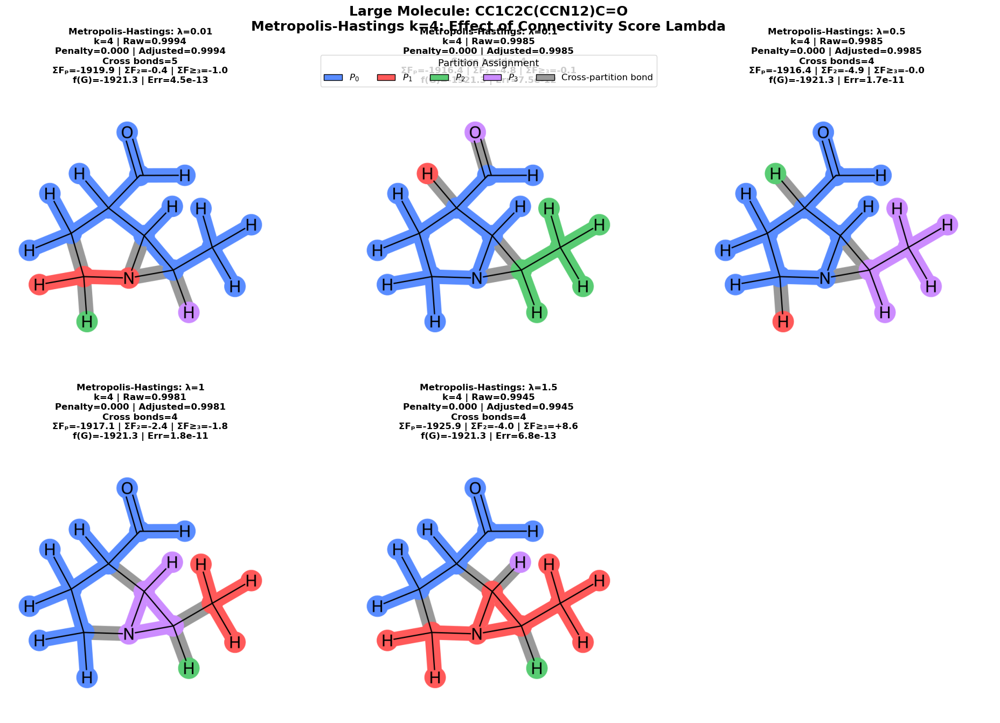


LAMBDA COMPARISON
  Lambda  Raw Score  Connectivity Penalty  Adjusted Score  Cross-Partition Bonds  Actual k
0.010000   0.999370              0.000000        0.999370                      5         4
0.100000   0.998488              0.000000        0.998488                      4         4
0.500000   0.998501              0.000000        0.998501                      4         4
1.000000   0.998128              0.000000        0.998128                      4         4
1.500000   0.994530              0.000000        0.994530                      4         4

PARTITION DETAILS BY LAMBDA

Lambda=0.01
  Raw score: 0.999370
  Connectivity penalty: 0.000000
  Adjusted score: 0.999370
  Cross-partition bonds: [4, 8, 9, 13, 19]
  P0: atoms=[0, 1, 2, 3, 4, 7, 8, 9, 10, 11, 13, 14, 15, 16, 19], symbols=['C', 'C', 'C', 'C', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1708.597
  P1: atoms=[5, 6, 17], symbols=['C', 'N', 'H'], F_1=-211.331
  P2: atoms=[18], symbols=['H'], F_2=+0.0

In [30]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

SCORE_LAMBDAS = (
    0.01,
    0.10,
    0.50,
    1.00,
    1.50,
)

DISCONNECTED_SINGLETON_WEIGHT = 2.0

MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42


PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}


# =============================================================================
# SELECT THE SPECIFIC TEST MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142
EXPECTED_SMILES = "CC1C2C(CCN12)C=O"

test_reset = test.reset_index(drop=True)

if TARGET_TEST_INDEX >= len(test_reset):
    raise IndexError(
        f"Test index {TARGET_TEST_INDEX} is out of range. "
        f"The reset test set contains {len(test_reset)} molecules."
    )

selected_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

large_mol = selected_row["mol"]
large_smiles = selected_row["smiles"]
large_size_label = "Selected Large Molecule"

if large_mol is None:
    raise ValueError(
        f"The molecule at test index {TARGET_TEST_INDEX} is None."
    )

# Confirm that the selected row is the intended molecule.
if large_smiles != EXPECTED_SMILES:
    raise ValueError(
        f"Unexpected molecule at test index {TARGET_TEST_INDEX}.\n"
        f"Expected SMILES: {EXPECTED_SMILES}\n"
        f"Found SMILES:    {large_smiles}"
    )

if large_mol.GetNumAtoms() < K_TO_PLOT:
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_PLOT} nonempty partitions."
    )


print("=" * 80)
print("SELECTED TEST MOLECULE")
print("=" * 80)
print(f"Test index: {TARGET_TEST_INDEX}")
print(f"SMILES: {large_smiles}")
print(f"Total atoms: {large_mol.GetNumAtoms()}")
print(f"Heavy atoms: {large_mol.GetNumHeavyAtoms()}")
print(f"Requested partitions: k={K_TO_PLOT}")
print(f"Score lambda values: {list(SCORE_LAMBDAS)}")
print(f"MH iterations per lambda: {MH_ITERATIONS}")
print(f"MH beta: {MH_BETA}")
print(f"MH initialization: {MH_INITIALIZATION}")
print(f"MH seed: {MH_SEED}")
print("=" * 80)

# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition.

    Bonds contained within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN METROPOLIS-HASTINGS FOR EACH SCORE LAMBDA
# =============================================================================

lambda_results = []

for score_lambda in SCORE_LAMBDAS:

    print(
        f"\nRunning Metropolis-Hastings with "
        f"k={K_TO_PLOT}, lambda={score_lambda:.2f}..."
    )

    # Each lambda must have its own optimizer because lambda is part
    # of the objective used during optimization.
    optimizer_lambda = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=score_lambda,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    interpretation = (
        optimizer_lambda
        .optimize_partition_metropolis_hastings(
            mol=large_mol,
            n_clusters=K_TO_PLOT,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    partition = interpretation.partition

    actual_k = len(
        set(partition.values())
    )

    if actual_k != K_TO_PLOT:
        raise RuntimeError(
            f"Lambda={score_lambda} requested k={K_TO_PLOT}, "
            f"but Metropolis-Hastings returned k={actual_k}."
        )

    connectivity_penalty = (
        partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    adjusted_score = (
        connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=score_lambda,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    # Count graph bonds that cross partition boundaries.
    cross_partition_bonds = [
        bond.GetIdx()
        for bond in large_mol.GetBonds()
        if (
            partition[bond.GetBeginAtomIdx()]
            != partition[bond.GetEndAtomIdx()]
        )
    ]

    lambda_results.append({
        "Lambda": score_lambda,
        "Partition": partition,
        "Interpretation": interpretation,
        "Actual k": actual_k,
        "Raw Score": interpretation.score,
        "Connectivity Penalty": connectivity_penalty,
        "Adjusted Score": adjusted_score,
        "Cross Bonds": cross_partition_bonds,
        "N Cross Bonds": len(cross_partition_bonds),
    })

    print(
        f"  actual k={actual_k}, "
        f"raw={interpretation.score:.4f}, "
        f"penalty={connectivity_penalty:.4f}, "
        f"adjusted={adjusted_score:.4f}, "
        f"cross bonds={len(cross_partition_bonds)}"
    )


# =============================================================================
# DRAW THE FIVE LAMBDA RESULTS
# =============================================================================

# Five panels: three on the first row and two on the second row.
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(20, 14),
    squeeze=False
)

axes = axes.reshape(-1)

for ax, result in zip(
    axes,
    lambda_results
):
    score_lambda = result["Lambda"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    image = mol_to_partition_image(
        mol=large_mol,
        partition=partition,
        img_size=(650, 650)
    )

    within_sum = sum(
        interpretation.within_partition.values()
    )

    between_sum = sum(
        interpretation.between_partition.values()
    )

    higher_sum = sum(
        interpretation.higher_order.values()
    )

    reconstructed_prediction = (
        within_sum
        + between_sum
        + higher_sum
    )

    decomposition_error = abs(
        reconstructed_prediction
        - interpretation.total_prediction
    )

    title = (
        f"Metropolis-Hastings: λ={score_lambda:g}\n"
        f"k={result['Actual k']} | "
        f"Raw={result['Raw Score']:.4f}\n"
        f"Penalty={result['Connectivity Penalty']:.3f} | "
        f"Adjusted={result['Adjusted Score']:.4f}\n"
        f"Cross bonds={result['N Cross Bonds']}\n"
        f"ΣFₚ={within_sum:+.1f} | "
        f"ΣF₂={between_sum:+.1f} | "
        f"ΣF≥₃={higher_sum:+.1f}\n"
        f"f(G)={reconstructed_prediction:+.1f} | "
        f"Err={decomposition_error:.1e}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=12,
        fontweight="bold",
        pad=12
    )


# Hide the sixth unused subplot.
for ax in axes[len(lambda_results):]:
    ax.axis("off")


# =============================================================================
# ADD COMMON LEGEND
# =============================================================================

legend_handles = [
    Patch(
        facecolor=PARTITION_COLORS[partition_id],
        edgecolor="black",
        label=fr"$P_{{{partition_id}}}$"
    )
    for partition_id in range(K_TO_PLOT)
]

# Add a gray legend item for boundary-crossing bonds.
legend_handles.append(
    Patch(
        facecolor=(0.60, 0.60, 0.60),
        edgecolor="black",
        label="Cross-partition bond"
    )
)

fig.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.925),
    ncol=len(legend_handles),
    fontsize=12,
    title="Partition Assignment",
    title_fontsize=13,
    frameon=True
)

fig.suptitle(
    f"Large Molecule: {large_smiles}\n"
    f"Metropolis-Hastings k={K_TO_PLOT}: "
    "Effect of Connectivity Score Lambda",
    fontsize=18,
    fontweight="bold",
    y=0.985
)

fig.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.04,
    top=0.87,
    hspace=0.32,
    wspace=0.10
)

output_filename = (
    "large_molecule_metropolis_hastings_"
    "k4_lambda_comparison.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PRINT COMPARISON TABLE
# =============================================================================

comparison_rows = []

for result in lambda_results:
    comparison_rows.append({
        "Lambda": result["Lambda"],
        "Raw Score": result["Raw Score"],
        "Connectivity Penalty": (
            result["Connectivity Penalty"]
        ),
        "Adjusted Score": result["Adjusted Score"],
        "Cross-Partition Bonds": result["N Cross Bonds"],
        "Actual k": result["Actual k"],
    })

comparison_df = pd.DataFrame(
    comparison_rows
)

print("\n" + "=" * 80)
print("LAMBDA COMPARISON")
print("=" * 80)

print(
    comparison_df.to_string(
        index=False,
        float_format=lambda value: f"{value:.6f}"
    )
)


# =============================================================================
# PRINT PARTITION DETAILS
# =============================================================================

print("\n" + "=" * 80)
print("PARTITION DETAILS BY LAMBDA")
print("=" * 80)

for result in lambda_results:

    score_lambda = result["Lambda"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    print(
        f"\nLambda={score_lambda:g}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    for partition_id in sorted(
        set(partition.values())
    ):
        atoms = [
            atom_idx
            for atom_idx, assigned_partition
            in partition.items()
            if assigned_partition == partition_id
        ]

        symbols = [
            large_mol
            .GetAtomWithIdx(atom_idx)
            .GetSymbol()
            for atom_idx in atoms
        ]

        within_contribution = (
            interpretation.within_partition.get(
                partition_id,
                0.0
            )
        )

        print(
            f"  P{partition_id}: "
            f"atoms={atoms}, "
            f"symbols={symbols}, "
            f"F_{partition_id}="
            f"{within_contribution:+.3f}"
        )

SELECTED TEST MOLECULE
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
Requested partitions: k=4
Connectivity weight: 0.1
MH beta values: [0.1, 1.0, 5.0, 20.0, 50.0, 100.0]
MH iterations per beta: 5000
MH initialization: distance
MH seed: 42

Running Metropolis-Hastings with k=4, beta=0.1...
  actual k=4, raw=0.9988, penalty=0.0000, adjusted=0.9988, cross bonds=3

Running Metropolis-Hastings with k=4, beta=1...
  actual k=4, raw=0.9995, penalty=0.0000, adjusted=0.9995, cross bonds=4

Running Metropolis-Hastings with k=4, beta=5...
  actual k=4, raw=0.9989, penalty=0.0000, adjusted=0.9989, cross bonds=4

Running Metropolis-Hastings with k=4, beta=20...
  actual k=4, raw=0.9985, penalty=0.0000, adjusted=0.9985, cross bonds=4

Running Metropolis-Hastings with k=4, beta=50...
  actual k=4, raw=0.9985, penalty=0.0000, adjusted=0.9985, cross bonds=4

Running Metropolis-Hastings with k=4, beta=100...
  actual k=4, raw=0.9992, penalty=0.0000, adjusted=0.9992, cross bo

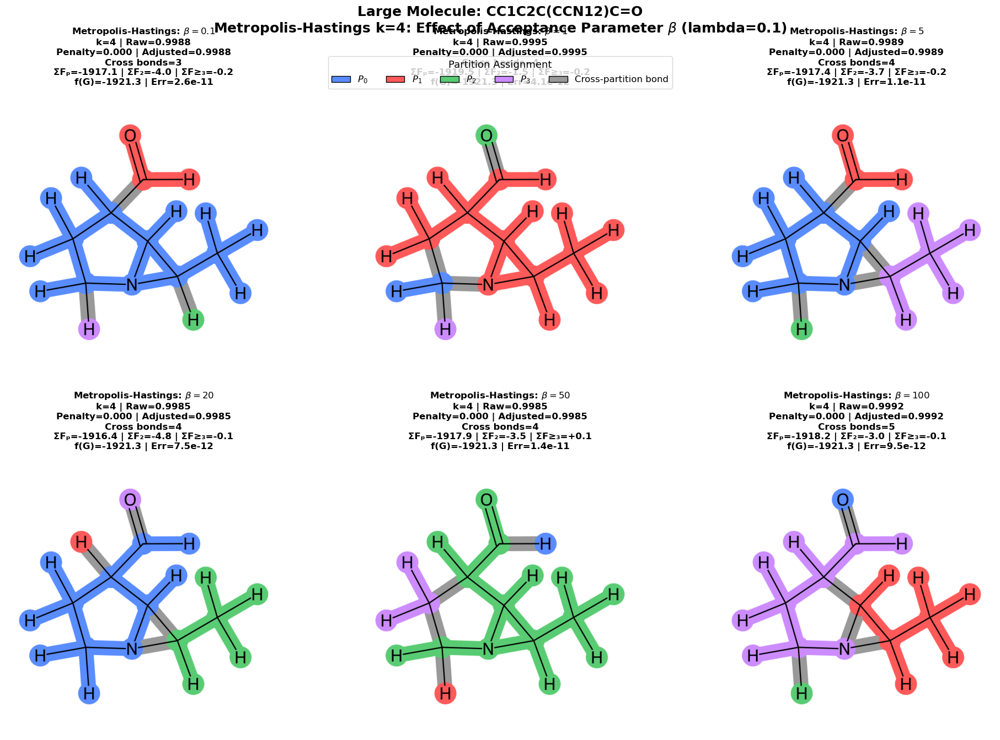


METROPOLIS-HASTINGS BETA COMPARISON
      Beta  Raw Score  Connectivity Penalty  Adjusted Score  Cross-Partition Bonds  Actual k
  0.100000   0.998848              0.000000        0.998848                      3         4
  1.000000   0.999483              0.000000        0.999483                      4         4
  5.000000   0.998911              0.000000        0.998911                      4         4
 20.000000   0.998488              0.000000        0.998488                      4         4
 50.000000   0.998508              0.000000        0.998508                      4         4
100.000000   0.999156              0.000000        0.999156                      5         4

PARTITION DETAILS BY BETA

Beta=0.1
  Raw score: 0.998848
  Connectivity penalty: 0.000000
  Adjusted score: 0.998848
  Cross-partition bonds: [6, 13, 19]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 9, 10, 11, 13, 14, 15, 16, 17], symbols=['C', 'C', 'C', 'C', 'C', 'C', 'N', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-

In [58]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

# Keep lambda / connectivity weight FIXED.
CONNECTIVITY_WEIGHT = 0.10

DISCONNECTED_SINGLETON_WEIGHT = 2.0

# Vary the Metropolis-Hastings acceptance parameter beta.
MH_BETAS = (
    0.1,
    1.0,
    5.0,
    20.0,
    50.0,
    100.0
)

MH_ITERATIONS = 5000
MH_INITIALIZATION = "distance"
MH_SEED = 42

# =============================================================================
# PARTITION COLORS
# =============================================================================

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}

# =============================================================================
# SELECT THE SPECIFIC TEST MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142
EXPECTED_SMILES = "CC1C2C(CCN12)C=O"

test_reset = test.reset_index(drop=True)

if TARGET_TEST_INDEX >= len(test_reset):
    raise IndexError(
        f"Test index {TARGET_TEST_INDEX} is out of range. "
        f"The reset test set contains {len(test_reset)} molecules."
    )

selected_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

large_mol = selected_row["mol"]
large_smiles = selected_row["smiles"]
large_size_label = "Selected Large Molecule"

if large_mol is None:
    raise ValueError(
        f"The molecule at test index {TARGET_TEST_INDEX} is None."
    )

# Confirm that the selected row is the intended molecule.
if large_smiles != EXPECTED_SMILES:
    raise ValueError(
        f"Unexpected molecule at test index {TARGET_TEST_INDEX}.\n"
        f"Expected SMILES: {EXPECTED_SMILES}\n"
        f"Found SMILES:    {large_smiles}"
    )

if large_mol.GetNumAtoms() < K_TO_PLOT:
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_PLOT} nonempty partitions."
    )


print("=" * 80)
print("SELECTED TEST MOLECULE")
print("=" * 80)
print(f"Test index: {TARGET_TEST_INDEX}")
print(f"SMILES: {large_smiles}")
print(f"Total atoms: {large_mol.GetNumAtoms()}")
print(f"Heavy atoms: {large_mol.GetNumHeavyAtoms()}")
print(f"Requested partitions: k={K_TO_PLOT}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print(f"MH beta values: {list(MH_BETAS)}")
print(f"MH iterations per beta: {MH_ITERATIONS}")
print(f"MH initialization: {MH_INITIALIZATION}")
print(f"MH seed: {MH_SEED}")
print("=" * 80)

# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition.

    Bonds contained within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN METROPOLIS-HASTINGS FOR EACH BETA
# =============================================================================

beta_results = []

for mh_beta in MH_BETAS:

    print(
        f"\nRunning Metropolis-Hastings with "
        f"k={K_TO_PLOT}, beta={mh_beta:g}..."
    )

    # Lambda / connectivity weight stays fixed.
    optimizer_beta = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    interpretation = (
        optimizer_beta
        .optimize_partition_metropolis_hastings(
            mol=large_mol,
            n_clusters=K_TO_PLOT,
            n_iterations=MH_ITERATIONS,
            beta=mh_beta,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )

    partition = interpretation.partition

    actual_k = len(
        set(partition.values())
    )

    if actual_k != K_TO_PLOT:
        raise RuntimeError(
            f"Beta={mh_beta:g} requested k={K_TO_PLOT}, "
            f"but Metropolis-Hastings returned k={actual_k}."
        )

    connectivity_penalty = (
        partition_connectivity_penalty(
            mol=large_mol,
            partition=partition,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    # IMPORTANT:
    # beta does NOT enter the score formula.
    # It only changes MH acceptance/rejection behavior.
    adjusted_score = (
        connectivity_adjusted_score(
            mol=large_mol,
            interpretation=interpretation,
            connectivity_weight=CONNECTIVITY_WEIGHT,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            )
        )
    )

    cross_partition_bonds = [
        bond.GetIdx()
        for bond in large_mol.GetBonds()
        if (
            partition[bond.GetBeginAtomIdx()]
            != partition[bond.GetEndAtomIdx()]
        )
    ]

    beta_results.append({
        "Beta": mh_beta,
        "Partition": partition,
        "Interpretation": interpretation,
        "Actual k": actual_k,
        "Raw Score": interpretation.score,
        "Connectivity Penalty": connectivity_penalty,
        "Adjusted Score": adjusted_score,
        "Cross Bonds": cross_partition_bonds,
        "N Cross Bonds": len(cross_partition_bonds),
    })

    print(
        f"  actual k={actual_k}, "
        f"raw={interpretation.score:.4f}, "
        f"penalty={connectivity_penalty:.4f}, "
        f"adjusted={adjusted_score:.4f}, "
        f"cross bonds={len(cross_partition_bonds)}"
    )


# =============================================================================
# DRAW THE BETA RESULTS
# =============================================================================

n_results = len(beta_results)
n_cols = 3
n_rows = (n_results + n_cols - 1) // n_cols

fig, axes = plt.subplots(
    nrows=n_rows,
    ncols=n_cols,
    figsize=(20, 7 * n_rows),
    squeeze=False
)

axes = axes.reshape(-1)

for ax, result in zip(
    axes,
    beta_results
):
    mh_beta = result["Beta"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    image = mol_to_partition_image(
        mol=large_mol,
        partition=partition,
        img_size=(650, 650)
    )

    within_sum = sum(
        interpretation.within_partition.values()
    )

    between_sum = sum(
        interpretation.between_partition.values()
    )

    higher_sum = sum(
        interpretation.higher_order.values()
    )

    reconstructed_prediction = (
        within_sum
        + between_sum
        + higher_sum
    )

    decomposition_error = abs(
        reconstructed_prediction
        - interpretation.total_prediction
    )

    title = (
        f"Metropolis-Hastings: "
        rf"$\beta={mh_beta:g}$"
        "\n"
        f"k={result['Actual k']} | "
        f"Raw={result['Raw Score']:.4f}\n"
        f"Penalty={result['Connectivity Penalty']:.3f} | "
        f"Adjusted={result['Adjusted Score']:.4f}\n"
        f"Cross bonds={result['N Cross Bonds']}\n"
        f"ΣFₚ={within_sum:+.1f} | "
        f"ΣF₂={between_sum:+.1f} | "
        f"ΣF≥₃={higher_sum:+.1f}\n"
        f"f(G)={reconstructed_prediction:+.1f} | "
        f"Err={decomposition_error:.1e}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=12,
        fontweight="bold",
        pad=12
    )

for ax in axes[len(beta_results):]:
    ax.axis("off")


# =============================================================================
# ADD COMMON LEGEND
# =============================================================================

legend_handles = [
    Patch(
        facecolor=PARTITION_COLORS[partition_id],
        edgecolor="black",
        label=fr"$P_{{{partition_id}}}$"
    )
    for partition_id in range(K_TO_PLOT)
]

# Add a gray legend item for boundary-crossing bonds.
legend_handles.append(
    Patch(
        facecolor=(0.60, 0.60, 0.60),
        edgecolor="black",
        label="Cross-partition bond"
    )
)

fig.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.925),
    ncol=len(legend_handles),
    fontsize=12,
    title="Partition Assignment",
    title_fontsize=13,
    frameon=True
)

fig.suptitle(
    f"Large Molecule: {large_smiles}\n"
    f"Metropolis-Hastings k={K_TO_PLOT}: "
    rf"Effect of Acceptance Parameter $\beta$ "
    f"(lambda={CONNECTIVITY_WEIGHT:g})",
    fontsize=18,
    fontweight="bold",
    y=0.985
)

output_filename = (
    "large_molecule_metropolis_hastings_"
    "k4_beta_comparison.png"
)

fig.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.04,
    top=0.87,
    hspace=0.32,
    wspace=0.10
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PRINT BETA COMPARISON TABLE
# =============================================================================

comparison_rows = []

for result in beta_results:
    comparison_rows.append({
        "Beta": result["Beta"],
        "Raw Score": result["Raw Score"],
        "Connectivity Penalty": (
            result["Connectivity Penalty"]
        ),
        "Adjusted Score": result["Adjusted Score"],
        "Cross-Partition Bonds": result["N Cross Bonds"],
        "Actual k": result["Actual k"],
    })

comparison_df = pd.DataFrame(
    comparison_rows
)

print("\n" + "=" * 80)
print("METROPOLIS-HASTINGS BETA COMPARISON")
print("=" * 80)

print(
    comparison_df.to_string(
        index=False,
        float_format=lambda value: f"{value:.6f}"
    )
)


# =============================================================================
# PRINT PARTITION DETAILS
# =============================================================================

print("\n" + "=" * 80)
print("PARTITION DETAILS BY BETA")
print("=" * 80)

for result in beta_results:

    mh_beta = result["Beta"]
    partition = result["Partition"]
    interpretation = result["Interpretation"]

    print(
        f"\nBeta={mh_beta:g}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    for partition_id in sorted(
        set(partition.values())
    ):
        atoms = [
            atom_idx
            for atom_idx, assigned_partition
            in partition.items()
            if assigned_partition == partition_id
        ]

        symbols = [
            large_mol
            .GetAtomWithIdx(atom_idx)
            .GetSymbol()
            for atom_idx in atoms
        ]

        within_contribution = (
            interpretation.within_partition.get(
                partition_id,
                0.0
            )
        )

        print(
            f"  P{partition_id}: "
            f"atoms={atoms}, "
            f"symbols={symbols}, "
            f"F_{partition_id}="
            f"{within_contribution:+.3f}"
        )

SELECTED TEST MOLECULE
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
Requested partitions: k=4
Connectivity weight: 0.1
MH beta values: [0.1, 1.0, 5.0, 20.0, 50.0]
MH iterations per beta: 5000
MH initialization: distance
MH seed: 42
METROPOLIS-HASTINGS BETA DISTRIBUTION EXPERIMENT
Number of beta values: 5
Independent initializations per beta: 100
MH iterations per initialization: 5000
Total MH runs: 500
k = 4
Connectivity weight lambda = 0.1

Beta = 0.1
  Completed  20/100 initializations
  Completed  40/100 initializations
  Completed  60/100 initializations
  Completed  80/100 initializations
  Completed 100/100 initializations

  Beta=0.1 summary:
    Mean adjusted score: 0.999073
    Std:                 0.000346
    Median:              0.999076
    Min:                 0.997903
    Max:                 0.999630

Beta = 1
  Completed  20/100 initializations
  Completed  40/100 initializations
  Completed  60/100 initializations
  Completed  80/100 initi

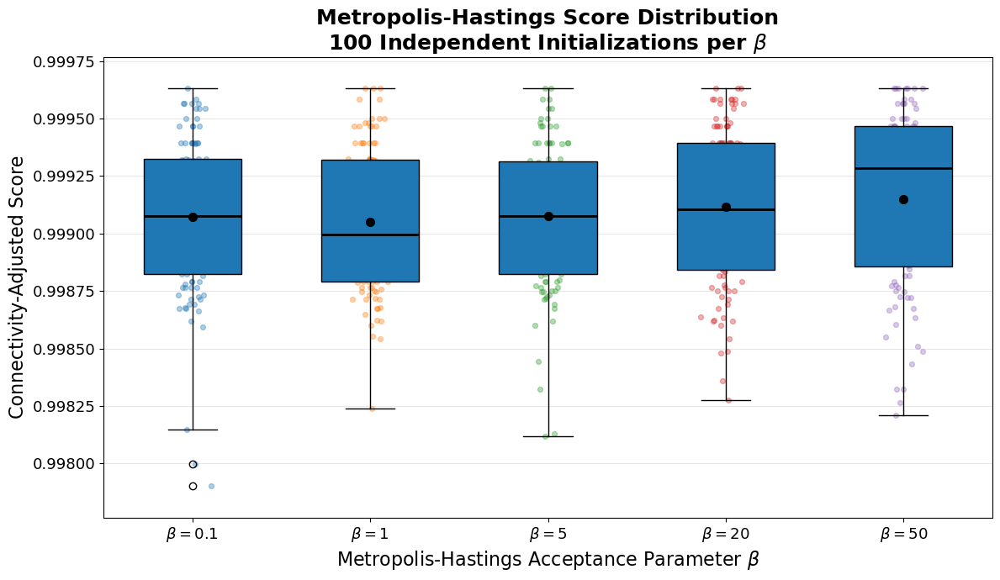

Saved mean-score plot to 'mh_beta_mean_adjusted_score_100_initializations.png'


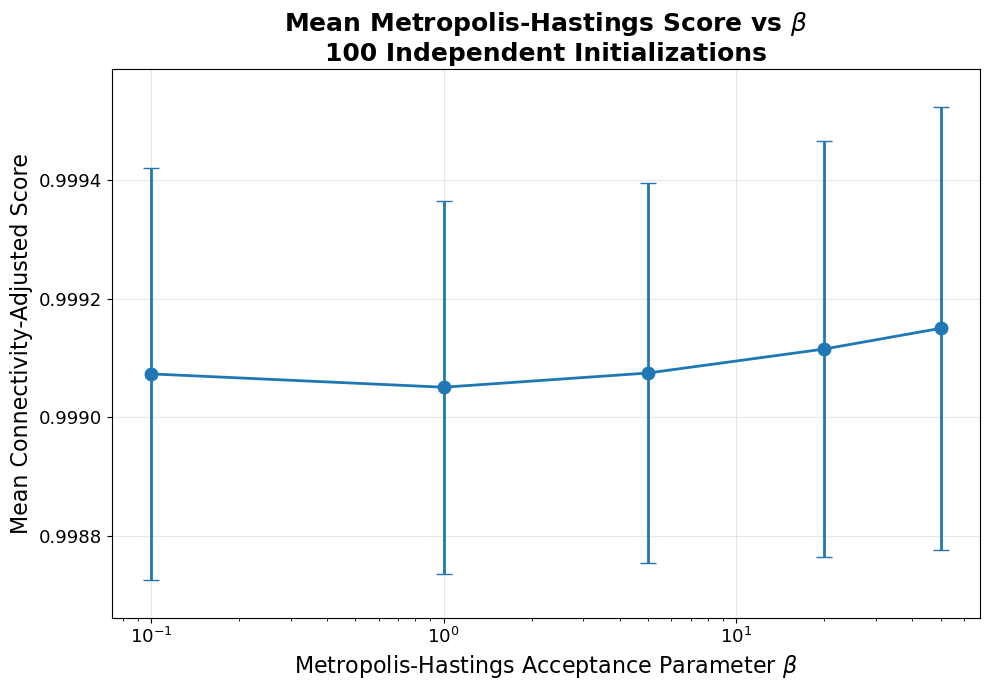


BEST BETA BASED ON MEAN ADJUSTED SCORE
Beta: 50
Mean adjusted score: 0.999150
Standard deviation: 0.000372
Best observed score: 0.999630

Saved:
  mh_beta_100_initializations_detailed.csv
  mh_beta_100_initializations_summary.csv


In [32]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

# Keep lambda / connectivity weight FIXED.
CONNECTIVITY_WEIGHT = 0.10

DISCONNECTED_SINGLETON_WEIGHT = 2.0

# Vary the Metropolis-Hastings acceptance parameter beta.
MH_BETAS = (
    0.1,
    1.0,
    5.0,
    20.0,
    50.0,
)

MH_ITERATIONS = 5000
MH_INITIALIZATION = "distance"
MH_SEED = 42

# =============================================================================
# PARTITION COLORS
# =============================================================================

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}

# =============================================================================
# SELECT THE SPECIFIC TEST MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142
EXPECTED_SMILES = "CC1C2C(CCN12)C=O"

test_reset = test.reset_index(drop=True)

if TARGET_TEST_INDEX >= len(test_reset):
    raise IndexError(
        f"Test index {TARGET_TEST_INDEX} is out of range. "
        f"The reset test set contains {len(test_reset)} molecules."
    )

selected_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

large_mol = selected_row["mol"]
large_smiles = selected_row["smiles"]
large_size_label = "Selected Large Molecule"

if large_mol is None:
    raise ValueError(
        f"The molecule at test index {TARGET_TEST_INDEX} is None."
    )

# Confirm that the selected row is the intended molecule.
if large_smiles != EXPECTED_SMILES:
    raise ValueError(
        f"Unexpected molecule at test index {TARGET_TEST_INDEX}.\n"
        f"Expected SMILES: {EXPECTED_SMILES}\n"
        f"Found SMILES:    {large_smiles}"
    )

if large_mol.GetNumAtoms() < K_TO_PLOT:
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_PLOT} nonempty partitions."
    )


print("=" * 80)
print("SELECTED TEST MOLECULE")
print("=" * 80)
print(f"Test index: {TARGET_TEST_INDEX}")
print(f"SMILES: {large_smiles}")
print(f"Total atoms: {large_mol.GetNumAtoms()}")
print(f"Heavy atoms: {large_mol.GetNumHeavyAtoms()}")
print(f"Requested partitions: k={K_TO_PLOT}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print(f"MH beta values: {list(MH_BETAS)}")
print(f"MH iterations per beta: {MH_ITERATIONS}")
print(f"MH initialization: {MH_INITIALIZATION}")
print(f"MH seed: {MH_SEED}")
print("=" * 80)

# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition.

    Bonds contained within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN 100 INDEPENDENT METROPOLIS-HASTINGS INITIALIZATIONS FOR EACH BETA
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# -----------------------------------------------------------------------------
# SETTINGS
# -----------------------------------------------------------------------------

N_INITIALIZATIONS = 100

# Starting seed used to generate the 100 independent runs.
BASE_SEED = 42

# Generate 100 different reproducible seeds.
INITIALIZATION_SEEDS = [
    BASE_SEED + initialization_index
    for initialization_index in range(N_INITIALIZATIONS)
]


print("=" * 80)
print("METROPOLIS-HASTINGS BETA DISTRIBUTION EXPERIMENT")
print("=" * 80)

print(
    f"Number of beta values: "
    f"{len(MH_BETAS)}"
)

print(
    f"Independent initializations per beta: "
    f"{N_INITIALIZATIONS}"
)

print(
    f"MH iterations per initialization: "
    f"{MH_ITERATIONS}"
)

print(
    f"Total MH runs: "
    f"{len(MH_BETAS) * N_INITIALIZATIONS}"
)

print(
    f"k = {K_TO_PLOT}"
)

print(
    f"Connectivity weight lambda = "
    f"{CONNECTIVITY_WEIGHT}"
)

print("=" * 80)


# =============================================================================
# STORE RESULTS
# =============================================================================

beta_run_results = []


# =============================================================================
# RUN EXPERIMENT
# =============================================================================

for beta_index, mh_beta in enumerate(MH_BETAS):

    print(
        f"\n{'=' * 80}"
    )

    print(
        f"Beta = {mh_beta:g}"
    )

    print(
        f"{'=' * 80}"
    )

    beta_scores = []

    # -------------------------------------------------------------------------
    # Optimizer settings remain identical for all 100 runs.
    # -------------------------------------------------------------------------

    optimizer_beta = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    # -------------------------------------------------------------------------
    # 100 independent initializations
    # -------------------------------------------------------------------------

    for initialization_index, seed in enumerate(
        INITIALIZATION_SEEDS,
        start=1
    ):

        # ---------------------------------------------------------------------
        # Run Metropolis-Hastings.
        #
        # Because the seed changes on every run:
        #
        #   1. distance initialization can select different seed atoms;
        #   2. the MH proposal sequence changes;
        #   3. the MH random accept/reject draws change.
        #
        # Thus each run is an independent stochastic search.
        # ---------------------------------------------------------------------

        interpretation = (
            optimizer_beta
            .optimize_partition_metropolis_hastings(
                mol=large_mol,
                n_clusters=K_TO_PLOT,
                n_iterations=MH_ITERATIONS,
                beta=mh_beta,
                initialization=MH_INITIALIZATION,
                seed=seed,
                verbose=False
            )
        )

        partition = (
            interpretation.partition
        )

        actual_k = len(
            set(
                partition.values()
            )
        )

        # ---------------------------------------------------------------------
        # Verify that exactly four partitions remain.
        # ---------------------------------------------------------------------

        if actual_k != K_TO_PLOT:

            raise RuntimeError(
                f"Beta={mh_beta:g}, "
                f"initialization={initialization_index}, "
                f"seed={seed}: "
                f"requested k={K_TO_PLOT}, "
                f"but MH returned k={actual_k}."
            )

        # ---------------------------------------------------------------------
        # Connectivity penalty
        # ---------------------------------------------------------------------

        connectivity_penalty = (
            partition_connectivity_penalty(
                mol=large_mol,
                partition=partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # ---------------------------------------------------------------------
        # Connectivity-adjusted score
        #
        # beta does NOT appear in this formula.
        #
        # beta affects which partitions MH explores and accepts.
        # lambda remains fixed at CONNECTIVITY_WEIGHT.
        # ---------------------------------------------------------------------

        adjusted_score = (
            connectivity_adjusted_score(
                mol=large_mol,
                interpretation=interpretation,
                connectivity_weight=(
                    CONNECTIVITY_WEIGHT
                ),
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # ---------------------------------------------------------------------
        # Count partition-boundary bonds.
        # ---------------------------------------------------------------------

        cross_partition_bonds = [
            bond.GetIdx()
            for bond in large_mol.GetBonds()
            if (
                partition[
                    bond.GetBeginAtomIdx()
                ]
                !=
                partition[
                    bond.GetEndAtomIdx()
                ]
            )
        ]

        # ---------------------------------------------------------------------
        # Store this independent run.
        # ---------------------------------------------------------------------

        beta_run_results.append({
            "Beta": mh_beta,
            "Initialization": initialization_index,
            "Seed": seed,
            "Raw Score": interpretation.score,
            "Connectivity Penalty": (
                connectivity_penalty
            ),
            "Adjusted Score": (
                adjusted_score
            ),
            "Cross-Partition Bonds": (
                len(cross_partition_bonds)
            ),
            "Actual k": actual_k,
            "Partition": partition,
            "Interpretation": interpretation,
        })

        beta_scores.append(
            adjusted_score
        )

        # ---------------------------------------------------------------------
        # Progress output every 20 runs.
        # ---------------------------------------------------------------------

        if (
            initialization_index % 20 == 0
            or initialization_index
            == N_INITIALIZATIONS
        ):

            print(
                f"  Completed "
                f"{initialization_index:3d}/"
                f"{N_INITIALIZATIONS} "
                f"initializations"
            )

    # -------------------------------------------------------------------------
    # Summary for this beta.
    # -------------------------------------------------------------------------

    beta_scores = np.asarray(
        beta_scores
    )

    print(
        f"\n  Beta={mh_beta:g} summary:"
    )

    print(
        f"    Mean adjusted score: "
        f"{beta_scores.mean():.6f}"
    )

    print(
        f"    Std:                 "
        f"{beta_scores.std(ddof=1):.6f}"
    )

    print(
        f"    Median:              "
        f"{np.median(beta_scores):.6f}"
    )

    print(
        f"    Min:                 "
        f"{beta_scores.min():.6f}"
    )

    print(
        f"    Max:                 "
        f"{beta_scores.max():.6f}"
    )


# =============================================================================
# CONVERT RESULTS TO DATAFRAME
# =============================================================================

beta_results_df = pd.DataFrame(
    beta_run_results
)


# =============================================================================
# CREATE SUMMARY TABLE
# =============================================================================

beta_summary_df = (
    beta_results_df
    .groupby(
        "Beta",
        as_index=False
    )
    .agg(
        N=(
            "Adjusted Score",
            "count"
        ),
        Mean_Adjusted_Score=(
            "Adjusted Score",
            "mean"
        ),
        Std_Adjusted_Score=(
            "Adjusted Score",
            "std"
        ),
        Median_Adjusted_Score=(
            "Adjusted Score",
            "median"
        ),
        Min_Adjusted_Score=(
            "Adjusted Score",
            "min"
        ),
        Max_Adjusted_Score=(
            "Adjusted Score",
            "max"
        ),
        Mean_Raw_Score=(
            "Raw Score",
            "mean"
        ),
        Mean_Connectivity_Penalty=(
            "Connectivity Penalty",
            "mean"
        )
    )
)


print(
    "\n"
    + "=" * 100
)

print(
    "METROPOLIS-HASTINGS SCORE DISTRIBUTION BY BETA"
)

print(
    "=" * 100
)

print(
    beta_summary_df.to_string(
        index=False,
        float_format=(
            lambda value:
            f"{value:.6f}"
        )
    )
)


# =============================================================================
# PREPARE SCORE DISTRIBUTIONS
# =============================================================================

score_distributions = []

for mh_beta in MH_BETAS:

    scores = (
        beta_results_df.loc[
            beta_results_df["Beta"]
            == mh_beta,
            "Adjusted Score"
        ]
        .to_numpy()
    )

    score_distributions.append(
        scores
    )


# =============================================================================
# PLOT 1: BOX PLOT OF ADJUSTED SCORE DISTRIBUTIONS
# =============================================================================

fig, ax = plt.subplots(
    figsize=(12, 7)
)

positions = np.arange(
    1,
    len(MH_BETAS) + 1
)


boxplot = ax.boxplot(
    score_distributions,
    positions=positions,
    widths=0.55,
    patch_artist=True,
    showmeans=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 7,
    },
    medianprops={
        "color": "black",
        "linewidth": 2,
    }
)


# =============================================================================
# ADD ALL 100 INDIVIDUAL RESULTS
# =============================================================================
#
# A small horizontal jitter is added only for visualization.
# It does not change any data values.
# =============================================================================

jitter_rng = np.random.default_rng(
    12345
)

for position, scores in zip(
    positions,
    score_distributions
):

    horizontal_jitter = (
        jitter_rng.normal(
            loc=0.0,
            scale=0.045,
            size=len(scores)
        )
    )

    ax.scatter(
        position
        + horizontal_jitter,
        scores,
        s=18,
        alpha=0.35
    )


# =============================================================================
# FORMAT BOX PLOT
# =============================================================================

ax.set_xticks(
    positions
)

ax.set_xticklabels([
    rf"$\beta={beta:g}$"
    for beta in MH_BETAS
])

ax.set_xlabel(
    r"Metropolis-Hastings Acceptance Parameter $\beta$",
    fontsize=16
)

ax.set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Metropolis-Hastings Score Distribution\n"
    f"{N_INITIALIZATIONS} Independent Initializations per "
    r"$\beta$",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    axis="y",
    alpha=0.3
)


# =============================================================================
# DATA-DRIVEN Y AXIS
# =============================================================================
#
# Zoom the y-axis to make differences between beta values easier to see.
# =============================================================================

all_adjusted_scores = (
    beta_results_df[
        "Adjusted Score"
    ]
    .to_numpy()
)

score_min = (
    all_adjusted_scores.min()
)

score_max = (
    all_adjusted_scores.max()
)

score_range = (
    score_max - score_min
)

if score_range < 1e-12:

    score_padding = 0.01

else:

    score_padding = (
        0.08 * score_range
    )

ax.set_ylim(
    max(
        0.0,
        score_min
        - score_padding
    ),
    min(
        1.0,
        score_max
        + score_padding
    )
)


plt.tight_layout()

output_filename = (
    "mh_beta_adjusted_score_"
    "distribution_100_initializations.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved score distribution plot to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PLOT 2: MEAN SCORE +/- STANDARD DEVIATION
# =============================================================================

beta_means = np.asarray([
    scores.mean()
    for scores in score_distributions
])

beta_stds = np.asarray([
    scores.std(
        ddof=1
    )
    for scores in score_distributions
])


fig, ax = plt.subplots(
    figsize=(10, 7)
)

ax.errorbar(
    MH_BETAS,
    beta_means,
    yerr=beta_stds,
    marker="o",
    markersize=9,
    linewidth=2,
    capsize=6
)

ax.set_xscale(
    "log"
)

ax.set_xlabel(
    r"Metropolis-Hastings Acceptance Parameter $\beta$",
    fontsize=16
)

ax.set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Mean Metropolis-Hastings Score vs "
    r"$\beta$"
    "\n"
    f"{N_INITIALIZATIONS} Independent Initializations",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    alpha=0.3
)


mean_min = min(
    beta_means
    - beta_stds
)

mean_max = max(
    beta_means
    + beta_stds
)

mean_range = (
    mean_max
    - mean_min
)

mean_padding = (
    0.01
    if mean_range < 1e-12
    else 0.08 * mean_range
)

ax.set_ylim(
    max(
        0.0,
        mean_min
        - mean_padding
    ),
    min(
        1.0,
        mean_max
        + mean_padding
    )
)


plt.tight_layout()

mean_output_filename = (
    "mh_beta_mean_adjusted_score_"
    "100_initializations.png"
)

plt.savefig(
    mean_output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved mean-score plot to "
    f"'{mean_output_filename}'"
)

plt.show()


# =============================================================================
# IDENTIFY BEST BETA
# =============================================================================

best_beta_row = (
    beta_summary_df.loc[
        beta_summary_df[
            "Mean_Adjusted_Score"
        ].idxmax()
    ]
)

best_beta = (
    best_beta_row["Beta"]
)

print(
    "\n"
    + "=" * 80
)

print(
    "BEST BETA BASED ON MEAN ADJUSTED SCORE"
)

print(
    "=" * 80
)

print(
    f"Beta: "
    f"{best_beta:g}"
)

print(
    f"Mean adjusted score: "
    f"{best_beta_row['Mean_Adjusted_Score']:.6f}"
)

print(
    f"Standard deviation: "
    f"{best_beta_row['Std_Adjusted_Score']:.6f}"
)

print(
    f"Best observed score: "
    f"{best_beta_row['Max_Adjusted_Score']:.6f}"
)


# =============================================================================
# SAVE NUMERICAL RESULTS
# =============================================================================

# Remove the object-heavy columns before exporting the detailed CSV.
beta_results_export = (
    beta_results_df.drop(
        columns=[
            "Partition",
            "Interpretation",
        ]
    )
)

beta_results_export.to_csv(
    "mh_beta_100_initializations_detailed.csv",
    index=False
)

beta_summary_df.to_csv(
    "mh_beta_100_initializations_summary.csv",
    index=False
)

print(
    "\nSaved:"
)

print(
    "  mh_beta_100_initializations_detailed.csv"
)

print(
    "  mh_beta_100_initializations_summary.csv"
)

METROPOLIS-HASTINGS SCORE VS OBSERVED ACCEPTANCE RATE
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
k: 4
Connectivity weight lambda: 0.1
Beta values: [0.1, 1.0, 5.0, 20.0, 50.0, 100.0]
Independent initializations per beta: 100
Iterations per run: 5000
Initialization method: distance
Total MH runs: 600

Beta = 0.1
  Completed  20/100 runs
  Completed  40/100 runs
  Completed  60/100 runs
  Completed  80/100 runs
  Completed 100/100 runs

  Beta=0.1 summary:
    Mean acceptance rate: 0.9995
    Std acceptance rate:  0.0006
    Mean adjusted score:  0.999073
    Std adjusted score:   0.000346
    Min adjusted score:   0.997903
    Max adjusted score:   0.999630

Beta = 1
  Completed  20/100 runs
  Completed  40/100 runs
  Completed  60/100 runs
  Completed  80/100 runs
  Completed 100/100 runs

  Beta=1 summary:
    Mean acceptance rate: 0.9949
    Std acceptance rate:  0.0019
    Mean adjusted score:  0.999051
    Std adjusted score:   0.000314
    Min adjuste

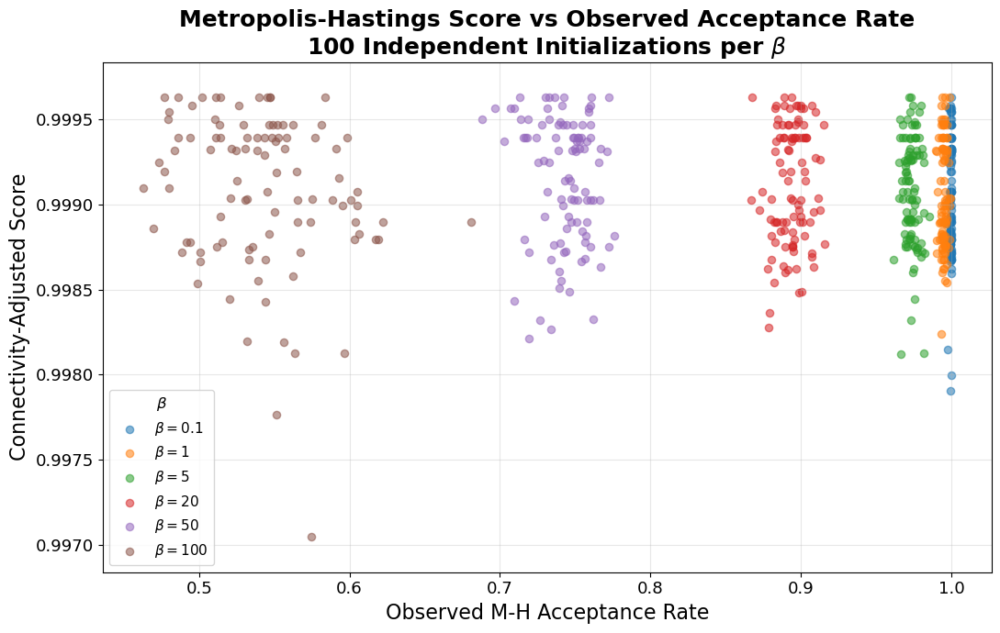

Saved mean plot to 'mh_mean_adjusted_score_vs_mean_acceptance_rate.png'


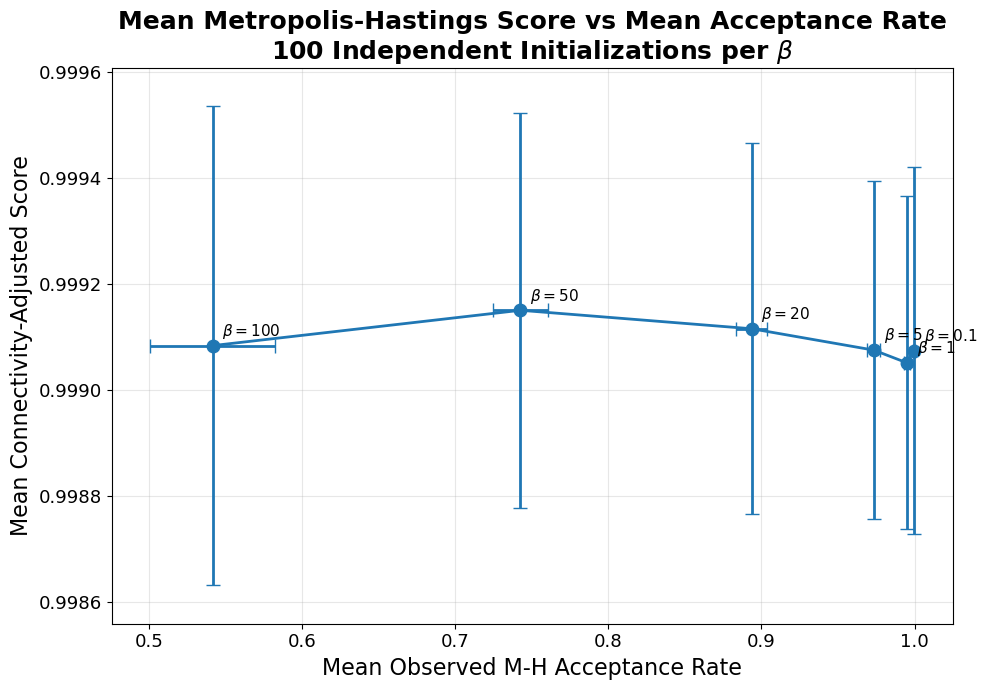

Saved acceptance-rate plot to 'mh_acceptance_rate_distribution_by_beta.png'


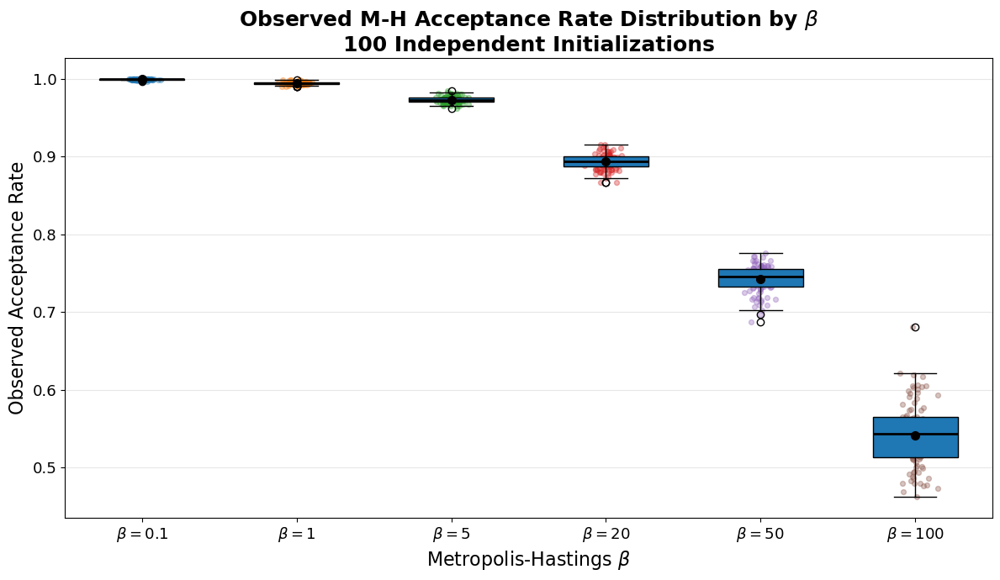


ACCEPTANCE RATE / SCORE RELATIONSHIP
Pearson correlation between observed acceptance rate and adjusted score: -0.048601

BEST BETA BASED ON MEAN ADJUSTED SCORE
Beta: 50
Mean acceptance rate: 0.742680
Mean adjusted score: 0.999150
Standard deviation: 0.000372
Best observed score: 0.999630

Saved:
  mh_score_vs_acceptance_rate_100_initializations_detailed.csv
  mh_score_vs_acceptance_rate_100_initializations_summary.csv


In [57]:
import io
import re
import contextlib

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

# Keep lambda / connectivity weight fixed.
CONNECTIVITY_WEIGHT = 0.10

DISCONNECTED_SINGLETON_WEIGHT = 2.0

# Beta is still varied internally.
# Beta is NOT the x-axis in the final plot.
MH_BETAS = (
    0.1,
    1.0,
    5.0,
    20.0,
    50.0,
    100.0
)

MH_ITERATIONS = 5000
MH_INITIALIZATION = "distance"

# Number of independent runs for every beta.
N_INITIALIZATIONS = 100

# Seeds 42, 43, ..., 141.
BASE_SEED = 42

INITIALIZATION_SEEDS = [
    BASE_SEED + initialization_index
    for initialization_index
    in range(N_INITIALIZATIONS)
]


# =============================================================================
# SELECT THE SPECIFIC TEST MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142

EXPECTED_SMILES = (
    "CC1C2C(CCN12)C=O"
)

test_reset = test.reset_index(
    drop=True
)

if TARGET_TEST_INDEX >= len(test_reset):

    raise IndexError(
        f"Test index {TARGET_TEST_INDEX} "
        "is out of range. "
        f"The reset test set contains "
        f"{len(test_reset)} molecules."
    )


selected_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

large_mol = selected_row["mol"]
large_smiles = selected_row["smiles"]


if large_mol is None:

    raise ValueError(
        f"The molecule at test index "
        f"{TARGET_TEST_INDEX} is None."
    )


if large_smiles != EXPECTED_SMILES:

    raise ValueError(
        "Unexpected molecule at test index "
        f"{TARGET_TEST_INDEX}.\n"
        f"Expected SMILES: {EXPECTED_SMILES}\n"
        f"Found SMILES:    {large_smiles}"
    )


if large_mol.GetNumAtoms() < K_TO_PLOT:

    raise ValueError(
        f"The selected molecule has only "
        f"{large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have "
        f"{K_TO_PLOT} nonempty partitions."
    )


# =============================================================================
# EXPERIMENT INFORMATION
# =============================================================================

print("=" * 90)

print(
    "METROPOLIS-HASTINGS "
    "SCORE VS OBSERVED ACCEPTANCE RATE"
)

print("=" * 90)

print(
    f"Test index: "
    f"{TARGET_TEST_INDEX}"
)

print(
    f"SMILES: "
    f"{large_smiles}"
)

print(
    f"Total atoms: "
    f"{large_mol.GetNumAtoms()}"
)

print(
    f"Heavy atoms: "
    f"{large_mol.GetNumHeavyAtoms()}"
)

print(
    f"k: "
    f"{K_TO_PLOT}"
)

print(
    f"Connectivity weight lambda: "
    f"{CONNECTIVITY_WEIGHT}"
)

print(
    f"Beta values: "
    f"{list(MH_BETAS)}"
)

print(
    f"Independent initializations "
    f"per beta: "
    f"{N_INITIALIZATIONS}"
)

print(
    f"Iterations per run: "
    f"{MH_ITERATIONS}"
)

print(
    f"Initialization method: "
    f"{MH_INITIALIZATION}"
)

print(
    f"Total MH runs: "
    f"{len(MH_BETAS) * N_INITIALIZATIONS}"
)

print("=" * 90)


# =============================================================================
# HELPER: EXTRACT FINAL ACCEPTANCE RATE FROM EXISTING MH OUTPUT
# =============================================================================

def extract_final_acceptance_rate(
    output_text
):
    """
    Extract the final acceptance rate printed by the existing
    optimize_partition_metropolis_hastings() method.

    This does NOT modify the MH implementation.
    """

    matches = re.findall(
        r"Acceptance rate:\s*"
        r"([0-9]*\.?[0-9]+)",
        output_text,
        flags=re.IGNORECASE
    )

    if not matches:

        raise RuntimeError(
            "Could not find the final MH "
            "acceptance rate in verbose output."
        )

    return float(
        matches[-1]
    )


# =============================================================================
# RUN EXPERIMENT
# =============================================================================

mh_run_results = []


for mh_beta in MH_BETAS:

    print(
        "\n"
        + "=" * 80
    )

    print(
        f"Beta = {mh_beta:g}"
    )

    print(
        "=" * 80
    )

    beta_scores = []
    beta_acceptance_rates = []

    # -------------------------------------------------------------------------
    # Same optimizer configuration for all runs at this beta.
    # -------------------------------------------------------------------------

    optimizer_beta = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=(
            CONNECTIVITY_WEIGHT
        ),
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    # -------------------------------------------------------------------------
    # 100 independent runs.
    # -------------------------------------------------------------------------

    for initialization_index, seed in enumerate(
        INITIALIZATION_SEEDS,
        start=1
    ):

        # =====================================================================
        # CAPTURE VERBOSE OUTPUT
        # =====================================================================
        #
        # We set verbose=True because the existing MH method already prints:
        #
        #     Acceptance rate: ...
        #
        # stdout is redirected to a string so the notebook is not flooded
        # with thousands of progress messages.
        #
        # The MH method itself is NOT changed.
        # =====================================================================

        output_buffer = io.StringIO()

        with contextlib.redirect_stdout(
            output_buffer
        ):

            interpretation = (
                optimizer_beta
                .optimize_partition_metropolis_hastings(
                    mol=large_mol,
                    n_clusters=K_TO_PLOT,
                    n_iterations=(
                        MH_ITERATIONS
                    ),
                    beta=mh_beta,
                    initialization=(
                        MH_INITIALIZATION
                    ),
                    seed=seed,
                    verbose=True
                )
            )

        mh_output = (
            output_buffer.getvalue()
        )

        # =====================================================================
        # EXTRACT OBSERVED ACCEPTANCE RATE
        # =====================================================================

        observed_acceptance_rate = (
            extract_final_acceptance_rate(
                mh_output
            )
        )

        # =====================================================================
        # CHECK PARTITION COUNT
        # =====================================================================

        partition = (
            interpretation.partition
        )

        actual_k = len(
            set(
                partition.values()
            )
        )

        if actual_k != K_TO_PLOT:

            raise RuntimeError(
                f"Beta={mh_beta:g}, "
                f"initialization="
                f"{initialization_index}, "
                f"seed={seed}: "
                f"requested k={K_TO_PLOT}, "
                f"but MH returned "
                f"k={actual_k}."
            )

        # =====================================================================
        # CONNECTIVITY PENALTY
        # =====================================================================

        connectivity_penalty = (
            partition_connectivity_penalty(
                mol=large_mol,
                partition=partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # =====================================================================
        # CONNECTIVITY-ADJUSTED SCORE
        # =====================================================================
        #
        # beta is NOT part of this score.
        #
        # beta influences which candidates are accepted and therefore
        # indirectly changes the search trajectory.
        # =====================================================================

        adjusted_score = (
            connectivity_adjusted_score(
                mol=large_mol,
                interpretation=(
                    interpretation
                ),
                connectivity_weight=(
                    CONNECTIVITY_WEIGHT
                ),
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # =====================================================================
        # COUNT CROSS-PARTITION BONDS
        # =====================================================================

        cross_partition_bonds = [
            bond.GetIdx()
            for bond
            in large_mol.GetBonds()
            if (
                partition[
                    bond.GetBeginAtomIdx()
                ]
                !=
                partition[
                    bond.GetEndAtomIdx()
                ]
            )
        ]

        # =====================================================================
        # STORE RESULT
        # =====================================================================

        mh_run_results.append({
            "Beta": mh_beta,
            "Initialization": (
                initialization_index
            ),
            "Seed": seed,
            "Acceptance Rate": (
                observed_acceptance_rate
            ),
            "Raw Score": (
                interpretation.score
            ),
            "Connectivity Penalty": (
                connectivity_penalty
            ),
            "Adjusted Score": (
                adjusted_score
            ),
            "Cross-Partition Bonds": (
                len(
                    cross_partition_bonds
                )
            ),
            "Actual k": actual_k,
            "Partition": partition,
            "Interpretation": (
                interpretation
            ),
        })

        beta_scores.append(
            adjusted_score
        )

        beta_acceptance_rates.append(
            observed_acceptance_rate
        )

        # ---------------------------------------------------------------------
        # Progress output.
        # ---------------------------------------------------------------------

        if (
            initialization_index % 20 == 0
            or
            initialization_index
            == N_INITIALIZATIONS
        ):

            print(
                f"  Completed "
                f"{initialization_index:3d}/"
                f"{N_INITIALIZATIONS} runs"
            )

    # =========================================================================
    # BETA SUMMARY
    # =========================================================================

    beta_scores = np.asarray(
        beta_scores,
        dtype=float
    )

    beta_acceptance_rates = (
        np.asarray(
            beta_acceptance_rates,
            dtype=float
        )
    )

    print(
        f"\n  Beta={mh_beta:g} summary:"
    )

    print(
        f"    Mean acceptance rate: "
        f"{beta_acceptance_rates.mean():.4f}"
    )

    print(
        f"    Std acceptance rate:  "
        f"{beta_acceptance_rates.std(ddof=1):.4f}"
    )

    print(
        f"    Mean adjusted score:  "
        f"{beta_scores.mean():.6f}"
    )

    print(
        f"    Std adjusted score:   "
        f"{beta_scores.std(ddof=1):.6f}"
    )

    print(
        f"    Min adjusted score:   "
        f"{beta_scores.min():.6f}"
    )

    print(
        f"    Max adjusted score:   "
        f"{beta_scores.max():.6f}"
    )


# =============================================================================
# CONVERT TO DATAFRAME
# =============================================================================

mh_results_df = pd.DataFrame(
    mh_run_results
)


# =============================================================================
# SUMMARY BY BETA
# =============================================================================

beta_summary_df = (
    mh_results_df
    .groupby(
        "Beta",
        as_index=False
    )
    .agg(
        N=(
            "Adjusted Score",
            "count"
        ),
        Mean_Acceptance_Rate=(
            "Acceptance Rate",
            "mean"
        ),
        Std_Acceptance_Rate=(
            "Acceptance Rate",
            "std"
        ),
        Min_Acceptance_Rate=(
            "Acceptance Rate",
            "min"
        ),
        Max_Acceptance_Rate=(
            "Acceptance Rate",
            "max"
        ),
        Mean_Adjusted_Score=(
            "Adjusted Score",
            "mean"
        ),
        Std_Adjusted_Score=(
            "Adjusted Score",
            "std"
        ),
        Median_Adjusted_Score=(
            "Adjusted Score",
            "median"
        ),
        Min_Adjusted_Score=(
            "Adjusted Score",
            "min"
        ),
        Max_Adjusted_Score=(
            "Adjusted Score",
            "max"
        ),
        Mean_Raw_Score=(
            "Raw Score",
            "mean"
        ),
        Mean_Connectivity_Penalty=(
            "Connectivity Penalty",
            "mean"
        )
    )
)


print(
    "\n"
    + "=" * 120
)

print(
    "SUMMARY BY BETA"
)

print(
    "=" * 120
)

print(
    beta_summary_df.to_string(
        index=False,
        float_format=(
            lambda value:
            f"{value:.6f}"
        )
    )
)


# =============================================================================
# PLOT 1
# ALL 500 RUNS:
# ADJUSTED SCORE VS OBSERVED ACCEPTANCE RATE
# =============================================================================

fig, ax = plt.subplots(
    figsize=(11, 7)
)


for mh_beta in MH_BETAS:

    beta_data = (
        mh_results_df[
            mh_results_df["Beta"]
            == mh_beta
        ]
    )

    ax.scatter(
        beta_data[
            "Acceptance Rate"
        ],
        beta_data[
            "Adjusted Score"
        ],
        s=35,
        alpha=0.55,
        label=rf"$\beta={mh_beta:g}$"
    )


ax.set_xlabel(
    "Observed M-H Acceptance Rate",
    fontsize=16
)

ax.set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Metropolis-Hastings Score "
    "vs Observed Acceptance Rate\n"
    f"{N_INITIALIZATIONS} Independent "
    "Initializations per "
    r"$\beta$",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    alpha=0.3
)

ax.legend(
    title=r"$\beta$",
    fontsize=11,
    title_fontsize=12
)


# =============================================================================
# DATA-DRIVEN Y AXIS
# =============================================================================

all_adjusted_scores = (
    mh_results_df[
        "Adjusted Score"
    ]
    .to_numpy()
)

score_min = (
    all_adjusted_scores.min()
)

score_max = (
    all_adjusted_scores.max()
)

score_range = (
    score_max
    - score_min
)

if score_range < 1e-12:

    score_padding = 0.01

else:

    score_padding = (
        0.08
        * score_range
    )


ax.set_ylim(
    max(
        0.0,
        score_min
        - score_padding
    ),
    min(
        1.0,
        score_max
        + score_padding
    )
)


plt.tight_layout()

output_filename = (
    "mh_adjusted_score_vs_"
    "observed_acceptance_rate.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved scatter plot to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PLOT 2
# MEAN SCORE VS MEAN ACCEPTANCE RATE FOR EACH BETA
# =============================================================================

fig, ax = plt.subplots(
    figsize=(10, 7)
)


ax.errorbar(
    beta_summary_df[
        "Mean_Acceptance_Rate"
    ],
    beta_summary_df[
        "Mean_Adjusted_Score"
    ],
    xerr=(
        beta_summary_df[
            "Std_Acceptance_Rate"
        ]
    ),
    yerr=(
        beta_summary_df[
            "Std_Adjusted_Score"
        ]
    ),
    marker="o",
    markersize=9,
    linewidth=2,
    capsize=5
)


# =============================================================================
# LABEL EACH POINT WITH ITS BETA
# =============================================================================

for _, row in (
    beta_summary_df.iterrows()
):

    ax.annotate(
        rf"$\beta={row['Beta']:g}$",
        (
            row[
                "Mean_Acceptance_Rate"
            ],
            row[
                "Mean_Adjusted_Score"
            ]
        ),
        xytext=(7, 7),
        textcoords="offset points",
        fontsize=11
    )


ax.set_xlabel(
    "Mean Observed M-H Acceptance Rate",
    fontsize=16
)

ax.set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Mean Metropolis-Hastings Score "
    "vs Mean Acceptance Rate\n"
    f"{N_INITIALIZATIONS} Independent "
    "Initializations per "
    r"$\beta$",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    alpha=0.3
)


# =============================================================================
# DATA-DRIVEN Y AXIS
# =============================================================================

mean_lower = (
    beta_summary_df[
        "Mean_Adjusted_Score"
    ]
    -
    beta_summary_df[
        "Std_Adjusted_Score"
    ]
)

mean_upper = (
    beta_summary_df[
        "Mean_Adjusted_Score"
    ]
    +
    beta_summary_df[
        "Std_Adjusted_Score"
    ]
)

mean_min = (
    mean_lower.min()
)

mean_max = (
    mean_upper.max()
)

mean_range = (
    mean_max
    - mean_min
)

mean_padding = (
    0.01
    if mean_range < 1e-12
    else
    0.08 * mean_range
)

ax.set_ylim(
    max(
        0.0,
        mean_min
        - mean_padding
    ),
    min(
        1.0,
        mean_max
        + mean_padding
    )
)


plt.tight_layout()

mean_output_filename = (
    "mh_mean_adjusted_score_vs_"
    "mean_acceptance_rate.png"
)

plt.savefig(
    mean_output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved mean plot to "
    f"'{mean_output_filename}'"
)

plt.show()


# =============================================================================
# PLOT 3
# OPTIONAL: ACCEPTANCE RATE DISTRIBUTION BY BETA
# =============================================================================
#
# This helps you understand how beta maps onto the actually observed
# acceptance behavior.
# =============================================================================

acceptance_distributions = [
    mh_results_df.loc[
        mh_results_df["Beta"]
        == mh_beta,
        "Acceptance Rate"
    ].to_numpy()
    for mh_beta in MH_BETAS
]


fig, ax = plt.subplots(
    figsize=(12, 7)
)

positions = np.arange(
    1,
    len(MH_BETAS) + 1
)

ax.boxplot(
    acceptance_distributions,
    positions=positions,
    widths=0.55,
    patch_artist=True,
    showmeans=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 7,
    },
    medianprops={
        "color": "black",
        "linewidth": 2,
    }
)


jitter_rng = (
    np.random.default_rng(
        12345
    )
)


for position, rates in zip(
    positions,
    acceptance_distributions
):

    horizontal_jitter = (
        jitter_rng.normal(
            loc=0.0,
            scale=0.045,
            size=len(rates)
        )
    )

    ax.scatter(
        position
        + horizontal_jitter,
        rates,
        s=18,
        alpha=0.35
    )


ax.set_xticks(
    positions
)

ax.set_xticklabels([
    rf"$\beta={beta:g}$"
    for beta in MH_BETAS
])

ax.set_xlabel(
    r"Metropolis-Hastings $\beta$",
    fontsize=16
)

ax.set_ylabel(
    "Observed Acceptance Rate",
    fontsize=16
)

ax.set_title(
    "Observed M-H Acceptance "
    "Rate Distribution by "
    r"$\beta$"
    "\n"
    f"{N_INITIALIZATIONS} "
    "Independent Initializations",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

acceptance_output_filename = (
    "mh_acceptance_rate_"
    "distribution_by_beta.png"
)

plt.savefig(
    acceptance_output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved acceptance-rate plot to "
    f"'{acceptance_output_filename}'"
)

plt.show()


# =============================================================================
# CORRELATION BETWEEN ACCEPTANCE RATE AND SCORE
# =============================================================================

acceptance_score_correlation = (
    mh_results_df[
        [
            "Acceptance Rate",
            "Adjusted Score",
        ]
    ]
    .corr()
    .loc[
        "Acceptance Rate",
        "Adjusted Score"
    ]
)


print(
    "\n"
    + "=" * 90
)

print(
    "ACCEPTANCE RATE / SCORE RELATIONSHIP"
)

print(
    "=" * 90
)

print(
    f"Pearson correlation between "
    f"observed acceptance rate and "
    f"adjusted score: "
    f"{acceptance_score_correlation:.6f}"
)


# =============================================================================
# IDENTIFY BEST MEAN SCORE
# =============================================================================

best_beta_row = (
    beta_summary_df.loc[
        beta_summary_df[
            "Mean_Adjusted_Score"
        ].idxmax()
    ]
)


print(
    "\n"
    + "=" * 90
)

print(
    "BEST BETA BASED ON "
    "MEAN ADJUSTED SCORE"
)

print(
    "=" * 90
)

print(
    f"Beta: "
    f"{best_beta_row['Beta']:g}"
)

print(
    f"Mean acceptance rate: "
    f"{best_beta_row['Mean_Acceptance_Rate']:.6f}"
)

print(
    f"Mean adjusted score: "
    f"{best_beta_row['Mean_Adjusted_Score']:.6f}"
)

print(
    f"Standard deviation: "
    f"{best_beta_row['Std_Adjusted_Score']:.6f}"
)

print(
    f"Best observed score: "
    f"{best_beta_row['Max_Adjusted_Score']:.6f}"
)


# =============================================================================
# SAVE NUMERICAL RESULTS
# =============================================================================

mh_results_export = (
    mh_results_df.drop(
        columns=[
            "Partition",
            "Interpretation",
        ]
    )
)


mh_results_export.to_csv(
    "mh_score_vs_acceptance_rate_"
    "100_initializations_detailed.csv",
    index=False
)


beta_summary_df.to_csv(
    "mh_score_vs_acceptance_rate_"
    "100_initializations_summary.csv",
    index=False
)


print(
    "\nSaved:"
)

print(
    "  mh_score_vs_acceptance_rate_"
    "100_initializations_detailed.csv"
)

print(
    "  mh_score_vs_acceptance_rate_"
    "100_initializations_summary.csv"
)

METROPOLIS-HASTINGS SCORE VS OBSERVED ACCEPTANCE RATE
WITHOUT SINGLE-ATOM CONTRIBUTIONS
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
k: 4
Connectivity weight lambda: 0.1
Single-atom contributions: REMOVED
Beta values: [0.1, 1.0, 5.0, 20.0, 50.0, 100.0]
Independent initializations per beta: 100
Iterations per run: 5000
Initialization method: distance
Total MH runs: 600

Beta = 0.1
  Completed  20/100 runs
  Completed  40/100 runs
  Completed  60/100 runs
  Completed  80/100 runs
  Completed 100/100 runs

  Beta=0.1 summary:
    Mean acceptance rate: 0.9971
    Std acceptance rate:  0.0015
    Mean adjusted score:  0.972893
    Std adjusted score:   0.006770
    Min adjusted score:   0.954352
    Max adjusted score:   0.984491

Beta = 1
  Completed  20/100 runs
  Completed  40/100 runs
  Completed  60/100 runs
  Completed  80/100 runs
  Completed 100/100 runs

  Beta=1 summary:
    Mean acceptance rate: 0.9699
    Std acceptance rate:  0.0054
    Mean adjuste

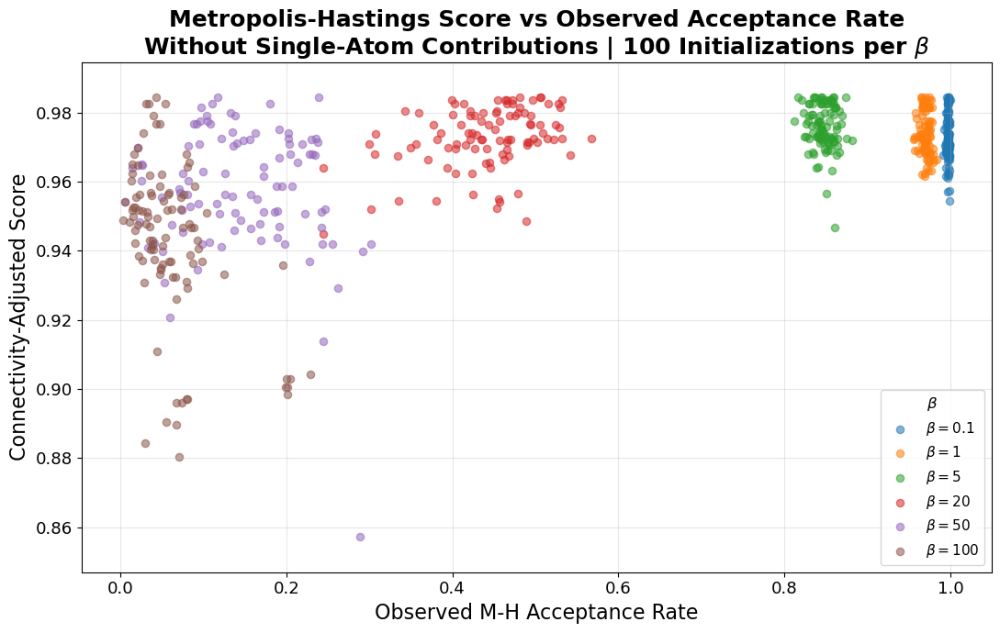

Saved mean plot to 'mh_no_single_atoms_mean_adjusted_score_vs_mean_acceptance_rate.png'


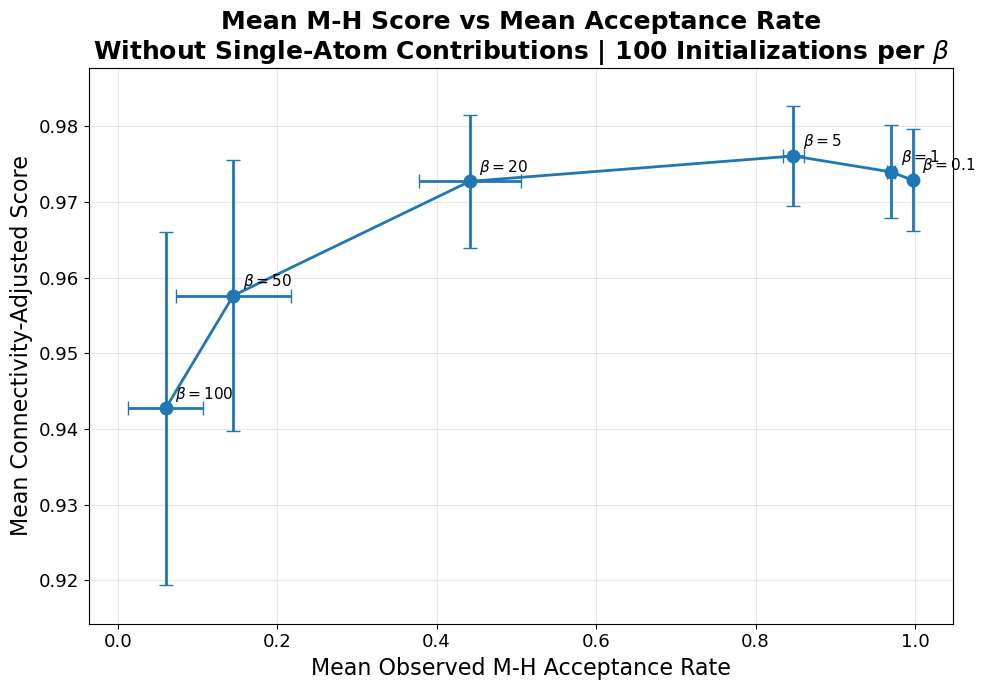

Saved acceptance-rate plot to 'mh_no_single_atoms_acceptance_rate_distribution_by_beta.png'


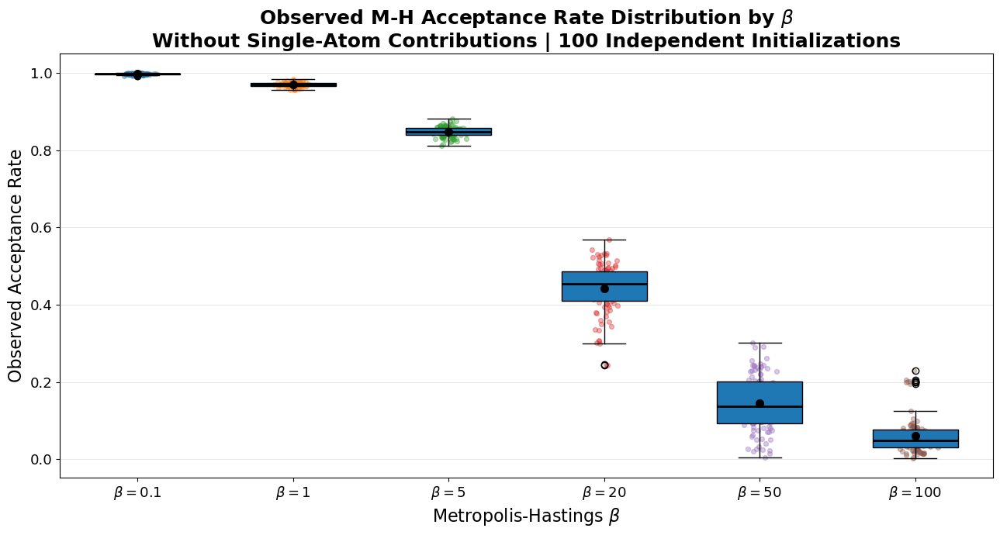


ACCEPTANCE RATE / SCORE RELATIONSHIP
WITHOUT SINGLE-ATOM CONTRIBUTIONS
Pearson correlation between observed acceptance rate and adjusted score: 0.553914

BEST BETA BASED ON MEAN ADJUSTED SCORE
WITHOUT SINGLE-ATOM CONTRIBUTIONS
Beta: 5
Mean acceptance rate: 0.847400
Mean adjusted score: 0.976096
Standard deviation: 0.006627
Best observed score: 0.984491

Saved:
  mh_no_single_atoms_score_vs_acceptance_rate_100_initializations_detailed.csv
  mh_no_single_atoms_score_vs_acceptance_rate_100_initializations_summary.csv


In [56]:
import io
import re
import contextlib

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

CONNECTIVITY_WEIGHT = 0.10
DISCONNECTED_SINGLETON_WEIGHT = 2.0

# Beta is varied internally.
# Observed acceptance rate will be used as the x-axis.
MH_BETAS = (
    0.1,
    1.0,
    5.0,
    20.0,
    50.0,
    100.0,
)

MH_ITERATIONS = 5000
MH_INITIALIZATION = "distance"

N_INITIALIZATIONS = 100

BASE_SEED = 42

INITIALIZATION_SEEDS = [
    BASE_SEED + initialization_index
    for initialization_index
    in range(N_INITIALIZATIONS)
]


# =============================================================================
# INTERPRETER WITHOUT SINGLE-ATOM CONTRIBUTIONS
# =============================================================================
#
# IMPORTANT:
#
# This uses the same fitted featurizer and model, but sets the coefficients
# of all graphlet features with bit_size == 1 to zero.
#
# Therefore:
#
#     - single-atom graphlets are still enumerated,
#     - but they contribute 0 to the partition decomposition,
#     - and they do not contribute to the active prediction used here.
#
# =============================================================================

interpreter_no_atoms = PartitionInterpreter(
    featurizer=featurizer,
    model=model,
    remove_single_atom_contributions=True
)


# =============================================================================
# SELECT MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142

EXPECTED_SMILES = (
    "CC1C2C(CCN12)C=O"
)

test_reset = test.reset_index(
    drop=True
)

if TARGET_TEST_INDEX >= len(test_reset):

    raise IndexError(
        f"Test index {TARGET_TEST_INDEX} "
        "is out of range. "
        f"The reset test set contains "
        f"{len(test_reset)} molecules."
    )


selected_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

large_mol = selected_row["mol"]
large_smiles = selected_row["smiles"]


if large_mol is None:

    raise ValueError(
        f"The molecule at test index "
        f"{TARGET_TEST_INDEX} is None."
    )


if large_smiles != EXPECTED_SMILES:

    raise ValueError(
        "Unexpected molecule at test index "
        f"{TARGET_TEST_INDEX}.\n"
        f"Expected SMILES: {EXPECTED_SMILES}\n"
        f"Found SMILES:    {large_smiles}"
    )


if large_mol.GetNumAtoms() < K_TO_PLOT:

    raise ValueError(
        f"The selected molecule has only "
        f"{large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have "
        f"{K_TO_PLOT} nonempty partitions."
    )


# =============================================================================
# EXPERIMENT INFORMATION
# =============================================================================

print("=" * 90)

print(
    "METROPOLIS-HASTINGS SCORE VS OBSERVED ACCEPTANCE RATE\n"
    "WITHOUT SINGLE-ATOM CONTRIBUTIONS"
)

print("=" * 90)

print(
    f"Test index: {TARGET_TEST_INDEX}"
)

print(
    f"SMILES: {large_smiles}"
)

print(
    f"Total atoms: {large_mol.GetNumAtoms()}"
)

print(
    f"Heavy atoms: {large_mol.GetNumHeavyAtoms()}"
)

print(
    f"k: {K_TO_PLOT}"
)

print(
    f"Connectivity weight lambda: "
    f"{CONNECTIVITY_WEIGHT}"
)

print(
    "Single-atom contributions: REMOVED"
)

print(
    f"Beta values: {list(MH_BETAS)}"
)

print(
    f"Independent initializations per beta: "
    f"{N_INITIALIZATIONS}"
)

print(
    f"Iterations per run: "
    f"{MH_ITERATIONS}"
)

print(
    f"Initialization method: "
    f"{MH_INITIALIZATION}"
)

print(
    f"Total MH runs: "
    f"{len(MH_BETAS) * N_INITIALIZATIONS}"
)

print("=" * 90)


# =============================================================================
# EXTRACT ACCEPTANCE RATE FROM EXISTING MH VERBOSE OUTPUT
# =============================================================================

def extract_final_acceptance_rate(
    output_text
):
    """
    Extract the final observed acceptance rate printed by the existing
    optimize_partition_metropolis_hastings() method.

    The MH implementation itself is not modified.
    """

    matches = re.findall(
        r"Acceptance rate:\s*([0-9]*\.?[0-9]+)",
        output_text,
        flags=re.IGNORECASE
    )

    if not matches:

        raise RuntimeError(
            "Could not find the final MH acceptance rate "
            "in verbose output."
        )

    return float(
        matches[-1]
    )


# =============================================================================
# RUN EXPERIMENT
# =============================================================================

mh_run_results = []


for mh_beta in MH_BETAS:

    print(
        "\n"
        + "=" * 80
    )

    print(
        f"Beta = {mh_beta:g}"
    )

    print(
        "=" * 80
    )

    beta_scores = []
    beta_acceptance_rates = []

    # =========================================================================
    # IMPORTANT CHANGE:
    #
    # Use interpreter_no_atoms instead of interpreter.
    # =========================================================================

    optimizer_beta = PartitionOptimizer(
        interpreter=interpreter_no_atoms,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=(
            CONNECTIVITY_WEIGHT
        ),
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    # =========================================================================
    # 100 INDEPENDENT INITIALIZATIONS
    # =========================================================================

    for initialization_index, seed in enumerate(
        INITIALIZATION_SEEDS,
        start=1
    ):

        output_buffer = io.StringIO()

        # Capture verbose output so we can extract the final acceptance rate
        # without printing thousands of lines.
        with contextlib.redirect_stdout(
            output_buffer
        ):

            interpretation = (
                optimizer_beta
                .optimize_partition_metropolis_hastings(
                    mol=large_mol,
                    n_clusters=K_TO_PLOT,
                    n_iterations=MH_ITERATIONS,
                    beta=mh_beta,
                    initialization=(
                        MH_INITIALIZATION
                    ),
                    seed=seed,
                    verbose=True
                )
            )

        mh_output = (
            output_buffer.getvalue()
        )

        # =====================================================================
        # OBSERVED ACCEPTANCE RATE
        # =====================================================================

        observed_acceptance_rate = (
            extract_final_acceptance_rate(
                mh_output
            )
        )

        # =====================================================================
        # CHECK PARTITION COUNT
        # =====================================================================

        partition = (
            interpretation.partition
        )

        actual_k = len(
            set(
                partition.values()
            )
        )

        if actual_k != K_TO_PLOT:

            raise RuntimeError(
                f"Beta={mh_beta:g}, "
                f"initialization={initialization_index}, "
                f"seed={seed}: "
                f"requested k={K_TO_PLOT}, "
                f"but MH returned k={actual_k}."
            )

        # =====================================================================
        # CONNECTIVITY PENALTY
        # =====================================================================

        connectivity_penalty = (
            partition_connectivity_penalty(
                mol=large_mol,
                partition=partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # =====================================================================
        # CONNECTIVITY-ADJUSTED SCORE
        # =====================================================================

        adjusted_score = (
            connectivity_adjusted_score(
                mol=large_mol,
                interpretation=(
                    interpretation
                ),
                connectivity_weight=(
                    CONNECTIVITY_WEIGHT
                ),
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # =====================================================================
        # CROSS-PARTITION BONDS
        # =====================================================================

        cross_partition_bonds = [
            bond.GetIdx()
            for bond
            in large_mol.GetBonds()
            if (
                partition[
                    bond.GetBeginAtomIdx()
                ]
                !=
                partition[
                    bond.GetEndAtomIdx()
                ]
            )
        ]

        # =====================================================================
        # STORE RESULT
        # =====================================================================

        mh_run_results.append({
            "Beta": mh_beta,
            "Initialization": (
                initialization_index
            ),
            "Seed": seed,
            "Acceptance Rate": (
                observed_acceptance_rate
            ),
            "Raw Score": (
                interpretation.score
            ),
            "Connectivity Penalty": (
                connectivity_penalty
            ),
            "Adjusted Score": (
                adjusted_score
            ),
            "Cross-Partition Bonds": (
                len(
                    cross_partition_bonds
                )
            ),
            "Actual k": actual_k,
            "Partition": partition,
            "Interpretation": (
                interpretation
            ),
        })

        beta_scores.append(
            adjusted_score
        )

        beta_acceptance_rates.append(
            observed_acceptance_rate
        )

        if (
            initialization_index % 20 == 0
            or
            initialization_index
            == N_INITIALIZATIONS
        ):

            print(
                f"  Completed "
                f"{initialization_index:3d}/"
                f"{N_INITIALIZATIONS} runs"
            )

    # =========================================================================
    # BETA SUMMARY
    # =========================================================================

    beta_scores = np.asarray(
        beta_scores,
        dtype=float
    )

    beta_acceptance_rates = (
        np.asarray(
            beta_acceptance_rates,
            dtype=float
        )
    )

    print(
        f"\n  Beta={mh_beta:g} summary:"
    )

    print(
        f"    Mean acceptance rate: "
        f"{beta_acceptance_rates.mean():.4f}"
    )

    print(
        f"    Std acceptance rate:  "
        f"{beta_acceptance_rates.std(ddof=1):.4f}"
    )

    print(
        f"    Mean adjusted score:  "
        f"{beta_scores.mean():.6f}"
    )

    print(
        f"    Std adjusted score:   "
        f"{beta_scores.std(ddof=1):.6f}"
    )

    print(
        f"    Min adjusted score:   "
        f"{beta_scores.min():.6f}"
    )

    print(
        f"    Max adjusted score:   "
        f"{beta_scores.max():.6f}"
    )


# =============================================================================
# CONVERT TO DATAFRAME
# =============================================================================

mh_results_df = pd.DataFrame(
    mh_run_results
)


# =============================================================================
# SUMMARY BY BETA
# =============================================================================

beta_summary_df = (
    mh_results_df
    .groupby(
        "Beta",
        as_index=False
    )
    .agg(
        N=(
            "Adjusted Score",
            "count"
        ),
        Mean_Acceptance_Rate=(
            "Acceptance Rate",
            "mean"
        ),
        Std_Acceptance_Rate=(
            "Acceptance Rate",
            "std"
        ),
        Min_Acceptance_Rate=(
            "Acceptance Rate",
            "min"
        ),
        Max_Acceptance_Rate=(
            "Acceptance Rate",
            "max"
        ),
        Mean_Adjusted_Score=(
            "Adjusted Score",
            "mean"
        ),
        Std_Adjusted_Score=(
            "Adjusted Score",
            "std"
        ),
        Median_Adjusted_Score=(
            "Adjusted Score",
            "median"
        ),
        Min_Adjusted_Score=(
            "Adjusted Score",
            "min"
        ),
        Max_Adjusted_Score=(
            "Adjusted Score",
            "max"
        ),
        Mean_Raw_Score=(
            "Raw Score",
            "mean"
        ),
        Mean_Connectivity_Penalty=(
            "Connectivity Penalty",
            "mean"
        )
    )
)


print(
    "\n"
    + "=" * 120
)

print(
    "SUMMARY BY BETA — "
    "WITHOUT SINGLE-ATOM CONTRIBUTIONS"
)

print(
    "=" * 120
)

print(
    beta_summary_df.to_string(
        index=False,
        float_format=(
            lambda value:
            f"{value:.6f}"
        )
    )
)


# =============================================================================
# PLOT 1
# ALL RUNS: SCORE VS OBSERVED ACCEPTANCE RATE
# =============================================================================

fig, ax = plt.subplots(
    figsize=(11, 7)
)


for mh_beta in MH_BETAS:

    beta_data = (
        mh_results_df[
            mh_results_df["Beta"]
            == mh_beta
        ]
    )

    ax.scatter(
        beta_data[
            "Acceptance Rate"
        ],
        beta_data[
            "Adjusted Score"
        ],
        s=35,
        alpha=0.55,
        label=rf"$\beta={mh_beta:g}$"
    )


ax.set_xlabel(
    "Observed M-H Acceptance Rate",
    fontsize=16
)

ax.set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Metropolis-Hastings Score vs Observed Acceptance Rate\n"
    "Without Single-Atom Contributions | "
    f"{N_INITIALIZATIONS} Initializations per "
    r"$\beta$",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    alpha=0.3
)

ax.legend(
    title=r"$\beta$",
    fontsize=11,
    title_fontsize=12
)


# =============================================================================
# DATA-DRIVEN Y AXIS
# =============================================================================

all_adjusted_scores = (
    mh_results_df[
        "Adjusted Score"
    ].to_numpy()
)

score_min = (
    all_adjusted_scores.min()
)

score_max = (
    all_adjusted_scores.max()
)

score_range = (
    score_max
    - score_min
)

if score_range < 1e-12:

    score_padding = 0.01

else:

    score_padding = (
        0.08
        * score_range
    )


ax.set_ylim(
    max(
        0.0,
        score_min
        - score_padding
    ),
    min(
        1.0,
        score_max
        + score_padding
    )
)


plt.tight_layout()

output_filename = (
    "mh_no_single_atoms_"
    "adjusted_score_vs_"
    "observed_acceptance_rate.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved scatter plot to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PLOT 2
# MEAN SCORE VS MEAN ACCEPTANCE RATE
# =============================================================================

fig, ax = plt.subplots(
    figsize=(10, 7)
)


ax.errorbar(
    beta_summary_df[
        "Mean_Acceptance_Rate"
    ],
    beta_summary_df[
        "Mean_Adjusted_Score"
    ],
    xerr=(
        beta_summary_df[
            "Std_Acceptance_Rate"
        ]
    ),
    yerr=(
        beta_summary_df[
            "Std_Adjusted_Score"
        ]
    ),
    marker="o",
    markersize=9,
    linewidth=2,
    capsize=5
)


# =============================================================================
# LABEL EACH POINT WITH BETA
# =============================================================================

for _, row in (
    beta_summary_df.iterrows()
):

    ax.annotate(
        rf"$\beta={row['Beta']:g}$",
        (
            row[
                "Mean_Acceptance_Rate"
            ],
            row[
                "Mean_Adjusted_Score"
            ]
        ),
        xytext=(7, 7),
        textcoords="offset points",
        fontsize=11
    )


ax.set_xlabel(
    "Mean Observed M-H Acceptance Rate",
    fontsize=16
)

ax.set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Mean M-H Score vs Mean Acceptance Rate\n"
    "Without Single-Atom Contributions | "
    f"{N_INITIALIZATIONS} Initializations per "
    r"$\beta$",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    alpha=0.3
)


# =============================================================================
# DATA-DRIVEN Y AXIS
# =============================================================================

mean_lower = (
    beta_summary_df[
        "Mean_Adjusted_Score"
    ]
    -
    beta_summary_df[
        "Std_Adjusted_Score"
    ]
)

mean_upper = (
    beta_summary_df[
        "Mean_Adjusted_Score"
    ]
    +
    beta_summary_df[
        "Std_Adjusted_Score"
    ]
)

mean_min = (
    mean_lower.min()
)

mean_max = (
    mean_upper.max()
)

mean_range = (
    mean_max
    - mean_min
)

mean_padding = (
    0.01
    if mean_range < 1e-12
    else
    0.08 * mean_range
)

ax.set_ylim(
    max(
        0.0,
        mean_min
        - mean_padding
    ),
    min(
        1.0,
        mean_max
        + mean_padding
    )
)


plt.tight_layout()

mean_output_filename = (
    "mh_no_single_atoms_"
    "mean_adjusted_score_vs_"
    "mean_acceptance_rate.png"
)

plt.savefig(
    mean_output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved mean plot to "
    f"'{mean_output_filename}'"
)

plt.show()


# =============================================================================
# PLOT 3
# ACCEPTANCE-RATE DISTRIBUTION BY BETA
# =============================================================================

acceptance_distributions = [
    mh_results_df.loc[
        mh_results_df["Beta"]
        == mh_beta,
        "Acceptance Rate"
    ].to_numpy()
    for mh_beta in MH_BETAS
]


fig, ax = plt.subplots(
    figsize=(13, 7)
)

positions = np.arange(
    1,
    len(MH_BETAS) + 1
)

ax.boxplot(
    acceptance_distributions,
    positions=positions,
    widths=0.55,
    patch_artist=True,
    showmeans=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 7,
    },
    medianprops={
        "color": "black",
        "linewidth": 2,
    }
)


jitter_rng = np.random.default_rng(
    12345
)


for position, rates in zip(
    positions,
    acceptance_distributions
):

    horizontal_jitter = (
        jitter_rng.normal(
            loc=0.0,
            scale=0.045,
            size=len(rates)
        )
    )

    ax.scatter(
        position
        + horizontal_jitter,
        rates,
        s=18,
        alpha=0.35
    )


ax.set_xticks(
    positions
)

ax.set_xticklabels([
    rf"$\beta={beta:g}$"
    for beta in MH_BETAS
])

ax.set_xlabel(
    r"Metropolis-Hastings $\beta$",
    fontsize=16
)

ax.set_ylabel(
    "Observed Acceptance Rate",
    fontsize=16
)

ax.set_title(
    "Observed M-H Acceptance Rate Distribution by "
    r"$\beta$"
    "\nWithout Single-Atom Contributions | "
    f"{N_INITIALIZATIONS} Independent Initializations",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

acceptance_output_filename = (
    "mh_no_single_atoms_"
    "acceptance_rate_distribution_by_beta.png"
)

plt.savefig(
    acceptance_output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved acceptance-rate plot to "
    f"'{acceptance_output_filename}'"
)

plt.show()


# =============================================================================
# CORRELATION
# =============================================================================

acceptance_score_correlation = (
    mh_results_df[
        [
            "Acceptance Rate",
            "Adjusted Score",
        ]
    ]
    .corr()
    .loc[
        "Acceptance Rate",
        "Adjusted Score"
    ]
)


print(
    "\n"
    + "=" * 90
)

print(
    "ACCEPTANCE RATE / SCORE RELATIONSHIP"
)

print(
    "WITHOUT SINGLE-ATOM CONTRIBUTIONS"
)

print(
    "=" * 90
)

print(
    f"Pearson correlation between "
    f"observed acceptance rate and "
    f"adjusted score: "
    f"{acceptance_score_correlation:.6f}"
)


# =============================================================================
# BEST BETA
# =============================================================================

best_beta_row = (
    beta_summary_df.loc[
        beta_summary_df[
            "Mean_Adjusted_Score"
        ].idxmax()
    ]
)


print(
    "\n"
    + "=" * 90
)

print(
    "BEST BETA BASED ON MEAN ADJUSTED SCORE"
)

print(
    "WITHOUT SINGLE-ATOM CONTRIBUTIONS"
)

print(
    "=" * 90
)

print(
    f"Beta: "
    f"{best_beta_row['Beta']:g}"
)

print(
    f"Mean acceptance rate: "
    f"{best_beta_row['Mean_Acceptance_Rate']:.6f}"
)

print(
    f"Mean adjusted score: "
    f"{best_beta_row['Mean_Adjusted_Score']:.6f}"
)

print(
    f"Standard deviation: "
    f"{best_beta_row['Std_Adjusted_Score']:.6f}"
)

print(
    f"Best observed score: "
    f"{best_beta_row['Max_Adjusted_Score']:.6f}"
)


# =============================================================================
# SAVE RESULTS
# =============================================================================

mh_results_export = (
    mh_results_df.drop(
        columns=[
            "Partition",
            "Interpretation",
        ]
    )
)


mh_results_export.to_csv(
    "mh_no_single_atoms_"
    "score_vs_acceptance_rate_"
    "100_initializations_detailed.csv",
    index=False
)


beta_summary_df.to_csv(
    "mh_no_single_atoms_"
    "score_vs_acceptance_rate_"
    "100_initializations_summary.csv",
    index=False
)


print(
    "\nSaved:"
)

print(
    "  mh_no_single_atoms_"
    "score_vs_acceptance_rate_"
    "100_initializations_detailed.csv"
)

print(
    "  mh_no_single_atoms_"
    "score_vs_acceptance_rate_"
    "100_initializations_summary.csv"
)

SELECTED TEST MOLECULE
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
Requested partitions: k=4
Connectivity weight: 0.1
MH beta values: [0.1, 1.0, 5.0, 20.0, 50.0]
MH iterations per beta: 5000
MH initialization: distance
MH seed: 42
METROPOLIS-HASTINGS BETA DISTRIBUTION EXPERIMENT
Number of beta values: 5
Independent initializations per beta: 100
MH iterations per initialization: 5000
Total MH runs: 500
k = 4
Connectivity weight lambda = 0.1

Beta = 0.1
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
  Completed  20/100 initializations
  Completed  40/100 initializations
  Completed  60/100 initializations
  Completed  80/100 initializations
  Completed 100/100 initializations

  Beta=0.1 summary:
    Mean adjusted score: 0.867721
    Std:                 0.029491
    Median:              0.870911
    Min:                 0.808306
    Max:                 0.940887

Beta = 1
  Completed  20/100 initializations
  Completed  4

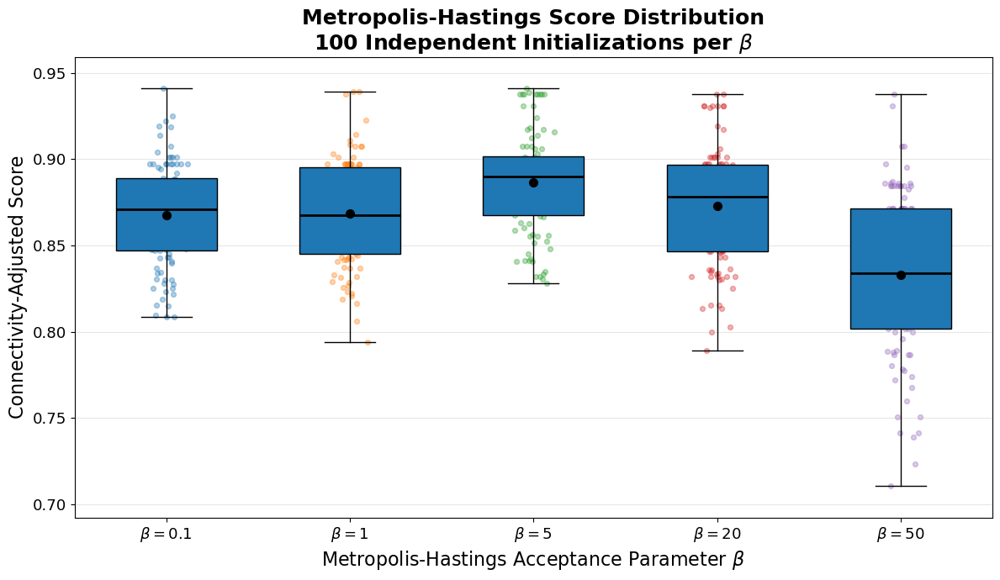

Saved mean-score plot to 'mh_beta_mean_adjusted_score_100_initializations.png'


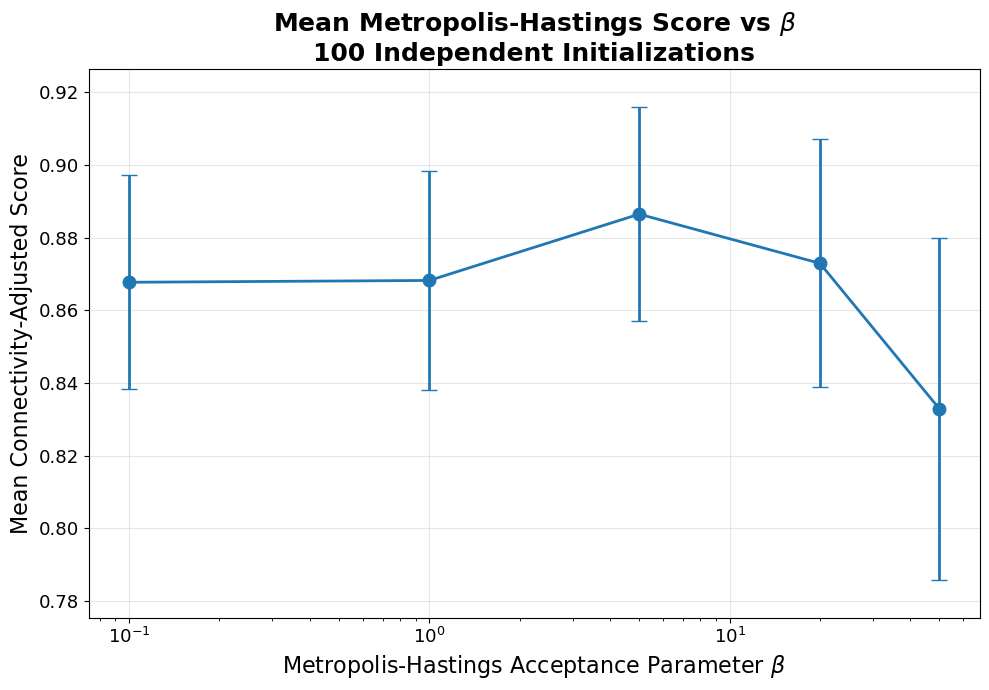


BEST BETA BASED ON MEAN ADJUSTED SCORE
Beta: 5
Mean adjusted score: 0.886465
Standard deviation: 0.029479
Best observed score: 0.940887

Saved:
  mh_beta_100_initializations_detailed.csv
  mh_beta_100_initializations_summary.csv


In [33]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

# Keep lambda / connectivity weight FIXED.
CONNECTIVITY_WEIGHT = 0.10

DISCONNECTED_SINGLETON_WEIGHT = 2.0

# Vary the Metropolis-Hastings acceptance parameter beta.
MH_BETAS = (
    0.1,
    1.0,
    5.0,
    20.0,
    50.0,
)

MH_ITERATIONS = 5000
MH_INITIALIZATION = "distance"
MH_SEED = 42

# =============================================================================
# PARTITION COLORS
# =============================================================================

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}

# =============================================================================
# SELECT THE SPECIFIC TEST MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142
EXPECTED_SMILES = "CC1C2C(CCN12)C=O"

test_reset = test.reset_index(drop=True)

if TARGET_TEST_INDEX >= len(test_reset):
    raise IndexError(
        f"Test index {TARGET_TEST_INDEX} is out of range. "
        f"The reset test set contains {len(test_reset)} molecules."
    )

selected_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

large_mol = selected_row["mol"]
large_smiles = selected_row["smiles"]
large_size_label = "Selected Large Molecule"

if large_mol is None:
    raise ValueError(
        f"The molecule at test index {TARGET_TEST_INDEX} is None."
    )

# Confirm that the selected row is the intended molecule.
if large_smiles != EXPECTED_SMILES:
    raise ValueError(
        f"Unexpected molecule at test index {TARGET_TEST_INDEX}.\n"
        f"Expected SMILES: {EXPECTED_SMILES}\n"
        f"Found SMILES:    {large_smiles}"
    )

if large_mol.GetNumAtoms() < K_TO_PLOT:
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_PLOT} nonempty partitions."
    )


print("=" * 80)
print("SELECTED TEST MOLECULE")
print("=" * 80)
print(f"Test index: {TARGET_TEST_INDEX}")
print(f"SMILES: {large_smiles}")
print(f"Total atoms: {large_mol.GetNumAtoms()}")
print(f"Heavy atoms: {large_mol.GetNumHeavyAtoms()}")
print(f"Requested partitions: k={K_TO_PLOT}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print(f"MH beta values: {list(MH_BETAS)}")
print(f"MH iterations per beta: {MH_ITERATIONS}")
print(f"MH initialization: {MH_INITIALIZATION}")
print(f"MH seed: {MH_SEED}")
print("=" * 80)

# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition.

    Bonds contained within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN 100 INDEPENDENT METROPOLIS-HASTINGS INITIALIZATIONS FOR EACH BETA
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# -----------------------------------------------------------------------------
# SETTINGS
# -----------------------------------------------------------------------------

N_INITIALIZATIONS = 100

# Starting seed used to generate the 100 independent runs.
BASE_SEED = 42

# Generate 100 different reproducible seeds.
INITIALIZATION_SEEDS = [
    BASE_SEED + initialization_index
    for initialization_index in range(N_INITIALIZATIONS)
]


print("=" * 80)
print("METROPOLIS-HASTINGS BETA DISTRIBUTION EXPERIMENT")
print("=" * 80)

print(
    f"Number of beta values: "
    f"{len(MH_BETAS)}"
)

print(
    f"Independent initializations per beta: "
    f"{N_INITIALIZATIONS}"
)

print(
    f"MH iterations per initialization: "
    f"{MH_ITERATIONS}"
)

print(
    f"Total MH runs: "
    f"{len(MH_BETAS) * N_INITIALIZATIONS}"
)

print(
    f"k = {K_TO_PLOT}"
)

print(
    f"Connectivity weight lambda = "
    f"{CONNECTIVITY_WEIGHT}"
)

print("=" * 80)


# =============================================================================
# STORE RESULTS
# =============================================================================

beta_run_results = []


# =============================================================================
# RUN EXPERIMENT
# =============================================================================

for beta_index, mh_beta in enumerate(MH_BETAS):

    print(
        f"\n{'=' * 80}"
    )

    print(
        f"Beta = {mh_beta:g}"
    )

    print(
        f"{'=' * 80}"
    )

    beta_scores = []

    # -------------------------------------------------------------------------
    # Optimizer settings remain identical for all 100 runs.
    # -------------------------------------------------------------------------

    optimizer_beta = PartitionOptimizer(
        interpreter=interpreter_no_atoms,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    # -------------------------------------------------------------------------
    # 100 independent initializations
    # -------------------------------------------------------------------------

    for initialization_index, seed in enumerate(
        INITIALIZATION_SEEDS,
        start=1
    ):

        # ---------------------------------------------------------------------
        # Run Metropolis-Hastings.
        #
        # Because the seed changes on every run:
        #
        #   1. distance initialization can select different seed atoms;
        #   2. the MH proposal sequence changes;
        #   3. the MH random accept/reject draws change.
        #
        # Thus each run is an independent stochastic search.
        # ---------------------------------------------------------------------

        interpretation = (
            optimizer_beta
            .optimize_partition_metropolis_hastings(
                mol=large_mol,
                n_clusters=K_TO_PLOT,
                n_iterations=MH_ITERATIONS,
                beta=mh_beta,
                initialization=MH_INITIALIZATION,
                seed=seed,
                verbose=False
            )
        )

        partition = (
            interpretation.partition
        )

        actual_k = len(
            set(
                partition.values()
            )
        )

        # ---------------------------------------------------------------------
        # Verify that exactly four partitions remain.
        # ---------------------------------------------------------------------

        if actual_k != K_TO_PLOT:

            raise RuntimeError(
                f"Beta={mh_beta:g}, "
                f"initialization={initialization_index}, "
                f"seed={seed}: "
                f"requested k={K_TO_PLOT}, "
                f"but MH returned k={actual_k}."
            )

        # ---------------------------------------------------------------------
        # Connectivity penalty
        # ---------------------------------------------------------------------

        connectivity_penalty = (
            partition_connectivity_penalty(
                mol=large_mol,
                partition=partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # ---------------------------------------------------------------------
        # Connectivity-adjusted score
        #
        # beta does NOT appear in this formula.
        #
        # beta affects which partitions MH explores and accepts.
        # lambda remains fixed at CONNECTIVITY_WEIGHT.
        # ---------------------------------------------------------------------

        adjusted_score = (
            connectivity_adjusted_score(
                mol=large_mol,
                interpretation=interpretation,
                connectivity_weight=(
                    CONNECTIVITY_WEIGHT
                ),
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        # ---------------------------------------------------------------------
        # Count partition-boundary bonds.
        # ---------------------------------------------------------------------

        cross_partition_bonds = [
            bond.GetIdx()
            for bond in large_mol.GetBonds()
            if (
                partition[
                    bond.GetBeginAtomIdx()
                ]
                !=
                partition[
                    bond.GetEndAtomIdx()
                ]
            )
        ]

        # ---------------------------------------------------------------------
        # Store this independent run.
        # ---------------------------------------------------------------------

        beta_run_results.append({
            "Beta": mh_beta,
            "Initialization": initialization_index,
            "Seed": seed,
            "Raw Score": interpretation.score,
            "Connectivity Penalty": (
                connectivity_penalty
            ),
            "Adjusted Score": (
                adjusted_score
            ),
            "Cross-Partition Bonds": (
                len(cross_partition_bonds)
            ),
            "Actual k": actual_k,
            "Partition": partition,
            "Interpretation": interpretation,
        })

        beta_scores.append(
            adjusted_score
        )

        # ---------------------------------------------------------------------
        # Progress output every 20 runs.
        # ---------------------------------------------------------------------

        if (
            initialization_index % 20 == 0
            or initialization_index
            == N_INITIALIZATIONS
        ):

            print(
                f"  Completed "
                f"{initialization_index:3d}/"
                f"{N_INITIALIZATIONS} "
                f"initializations"
            )

    # -------------------------------------------------------------------------
    # Summary for this beta.
    # -------------------------------------------------------------------------

    beta_scores = np.asarray(
        beta_scores
    )

    print(
        f"\n  Beta={mh_beta:g} summary:"
    )

    print(
        f"    Mean adjusted score: "
        f"{beta_scores.mean():.6f}"
    )

    print(
        f"    Std:                 "
        f"{beta_scores.std(ddof=1):.6f}"
    )

    print(
        f"    Median:              "
        f"{np.median(beta_scores):.6f}"
    )

    print(
        f"    Min:                 "
        f"{beta_scores.min():.6f}"
    )

    print(
        f"    Max:                 "
        f"{beta_scores.max():.6f}"
    )


# =============================================================================
# CONVERT RESULTS TO DATAFRAME
# =============================================================================

beta_results_df = pd.DataFrame(
    beta_run_results
)


# =============================================================================
# CREATE SUMMARY TABLE
# =============================================================================

beta_summary_df = (
    beta_results_df
    .groupby(
        "Beta",
        as_index=False
    )
    .agg(
        N=(
            "Adjusted Score",
            "count"
        ),
        Mean_Adjusted_Score=(
            "Adjusted Score",
            "mean"
        ),
        Std_Adjusted_Score=(
            "Adjusted Score",
            "std"
        ),
        Median_Adjusted_Score=(
            "Adjusted Score",
            "median"
        ),
        Min_Adjusted_Score=(
            "Adjusted Score",
            "min"
        ),
        Max_Adjusted_Score=(
            "Adjusted Score",
            "max"
        ),
        Mean_Raw_Score=(
            "Raw Score",
            "mean"
        ),
        Mean_Connectivity_Penalty=(
            "Connectivity Penalty",
            "mean"
        )
    )
)


print(
    "\n"
    + "=" * 100
)

print(
    "METROPOLIS-HASTINGS SCORE DISTRIBUTION BY BETA"
)

print(
    "=" * 100
)

print(
    beta_summary_df.to_string(
        index=False,
        float_format=(
            lambda value:
            f"{value:.6f}"
        )
    )
)


# =============================================================================
# PREPARE SCORE DISTRIBUTIONS
# =============================================================================

score_distributions = []

for mh_beta in MH_BETAS:

    scores = (
        beta_results_df.loc[
            beta_results_df["Beta"]
            == mh_beta,
            "Adjusted Score"
        ]
        .to_numpy()
    )

    score_distributions.append(
        scores
    )


# =============================================================================
# PLOT 1: BOX PLOT OF ADJUSTED SCORE DISTRIBUTIONS
# =============================================================================

fig, ax = plt.subplots(
    figsize=(12, 7)
)

positions = np.arange(
    1,
    len(MH_BETAS) + 1
)


boxplot = ax.boxplot(
    score_distributions,
    positions=positions,
    widths=0.55,
    patch_artist=True,
    showmeans=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 7,
    },
    medianprops={
        "color": "black",
        "linewidth": 2,
    }
)


# =============================================================================
# ADD ALL 100 INDIVIDUAL RESULTS
# =============================================================================
#
# A small horizontal jitter is added only for visualization.
# It does not change any data values.
# =============================================================================

jitter_rng = np.random.default_rng(
    12345
)

for position, scores in zip(
    positions,
    score_distributions
):

    horizontal_jitter = (
        jitter_rng.normal(
            loc=0.0,
            scale=0.045,
            size=len(scores)
        )
    )

    ax.scatter(
        position
        + horizontal_jitter,
        scores,
        s=18,
        alpha=0.35
    )


# =============================================================================
# FORMAT BOX PLOT
# =============================================================================

ax.set_xticks(
    positions
)

ax.set_xticklabels([
    rf"$\beta={beta:g}$"
    for beta in MH_BETAS
])

ax.set_xlabel(
    r"Metropolis-Hastings Acceptance Parameter $\beta$",
    fontsize=16
)

ax.set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Metropolis-Hastings Score Distribution\n"
    f"{N_INITIALIZATIONS} Independent Initializations per "
    r"$\beta$",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    axis="y",
    alpha=0.3
)


# =============================================================================
# DATA-DRIVEN Y AXIS
# =============================================================================
#
# Zoom the y-axis to make differences between beta values easier to see.
# =============================================================================

all_adjusted_scores = (
    beta_results_df[
        "Adjusted Score"
    ]
    .to_numpy()
)

score_min = (
    all_adjusted_scores.min()
)

score_max = (
    all_adjusted_scores.max()
)

score_range = (
    score_max - score_min
)

if score_range < 1e-12:

    score_padding = 0.01

else:

    score_padding = (
        0.08 * score_range
    )

ax.set_ylim(
    max(
        0.0,
        score_min
        - score_padding
    ),
    min(
        1.0,
        score_max
        + score_padding
    )
)


plt.tight_layout()

output_filename = (
    "mh_beta_adjusted_score_"
    "distribution_100_initializations.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved score distribution plot to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# PLOT 2: MEAN SCORE +/- STANDARD DEVIATION
# =============================================================================

beta_means = np.asarray([
    scores.mean()
    for scores in score_distributions
])

beta_stds = np.asarray([
    scores.std(
        ddof=1
    )
    for scores in score_distributions
])


fig, ax = plt.subplots(
    figsize=(10, 7)
)

ax.errorbar(
    MH_BETAS,
    beta_means,
    yerr=beta_stds,
    marker="o",
    markersize=9,
    linewidth=2,
    capsize=6
)

ax.set_xscale(
    "log"
)

ax.set_xlabel(
    r"Metropolis-Hastings Acceptance Parameter $\beta$",
    fontsize=16
)

ax.set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=16
)

ax.set_title(
    "Mean Metropolis-Hastings Score vs "
    r"$\beta$"
    "\n"
    f"{N_INITIALIZATIONS} Independent Initializations",
    fontsize=18,
    fontweight="bold"
)

ax.tick_params(
    axis="both",
    labelsize=13
)

ax.grid(
    alpha=0.3
)


mean_min = min(
    beta_means
    - beta_stds
)

mean_max = max(
    beta_means
    + beta_stds
)

mean_range = (
    mean_max
    - mean_min
)

mean_padding = (
    0.01
    if mean_range < 1e-12
    else 0.08 * mean_range
)

ax.set_ylim(
    max(
        0.0,
        mean_min
        - mean_padding
    ),
    min(
        1.0,
        mean_max
        + mean_padding
    )
)


plt.tight_layout()

mean_output_filename = (
    "mh_beta_mean_adjusted_score_"
    "100_initializations.png"
)

plt.savefig(
    mean_output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved mean-score plot to "
    f"'{mean_output_filename}'"
)

plt.show()


# =============================================================================
# IDENTIFY BEST BETA
# =============================================================================

best_beta_row = (
    beta_summary_df.loc[
        beta_summary_df[
            "Mean_Adjusted_Score"
        ].idxmax()
    ]
)

best_beta = (
    best_beta_row["Beta"]
)

print(
    "\n"
    + "=" * 80
)

print(
    "BEST BETA BASED ON MEAN ADJUSTED SCORE"
)

print(
    "=" * 80
)

print(
    f"Beta: "
    f"{best_beta:g}"
)

print(
    f"Mean adjusted score: "
    f"{best_beta_row['Mean_Adjusted_Score']:.6f}"
)

print(
    f"Standard deviation: "
    f"{best_beta_row['Std_Adjusted_Score']:.6f}"
)

print(
    f"Best observed score: "
    f"{best_beta_row['Max_Adjusted_Score']:.6f}"
)


# =============================================================================
# SAVE NUMERICAL RESULTS
# =============================================================================

# Remove the object-heavy columns before exporting the detailed CSV.
beta_results_export = (
    beta_results_df.drop(
        columns=[
            "Partition",
            "Interpretation",
        ]
    )
)

beta_results_export.to_csv(
    "mh_beta_100_initializations_detailed.csv",
    index=False
)

beta_summary_df.to_csv(
    "mh_beta_100_initializations_summary.csv",
    index=False
)

print(
    "\nSaved:"
)

print(
    "  mh_beta_100_initializations_detailed.csv"
)

print(
    "  mh_beta_100_initializations_summary.csv"
)

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Requested partitions: k=4
Lambda values: [0.01, 0.1, 0.5, 1.0, 1.5]
Initializations per lambda: 100
MH iterations per initialization: 5000
MH beta: 20.0
MH initialization: distance
Base seed: 42

Running Metropolis-Hastings with k=4, lambda=0.01...
  Completed   1/100: current raw=0.9998, current adjusted=0.9998, best adjusted=0.9998
  Completed  10/100: current raw=0.9994, current adjusted=0.9994, best adjusted=1.0000
  Completed  20/100: current raw=0.9997, current adjusted=0.9997, best adjusted=1.0000
  Completed  30/100: current raw=0.9997, current adjusted=0.9997, best adjusted=1.0000
  Completed  40/100: current raw=0.9998, current adjusted=0.9998, best adjusted=1.0000
  Completed  50/100: current raw=0.9997, current adjusted=0.9997, best adjusted=1.0000
  Completed  60/100: current raw=0.9990, current adjusted=0.9990, best adjusted=1.0000
  Completed  70/100: current raw=0.9978, current adjusted=0.9978, best adjusted=1.0000
  Completed  80

,Lambda,Initialization,Seed,Actual k,Raw Score,Connectivity Penalty,Adjusted Score,Within Fraction,Between Fraction,Higher Fraction,Within Sum,Between Sum,Higher Sum,Prediction,Decomposition Error,N Cross Bonds
0,0.01,1,42,4,0.999810,0.0,0.999810,0.999620,0.000380,0.000000,-1765.078175,-0.670547,0.000000,-1765.748722,2.273737e-13,3
1,0.01,2,43,4,1.000000,0.0,1.000000,1.000000,0.000000,0.000000,-1765.748722,0.000000,0.000000,-1765.748722,1.591616e-12,3
2,0.01,3,44,4,0.999255,0.0,0.999255,0.998510,0.001490,0.000000,-1763.117674,-2.631048,0.000000,-1765.748722,1.818989e-12,4
3,0.01,4,45,4,0.999171,0.0,0.999171,0.999032,0.000279,0.000689,-1764.039069,-0.492398,-1.217255,-1765.748722,7.503331e-12,3
4,0.01,5,46,4,0.999465,0.0,0.999465,0.998931,0.001069,0.000000,-1763.860920,-1.887802,0.000000,-1765.748722,6.821210e-13,3



METROPOLIS-HASTINGS RESULTS BY LAMBDA


,Lambda,N,Raw_Mean,Raw_Std,Raw_Median,Raw_Min,Raw_Max,Adjusted_Mean,Adjusted_Std,Adjusted_Median,Adjusted_Min,Adjusted_Max,Penalty_Mean,Penalty_Std,Cross_Bonds_Mean,Cross_Bonds_Std,Within_Fraction_Mean,Between_Fraction_Mean,Higher_Fraction_Mean
0,0.01,100,0.999462,0.000523,0.999655,0.997579,1.000000,0.999399,0.000584,0.999655,0.997579,1.000000,0.006316,0.025125,3.20,0.471405,0.998973,0.000978,0.000049
1,0.10,100,0.999096,0.000879,0.999360,0.996048,1.000000,0.999096,0.000879,0.999360,0.996048,1.000000,0.000000,0.000000,3.14,0.348735,0.998307,0.001577,0.000116
2,0.50,100,0.997927,0.001656,0.997847,0.992290,1.000000,0.997927,0.001656,0.997847,0.992290,1.000000,0.000000,0.000000,3.14,0.348735,0.996060,0.003734,0.000206
3,1.00,100,0.996061,0.002048,0.996248,0.988150,1.000000,0.996061,0.002048,0.996248,0.988150,1.000000,0.000000,0.000000,3.25,0.500000,0.992580,0.006963,0.000458
4,1.50,100,0.995101,0.002551,0.995892,0.987376,0.999739,0.995101,0.002551,0.995892,0.987376,0.999739,0.000000,0.000000,3.33,0.603943,0.990941,0.008320,0.000739



Saved score-distribution plot to 'large_molecule_metropolis_hastings_k4_100_initializations_scores_by_lambda.png'


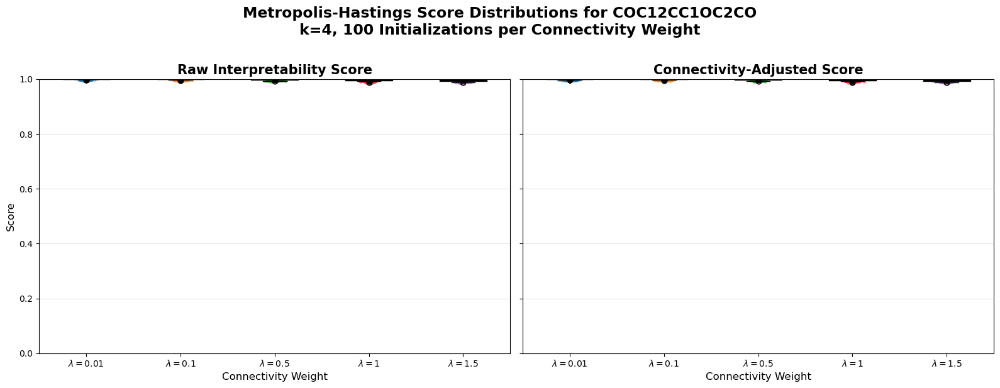

Saved score-versus-lambda plot to 'large_molecule_metropolis_hastings_k4_100_initializations_score_vs_lambda.png'


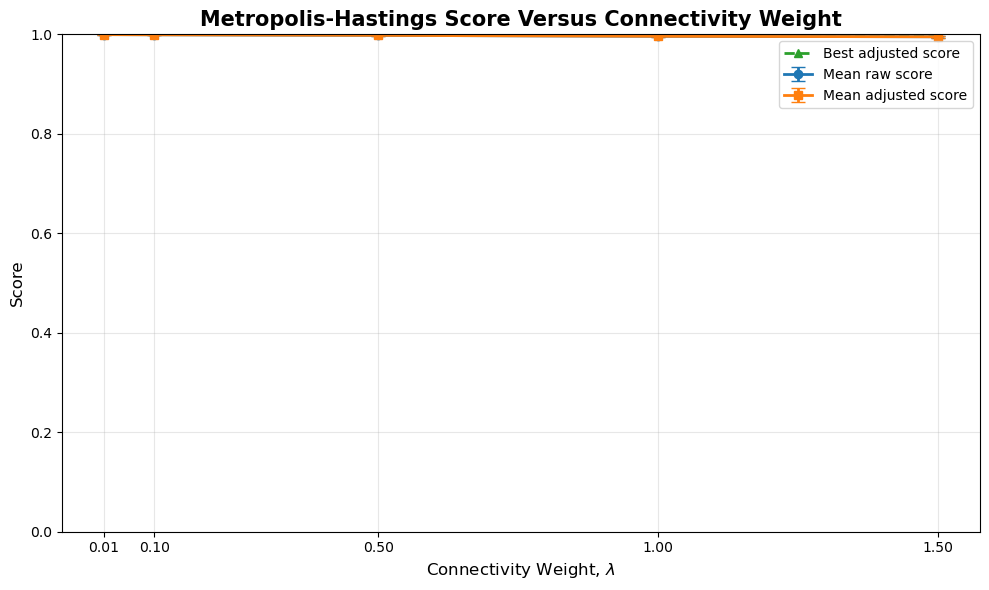


Saved best-partition visualization to 'large_molecule_metropolis_hastings_k4_best_partitions_100_initializations_by_lambda.png'


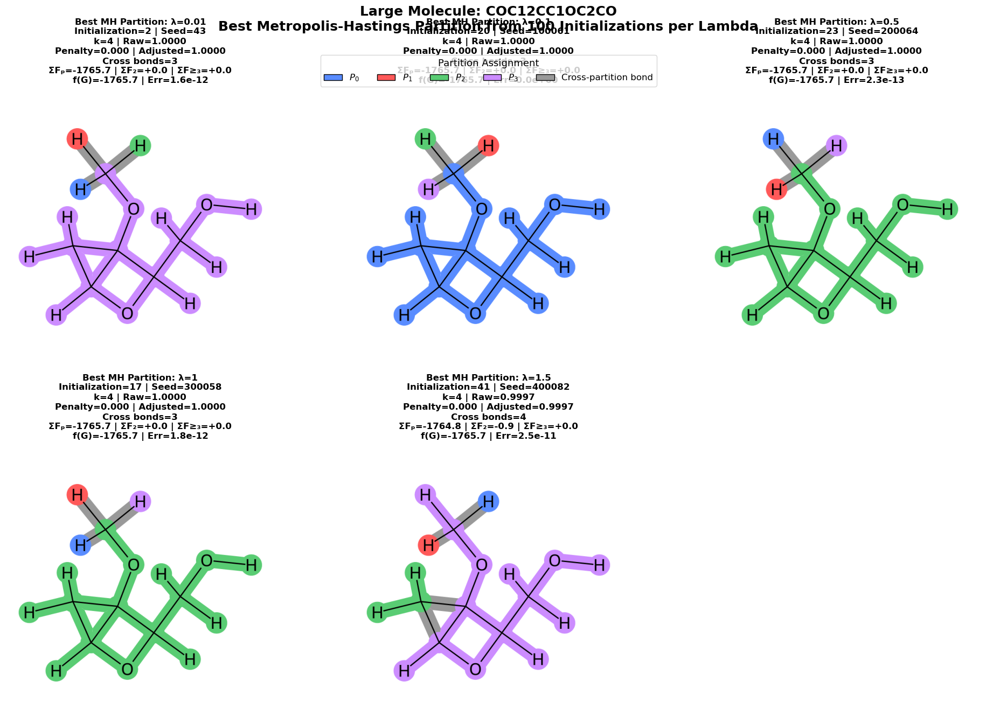


BEST METROPOLIS-HASTINGS RESULT FOR EACH LAMBDA

Lambda=0.01
  Best initialization: 2
  Seed: 43
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fraction: 0.000000
  Cross-partition bonds: [10, 11, 12]
  Partition: {0: 3, 1: 3, 2: 3, 3: 3, 4: 3, 5: 3, 6: 3, 7: 3, 8: 3, 9: 1, 10: 0, 11: 2, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3, 17: 3, 18: 3}

Lambda=0.1
  Best initialization: 20
  Seed: 100061
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  Between fraction: 0.000000
  Higher fraction: 0.000000
  Cross-partition bonds: [10, 11, 12]
  Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 2, 10: 3, 11: 1, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0}

Lambda=0.5
  Best initialization: 23
  Seed: 200064
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Within fraction: 1.000000
  

In [34]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
from matplotlib.patches import Patch

import io
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from partition_interpretability import (
    PartitionOptimizer,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_PLOT = 4

SCORE_LAMBDAS = (
    0.01,
    0.10,
    0.50,
    1.00,
    1.50,
)

N_INITIALIZATIONS = 100

DISCONNECTED_SINGLETON_WEIGHT = 2.0

MH_ITERATIONS = 5000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"

BASE_SEED = 42


PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # Blue
    1: (1.00, 0.35, 0.35),  # Red
    2: (0.35, 0.80, 0.45),  # Green
    3: (0.80, 0.55, 1.00),  # Purple
}


# =============================================================================
# SELECT THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule labeled 'Large' was found in selected_mols."
    )

large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < K_TO_PLOT:
    raise ValueError(
        f"The large molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_PLOT} nonempty partitions."
    )


print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Requested partitions: k={K_TO_PLOT}")
print(f"Lambda values: {list(SCORE_LAMBDAS)}")
print(f"Initializations per lambda: {N_INITIALIZATIONS}")
print(f"MH iterations per initialization: {MH_ITERATIONS}")
print(f"MH beta: {MH_BETA}")
print(f"MH initialization: {MH_INITIALIZATION}")
print(f"Base seed: {BASE_SEED}")
print("=" * 80)


# =============================================================================
# DRAW ONE PARTITIONED MOLECULE
# =============================================================================

def mol_to_partition_image(
    mol,
    partition,
    img_size=(650, 650)
):
    """
    Draw a molecule with atoms colored by partition membership.

    Bonds contained within one partition use that partition's color.
    Bonds crossing partition boundaries are gray.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1]
    )

    options = drawer.drawOptions()
    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    highlighted_atoms = []
    atom_colors = {}

    for atom_idx, partition_id in partition.items():
        atom_idx = int(atom_idx)
        partition_id = int(partition_id)

        highlighted_atoms.append(atom_idx)

        atom_colors[atom_idx] = PARTITION_COLORS.get(
            partition_id,
            (0.75, 0.75, 0.75)
        )

    highlighted_bonds = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        atom_1 = bond.GetBeginAtomIdx()
        atom_2 = bond.GetEndAtomIdx()

        partition_1 = partition[atom_1]
        partition_2 = partition[atom_2]

        highlighted_bonds.append(bond_idx)

        if partition_1 == partition_2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                partition_1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (
                0.60,
                0.60,
                0.60
            )

    drawer.DrawMolecule(
        mol,
        highlightAtoms=highlighted_atoms,
        highlightAtomColors=atom_colors,
        highlightBonds=highlighted_bonds,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()

    return Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )


# =============================================================================
# RUN 100 METROPOLIS-HASTINGS INITIALIZATIONS FOR EACH LAMBDA
# =============================================================================

lambda_results = []

# Store the best result found for each lambda.
best_results_by_lambda = {}

for lambda_index, score_lambda in enumerate(SCORE_LAMBDAS):

    print(
        f"\nRunning Metropolis-Hastings with "
        f"k={K_TO_PLOT}, lambda={score_lambda:g}..."
    )

    # Lambda is part of the optimization objective, so every lambda
    # requires a separate optimizer.
    optimizer_lambda = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_PLOT,
        max_partitions=K_TO_PLOT,
        connectivity_weight=score_lambda,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        )
    )

    best_result = None
    best_adjusted_score = -np.inf

    for initialization_index in range(N_INITIALIZATIONS):

        # Use a distinct deterministic seed for each lambda/run pair.
        run_seed = (
            BASE_SEED
            + 100_000 * lambda_index
            + initialization_index
        )

        interpretation = (
            optimizer_lambda
            .optimize_partition_metropolis_hastings(
                mol=large_mol,
                n_clusters=K_TO_PLOT,
                n_iterations=MH_ITERATIONS,
                beta=MH_BETA,
                initialization=MH_INITIALIZATION,
                seed=run_seed,
                verbose=False
            )
        )

        partition = interpretation.partition

        actual_k = len(
            set(partition.values())
        )

        if actual_k != K_TO_PLOT:
            raise RuntimeError(
                f"Lambda={score_lambda:g}, initialization "
                f"{initialization_index + 1} requested "
                f"k={K_TO_PLOT}, but returned k={actual_k}."
            )

        connectivity_penalty = (
            partition_connectivity_penalty(
                mol=large_mol,
                partition=partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        adjusted_score = (
            connectivity_adjusted_score(
                mol=large_mol,
                interpretation=interpretation,
                connectivity_weight=score_lambda,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                )
            )
        )

        breakdown = (
            interpretation.get_contribution_breakdown()
        )

        within_sum = sum(
            interpretation.within_partition.values()
        )

        between_sum = sum(
            interpretation.between_partition.values()
        )

        higher_sum = sum(
            interpretation.higher_order.values()
        )

        reconstructed_prediction = (
            within_sum
            + between_sum
            + higher_sum
        )

        decomposition_error = abs(
            reconstructed_prediction
            - interpretation.total_prediction
        )

        cross_partition_bonds = [
            bond.GetIdx()
            for bond in large_mol.GetBonds()
            if (
                partition[bond.GetBeginAtomIdx()]
                != partition[bond.GetEndAtomIdx()]
            )
        ]

        result = {
            "Lambda": score_lambda,
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Actual k": actual_k,
            "Raw Score": interpretation.score,
            "Connectivity Penalty": connectivity_penalty,
            "Adjusted Score": adjusted_score,
            "Within Fraction": breakdown["within_frac"],
            "Between Fraction": breakdown["between_frac"],
            "Higher Fraction": breakdown["higher_frac"],
            "Within Sum": within_sum,
            "Between Sum": between_sum,
            "Higher Sum": higher_sum,
            "Prediction": reconstructed_prediction,
            "Decomposition Error": decomposition_error,
            "N Cross Bonds": len(cross_partition_bonds),
            "Cross Bonds": cross_partition_bonds,
            "Partition": partition.copy(),
            "Interpretation": interpretation,
        }

        lambda_results.append(result)

        if adjusted_score > best_adjusted_score:
            best_adjusted_score = adjusted_score
            best_result = result

        if (
            initialization_index == 0
            or (initialization_index + 1) % 10 == 0
        ):
            print(
                f"  Completed {initialization_index + 1:3d}/"
                f"{N_INITIALIZATIONS}: "
                f"current raw={interpretation.score:.4f}, "
                f"current adjusted={adjusted_score:.4f}, "
                f"best adjusted={best_adjusted_score:.4f}"
            )

    best_results_by_lambda[score_lambda] = best_result

    print(
        f"  Best lambda={score_lambda:g}: "
        f"raw={best_result['Raw Score']:.4f}, "
        f"penalty={best_result['Connectivity Penalty']:.4f}, "
        f"adjusted={best_result['Adjusted Score']:.4f}, "
        f"initialization={best_result['Initialization']}"
    )


# =============================================================================
# CONVERT RESULTS TO A DATAFRAME
# =============================================================================

lambda_score_df = pd.DataFrame([
    {
        key: value
        for key, value in result.items()
        if key not in {
            "Partition",
            "Interpretation",
            "Cross Bonds",
        }
    }
    for result in lambda_results
])

print("\nResult shape:")
print(lambda_score_df.shape)

print("\nFirst rows:")
display(lambda_score_df.head())


# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

lambda_summary_df = (
    lambda_score_df
    .groupby("Lambda")
    .agg(
        N=("Adjusted Score", "size"),
        Raw_Mean=("Raw Score", "mean"),
        Raw_Std=("Raw Score", "std"),
        Raw_Median=("Raw Score", "median"),
        Raw_Min=("Raw Score", "min"),
        Raw_Max=("Raw Score", "max"),
        Adjusted_Mean=("Adjusted Score", "mean"),
        Adjusted_Std=("Adjusted Score", "std"),
        Adjusted_Median=("Adjusted Score", "median"),
        Adjusted_Min=("Adjusted Score", "min"),
        Adjusted_Max=("Adjusted Score", "max"),
        Penalty_Mean=("Connectivity Penalty", "mean"),
        Penalty_Std=("Connectivity Penalty", "std"),
        Cross_Bonds_Mean=("N Cross Bonds", "mean"),
        Cross_Bonds_Std=("N Cross Bonds", "std"),
        Within_Fraction_Mean=("Within Fraction", "mean"),
        Between_Fraction_Mean=("Between Fraction", "mean"),
        Higher_Fraction_Mean=("Higher Fraction", "mean"),
    )
    .reset_index()
)

print("\n" + "=" * 80)
print("METROPOLIS-HASTINGS RESULTS BY LAMBDA")
print("=" * 80)

display(lambda_summary_df.round(6))


# =============================================================================
# PLOT RAW AND ADJUSTED SCORE DISTRIBUTIONS PER LAMBDA
# =============================================================================

lambda_labels = [
    rf"$\lambda={score_lambda:g}$"
    for score_lambda in SCORE_LAMBDAS
]

raw_scores_by_lambda = [
    lambda_score_df.loc[
        np.isclose(
            lambda_score_df["Lambda"],
            score_lambda
        ),
        "Raw Score"
    ].to_numpy()
    for score_lambda in SCORE_LAMBDAS
]

adjusted_scores_by_lambda = [
    lambda_score_df.loc[
        np.isclose(
            lambda_score_df["Lambda"],
            score_lambda
        ),
        "Adjusted Score"
    ].to_numpy()
    for score_lambda in SCORE_LAMBDAS
]


fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(16, 6),
    sharey=True
)


# -----------------------------------------------------------------------------
# Raw score distributions
# -----------------------------------------------------------------------------

axes[0].boxplot(
    raw_scores_by_lambda,
    tick_labels=lambda_labels,
    showmeans=True,
    meanline=False,
    patch_artist=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 6,
    },
    medianprops={
        "color": "black",
        "linewidth": 1.5,
    },
)

jitter_rng = np.random.default_rng(BASE_SEED)

for position, scores in enumerate(
    raw_scores_by_lambda,
    start=1
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.04,
        size=len(scores)
    )

    axes[0].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18
    )

axes[0].set_title(
    "Raw Interpretability Score",
    fontsize=15,
    fontweight="bold"
)

axes[0].set_xlabel(
    "Connectivity Weight",
    fontsize=12
)

axes[0].set_ylabel(
    "Score",
    fontsize=12
)

axes[0].set_ylim(0.0, 1.0)

axes[0].grid(
    axis="y",
    alpha=0.3
)


# -----------------------------------------------------------------------------
# Adjusted score distributions
# -----------------------------------------------------------------------------

axes[1].boxplot(
    adjusted_scores_by_lambda,
    tick_labels=lambda_labels,
    showmeans=True,
    meanline=False,
    patch_artist=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 6,
    },
    medianprops={
        "color": "black",
        "linewidth": 1.5,
    },
)

for position, scores in enumerate(
    adjusted_scores_by_lambda,
    start=1
):
    x_values = jitter_rng.normal(
        loc=position,
        scale=0.04,
        size=len(scores)
    )

    axes[1].scatter(
        x_values,
        scores,
        alpha=0.30,
        s=18
    )

axes[1].set_title(
    "Connectivity-Adjusted Score",
    fontsize=15,
    fontweight="bold"
)

axes[1].set_xlabel(
    "Connectivity Weight",
    fontsize=12
)

axes[1].set_ylim(0.0, 1.0)

axes[1].grid(
    axis="y",
    alpha=0.3
)


fig.suptitle(
    f"Metropolis-Hastings Score Distributions for {large_smiles}\n"
    f"k={K_TO_PLOT}, "
    f"{N_INITIALIZATIONS} Initializations per Connectivity Weight",
    fontsize=17,
    fontweight="bold",
    y=1.02
)

plt.tight_layout()

score_distribution_filename = (
    "large_molecule_metropolis_hastings_"
    "k4_100_initializations_scores_by_lambda.png"
)

plt.savefig(
    score_distribution_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved score-distribution plot to "
    f"'{score_distribution_filename}'"
)

plt.show()


# =============================================================================
# PLOT MEAN SCORE VERSUS LAMBDA
# =============================================================================

raw_mean = (
    lambda_score_df
    .groupby("Lambda")["Raw Score"]
    .mean()
    .reindex(SCORE_LAMBDAS)
)

raw_std = (
    lambda_score_df
    .groupby("Lambda")["Raw Score"]
    .std()
    .reindex(SCORE_LAMBDAS)
)

adjusted_mean = (
    lambda_score_df
    .groupby("Lambda")["Adjusted Score"]
    .mean()
    .reindex(SCORE_LAMBDAS)
)

adjusted_std = (
    lambda_score_df
    .groupby("Lambda")["Adjusted Score"]
    .std()
    .reindex(SCORE_LAMBDAS)
)

best_adjusted_scores = np.asarray([
    best_results_by_lambda[score_lambda]["Adjusted Score"]
    for score_lambda in SCORE_LAMBDAS
])

lambda_array = np.asarray(
    SCORE_LAMBDAS,
    dtype=float
)


fig, ax = plt.subplots(
    figsize=(10, 6)
)

ax.errorbar(
    lambda_array,
    raw_mean.to_numpy(),
    yerr=raw_std.to_numpy(),
    marker="o",
    linewidth=2,
    capsize=5,
    label="Mean raw score"
)

ax.errorbar(
    lambda_array,
    adjusted_mean.to_numpy(),
    yerr=adjusted_std.to_numpy(),
    marker="s",
    linewidth=2,
    capsize=5,
    label="Mean adjusted score"
)

ax.plot(
    lambda_array,
    best_adjusted_scores,
    marker="^",
    linestyle="--",
    linewidth=2,
    label="Best adjusted score"
)

ax.set_title(
    "Metropolis-Hastings Score Versus Connectivity Weight",
    fontsize=15,
    fontweight="bold"
)

ax.set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=12
)

ax.set_ylabel(
    "Score",
    fontsize=12
)

ax.set_xticks(lambda_array)
ax.set_ylim(0.0, 1.0)

ax.grid(
    alpha=0.3
)

ax.legend()

plt.tight_layout()

score_vs_lambda_filename = (
    "large_molecule_metropolis_hastings_"
    "k4_100_initializations_score_vs_lambda.png"
)

plt.savefig(
    score_vs_lambda_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"Saved score-versus-lambda plot to "
    f"'{score_vs_lambda_filename}'"
)

plt.show()



# =============================================================================
# DRAW THE BEST PARTITION FOUND FOR EACH LAMBDA
# =============================================================================

fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(20, 14),
    squeeze=False
)

axes = axes.reshape(-1)

for ax, score_lambda in zip(
    axes,
    SCORE_LAMBDAS
):
    result = best_results_by_lambda[score_lambda]

    partition = result["Partition"]
    interpretation = result["Interpretation"]

    image = mol_to_partition_image(
        mol=large_mol,
        partition=partition,
        img_size=(650, 650)
    )

    title = (
        f"Best MH Partition: λ={score_lambda:g}\n"
        f"Initialization={result['Initialization']} | "
        f"Seed={result['Seed']}\n"
        f"k={result['Actual k']} | "
        f"Raw={result['Raw Score']:.4f}\n"
        f"Penalty={result['Connectivity Penalty']:.3f} | "
        f"Adjusted={result['Adjusted Score']:.4f}\n"
        f"Cross bonds={result['N Cross Bonds']}\n"
        f"ΣFₚ={result['Within Sum']:+.1f} | "
        f"ΣF₂={result['Between Sum']:+.1f} | "
        f"ΣF≥₃={result['Higher Sum']:+.1f}\n"
        f"f(G)={result['Prediction']:+.1f} | "
        f"Err={result['Decomposition Error']:.1e}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=12,
        fontweight="bold",
        pad=12
    )


# Hide the sixth unused subplot.
for ax in axes[len(SCORE_LAMBDAS):]:
    ax.axis("off")


# =============================================================================
# ADD COMMON LEGEND
# =============================================================================

legend_handles = [
    Patch(
        facecolor=PARTITION_COLORS[partition_id],
        edgecolor="black",
        label=fr"$P_{{{partition_id}}}$"
    )
    for partition_id in range(K_TO_PLOT)
]

legend_handles.append(
    Patch(
        facecolor=(0.60, 0.60, 0.60),
        edgecolor="black",
        label="Cross-partition bond"
    )
)

fig.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.925),
    ncol=len(legend_handles),
    fontsize=12,
    title="Partition Assignment",
    title_fontsize=13,
    frameon=True
)

fig.suptitle(
    f"Large Molecule: {large_smiles}\n"
    f"Best Metropolis-Hastings Partition from "
    f"{N_INITIALIZATIONS} Initializations per Lambda",
    fontsize=18,
    fontweight="bold",
    y=0.985
)

fig.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.04,
    top=0.87,
    hspace=0.32,
    wspace=0.10
)

best_partition_filename = (
    "large_molecule_metropolis_hastings_"
    "k4_best_partitions_100_initializations_by_lambda.png"
)

plt.savefig(
    best_partition_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved best-partition visualization to "
    f"'{best_partition_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FOR EACH LAMBDA
# =============================================================================

print("\n" + "=" * 80)
print("BEST METROPOLIS-HASTINGS RESULT FOR EACH LAMBDA")
print("=" * 80)

for score_lambda in SCORE_LAMBDAS:

    result = best_results_by_lambda[score_lambda]

    print(f"\nLambda={score_lambda:g}")

    print(
        f"  Best initialization: "
        f"{result['Initialization']}"
    )

    print(
        f"  Seed: "
        f"{result['Seed']}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Within fraction: "
        f"{result['Within Fraction']:.6f}"
    )

    print(
        f"  Between fraction: "
        f"{result['Between Fraction']:.6f}"
    )

    print(
        f"  Higher fraction: "
        f"{result['Higher Fraction']:.6f}"
    )

    print(
        f"  Cross-partition bonds: "
        f"{result['Cross Bonds']}"
    )

    print(
        f"  Partition: "
        f"{result['Partition']}"
    )


# =============================================================================
# SAVE NUMERICAL RESULTS
# =============================================================================

lambda_score_df.to_csv(
    "large_molecule_metropolis_hastings_"
    "k4_100_initializations_scores_by_lambda.csv",
    index=False
)

lambda_summary_df.to_csv(
    "large_molecule_metropolis_hastings_"
    "k4_100_initializations_summary_by_lambda.csv",
    index=False
)

print("\nSaved numerical results to:")

print(
    "  large_molecule_metropolis_hastings_"
    "k4_100_initializations_scores_by_lambda.csv"
)

print(
    "  large_molecule_metropolis_hastings_"
    "k4_100_initializations_summary_by_lambda.csv"
)

LARGE MOLECULE: COC12CC1OC2CO
Atoms: 19
Partitions: k=4
Initializations per method: 100
Connectivity weight: 0.1
Greedy iterations: 100
Metropolis-Hastings iterations: 5000
Metropolis-Hastings beta: 20.0
Completed   1/100: Greedy=0.9939, MH=0.9998, MH-Greedy=+0.0059
Completed  10/100: Greedy=0.9885, MH=0.9997, MH-Greedy=+0.0112
Completed  20/100: Greedy=0.9907, MH=0.9976, MH-Greedy=+0.0069
Completed  30/100: Greedy=0.9915, MH=0.9978, MH-Greedy=+0.0062
Completed  40/100: Greedy=0.9901, MH=0.9997, MH-Greedy=+0.0095
Completed  50/100: Greedy=0.9915, MH=0.9982, MH-Greedy=+0.0066
Completed  60/100: Greedy=0.9907, MH=0.9979, MH-Greedy=+0.0072
Completed  70/100: Greedy=0.9915, MH=0.9983, MH-Greedy=+0.0068
Completed  80/100: Greedy=0.9851, MH=0.9995, MH-Greedy=+0.0144
Completed  90/100: Greedy=0.9925, MH=0.9992, MH-Greedy=+0.0067
Completed 100/100: Greedy=0.9906, MH=0.9997, MH-Greedy=+0.0090

First comparison rows:


,Initialization,Seed,Initial Raw Score,Initial Adjusted Score,Greedy Raw Score,Greedy Connectivity Penalty,Greedy Adjusted Score,MH Raw Score,MH Connectivity Penalty,MH Adjusted Score,MH Minus Greedy
0,1,42,0.991159,0.991159,0.993868,0.0,0.993868,0.999810,0.0,0.999810,0.005942
1,2,43,0.991549,0.991549,0.993827,0.0,0.993827,0.999465,0.0,0.999465,0.005639
2,3,44,0.982687,0.982687,0.990893,0.0,0.990893,0.999810,0.0,0.999810,0.008917
3,4,45,0.997115,0.997115,0.998005,0.0,0.998005,0.999655,0.0,0.999655,0.001650
4,5,46,0.985001,0.985001,0.988651,0.0,0.988651,0.999465,0.0,0.999465,0.010815



CONNECTIVITY-ADJUSTED SCORE COMPARISON


,Method,N,Mean Adjusted Score,Std Adjusted Score,Median Adjusted Score,Minimum Adjusted Score,Maximum Adjusted Score
0,Greedy-Distance,100,0.992421,0.003229,0.992173,0.985107,1.0
1,Metropolis-Hastings,100,0.999049,0.000834,0.999465,0.996767,1.0



Metropolis-Hastings higher: 96/100
Greedy-Distance higher: 0/100
Ties: 4/100
Mean paired difference (MH - Greedy): +0.006628
Median paired difference (MH - Greedy): +0.006774
Shared Greedy-Distance/MH score limits: (0.9839155229726945, 1.0)

Saved comparison plot to 'large_molecule_greedy_distance_vs_metropolis_hastings_100_initializations.png'


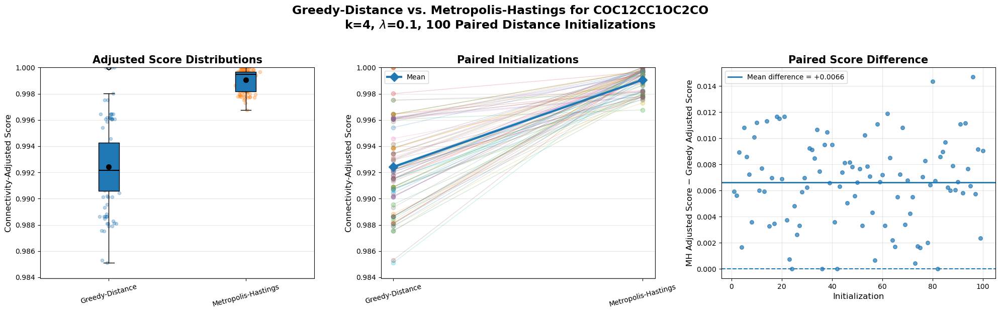


BEST RESULT FROM EACH METHOD

Greedy-Distance
  Initialization: 24
  Seed: 65
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 2, 10: 1, 11: 3, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0}

Metropolis-Hastings
  Initialization: 16
  Seed: 57
  Raw score: 1.000000
  Connectivity penalty: 0.000000
  Adjusted score: 1.000000
  Partition: {0: 3, 1: 3, 2: 3, 3: 3, 4: 3, 5: 3, 6: 3, 7: 3, 8: 3, 9: 1, 10: 0, 11: 2, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3, 17: 3, 18: 3}

Saved numerical results to:
  large_molecule_greedy_distance_vs_metropolis_hastings_100_initializations_detailed.csv
  large_molecule_greedy_distance_vs_metropolis_hastings_100_initializations_summary.csv


In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionOptimizer,
    ChemicalPartitioner,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_COMPARE = 4
CONNECTIVITY_WEIGHT = 0.10

N_INITIALIZATIONS = 100
BASE_SEED = 42

GREEDY_ITERATIONS = 100

MH_ITERATIONS = 5000
MH_BETA = 20.0

DISCONNECTED_SINGLETON_WEIGHT = 2.0


# =============================================================================
# SELECT THE LARGE MOLECULE
# =============================================================================

large_molecules = [
    (mol, smiles, size_label)
    for mol, smiles, size_label in selected_mols
    if str(size_label).strip().lower() == "large"
]

if not large_molecules:
    raise ValueError(
        "No molecule labeled 'Large' was found in selected_mols."
    )

large_mol, large_smiles, large_size_label = large_molecules[0]

if large_mol.GetNumAtoms() < K_TO_COMPARE:
    raise ValueError(
        f"The selected molecule has only {large_mol.GetNumAtoms()} atoms, "
        f"so it cannot have {K_TO_COMPARE} nonempty partitions."
    )


print("=" * 80)
print(f"LARGE MOLECULE: {large_smiles}")
print(f"Atoms: {large_mol.GetNumAtoms()}")
print(f"Partitions: k={K_TO_COMPARE}")
print(f"Initializations per method: {N_INITIALIZATIONS}")
print(f"Connectivity weight: {CONNECTIVITY_WEIGHT}")
print(f"Greedy iterations: {GREEDY_ITERATIONS}")
print(f"Metropolis-Hastings iterations: {MH_ITERATIONS}")
print(f"Metropolis-Hastings beta: {MH_BETA}")
print("=" * 80)


# =============================================================================
# CREATE OPTIMIZER
# =============================================================================

optimizer = PartitionOptimizer(
    interpreter=interpreter,
    min_partitions=K_TO_COMPARE,
    max_partitions=K_TO_COMPARE,
    connectivity_weight=CONNECTIVITY_WEIGHT,
    disconnected_singleton_weight=(
        DISCONNECTED_SINGLETON_WEIGHT
    ),
)


# =============================================================================
# RUN PAIRED INITIALIZATIONS
# =============================================================================

comparison_results = []

best_results = {
    "Greedy-Distance": None,
    "Metropolis-Hastings": None,
}

best_scores = {
    "Greedy-Distance": -np.inf,
    "Metropolis-Hastings": -np.inf,
}


for initialization_index in range(N_INITIALIZATIONS):

    run_seed = BASE_SEED + initialization_index

    # -------------------------------------------------------------------------
    # Construct one common distance-based initial partition.
    # Both methods begin from this exact partition.
    # -------------------------------------------------------------------------

    initial_partition = ChemicalPartitioner.distance_partition(
        mol=large_mol,
        n_clusters=K_TO_COMPARE,
        seed=run_seed,
    )

    initial_k = len(set(initial_partition.values()))

    if initial_k != K_TO_COMPARE:
        raise RuntimeError(
            f"Initialization {initialization_index + 1} returned "
            f"k={initial_k} instead of k={K_TO_COMPARE}."
        )

    initial_interpretation = (
        interpreter.compute_partition_contributions(
            mol=large_mol,
            partition=initial_partition,
        )
    )

    initial_adjusted_score = connectivity_adjusted_score(
        mol=large_mol,
        interpretation=initial_interpretation,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )


    # -------------------------------------------------------------------------
    # Greedy-Distance
    #
    # Use the internal best-neighbor optimizer directly so that the supplied
    # starting partition is exactly the same as the MH starting partition.
    # -------------------------------------------------------------------------

    greedy_interpretation = (
        optimizer._greedy_helper.optimize_with_best_neighbor(
            mol=large_mol,
            initial_partition=initial_partition.copy(),
            n_iterations=GREEDY_ITERATIONS,
            seed=run_seed,
            verbose=False,
        )
    )

    greedy_partition = greedy_interpretation.partition

    greedy_actual_k = len(
        set(greedy_partition.values())
    )

    if greedy_actual_k != K_TO_COMPARE:
        raise RuntimeError(
            f"Greedy-Distance initialization "
            f"{initialization_index + 1} returned "
            f"k={greedy_actual_k}."
        )

    greedy_penalty = partition_connectivity_penalty(
        mol=large_mol,
        partition=greedy_partition,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    greedy_adjusted_score = connectivity_adjusted_score(
        mol=large_mol,
        interpretation=greedy_interpretation,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )


    # -------------------------------------------------------------------------
    # Metropolis-Hastings
    #
    # initial_partition is supplied explicitly, so initialization="distance"
    # is ignored. This guarantees that MH starts from the same partition.
    # -------------------------------------------------------------------------

    mh_interpretation = (
        optimizer.optimize_partition_metropolis_hastings(
            mol=large_mol,
            n_clusters=K_TO_COMPARE,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initial_partition=initial_partition.copy(),
            seed=run_seed,
            verbose=False,
        )
    )

    mh_partition = mh_interpretation.partition

    mh_actual_k = len(
        set(mh_partition.values())
    )

    if mh_actual_k != K_TO_COMPARE:
        raise RuntimeError(
            f"Metropolis-Hastings initialization "
            f"{initialization_index + 1} returned "
            f"k={mh_actual_k}."
        )

    mh_penalty = partition_connectivity_penalty(
        mol=large_mol,
        partition=mh_partition,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    mh_adjusted_score = connectivity_adjusted_score(
        mol=large_mol,
        interpretation=mh_interpretation,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )


    # -------------------------------------------------------------------------
    # Save paired results
    # -------------------------------------------------------------------------

    score_difference = (
        mh_adjusted_score
        - greedy_adjusted_score
    )

    comparison_results.append({
        "Initialization": initialization_index + 1,
        "Seed": run_seed,
        "Initial Raw Score": initial_interpretation.score,
        "Initial Adjusted Score": initial_adjusted_score,
        "Greedy Raw Score": greedy_interpretation.score,
        "Greedy Connectivity Penalty": greedy_penalty,
        "Greedy Adjusted Score": greedy_adjusted_score,
        "MH Raw Score": mh_interpretation.score,
        "MH Connectivity Penalty": mh_penalty,
        "MH Adjusted Score": mh_adjusted_score,
        "MH Minus Greedy": score_difference,
        "Greedy Partition": greedy_partition.copy(),
        "MH Partition": mh_partition.copy(),
        "Greedy Interpretation": greedy_interpretation,
        "MH Interpretation": mh_interpretation,
    })


    # -------------------------------------------------------------------------
    # Track the best partition from each method
    # -------------------------------------------------------------------------

    if greedy_adjusted_score > best_scores["Greedy-Distance"]:
        best_scores["Greedy-Distance"] = greedy_adjusted_score

        best_results["Greedy-Distance"] = {
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Interpretation": greedy_interpretation,
            "Partition": greedy_partition.copy(),
            "Raw Score": greedy_interpretation.score,
            "Connectivity Penalty": greedy_penalty,
            "Adjusted Score": greedy_adjusted_score,
        }

    if mh_adjusted_score > best_scores["Metropolis-Hastings"]:
        best_scores["Metropolis-Hastings"] = mh_adjusted_score

        best_results["Metropolis-Hastings"] = {
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Interpretation": mh_interpretation,
            "Partition": mh_partition.copy(),
            "Raw Score": mh_interpretation.score,
            "Connectivity Penalty": mh_penalty,
            "Adjusted Score": mh_adjusted_score,
        }


    if (
        initialization_index == 0
        or (initialization_index + 1) % 10 == 0
    ):
        print(
            f"Completed {initialization_index + 1:3d}/"
            f"{N_INITIALIZATIONS}: "
            f"Greedy={greedy_adjusted_score:.4f}, "
            f"MH={mh_adjusted_score:.4f}, "
            f"MH-Greedy={score_difference:+.4f}"
        )


# =============================================================================
# CREATE DATAFRAME
# =============================================================================

comparison_df = pd.DataFrame([
    {
        key: value
        for key, value in result.items()
        if key not in {
            "Greedy Partition",
            "MH Partition",
            "Greedy Interpretation",
            "MH Interpretation",
        }
    }
    for result in comparison_results
])

print("\nFirst comparison rows:")
display(comparison_df.head())


# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

greedy_scores = comparison_df[
    "Greedy Adjusted Score"
].to_numpy()

mh_scores = comparison_df[
    "MH Adjusted Score"
].to_numpy()

score_differences = comparison_df[
    "MH Minus Greedy"
].to_numpy()


summary_df = pd.DataFrame([
    {
        "Method": "Greedy-Distance",
        "N": len(greedy_scores),
        "Mean Adjusted Score": np.mean(greedy_scores),
        "Std Adjusted Score": np.std(
            greedy_scores,
            ddof=1
        ),
        "Median Adjusted Score": np.median(greedy_scores),
        "Minimum Adjusted Score": np.min(greedy_scores),
        "Maximum Adjusted Score": np.max(greedy_scores),
    },
    {
        "Method": "Metropolis-Hastings",
        "N": len(mh_scores),
        "Mean Adjusted Score": np.mean(mh_scores),
        "Std Adjusted Score": np.std(
            mh_scores,
            ddof=1
        ),
        "Median Adjusted Score": np.median(mh_scores),
        "Minimum Adjusted Score": np.min(mh_scores),
        "Maximum Adjusted Score": np.max(mh_scores),
    },
])

print("\n" + "=" * 80)
print("CONNECTIVITY-ADJUSTED SCORE COMPARISON")
print("=" * 80)

display(summary_df.round(6))


mh_wins = int(
    np.sum(score_differences > 1e-12)
)

greedy_wins = int(
    np.sum(score_differences < -1e-12)
)

ties = int(
    np.sum(np.abs(score_differences) <= 1e-12)
)

print(
    f"\nMetropolis-Hastings higher: "
    f"{mh_wins}/{N_INITIALIZATIONS}"
)

print(
    f"Greedy-Distance higher: "
    f"{greedy_wins}/{N_INITIALIZATIONS}"
)

print(
    f"Ties: "
    f"{ties}/{N_INITIALIZATIONS}"
)

print(
    f"Mean paired difference (MH - Greedy): "
    f"{np.mean(score_differences):+.6f}"
)

print(
    f"Median paired difference (MH - Greedy): "
    f"{np.median(score_differences):+.6f}"
)

# =============================================================================
# CALCULATE SHARED Y-AXIS LIMITS FOR PANELS 1 AND 2
# =============================================================================

all_method_scores = np.concatenate([
    greedy_scores,
    mh_scores,
])

score_min = np.min(all_method_scores)
score_max = np.max(all_method_scores)
score_range = score_max - score_min

# Add padding so points and boxplot whiskers do not touch the boundaries.
if score_range < 1e-10:
    score_padding = 0.01
else:
    score_padding = 0.08 * score_range

comparison_score_ylim = (
    max(0.0, score_min - score_padding),
    min(1.0, score_max + score_padding),
)

print(
    "Shared Greedy-Distance/MH score limits:",
    comparison_score_ylim,
)

# =============================================================================
# PLOT COMPARISON
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(20, 6),
)


# -----------------------------------------------------------------------------
# Panel 1: boxplots and individual scores
# -----------------------------------------------------------------------------

score_groups = [
    greedy_scores,
    mh_scores,
]

method_labels = [
    "Greedy-Distance",
    "Metropolis-Hastings",
]

axes[0].boxplot(
    score_groups,
    tick_labels=method_labels,
    showmeans=True,
    patch_artist=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 7,
    },
    medianprops={
        "color": "black",
        "linewidth": 1.5,
    },
)

jitter_rng = np.random.default_rng(BASE_SEED)

for position, scores in enumerate(
    score_groups,
    start=1,
):
    jittered_x = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[0].scatter(
        jittered_x,
        scores,
        alpha=0.30,
        s=20,
    )

axes[0].set_title(
    "Adjusted Score Distributions",
    fontsize=15,
    fontweight="bold",
)

axes[0].set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=12,
)

axes[0].tick_params(
    axis="x",
    labelrotation=15,
)

axes[0].set_ylim(comparison_score_ylim)
axes[0].grid(axis="y", alpha=0.3)


# -----------------------------------------------------------------------------
# Panel 2: paired scores
# -----------------------------------------------------------------------------

for initialization_index in range(N_INITIALIZATIONS):
    axes[1].plot(
        [0, 1],
        [
            greedy_scores[initialization_index],
            mh_scores[initialization_index],
        ],
        marker="o",
        linewidth=0.8,
        alpha=0.25,
    )

axes[1].plot(
    [0, 1],
    [
        np.mean(greedy_scores),
        np.mean(mh_scores),
    ],
    marker="D",
    linewidth=3,
    markersize=9,
    label="Mean",
)

axes[1].set_xticks(
    [0, 1],
    method_labels,
    rotation=15,
)

axes[1].set_title(
    "Paired Initializations",
    fontsize=15,
    fontweight="bold",
)

axes[1].set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=12,
)

axes[1].set_ylim(comparison_score_ylim)
axes[1].grid(axis="y", alpha=0.3)
axes[1].legend()


# -----------------------------------------------------------------------------
# Panel 3: paired score differences
# -----------------------------------------------------------------------------

initialization_numbers = np.arange(
    1,
    N_INITIALIZATIONS + 1,
)

axes[2].scatter(
    initialization_numbers,
    score_differences,
    alpha=0.70,
    s=30,
)

axes[2].axhline(
    0.0,
    linestyle="--",
    linewidth=1.5,
)

axes[2].axhline(
    np.mean(score_differences),
    linestyle="-",
    linewidth=2,
    label=(
        "Mean difference = "
        f"{np.mean(score_differences):+.4f}"
    ),
)

axes[2].set_title(
    "Paired Score Difference",
    fontsize=15,
    fontweight="bold",
)

axes[2].set_xlabel(
    "Initialization",
    fontsize=12,
)

axes[2].set_ylabel(
    "MH Adjusted Score − Greedy Adjusted Score",
    fontsize=12,
)

axes[2].grid(alpha=0.3)
axes[2].legend()


fig.suptitle(
    f"Greedy-Distance vs. Metropolis-Hastings for {large_smiles}\n"
    f"k={K_TO_COMPARE}, "
    f"$\\lambda$={CONNECTIVITY_WEIGHT:g}, "
    f"{N_INITIALIZATIONS} Paired Distance Initializations",
    fontsize=17,
    fontweight="bold",
    y=1.03,
)

plt.tight_layout()

comparison_filename = (
    "large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations.png"
)

plt.savefig(
    comparison_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved comparison plot to "
    f"'{comparison_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FROM EACH METHOD
# =============================================================================

print("\n" + "=" * 80)
print("BEST RESULT FROM EACH METHOD")
print("=" * 80)

for method_name in [
    "Greedy-Distance",
    "Metropolis-Hastings",
]:
    result = best_results[method_name]

    print(f"\n{method_name}")

    print(
        f"  Initialization: "
        f"{result['Initialization']}"
    )

    print(
        f"  Seed: "
        f"{result['Seed']}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Partition: "
        f"{result['Partition']}"
    )


# =============================================================================
# SAVE RESULTS
# =============================================================================

comparison_df.to_csv(
    "large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_detailed.csv",
    index=False,
)

summary_df.to_csv(
    "large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_summary.csv",
    index=False,
)

print("\nSaved numerical results to:")

print(
    "  large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_detailed.csv"
)

print(
    "  large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_summary.csv"
)

SELECTED 4 RANDOM LARGE MOLECULES FROM THE TEST SET
Large-molecule threshold: 12 total atoms
Selection seed: 42
1. test index=11497, total atoms=18, heavy atoms=9, SMILES=OC1(CCC2CC12)C#N
2. test index=2336, total atoms=22, heavy atoms=9, SMILES=COCC1CC2NC12C
3. test index=17142, total atoms=20, heavy atoms=9, SMILES=CC1C2C(CCN12)C=O
4. test index=20257, total atoms=18, heavy atoms=9, SMILES=O=CC12CC1CC1CN21

Saved molecule figure to 'four_random_large_molecules_rdkit.png'


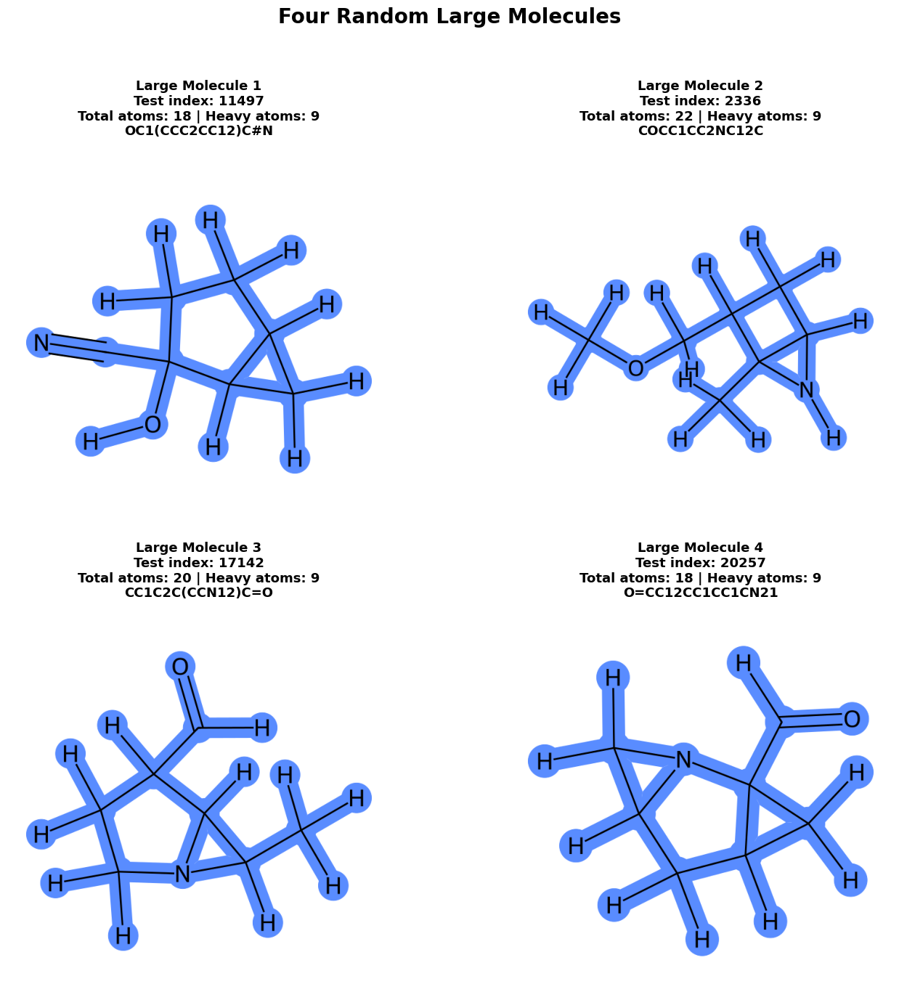

In [36]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image

import io
import matplotlib.pyplot as plt
import numpy as np


# =============================================================================
# SETTINGS
# =============================================================================

N_RANDOM_LARGE_MOLECULES = 4
MOLECULE_SELECTION_SEED = 42

MOLECULE_IMAGE_SIZE = (650, 650)

# Neutral highlight styling.
ATOM_CIRCLE_COLOR = (0.35, 0.55, 1.00)
BOND_COLOR = (0.35, 0.55, 1.00)


# =============================================================================
# SELECT FOUR RANDOM LARGE MOLECULES FROM THE FULL TEST SET
# =============================================================================

N_RANDOM_LARGE_MOLECULES = 4
MOLECULE_SELECTION_SEED = 42

# Use the same definition of "large" as earlier in the notebook.
MIN_LARGE_ATOMS = 12


large_molecule_candidates = []

for test_index, row in test.reset_index(drop=True).iterrows():

    mol = row["mol"]
    smiles = row["smiles"]

    if mol is None:
        continue

    if mol.GetNumAtoms() < MIN_LARGE_ATOMS:
        continue

    large_molecule_candidates.append({
        "Test Index": test_index,
        "Molecule": mol,
        "SMILES": smiles,
        "Total Atoms": mol.GetNumAtoms(),
        "Heavy Atoms": mol.GetNumHeavyAtoms(),
    })


if not large_molecule_candidates:
    raise ValueError(
        f"No molecules with at least {MIN_LARGE_ATOMS} atoms "
        "were found in the test set."
    )


if len(large_molecule_candidates) < N_RANDOM_LARGE_MOLECULES:
    raise ValueError(
        f"Only {len(large_molecule_candidates)} molecules with at least "
        f"{MIN_LARGE_ATOMS} atoms were found, but "
        f"{N_RANDOM_LARGE_MOLECULES} were requested."
    )


selection_rng = np.random.default_rng(
    MOLECULE_SELECTION_SEED
)

selected_candidate_indices = selection_rng.choice(
    len(large_molecule_candidates),
    size=N_RANDOM_LARGE_MOLECULES,
    replace=False,
)


random_large_molecules = [
    large_molecule_candidates[int(index)]
    for index in selected_candidate_indices
]


print("=" * 100)
print(
    f"SELECTED {N_RANDOM_LARGE_MOLECULES} RANDOM LARGE MOLECULES "
    f"FROM THE TEST SET"
)
print(
    f"Large-molecule threshold: "
    f"{MIN_LARGE_ATOMS} total atoms"
)
print(
    f"Selection seed: "
    f"{MOLECULE_SELECTION_SEED}"
)
print("=" * 100)


for molecule_number, record in enumerate(
    random_large_molecules,
    start=1,
):
    print(
        f"{molecule_number}. "
        f"test index={record['Test Index']}, "
        f"total atoms={record['Total Atoms']}, "
        f"heavy atoms={record['Heavy Atoms']}, "
        f"SMILES={record['SMILES']}"
    )
# =============================================================================
# DRAW ONE MOLECULE WITH FILLED ATOM CIRCLES
# =============================================================================

def mol_to_highlighted_image(
    mol,
    img_size=(650, 650),
    atom_circle_color=ATOM_CIRCLE_COLOR,
    bond_color=BOND_COLOR,
):
    """
    Draw an RDKit molecule using the same highlighted-circle style as the
    partition plots, but assign every atom and bond the same color.

    No molecular partition is created.
    """
    drawer = rdMolDraw2D.MolDraw2DCairo(
        img_size[0],
        img_size[1],
    )

    options = drawer.drawOptions()

    options.useBWAtomPalette()
    options.fillHighlights = True
    options.highlightRadius = 0.35
    options.bondLineWidth = 3

    atoms_to_highlight = [
        atom.GetIdx()
        for atom in mol.GetAtoms()
    ]

    atom_colors = {
        atom_idx: atom_circle_color
        for atom_idx in atoms_to_highlight
    }

    bonds_to_highlight = [
        bond.GetIdx()
        for bond in mol.GetBonds()
    ]

    bond_colors = {
        bond_idx: bond_color
        for bond_idx in bonds_to_highlight
    }

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors,
    )

    drawer.FinishDrawing()

    image = Image.open(
        io.BytesIO(
            drawer.GetDrawingText()
        )
    )

    image.load()

    return image


# =============================================================================
# PLOT FOUR MOLECULES
# =============================================================================

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(14, 14),
    squeeze=False,
)

axes = axes.reshape(-1)


for ax, record, molecule_number in zip(
    axes,
    random_large_molecules,
    range(1, N_RANDOM_LARGE_MOLECULES + 1),
):
    mol = record["Molecule"]
    smiles = record["SMILES"]

    image = mol_to_highlighted_image(
        mol=mol,
        img_size=MOLECULE_IMAGE_SIZE,
    )

    title = (
        f"Large Molecule {molecule_number}\n"
        f"Test index: {record['Test Index']}\n"
        f"Total atoms: {record['Total Atoms']} | "
        f"Heavy atoms: {record['Heavy Atoms']}\n"
        f"{smiles}"
    )

    ax.imshow(image)
    ax.axis("off")

    ax.set_title(
        title,
        fontsize=13,
        fontweight="bold",
        pad=12,
    )


fig.suptitle(
    "Four Random Large Molecules",
    fontsize=20,
    fontweight="bold",
    y=0.99,
)

plt.tight_layout(
    rect=[
        0,
        0.01,
        1,
        0.96,
    ]
)


# =============================================================================
# SAVE FIGURE
# =============================================================================

output_filename = (
    "four_random_large_molecules_rdkit.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved molecule figure to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# SAVE SELECTED MOLECULES FOR LATER USE
# =============================================================================

four_random_large_mols = [
    record["Molecule"]
    for record in random_large_molecules
]

four_random_large_smiles = [
    record["SMILES"]
    for record in random_large_molecules
]

four_random_large_test_indices = [
    record["Test Index"]
    for record in random_large_molecules
]

SELECTED TEST MOLECULE
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
Completed   1/100: Greedy=0.9945, MH=0.9985, MH-Greedy=+0.0040
Completed  10/100: Greedy=0.9888, MH=0.9989, MH-Greedy=+0.0101
Completed  20/100: Greedy=0.9937, MH=0.9992, MH-Greedy=+0.0055
Completed  30/100: Greedy=0.9971, MH=0.9989, MH-Greedy=+0.0018
Completed  40/100: Greedy=0.9945, MH=0.9988, MH-Greedy=+0.0043
Completed  50/100: Greedy=0.9989, MH=0.9995, MH-Greedy=+0.0006
Completed  60/100: Greedy=0.9888, MH=0.9992, MH-Greedy=+0.0104
Completed  70/100: Greedy=0.9933, MH=0.9994, MH-Greedy=+0.0061
Completed  80/100: Greedy=0.9896, MH=0.9987, MH-Greedy=+0.0092
Completed  90/100: Greedy=0.9948, MH=0.9988, MH-Greedy=+0.0041
Completed 100/100: Greedy=0.9940, MH=0.9989, MH-Greedy=+0.0049

First comparison rows:


,Initialization,Seed,Initial Raw Score,Initial Adjusted Score,Greedy Raw Score,Greedy Connectivity Penalty,Greedy Adjusted Score,MH Raw Score,MH Connectivity Penalty,MH Adjusted Score,MH Minus Greedy
0,1,42,0.994530,0.994530,0.994530,0.0,0.994530,0.998488,0.0,0.998488,0.003958
1,2,43,0.995542,0.995542,0.995542,0.0,0.995542,0.998767,0.0,0.998767,0.003225
2,3,44,0.993394,0.993394,0.993973,0.0,0.993973,0.999076,0.0,0.999076,0.005102
3,4,45,0.993352,0.993352,0.993352,0.0,0.993352,0.999027,0.0,0.999027,0.005675
4,5,46,0.996602,0.996602,0.996602,0.0,0.996602,0.999320,0.0,0.999320,0.002718



CONNECTIVITY-ADJUSTED SCORE COMPARISON


,Method,N,Mean Adjusted Score,Std Adjusted Score,Median Adjusted Score,Minimum Adjusted Score,Maximum Adjusted Score
0,Greedy-Distance,100,0.994594,0.002888,0.994904,0.988810,0.998911
1,Metropolis-Hastings,100,0.999115,0.000350,0.999107,0.998275,0.999630



Metropolis-Hastings higher: 98/100
Greedy-Distance higher: 0/100
Ties: 2/100
Mean paired difference (MH - Greedy): +0.004522
Median paired difference (MH - Greedy): +0.004346
Shared Greedy-Distance/MH score limits: (0.9879445628980172, 1.0)

Saved comparison plot to 'large_molecule_greedy_distance_vs_metropolis_hastings_100_initializations.png'


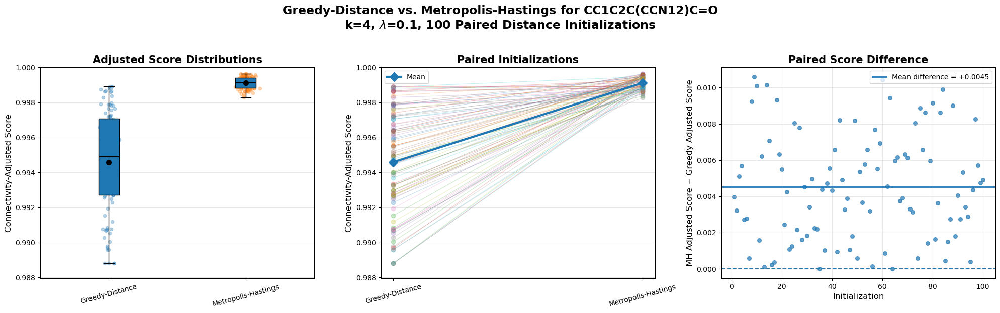


BEST RESULT FROM EACH METHOD

Greedy-Distance
  Initialization: 64
  Seed: 105
  Raw score: 0.998911
  Connectivity penalty: 0.000000
  Adjusted score: 0.998911
  Partition: {0: 1, 1: 1, 2: 2, 3: 2, 4: 2, 5: 2, 6: 2, 7: 0, 8: 0, 9: 1, 10: 1, 11: 1, 12: 1, 13: 2, 14: 2, 15: 2, 16: 2, 17: 2, 18: 3, 19: 0}

Metropolis-Hastings
  Initialization: 21
  Seed: 62
  Raw score: 0.999630
  Connectivity penalty: 0.000000
  Adjusted score: 0.999630
  Partition: {0: 2, 1: 2, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 3, 9: 2, 10: 2, 11: 2, 12: 2, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 1, 19: 0}

Saved numerical results to:
  large_molecule_greedy_distance_vs_metropolis_hastings_100_initializations_detailed.csv
  large_molecule_greedy_distance_vs_metropolis_hastings_100_initializations_summary.csv


In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionOptimizer,
    ChemicalPartitioner,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

K_TO_COMPARE = 4
CONNECTIVITY_WEIGHT = 0.10

N_INITIALIZATIONS = 100
BASE_SEED = 42

GREEDY_ITERATIONS = 100

MH_ITERATIONS = 5000
MH_BETA = 20.0

DISCONNECTED_SINGLETON_WEIGHT = 2.0


# =============================================================================
# SELECT A SPECIFIC TEST MOLECULE
# =============================================================================

TARGET_TEST_INDEX = 17142

test_reset = test.reset_index(drop=True)

row = test_reset.iloc[TARGET_TEST_INDEX]

large_mol = row["mol"]
large_smiles = row["smiles"]
large_size_label = "Selected"

print("=" * 80)
print("SELECTED TEST MOLECULE")
print("=" * 80)
print(f"Test index: {TARGET_TEST_INDEX}")
print(f"SMILES: {large_smiles}")
print(f"Total atoms: {large_mol.GetNumAtoms()}")
print(f"Heavy atoms: {large_mol.GetNumHeavyAtoms()}")

assert large_smiles == "CC1C2C(CCN12)C=O"
assert large_mol.GetNumAtoms() == 20
assert large_mol.GetNumHeavyAtoms() == 9


# =============================================================================
# CREATE OPTIMIZER
# =============================================================================

optimizer = PartitionOptimizer(
    interpreter=interpreter,
    min_partitions=K_TO_COMPARE,
    max_partitions=K_TO_COMPARE,
    connectivity_weight=CONNECTIVITY_WEIGHT,
    disconnected_singleton_weight=(
        DISCONNECTED_SINGLETON_WEIGHT
    ),
)


# =============================================================================
# RUN PAIRED INITIALIZATIONS
# =============================================================================

comparison_results = []

best_results = {
    "Greedy-Distance": None,
    "Metropolis-Hastings": None,
}

best_scores = {
    "Greedy-Distance": -np.inf,
    "Metropolis-Hastings": -np.inf,
}


for initialization_index in range(N_INITIALIZATIONS):

    run_seed = BASE_SEED + initialization_index

    # -------------------------------------------------------------------------
    # Construct one common distance-based initial partition.
    # Both methods begin from this exact partition.
    # -------------------------------------------------------------------------

    initial_partition = ChemicalPartitioner.distance_partition(
        mol=large_mol,
        n_clusters=K_TO_COMPARE,
        seed=run_seed,
    )

    initial_k = len(set(initial_partition.values()))

    if initial_k != K_TO_COMPARE:
        raise RuntimeError(
            f"Initialization {initialization_index + 1} returned "
            f"k={initial_k} instead of k={K_TO_COMPARE}."
        )

    initial_interpretation = (
        interpreter.compute_partition_contributions(
            mol=large_mol,
            partition=initial_partition,
        )
    )

    initial_adjusted_score = connectivity_adjusted_score(
        mol=large_mol,
        interpretation=initial_interpretation,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )


    # -------------------------------------------------------------------------
    # Greedy-Distance
    #
    # Use the internal best-neighbor optimizer directly so that the supplied
    # starting partition is exactly the same as the MH starting partition.
    # -------------------------------------------------------------------------

    greedy_interpretation = (
        optimizer._greedy_helper.optimize_with_best_neighbor(
            mol=large_mol,
            initial_partition=initial_partition.copy(),
            n_iterations=GREEDY_ITERATIONS,
            seed=run_seed,
            verbose=False,
        )
    )

    greedy_partition = greedy_interpretation.partition

    greedy_actual_k = len(
        set(greedy_partition.values())
    )

    if greedy_actual_k != K_TO_COMPARE:
        raise RuntimeError(
            f"Greedy-Distance initialization "
            f"{initialization_index + 1} returned "
            f"k={greedy_actual_k}."
        )

    greedy_penalty = partition_connectivity_penalty(
        mol=large_mol,
        partition=greedy_partition,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    greedy_adjusted_score = connectivity_adjusted_score(
        mol=large_mol,
        interpretation=greedy_interpretation,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )


    # -------------------------------------------------------------------------
    # Metropolis-Hastings
    #
    # initial_partition is supplied explicitly, so initialization="distance"
    # is ignored. This guarantees that MH starts from the same partition.
    # -------------------------------------------------------------------------

    mh_interpretation = (
        optimizer.optimize_partition_metropolis_hastings(
            mol=large_mol,
            n_clusters=K_TO_COMPARE,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initial_partition=initial_partition.copy(),
            seed=run_seed,
            verbose=False,
        )
    )

    mh_partition = mh_interpretation.partition

    mh_actual_k = len(
        set(mh_partition.values())
    )

    if mh_actual_k != K_TO_COMPARE:
        raise RuntimeError(
            f"Metropolis-Hastings initialization "
            f"{initialization_index + 1} returned "
            f"k={mh_actual_k}."
        )

    mh_penalty = partition_connectivity_penalty(
        mol=large_mol,
        partition=mh_partition,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    mh_adjusted_score = connectivity_adjusted_score(
        mol=large_mol,
        interpretation=mh_interpretation,
        connectivity_weight=CONNECTIVITY_WEIGHT,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )


    # -------------------------------------------------------------------------
    # Save paired results
    # -------------------------------------------------------------------------

    score_difference = (
        mh_adjusted_score
        - greedy_adjusted_score
    )

    comparison_results.append({
        "Initialization": initialization_index + 1,
        "Seed": run_seed,
        "Initial Raw Score": initial_interpretation.score,
        "Initial Adjusted Score": initial_adjusted_score,
        "Greedy Raw Score": greedy_interpretation.score,
        "Greedy Connectivity Penalty": greedy_penalty,
        "Greedy Adjusted Score": greedy_adjusted_score,
        "MH Raw Score": mh_interpretation.score,
        "MH Connectivity Penalty": mh_penalty,
        "MH Adjusted Score": mh_adjusted_score,
        "MH Minus Greedy": score_difference,
        "Greedy Partition": greedy_partition.copy(),
        "MH Partition": mh_partition.copy(),
        "Greedy Interpretation": greedy_interpretation,
        "MH Interpretation": mh_interpretation,
    })


    # -------------------------------------------------------------------------
    # Track the best partition from each method
    # -------------------------------------------------------------------------

    if greedy_adjusted_score > best_scores["Greedy-Distance"]:
        best_scores["Greedy-Distance"] = greedy_adjusted_score

        best_results["Greedy-Distance"] = {
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Interpretation": greedy_interpretation,
            "Partition": greedy_partition.copy(),
            "Raw Score": greedy_interpretation.score,
            "Connectivity Penalty": greedy_penalty,
            "Adjusted Score": greedy_adjusted_score,
        }

    if mh_adjusted_score > best_scores["Metropolis-Hastings"]:
        best_scores["Metropolis-Hastings"] = mh_adjusted_score

        best_results["Metropolis-Hastings"] = {
            "Initialization": initialization_index + 1,
            "Seed": run_seed,
            "Interpretation": mh_interpretation,
            "Partition": mh_partition.copy(),
            "Raw Score": mh_interpretation.score,
            "Connectivity Penalty": mh_penalty,
            "Adjusted Score": mh_adjusted_score,
        }


    if (
        initialization_index == 0
        or (initialization_index + 1) % 10 == 0
    ):
        print(
            f"Completed {initialization_index + 1:3d}/"
            f"{N_INITIALIZATIONS}: "
            f"Greedy={greedy_adjusted_score:.4f}, "
            f"MH={mh_adjusted_score:.4f}, "
            f"MH-Greedy={score_difference:+.4f}"
        )


# =============================================================================
# CREATE DATAFRAME
# =============================================================================

comparison_df = pd.DataFrame([
    {
        key: value
        for key, value in result.items()
        if key not in {
            "Greedy Partition",
            "MH Partition",
            "Greedy Interpretation",
            "MH Interpretation",
        }
    }
    for result in comparison_results
])

print("\nFirst comparison rows:")
display(comparison_df.head())


# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

greedy_scores = comparison_df[
    "Greedy Adjusted Score"
].to_numpy()

mh_scores = comparison_df[
    "MH Adjusted Score"
].to_numpy()

score_differences = comparison_df[
    "MH Minus Greedy"
].to_numpy()


summary_df = pd.DataFrame([
    {
        "Method": "Greedy-Distance",
        "N": len(greedy_scores),
        "Mean Adjusted Score": np.mean(greedy_scores),
        "Std Adjusted Score": np.std(
            greedy_scores,
            ddof=1
        ),
        "Median Adjusted Score": np.median(greedy_scores),
        "Minimum Adjusted Score": np.min(greedy_scores),
        "Maximum Adjusted Score": np.max(greedy_scores),
    },
    {
        "Method": "Metropolis-Hastings",
        "N": len(mh_scores),
        "Mean Adjusted Score": np.mean(mh_scores),
        "Std Adjusted Score": np.std(
            mh_scores,
            ddof=1
        ),
        "Median Adjusted Score": np.median(mh_scores),
        "Minimum Adjusted Score": np.min(mh_scores),
        "Maximum Adjusted Score": np.max(mh_scores),
    },
])

print("\n" + "=" * 80)
print("CONNECTIVITY-ADJUSTED SCORE COMPARISON")
print("=" * 80)

display(summary_df.round(6))


mh_wins = int(
    np.sum(score_differences > 1e-12)
)

greedy_wins = int(
    np.sum(score_differences < -1e-12)
)

ties = int(
    np.sum(np.abs(score_differences) <= 1e-12)
)

print(
    f"\nMetropolis-Hastings higher: "
    f"{mh_wins}/{N_INITIALIZATIONS}"
)

print(
    f"Greedy-Distance higher: "
    f"{greedy_wins}/{N_INITIALIZATIONS}"
)

print(
    f"Ties: "
    f"{ties}/{N_INITIALIZATIONS}"
)

print(
    f"Mean paired difference (MH - Greedy): "
    f"{np.mean(score_differences):+.6f}"
)

print(
    f"Median paired difference (MH - Greedy): "
    f"{np.median(score_differences):+.6f}"
)

# =============================================================================
# CALCULATE SHARED Y-AXIS LIMITS FOR PANELS 1 AND 2
# =============================================================================

all_method_scores = np.concatenate([
    greedy_scores,
    mh_scores,
])

score_min = np.min(all_method_scores)
score_max = np.max(all_method_scores)
score_range = score_max - score_min

# Add padding so points and boxplot whiskers do not touch the boundaries.
if score_range < 1e-10:
    score_padding = 0.01
else:
    score_padding = 0.08 * score_range

comparison_score_ylim = (
    max(0.0, score_min - score_padding),
    min(1.0, score_max + score_padding),
)

print(
    "Shared Greedy-Distance/MH score limits:",
    comparison_score_ylim,
)

# =============================================================================
# PLOT COMPARISON
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(20, 6),
)


# -----------------------------------------------------------------------------
# Panel 1: boxplots and individual scores
# -----------------------------------------------------------------------------

score_groups = [
    greedy_scores,
    mh_scores,
]

method_labels = [
    "Greedy-Distance",
    "Metropolis-Hastings",
]

axes[0].boxplot(
    score_groups,
    tick_labels=method_labels,
    showmeans=True,
    patch_artist=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 7,
    },
    medianprops={
        "color": "black",
        "linewidth": 1.5,
    },
)

jitter_rng = np.random.default_rng(BASE_SEED)

for position, scores in enumerate(
    score_groups,
    start=1,
):
    jittered_x = jitter_rng.normal(
        loc=position,
        scale=0.035,
        size=len(scores),
    )

    axes[0].scatter(
        jittered_x,
        scores,
        alpha=0.30,
        s=20,
    )

axes[0].set_title(
    "Adjusted Score Distributions",
    fontsize=15,
    fontweight="bold",
)

axes[0].set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=12,
)

axes[0].tick_params(
    axis="x",
    labelrotation=15,
)

axes[0].set_ylim(comparison_score_ylim)
axes[0].grid(axis="y", alpha=0.3)


# -----------------------------------------------------------------------------
# Panel 2: paired scores
# -----------------------------------------------------------------------------

for initialization_index in range(N_INITIALIZATIONS):
    axes[1].plot(
        [0, 1],
        [
            greedy_scores[initialization_index],
            mh_scores[initialization_index],
        ],
        marker="o",
        linewidth=0.8,
        alpha=0.25,
    )

axes[1].plot(
    [0, 1],
    [
        np.mean(greedy_scores),
        np.mean(mh_scores),
    ],
    marker="D",
    linewidth=3,
    markersize=9,
    label="Mean",
)

axes[1].set_xticks(
    [0, 1],
    method_labels,
    rotation=15,
)

axes[1].set_title(
    "Paired Initializations",
    fontsize=15,
    fontweight="bold",
)

axes[1].set_ylabel(
    "Connectivity-Adjusted Score",
    fontsize=12,
)

axes[1].set_ylim(comparison_score_ylim)
axes[1].grid(axis="y", alpha=0.3)
axes[1].legend()


# -----------------------------------------------------------------------------
# Panel 3: paired score differences
# -----------------------------------------------------------------------------

initialization_numbers = np.arange(
    1,
    N_INITIALIZATIONS + 1,
)

axes[2].scatter(
    initialization_numbers,
    score_differences,
    alpha=0.70,
    s=30,
)

axes[2].axhline(
    0.0,
    linestyle="--",
    linewidth=1.5,
)

axes[2].axhline(
    np.mean(score_differences),
    linestyle="-",
    linewidth=2,
    label=(
        "Mean difference = "
        f"{np.mean(score_differences):+.4f}"
    ),
)

axes[2].set_title(
    "Paired Score Difference",
    fontsize=15,
    fontweight="bold",
)

axes[2].set_xlabel(
    "Initialization",
    fontsize=12,
)

axes[2].set_ylabel(
    "MH Adjusted Score − Greedy Adjusted Score",
    fontsize=12,
)

axes[2].grid(alpha=0.3)
axes[2].legend()


fig.suptitle(
    f"Greedy-Distance vs. Metropolis-Hastings for {large_smiles}\n"
    f"k={K_TO_COMPARE}, "
    f"$\\lambda$={CONNECTIVITY_WEIGHT:g}, "
    f"{N_INITIALIZATIONS} Paired Distance Initializations",
    fontsize=17,
    fontweight="bold",
    y=1.03,
)

plt.tight_layout()

comparison_filename = (
    "large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations.png"
)

plt.savefig(
    comparison_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved comparison plot to "
    f"'{comparison_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FROM EACH METHOD
# =============================================================================

print("\n" + "=" * 80)
print("BEST RESULT FROM EACH METHOD")
print("=" * 80)

for method_name in [
    "Greedy-Distance",
    "Metropolis-Hastings",
]:
    result = best_results[method_name]

    print(f"\n{method_name}")

    print(
        f"  Initialization: "
        f"{result['Initialization']}"
    )

    print(
        f"  Seed: "
        f"{result['Seed']}"
    )

    print(
        f"  Raw score: "
        f"{result['Raw Score']:.6f}"
    )

    print(
        f"  Connectivity penalty: "
        f"{result['Connectivity Penalty']:.6f}"
    )

    print(
        f"  Adjusted score: "
        f"{result['Adjusted Score']:.6f}"
    )

    print(
        f"  Partition: "
        f"{result['Partition']}"
    )


# =============================================================================
# SAVE RESULTS
# =============================================================================

comparison_df.to_csv(
    "large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_detailed.csv",
    index=False,
)

summary_df.to_csv(
    "large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_summary.csv",
    index=False,
)

print("\nSaved numerical results to:")

print(
    "  large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_detailed.csv"
)

print(
    "  large_molecule_greedy_distance_vs_"
    "metropolis_hastings_100_initializations_summary.csv"
)

GREEDY-DISTANCE VS METROPOLIS-HASTINGS ACROSS LAMBDA
Test index: 17142
SMILES: CC1C2C(CCN12)C=O
Total atoms: 20
Heavy atoms: 9
Partitions: k=4
Lambda values: [0.01, 0.1, 0.5, 1.0, 1.5]
Paired initializations per lambda: 100
Greedy iterations: 100
MH iterations: 5000
MH beta: 20.0

LAMBDA 1/5: 0.01
Completed   1/100: Greedy=0.9945, MH=0.9994, MH-Greedy=+0.0048
Completed  10/100: Greedy=0.9984, MH=0.9994, MH-Greedy=+0.0010
Completed  20/100: Greedy=0.9967, MH=0.9988, MH-Greedy=+0.0021
Completed  30/100: Greedy=0.9971, MH=0.9994, MH-Greedy=+0.0023
Completed  40/100: Greedy=0.9989, MH=0.9988, MH-Greedy=-0.0001
Completed  50/100: Greedy=0.9989, MH=0.9995, MH-Greedy=+0.0006
Completed  60/100: Greedy=0.9976, MH=0.9996, MH-Greedy=+0.0019
Completed  70/100: Greedy=0.9933, MH=0.9994, MH-Greedy=+0.0061
Completed  80/100: Greedy=0.9962, MH=0.9988, MH-Greedy=+0.0027
Completed  90/100: Greedy=0.9980, MH=0.9987, MH-Greedy=+0.0007
Completed 100/100: Greedy=0.9940, MH=0.9984, MH-Greedy=+0.0044

LAMBDA 

,Lambda,Initialization,Seed,Initial Raw Score,Initial Connectivity Penalty,Initial Adjusted Score,Greedy Raw Score,Greedy Connectivity Penalty,Greedy Adjusted Score,MH Raw Score,MH Connectivity Penalty,MH Adjusted Score,MH Minus Greedy Raw,MH Minus Greedy Adjusted
0,0.01,1,42,0.994530,0.0,0.994530,0.994530,0.0,0.994530,0.999370,0.0,0.999370,0.004840,0.004840
1,0.01,2,43,0.995542,0.0,0.995542,0.995542,0.0,0.995542,0.999394,0.0,0.999394,0.003852,0.003852
2,0.01,3,44,0.993394,0.0,0.993394,0.996813,0.0,0.996813,0.999172,0.0,0.999172,0.002359,0.002359
3,0.01,4,45,0.993352,0.0,0.993352,0.997961,0.0,0.997961,0.999630,0.0,0.999630,0.001670,0.001670
4,0.01,5,46,0.996602,0.0,0.996602,0.996602,0.0,0.996602,0.999228,0.0,0.999228,0.002626,0.002626



SUMMARY BY LAMBDA AND METHOD


,Lambda,Method,N,Mean Adjusted Score,Std Adjusted Score,Median Adjusted Score,Minimum Adjusted Score,Maximum Adjusted Score,Mean Raw Score,Std Raw Score,Mean Connectivity Penalty,Std Connectivity Penalty
0,0.01,Greedy-Distance,100,0.997246,0.001473,0.997666,0.992848,0.998911,0.997271,0.001418,0.0025,0.017944
1,0.01,Metropolis-Hastings,100,0.999058,0.000359,0.999036,0.997883,0.999630,0.999058,0.000359,0.0000,0.000000
2,0.10,Greedy-Distance,100,0.994594,0.002888,0.994904,0.988810,0.998911,0.994594,0.002888,0.0000,0.000000
3,0.10,Metropolis-Hastings,100,0.999115,0.000350,0.999107,0.998275,0.999630,0.999115,0.000350,0.0000,0.000000
4,0.50,Greedy-Distance,100,0.994594,0.002888,0.994904,0.988810,0.998911,0.994594,0.002888,0.0000,0.000000
5,0.50,Metropolis-Hastings,100,0.998969,0.000428,0.998905,0.998128,0.999630,0.998969,0.000428,0.0000,0.000000
6,1.00,Greedy-Distance,100,0.994594,0.002888,0.994904,0.988810,0.998911,0.994594,0.002888,0.0000,0.000000
7,1.00,Metropolis-Hastings,100,0.998427,0.000927,0.998668,0.994734,0.999583,0.998427,0.000927,0.0000,0.000000
8,1.50,Greedy-Distance,100,0.994594,0.002888,0.994904,0.988810,0.998911,0.994594,0.002888,0.0000,0.000000
9,1.50,Metropolis-Hastings,100,0.997651,0.001522,0.998049,0.991181,0.999466,0.997651,0.001522,0.0000,0.000000



PAIRED METHOD DIFFERENCES BY LAMBDA


,Lambda,N,Mean MH Minus Greedy,Std MH Minus Greedy,Median MH Minus Greedy,MH Wins,Greedy Wins,Ties
0,0.01,100,0.001813,0.001509,0.001509,95,3,2
1,0.10,100,0.004522,0.002933,0.004346,98,0,2
2,0.50,100,0.004375,0.002868,0.004189,98,0,2
3,1.00,100,0.003834,0.002852,0.003477,92,0,8
4,1.50,100,0.003058,0.002788,0.002572,84,2,14



Saved score comparison plot to 'test_index_17142_greedy_distance_vs_metropolis_hastings_scores_across_lambda.png'


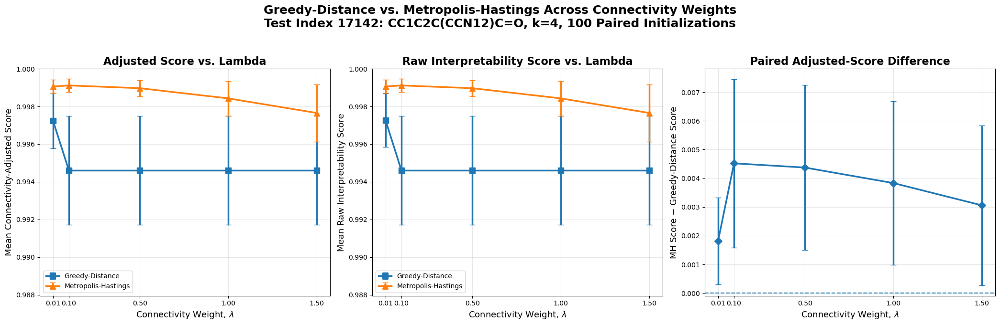

Saved distribution plot to 'test_index_17142_greedy_distance_vs_metropolis_hastings_distributions_across_lambda.png'


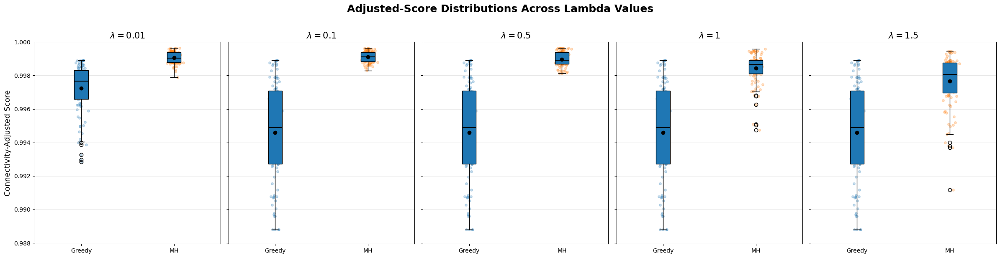


BEST RESULT FROM EACH METHOD AT EACH LAMBDA

Lambda=0.01

  Greedy-Distance
    Initialization: 64
    Seed: 105
    Raw score: 0.998911
    Connectivity penalty: 0.000000
    Adjusted score: 0.998911
    Partition: {0: 1, 1: 1, 2: 2, 3: 2, 4: 2, 5: 2, 6: 2, 7: 0, 8: 0, 9: 1, 10: 1, 11: 1, 12: 1, 13: 2, 14: 2, 15: 2, 16: 2, 17: 2, 18: 3, 19: 0}

  Metropolis-Hastings
    Initialization: 4
    Seed: 45
    Raw score: 0.999630
    Connectivity penalty: 0.000000
    Adjusted score: 0.999630
    Partition: {0: 3, 1: 3, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 2, 9: 3, 10: 3, 11: 3, 12: 3, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 1, 19: 0}

Lambda=0.1

  Greedy-Distance
    Initialization: 64
    Seed: 105
    Raw score: 0.998911
    Connectivity penalty: 0.000000
    Adjusted score: 0.998911
    Partition: {0: 1, 1: 1, 2: 2, 3: 2, 4: 2, 5: 2, 6: 2, 7: 0, 8: 0, 9: 1, 10: 1, 11: 1, 12: 1, 13: 2, 14: 2, 15: 2, 16: 2, 17: 2, 18: 3, 19: 0}

  Metropolis-Hastings
    Initialization: 21
    Seed: 62

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionOptimizer,
    ChemicalPartitioner,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

TARGET_TEST_INDEX = 17142
EXPECTED_SMILES = "CC1C2C(CCN12)C=O"

K_TO_COMPARE = 4

SCORE_LAMBDAS = (
    0.01,
    0.10,
    0.50,
    1.00,
    1.50,
)

N_INITIALIZATIONS = 100
BASE_SEED = 42

GREEDY_ITERATIONS = 100

MH_ITERATIONS = 5000
MH_BETA = 20.0

DISCONNECTED_SINGLETON_WEIGHT = 2.0

METHOD_NAMES = (
    "Greedy-Distance",
    "Metropolis-Hastings",
)


# =============================================================================
# SELECT THE TARGET MOLECULE
# =============================================================================

test_reset = test.reset_index(drop=True)

if TARGET_TEST_INDEX < 0 or TARGET_TEST_INDEX >= len(test_reset):
    raise IndexError(
        f"TARGET_TEST_INDEX={TARGET_TEST_INDEX} is outside the valid range "
        f"0 to {len(test_reset) - 1}."
    )

target_row = test_reset.iloc[
    TARGET_TEST_INDEX
]

target_mol = target_row["mol"]
target_smiles = target_row["smiles"]

if target_mol is None:
    raise ValueError(
        f"The molecule at test index {TARGET_TEST_INDEX} is None."
    )

if target_smiles != EXPECTED_SMILES:
    raise ValueError(
        "The selected test row does not contain the expected molecule.\n"
        f"Expected: {EXPECTED_SMILES}\n"
        f"Found:    {target_smiles}"
    )

if target_mol.GetNumAtoms() < K_TO_COMPARE:
    raise ValueError(
        f"The molecule has only {target_mol.GetNumAtoms()} atoms, "
        f"so it cannot contain {K_TO_COMPARE} nonempty partitions."
    )


print("=" * 100)
print("GREEDY-DISTANCE VS METROPOLIS-HASTINGS ACROSS LAMBDA")
print("=" * 100)
print(f"Test index: {TARGET_TEST_INDEX}")
print(f"SMILES: {target_smiles}")
print(f"Total atoms: {target_mol.GetNumAtoms()}")
print(f"Heavy atoms: {target_mol.GetNumHeavyAtoms()}")
print(f"Partitions: k={K_TO_COMPARE}")
print(f"Lambda values: {list(SCORE_LAMBDAS)}")
print(f"Paired initializations per lambda: {N_INITIALIZATIONS}")
print(f"Greedy iterations: {GREEDY_ITERATIONS}")
print(f"MH iterations: {MH_ITERATIONS}")
print(f"MH beta: {MH_BETA}")
print("=" * 100)


# =============================================================================
# STORAGE
# =============================================================================

comparison_results = []

best_results = {
    score_lambda: {
        "Greedy-Distance": None,
        "Metropolis-Hastings": None,
    }
    for score_lambda in SCORE_LAMBDAS
}

best_scores = {
    score_lambda: {
        "Greedy-Distance": -np.inf,
        "Metropolis-Hastings": -np.inf,
    }
    for score_lambda in SCORE_LAMBDAS
}


# =============================================================================
# RUN BOTH METHODS FOR EVERY LAMBDA AND INITIALIZATION
# =============================================================================

for lambda_index, score_lambda in enumerate(
    SCORE_LAMBDAS,
    start=1,
):
    print("\n" + "=" * 100)
    print(
        f"LAMBDA {lambda_index}/{len(SCORE_LAMBDAS)}: "
        f"{score_lambda:g}"
    )
    print("=" * 100)

    # Lambda is part of the optimization objective, so each lambda receives
    # its own optimizer.
    optimizer_lambda = PartitionOptimizer(
        interpreter=interpreter,
        min_partitions=K_TO_COMPARE,
        max_partitions=K_TO_COMPARE,
        connectivity_weight=score_lambda,
        disconnected_singleton_weight=(
            DISCONNECTED_SINGLETON_WEIGHT
        ),
    )

    for initialization_index in range(
        N_INITIALIZATIONS
    ):
        run_seed = (
            BASE_SEED
            + initialization_index
        )

        # ---------------------------------------------------------------------
        # COMMON INITIAL PARTITION
        #
        # Both methods receive the same starting partition for this seed.
        # The same seed is also reused at each lambda, so lambda comparisons
        # are paired as well.
        # ---------------------------------------------------------------------

        initial_partition = (
            ChemicalPartitioner.distance_partition(
                mol=target_mol,
                n_clusters=K_TO_COMPARE,
                seed=run_seed,
            )
        )

        initial_actual_k = len(
            set(initial_partition.values())
        )

        if initial_actual_k != K_TO_COMPARE:
            raise RuntimeError(
                f"Lambda={score_lambda:g}, initialization "
                f"{initialization_index + 1}: distance initialization "
                f"returned k={initial_actual_k}, not k={K_TO_COMPARE}."
            )

        initial_interpretation = (
            interpreter.compute_partition_contributions(
                mol=target_mol,
                partition=initial_partition,
            )
        )

        initial_penalty = (
            partition_connectivity_penalty(
                mol=target_mol,
                partition=initial_partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                ),
            )
        )

        initial_adjusted_score = (
            connectivity_adjusted_score(
                mol=target_mol,
                interpretation=initial_interpretation,
                connectivity_weight=score_lambda,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                ),
            )
        )


        # ---------------------------------------------------------------------
        # GREEDY-DISTANCE
        #
        # Call the best-neighbor helper directly so the exact common initial
        # partition is used.
        # ---------------------------------------------------------------------

        greedy_interpretation = (
            optimizer_lambda
            ._greedy_helper
            .optimize_with_best_neighbor(
                mol=target_mol,
                initial_partition=initial_partition.copy(),
                n_iterations=GREEDY_ITERATIONS,
                seed=run_seed,
                verbose=False,
            )
        )

        greedy_partition = (
            greedy_interpretation.partition
        )

        greedy_actual_k = len(
            set(greedy_partition.values())
        )

        if greedy_actual_k != K_TO_COMPARE:
            raise RuntimeError(
                f"Lambda={score_lambda:g}, initialization "
                f"{initialization_index + 1}: Greedy-Distance returned "
                f"k={greedy_actual_k}, not k={K_TO_COMPARE}."
            )

        greedy_penalty = (
            partition_connectivity_penalty(
                mol=target_mol,
                partition=greedy_partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                ),
            )
        )

        greedy_adjusted_score = (
            connectivity_adjusted_score(
                mol=target_mol,
                interpretation=greedy_interpretation,
                connectivity_weight=score_lambda,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                ),
            )
        )


        # ---------------------------------------------------------------------
        # METROPOLIS-HASTINGS
        #
        # Supplying initial_partition guarantees the same starting point as
        # Greedy-Distance.
        # ---------------------------------------------------------------------

        mh_interpretation = (
            optimizer_lambda
            .optimize_partition_metropolis_hastings(
                mol=target_mol,
                n_clusters=K_TO_COMPARE,
                n_iterations=MH_ITERATIONS,
                beta=MH_BETA,
                initial_partition=initial_partition.copy(),
                seed=run_seed,
                verbose=False,
            )
        )

        mh_partition = (
            mh_interpretation.partition
        )

        mh_actual_k = len(
            set(mh_partition.values())
        )

        if mh_actual_k != K_TO_COMPARE:
            raise RuntimeError(
                f"Lambda={score_lambda:g}, initialization "
                f"{initialization_index + 1}: Metropolis-Hastings returned "
                f"k={mh_actual_k}, not k={K_TO_COMPARE}."
            )

        mh_penalty = (
            partition_connectivity_penalty(
                mol=target_mol,
                partition=mh_partition,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                ),
            )
        )

        mh_adjusted_score = (
            connectivity_adjusted_score(
                mol=target_mol,
                interpretation=mh_interpretation,
                connectivity_weight=score_lambda,
                disconnected_singleton_weight=(
                    DISCONNECTED_SINGLETON_WEIGHT
                ),
            )
        )


        # ---------------------------------------------------------------------
        # STORE RESULTS
        # ---------------------------------------------------------------------

        adjusted_difference = (
            mh_adjusted_score
            - greedy_adjusted_score
        )

        raw_difference = (
            mh_interpretation.score
            - greedy_interpretation.score
        )

        comparison_results.append({
            "Lambda": score_lambda,
            "Initialization": initialization_index + 1,
            "Seed": run_seed,

            "Initial Raw Score": (
                initial_interpretation.score
            ),
            "Initial Connectivity Penalty": (
                initial_penalty
            ),
            "Initial Adjusted Score": (
                initial_adjusted_score
            ),

            "Greedy Raw Score": (
                greedy_interpretation.score
            ),
            "Greedy Connectivity Penalty": (
                greedy_penalty
            ),
            "Greedy Adjusted Score": (
                greedy_adjusted_score
            ),

            "MH Raw Score": (
                mh_interpretation.score
            ),
            "MH Connectivity Penalty": (
                mh_penalty
            ),
            "MH Adjusted Score": (
                mh_adjusted_score
            ),

            "MH Minus Greedy Raw": (
                raw_difference
            ),
            "MH Minus Greedy Adjusted": (
                adjusted_difference
            ),

            "Greedy Partition": (
                greedy_partition.copy()
            ),
            "MH Partition": (
                mh_partition.copy()
            ),

            "Greedy Interpretation": (
                greedy_interpretation
            ),
            "MH Interpretation": (
                mh_interpretation
            ),
        })


        # ---------------------------------------------------------------------
        # TRACK BEST RESULTS AT EACH LAMBDA
        # ---------------------------------------------------------------------

        if (
            greedy_adjusted_score
            > best_scores[score_lambda]["Greedy-Distance"]
        ):
            best_scores[
                score_lambda
            ]["Greedy-Distance"] = (
                greedy_adjusted_score
            )

            best_results[
                score_lambda
            ]["Greedy-Distance"] = {
                "Initialization": initialization_index + 1,
                "Seed": run_seed,
                "Raw Score": greedy_interpretation.score,
                "Connectivity Penalty": greedy_penalty,
                "Adjusted Score": greedy_adjusted_score,
                "Partition": greedy_partition.copy(),
                "Interpretation": greedy_interpretation,
            }

        if (
            mh_adjusted_score
            > best_scores[
                score_lambda
            ]["Metropolis-Hastings"]
        ):
            best_scores[
                score_lambda
            ]["Metropolis-Hastings"] = (
                mh_adjusted_score
            )

            best_results[
                score_lambda
            ]["Metropolis-Hastings"] = {
                "Initialization": initialization_index + 1,
                "Seed": run_seed,
                "Raw Score": mh_interpretation.score,
                "Connectivity Penalty": mh_penalty,
                "Adjusted Score": mh_adjusted_score,
                "Partition": mh_partition.copy(),
                "Interpretation": mh_interpretation,
            }


        if (
            initialization_index == 0
            or (initialization_index + 1) % 10 == 0
        ):
            print(
                f"Completed "
                f"{initialization_index + 1:3d}/"
                f"{N_INITIALIZATIONS}: "
                f"Greedy={greedy_adjusted_score:.4f}, "
                f"MH={mh_adjusted_score:.4f}, "
                f"MH-Greedy={adjusted_difference:+.4f}"
            )


# =============================================================================
# CREATE NUMERIC DATAFRAME
# =============================================================================

excluded_keys = {
    "Greedy Partition",
    "MH Partition",
    "Greedy Interpretation",
    "MH Interpretation",
}

comparison_df = pd.DataFrame([
    {
        key: value
        for key, value in result.items()
        if key not in excluded_keys
    }
    for result in comparison_results
])

print("\nFirst result rows:")
display(
    comparison_df.head()
)


# =============================================================================
# SUMMARY STATISTICS BY LAMBDA AND METHOD
# =============================================================================

summary_rows = []

for score_lambda in SCORE_LAMBDAS:
    lambda_df = comparison_df[
        comparison_df["Lambda"]
        == score_lambda
    ]

    for method_name, score_column, raw_column, penalty_column in (
        (
            "Greedy-Distance",
            "Greedy Adjusted Score",
            "Greedy Raw Score",
            "Greedy Connectivity Penalty",
        ),
        (
            "Metropolis-Hastings",
            "MH Adjusted Score",
            "MH Raw Score",
            "MH Connectivity Penalty",
        ),
    ):
        scores = lambda_df[
            score_column
        ].to_numpy()

        raw_scores = lambda_df[
            raw_column
        ].to_numpy()

        penalties = lambda_df[
            penalty_column
        ].to_numpy()

        summary_rows.append({
            "Lambda": score_lambda,
            "Method": method_name,
            "N": len(scores),

            "Mean Adjusted Score": (
                np.mean(scores)
            ),
            "Std Adjusted Score": (
                np.std(scores, ddof=1)
            ),
            "Median Adjusted Score": (
                np.median(scores)
            ),
            "Minimum Adjusted Score": (
                np.min(scores)
            ),
            "Maximum Adjusted Score": (
                np.max(scores)
            ),

            "Mean Raw Score": (
                np.mean(raw_scores)
            ),
            "Std Raw Score": (
                np.std(raw_scores, ddof=1)
            ),

            "Mean Connectivity Penalty": (
                np.mean(penalties)
            ),
            "Std Connectivity Penalty": (
                np.std(penalties, ddof=1)
            ),
        })


summary_df = pd.DataFrame(
    summary_rows
)


# =============================================================================
# PAIRED METHOD COMPARISON BY LAMBDA
# =============================================================================

paired_summary_rows = []

for score_lambda in SCORE_LAMBDAS:
    lambda_df = comparison_df[
        comparison_df["Lambda"]
        == score_lambda
    ]

    differences = lambda_df[
        "MH Minus Greedy Adjusted"
    ].to_numpy()

    mh_wins = int(
        np.sum(
            differences > 1e-12
        )
    )

    greedy_wins = int(
        np.sum(
            differences < -1e-12
        )
    )

    ties = int(
        np.sum(
            np.abs(differences)
            <= 1e-12
        )
    )

    paired_summary_rows.append({
        "Lambda": score_lambda,
        "N": len(differences),
        "Mean MH Minus Greedy": (
            np.mean(differences)
        ),
        "Std MH Minus Greedy": (
            np.std(differences, ddof=1)
        ),
        "Median MH Minus Greedy": (
            np.median(differences)
        ),
        "MH Wins": mh_wins,
        "Greedy Wins": greedy_wins,
        "Ties": ties,
    })


paired_summary_df = pd.DataFrame(
    paired_summary_rows
)


print("\n" + "=" * 100)
print("SUMMARY BY LAMBDA AND METHOD")
print("=" * 100)

display(
    summary_df.round(6)
)

print("\n" + "=" * 100)
print("PAIRED METHOD DIFFERENCES BY LAMBDA")
print("=" * 100)

display(
    paired_summary_df.round(6)
)


# =============================================================================
# PREPARE PLOTTING ARRAYS
# =============================================================================

greedy_summary = (
    summary_df[
        summary_df["Method"]
        == "Greedy-Distance"
    ]
    .sort_values("Lambda")
)

mh_summary = (
    summary_df[
        summary_df["Method"]
        == "Metropolis-Hastings"
    ]
    .sort_values("Lambda")
)

lambda_values = np.asarray(
    SCORE_LAMBDAS,
    dtype=float
)

greedy_mean_adjusted = (
    greedy_summary[
        "Mean Adjusted Score"
    ].to_numpy()
)

greedy_std_adjusted = (
    greedy_summary[
        "Std Adjusted Score"
    ].to_numpy()
)

mh_mean_adjusted = (
    mh_summary[
        "Mean Adjusted Score"
    ].to_numpy()
)

mh_std_adjusted = (
    mh_summary[
        "Std Adjusted Score"
    ].to_numpy()
)

greedy_mean_raw = (
    greedy_summary[
        "Mean Raw Score"
    ].to_numpy()
)

greedy_std_raw = (
    greedy_summary[
        "Std Raw Score"
    ].to_numpy()
)

mh_mean_raw = (
    mh_summary[
        "Mean Raw Score"
    ].to_numpy()
)

mh_std_raw = (
    mh_summary[
        "Std Raw Score"
    ].to_numpy()
)

mean_differences = (
    paired_summary_df[
        "Mean MH Minus Greedy"
    ].to_numpy()
)

std_differences = (
    paired_summary_df[
        "Std MH Minus Greedy"
    ].to_numpy()
)


# =============================================================================
# DATA-DRIVEN Y LIMITS
# =============================================================================

all_adjusted_scores = np.concatenate([
    comparison_df[
        "Greedy Adjusted Score"
    ].to_numpy(),
    comparison_df[
        "MH Adjusted Score"
    ].to_numpy(),
])

adjusted_min = np.min(
    all_adjusted_scores
)

adjusted_max = np.max(
    all_adjusted_scores
)

adjusted_range = (
    adjusted_max
    - adjusted_min
)

adjusted_padding = (
    0.01
    if adjusted_range < 1e-10
    else 0.08 * adjusted_range
)

adjusted_ylim = (
    max(
        0.0,
        adjusted_min
        - adjusted_padding
    ),
    min(
        1.0,
        adjusted_max
        + adjusted_padding
    ),
)


all_raw_scores = np.concatenate([
    comparison_df[
        "Greedy Raw Score"
    ].to_numpy(),
    comparison_df[
        "MH Raw Score"
    ].to_numpy(),
])

raw_min = np.min(
    all_raw_scores
)

raw_max = np.max(
    all_raw_scores
)

raw_range = (
    raw_max
    - raw_min
)

raw_padding = (
    0.01
    if raw_range < 1e-10
    else 0.08 * raw_range
)

raw_ylim = (
    max(
        0.0,
        raw_min
        - raw_padding
    ),
    min(
        1.0,
        raw_max
        + raw_padding
    ),
)


# =============================================================================
# PLOT 1: MEAN SCORES AND PAIRED DIFFERENCES ACROSS LAMBDA
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(21, 6.5),
)


# -----------------------------------------------------------------------------
# Panel 1: adjusted scores versus lambda
# -----------------------------------------------------------------------------

axes[0].errorbar(
    lambda_values,
    greedy_mean_adjusted,
    yerr=greedy_std_adjusted,
    marker="s",
    linewidth=2.5,
    markersize=8,
    capsize=4,
    label="Greedy-Distance",
)

axes[0].errorbar(
    lambda_values,
    mh_mean_adjusted,
    yerr=mh_std_adjusted,
    marker="^",
    linewidth=2.5,
    markersize=9,
    capsize=4,
    label="Metropolis-Hastings",
)

axes[0].set_title(
    "Adjusted Score vs. Lambda",
    fontsize=16,
    fontweight="bold",
)

axes[0].set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=13,
)

axes[0].set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=13,
)

axes[0].set_xticks(
    lambda_values
)

axes[0].set_ylim(
    adjusted_ylim
)

axes[0].legend()
axes[0].grid(alpha=0.3)


# -----------------------------------------------------------------------------
# Panel 2: raw score versus lambda
# -----------------------------------------------------------------------------

axes[1].errorbar(
    lambda_values,
    greedy_mean_raw,
    yerr=greedy_std_raw,
    marker="s",
    linewidth=2.5,
    markersize=8,
    capsize=4,
    label="Greedy-Distance",
)

axes[1].errorbar(
    lambda_values,
    mh_mean_raw,
    yerr=mh_std_raw,
    marker="^",
    linewidth=2.5,
    markersize=9,
    capsize=4,
    label="Metropolis-Hastings",
)

axes[1].set_title(
    "Raw Interpretability Score vs. Lambda",
    fontsize=16,
    fontweight="bold",
)

axes[1].set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=13,
)

axes[1].set_ylabel(
    "Mean Raw Interpretability Score",
    fontsize=13,
)

axes[1].set_xticks(
    lambda_values
)

axes[1].set_ylim(
    raw_ylim
)

axes[1].legend()
axes[1].grid(alpha=0.3)


# -----------------------------------------------------------------------------
# Panel 3: paired adjusted-score difference
# -----------------------------------------------------------------------------

axes[2].errorbar(
    lambda_values,
    mean_differences,
    yerr=std_differences,
    marker="D",
    linewidth=2.5,
    markersize=8,
    capsize=4,
)

axes[2].axhline(
    0.0,
    linestyle="--",
    linewidth=1.5,
)

axes[2].set_title(
    "Paired Adjusted-Score Difference",
    fontsize=16,
    fontweight="bold",
)

axes[2].set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=13,
)

axes[2].set_ylabel(
    "MH Score − Greedy-Distance Score",
    fontsize=13,
)

axes[2].set_xticks(
    lambda_values
)

axes[2].grid(alpha=0.3)


fig.suptitle(
    f"Greedy-Distance vs. Metropolis-Hastings Across Connectivity Weights\n"
    f"Test Index {TARGET_TEST_INDEX}: {target_smiles}, "
    f"k={K_TO_COMPARE}, "
    f"{N_INITIALIZATIONS} Paired Initializations",
    fontsize=18,
    fontweight="bold",
    y=1.04,
)

plt.tight_layout()

score_plot_filename = (
    f"test_index_{TARGET_TEST_INDEX}_"
    "greedy_distance_vs_metropolis_hastings_"
    "scores_across_lambda.png"
)

plt.savefig(
    score_plot_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved score comparison plot to "
    f"'{score_plot_filename}'"
)

plt.show()


# =============================================================================
# PLOT 2: ADJUSTED-SCORE DISTRIBUTIONS AT EACH LAMBDA
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=len(SCORE_LAMBDAS),
    figsize=(24, 6),
    sharey=True,
)

for ax, score_lambda in zip(
    axes,
    SCORE_LAMBDAS,
):
    lambda_df = comparison_df[
        comparison_df["Lambda"]
        == score_lambda
    ]

    greedy_scores = lambda_df[
        "Greedy Adjusted Score"
    ].to_numpy()

    mh_scores = lambda_df[
        "MH Adjusted Score"
    ].to_numpy()

    score_groups = [
        greedy_scores,
        mh_scores,
    ]

    boxplot = ax.boxplot(
        score_groups,
        tick_labels=[
            "Greedy",
            "MH",
        ],
        showmeans=True,
        patch_artist=True,
        meanprops={
            "marker": "o",
            "markerfacecolor": "black",
            "markeredgecolor": "black",
            "markersize": 6,
        },
        medianprops={
            "color": "black",
            "linewidth": 1.5,
        },
    )

    jitter_rng = np.random.default_rng(
        BASE_SEED
    )

    for position, scores in enumerate(
        score_groups,
        start=1,
    ):
        jittered_x = jitter_rng.normal(
            loc=position,
            scale=0.035,
            size=len(scores),
        )

        ax.scatter(
            jittered_x,
            scores,
            alpha=0.25,
            s=16,
        )

    ax.set_title(
        rf"$\lambda={score_lambda:g}$",
        fontsize=15,
        fontweight="bold",
    )

    ax.set_ylim(
        adjusted_ylim
    )

    ax.grid(
        axis="y",
        alpha=0.3,
    )

    if ax is axes[0]:
        ax.set_ylabel(
            "Connectivity-Adjusted Score",
            fontsize=13,
        )


fig.suptitle(
    "Adjusted-Score Distributions Across Lambda Values",
    fontsize=18,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()

distribution_plot_filename = (
    f"test_index_{TARGET_TEST_INDEX}_"
    "greedy_distance_vs_metropolis_hastings_"
    "distributions_across_lambda.png"
)

plt.savefig(
    distribution_plot_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"Saved distribution plot to "
    f"'{distribution_plot_filename}'"
)

plt.show()


# =============================================================================
# PRINT BEST RESULT FOR EACH METHOD AND LAMBDA
# =============================================================================

print("\n" + "=" * 100)
print("BEST RESULT FROM EACH METHOD AT EACH LAMBDA")
print("=" * 100)

for score_lambda in SCORE_LAMBDAS:
    print(
        f"\nLambda={score_lambda:g}"
    )

    for method_name in METHOD_NAMES:
        result = best_results[
            score_lambda
        ][method_name]

        print(
            f"\n  {method_name}"
        )

        print(
            f"    Initialization: "
            f"{result['Initialization']}"
        )

        print(
            f"    Seed: "
            f"{result['Seed']}"
        )

        print(
            f"    Raw score: "
            f"{result['Raw Score']:.6f}"
        )

        print(
            f"    Connectivity penalty: "
            f"{result['Connectivity Penalty']:.6f}"
        )

        print(
            f"    Adjusted score: "
            f"{result['Adjusted Score']:.6f}"
        )

        print(
            f"    Partition: "
            f"{result['Partition']}"
        )


# =============================================================================
# SAVE RESULTS
# =============================================================================

detailed_filename = (
    f"test_index_{TARGET_TEST_INDEX}_"
    "greedy_distance_vs_metropolis_hastings_"
    "across_lambda_detailed.csv"
)

summary_filename = (
    f"test_index_{TARGET_TEST_INDEX}_"
    "greedy_distance_vs_metropolis_hastings_"
    "across_lambda_summary.csv"
)

paired_summary_filename = (
    f"test_index_{TARGET_TEST_INDEX}_"
    "greedy_distance_vs_metropolis_hastings_"
    "across_lambda_paired_summary.csv"
)

comparison_df.to_csv(
    detailed_filename,
    index=False,
)

summary_df.to_csv(
    summary_filename,
    index=False,
)

paired_summary_df.to_csv(
    paired_summary_filename,
    index=False,
)

print("\nSaved numerical results to:")

print(
    f"  {detailed_filename}"
)

print(
    f"  {summary_filename}"
)

print(
    f"  {paired_summary_filename}"
)

SAMPLED MOLECULES
Requested molecules: 20
Usable molecules: 20
Partitions: k=4
Lambda values: [0.01, 0.1, 0.5, 1.0, 1.5]
Initializations per molecule and lambda: 100
Greedy iterations: 100
MH iterations: 5000
MH beta: 20.0


,Sample Position,Test Index,SMILES,Total Atoms,Heavy Atoms
0,1,674,CC1=C(N)C=NO1,13,7
1,2,16045,CC#CC1CC(C)C1O,21,9
2,3,8023,C1OC11C2C3CN2C13,15,8
3,4,25709,C1NC2C3COCC12O3,18,9
4,5,13606,O=C1CC2(CC1O2)C#C,15,9
5,6,16208,CC1N2CC2(C#C)C1=O,16,9
6,7,8482,O=CC1OCC11CCO1,17,9
7,8,19388,CC12COCC1(C)C2O,21,9
8,9,3142,CNC(=O)CC1CN1,18,8
9,10,7256,CC12C3C(CN13)OC2=O,16,9



MOLECULE 1/20
Test index: 674
SMILES: CC1=C(N)C=NO1
Atoms: 13 total, 7 heavy

  Lambda 1/5: 0.01
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
    Successful paired runs: 100/100
    Completed molecule/lambda groups: 1/100

  Lambda 2/5: 0.1
    Successful paired runs: 100/100
    Completed molecule/lambda groups: 2/100

  Lambda 3/5: 0.5
    Successful paired runs: 100/100
    Completed molecule/lambda groups: 3/100

  Lambda 4/5: 1
    Successful paired runs: 100/100
    Completed molecule/lambda groups: 4/100

  Lambda 5/5: 1.5
    Successful paired runs: 100/100
    Completed molecule/lambda groups: 5/100

MOLECULE 2/20
Test index: 16045
SMILES: CC#CC1CC(C)C1O
Atoms: 21 total, 9 heavy

  Lambda 1/5: 0.01
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
    Successful paired runs: 100/100
    Completed molecule/lambda groups: 6/100

  Lambda 2/5: 0.1
    Successful paired runs: 100/100
    Completed molecule/lam

,Sample Position,Test Index,SMILES,Total Atoms,Heavy Atoms,Lambda,Initialization,Seed,Initial Raw Score,Initial Connectivity Penalty,Initial Adjusted Score,Greedy Raw Score,Greedy Connectivity Penalty,Greedy Adjusted Score,MH Raw Score,MH Connectivity Penalty,MH Adjusted Score,MH Minus Greedy Raw,MH Minus Greedy Adjusted
0,1,674,CC1=C(N)C=NO1,13,7,0.01,1,42,0.996886,0.0,0.996886,0.996886,0.0,0.996886,0.999419,0.0,0.999419,0.002533,0.002533
1,1,674,CC1=C(N)C=NO1,13,7,0.01,2,43,0.994064,0.0,0.994064,0.994827,0.0,0.994827,0.999797,0.0,0.999797,0.004969,0.004969
2,1,674,CC1=C(N)C=NO1,13,7,0.01,3,44,0.994064,0.0,0.994064,0.994827,0.0,0.994827,0.999797,0.0,0.999797,0.004969,0.004969
3,1,674,CC1=C(N)C=NO1,13,7,0.01,4,45,0.990942,0.0,0.990942,0.998501,0.0,0.998501,0.999797,0.0,0.999797,0.001295,0.001295
4,1,674,CC1=C(N)C=NO1,13,7,0.01,5,46,0.988994,0.0,0.988994,0.998034,0.0,0.998034,0.999744,0.0,0.999744,0.001710,0.001710



Successful paired runs: 10000
Failed paired runs: 0

SUMMARY ACROSS MOLECULES


,Lambda,Method,N Molecules,Mean Adjusted Score,Std Adjusted Score,SEM Adjusted Score,Median Adjusted Score,Minimum Adjusted Score,Maximum Adjusted Score,Mean Raw Score,Std Raw Score,SEM Raw Score,Mean Connectivity Penalty,Std Connectivity Penalty
0,0.01,Greedy-Distance,20,0.995240,0.002131,0.000477,0.996038,0.991013,0.997674,0.995340,0.002101,0.000470,0.010028,0.009977
1,0.01,Metropolis-Hastings,20,0.998478,0.001223,0.000274,0.998866,0.995987,0.999981,0.998516,0.001186,0.000265,0.003826,0.005756
2,0.10,Greedy-Distance,20,0.993186,0.003272,0.000732,0.994056,0.984596,0.996864,0.993186,0.003272,0.000732,0.000000,0.000000
3,0.10,Metropolis-Hastings,20,0.998450,0.001256,0.000281,0.998795,0.995958,0.999958,0.998450,0.001256,0.000281,0.000000,0.000000
4,0.50,Greedy-Distance,20,0.993168,0.003285,0.000735,0.994056,0.984596,0.996864,0.993168,0.003285,0.000735,0.000000,0.000000
5,0.50,Metropolis-Hastings,20,0.998065,0.001262,0.000282,0.998287,0.995811,0.999674,0.998065,0.001262,0.000282,0.000000,0.000000
6,1.00,Greedy-Distance,20,0.993168,0.003285,0.000735,0.994056,0.984596,0.996864,0.993168,0.003285,0.000735,0.000000,0.000000
7,1.00,Metropolis-Hastings,20,0.997165,0.001621,0.000362,0.997581,0.993525,0.998873,0.997165,0.001621,0.000362,0.000000,0.000000
8,1.50,Greedy-Distance,20,0.993168,0.003285,0.000735,0.994056,0.984596,0.996864,0.993168,0.003285,0.000735,0.000000,0.000000
9,1.50,Metropolis-Hastings,20,0.996275,0.002057,0.000460,0.996882,0.990942,0.998424,0.996275,0.002057,0.000460,0.000000,0.000000



PAIRED DIFFERENCES ACROSS MOLECULES


,Lambda,N Molecules,Mean MH Minus Greedy,Std MH Minus Greedy,SEM MH Minus Greedy,Median MH Minus Greedy,MH Wins,Greedy Wins,Ties
0,0.01,20,0.003238,0.001220,0.000273,0.002784,20,0,0
1,0.10,20,0.005264,0.002423,0.000542,0.004492,20,0,0
2,0.50,20,0.004897,0.002374,0.000531,0.004242,20,0,0
3,1.00,20,0.003997,0.002084,0.000466,0.003808,20,0,0
4,1.50,20,0.003107,0.001668,0.000373,0.003016,20,0,0



Saved score comparison plot to '20_molecules_greedy_distance_vs_metropolis_hastings_scores_across_lambda.png'


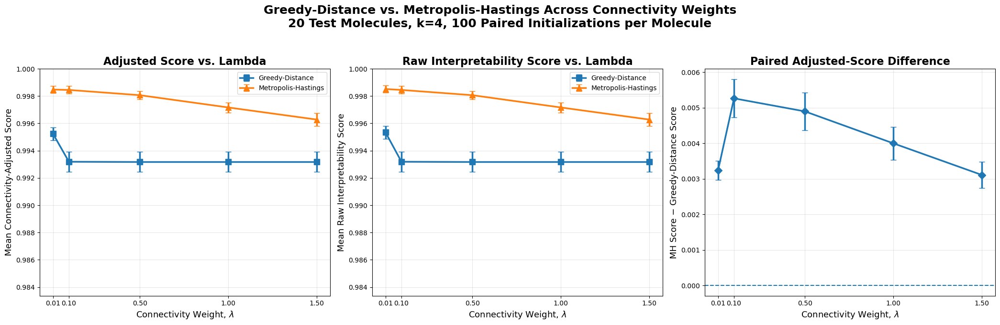

Saved distribution plot to '20_molecules_greedy_distance_vs_metropolis_hastings_distributions_across_lambda.png'


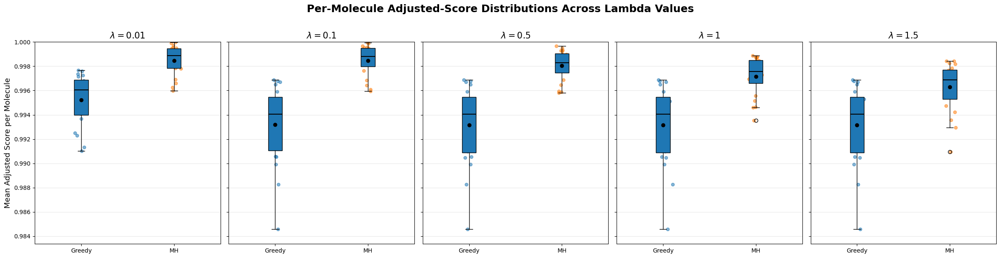

Saved paired plot to '20_molecules_greedy_distance_vs_metropolis_hastings_paired_scores_across_lambda.png'


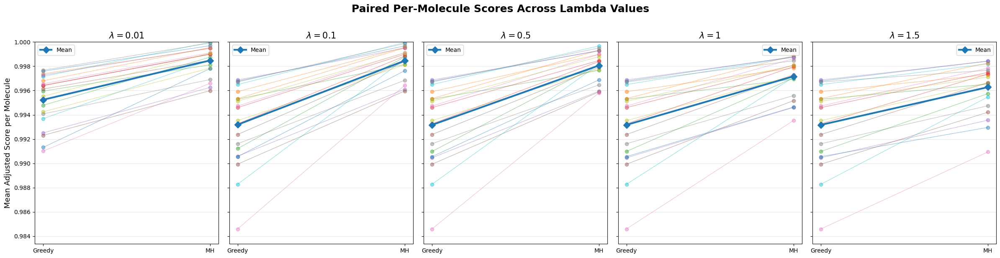


BEST RESULTS BY MOLECULE, LAMBDA, AND METHOD


,Test Index,SMILES,Lambda,Method,Initialization,Seed,Raw Score,Connectivity Penalty,Adjusted Score,Partition
0,674,CC1=C(N)C=NO1,0.01,Greedy-Distance,31,72,0.999744,0.0,0.999744,"{0: 0, 1: 0, 2: 0, 3: 3, 4: 0, 5: 0, 6: 0, 7: ..."
1,674,CC1=C(N)C=NO1,0.01,Metropolis-Hastings,2,43,0.999797,0.0,0.999797,"{0: 2, 1: 2, 2: 2, 3: 2, 4: 2, 5: 2, 6: 2, 7: ..."
2,674,CC1=C(N)C=NO1,0.10,Greedy-Distance,31,72,0.999744,0.0,0.999744,"{0: 0, 1: 0, 2: 0, 3: 3, 4: 0, 5: 0, 6: 0, 7: ..."
3,674,CC1=C(N)C=NO1,0.10,Metropolis-Hastings,1,42,0.999797,0.0,0.999797,"{0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: ..."
4,674,CC1=C(N)C=NO1,0.50,Greedy-Distance,31,72,0.999744,0.0,0.999744,"{0: 0, 1: 0, 2: 0, 3: 3, 4: 0, 5: 0, 6: 0, 7: ..."
5,674,CC1=C(N)C=NO1,0.50,Metropolis-Hastings,32,73,0.999797,0.0,0.999797,"{0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: ..."
6,674,CC1=C(N)C=NO1,1.00,Greedy-Distance,31,72,0.999744,0.0,0.999744,"{0: 0, 1: 0, 2: 0, 3: 3, 4: 0, 5: 0, 6: 0, 7: ..."
7,674,CC1=C(N)C=NO1,1.00,Metropolis-Hastings,4,45,0.999797,0.0,0.999797,"{0: 2, 1: 2, 2: 2, 3: 2, 4: 2, 5: 2, 6: 2, 7: ..."
8,674,CC1=C(N)C=NO1,1.50,Greedy-Distance,31,72,0.999744,0.0,0.999744,"{0: 0, 1: 0, 2: 0, 3: 3, 4: 0, 5: 0, 6: 0, 7: ..."
9,674,CC1=C(N)C=NO1,1.50,Metropolis-Hastings,31,72,0.999797,0.0,0.999797,"{0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: ..."



Saved numerical results to:
  20_molecules_greedy_distance_vs_metropolis_hastings_across_lambda_all_initializations.csv
  20_molecules_greedy_distance_vs_metropolis_hastings_across_lambda_molecule_means.csv
  20_molecules_greedy_distance_vs_metropolis_hastings_across_lambda_summary.csv
  20_molecules_greedy_distance_vs_metropolis_hastings_across_lambda_paired_summary.csv
  20_molecules_greedy_distance_vs_metropolis_hastings_across_lambda_best_results.csv
  20_molecules_used_for_lambda_comparison.csv


In [39]:
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from partition_interpretability import (
    PartitionOptimizer,
    ChemicalPartitioner,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# SETTINGS
# =============================================================================

N_SAMPLE = min(20, len(test))
MOLECULE_SAMPLE_SEED = 42

K_TO_COMPARE = 4

SCORE_LAMBDAS = (
    0.01,
    0.10,
    0.50,
    1.00,
    1.50,
)

N_INITIALIZATIONS = 100
BASE_INITIALIZATION_SEED = 42

GREEDY_ITERATIONS = 100

MH_ITERATIONS = 5000
MH_BETA = 20.0

DISCONNECTED_SINGLETON_WEIGHT = 2.0

METHOD_NAMES = (
    "Greedy-Distance",
    "Metropolis-Hastings",
)


# =============================================================================
# SELECT THE SAME 20 REPRODUCIBLE TEST MOLECULES
# =============================================================================

test_reset = test.reset_index(drop=True)

sample_indices = np.random.RandomState(
    MOLECULE_SAMPLE_SEED
).choice(
    len(test_reset),
    size=N_SAMPLE,
    replace=False,
)

sample_records = []

for sample_position, test_index in enumerate(
    sample_indices,
    start=1,
):
    row = test_reset.iloc[
        int(test_index)
    ]

    mol = row["mol"]
    smiles = row["smiles"]

    if mol is None:
        print(
            f"Skipping test index {test_index}: "
            "molecule is None."
        )
        continue

    n_atoms = mol.GetNumAtoms()

    if n_atoms < K_TO_COMPARE:
        print(
            f"Skipping test index {test_index}: "
            f"{n_atoms} atoms cannot form "
            f"k={K_TO_COMPARE} nonempty partitions."
        )
        continue

    sample_records.append({
        "Sample Position": sample_position,
        "Test Index": int(test_index),
        "Molecule": mol,
        "SMILES": smiles,
        "Total Atoms": n_atoms,
        "Heavy Atoms": mol.GetNumHeavyAtoms(),
    })


if not sample_records:
    raise ValueError(
        "None of the sampled molecules can support "
        f"k={K_TO_COMPARE} partitions."
    )


sample_molecules_df = pd.DataFrame([
    {
        key: value
        for key, value in record.items()
        if key != "Molecule"
    }
    for record in sample_records
])

print("=" * 100)
print("SAMPLED MOLECULES")
print("=" * 100)
print(
    f"Requested molecules: {N_SAMPLE}"
)
print(
    f"Usable molecules: {len(sample_records)}"
)
print(
    f"Partitions: k={K_TO_COMPARE}"
)
print(
    f"Lambda values: {list(SCORE_LAMBDAS)}"
)
print(
    f"Initializations per molecule and lambda: "
    f"{N_INITIALIZATIONS}"
)
print(
    f"Greedy iterations: {GREEDY_ITERATIONS}"
)
print(
    f"MH iterations: {MH_ITERATIONS}"
)
print(
    f"MH beta: {MH_BETA}"
)
print("=" * 100)

display(
    sample_molecules_df
)


# =============================================================================
# STORAGE
# =============================================================================

comparison_results = []

best_results = {
    (
        record["Test Index"],
        score_lambda,
        method_name,
    ): None
    for record in sample_records
    for score_lambda in SCORE_LAMBDAS
    for method_name in METHOD_NAMES
}

best_scores = {
    key: -np.inf
    for key in best_results
}

failed_runs = []


# =============================================================================
# RUN ANALYSIS
# =============================================================================

total_run_groups = (
    len(sample_records)
    * len(SCORE_LAMBDAS)
)

completed_run_groups = 0


for molecule_number, record in enumerate(
    sample_records,
    start=1,
):
    mol = record["Molecule"]
    smiles = record["SMILES"]
    test_index = record["Test Index"]

    print("\n" + "=" * 100)
    print(
        f"MOLECULE {molecule_number}/"
        f"{len(sample_records)}"
    )
    print(
        f"Test index: {test_index}"
    )
    print(
        f"SMILES: {smiles}"
    )
    print(
        f"Atoms: {record['Total Atoms']} total, "
        f"{record['Heavy Atoms']} heavy"
    )
    print("=" * 100)

    for lambda_number, score_lambda in enumerate(
        SCORE_LAMBDAS,
        start=1,
    ):
        print(
            f"\n  Lambda {lambda_number}/"
            f"{len(SCORE_LAMBDAS)}: "
            f"{score_lambda:g}"
        )

        # Lambda changes the optimization objective, so construct a separate
        # optimizer for every lambda.
        optimizer_lambda = PartitionOptimizer(
            interpreter=interpreter,
            min_partitions=K_TO_COMPARE,
            max_partitions=K_TO_COMPARE,
            connectivity_weight=score_lambda,
            disconnected_singleton_weight=(
                DISCONNECTED_SINGLETON_WEIGHT
            ),
        )

        successful_initializations = 0

        for initialization_index in range(
            N_INITIALIZATIONS
        ):
            run_seed = (
                BASE_INITIALIZATION_SEED
                + initialization_index
            )

            try:
                # =============================================================
                # COMMON DISTANCE INITIALIZATION
                # =============================================================

                initial_partition = (
                    ChemicalPartitioner.distance_partition(
                        mol=mol,
                        n_clusters=K_TO_COMPARE,
                        seed=run_seed,
                    )
                )

                initial_actual_k = len(
                    set(initial_partition.values())
                )

                if initial_actual_k != K_TO_COMPARE:
                    raise RuntimeError(
                        "Distance initialization returned "
                        f"k={initial_actual_k}, not "
                        f"k={K_TO_COMPARE}."
                    )

                initial_interpretation = (
                    interpreter
                    .compute_partition_contributions(
                        mol=mol,
                        partition=initial_partition,
                    )
                )

                initial_penalty = (
                    partition_connectivity_penalty(
                        mol=mol,
                        partition=initial_partition,
                        disconnected_singleton_weight=(
                            DISCONNECTED_SINGLETON_WEIGHT
                        ),
                    )
                )

                initial_adjusted_score = (
                    connectivity_adjusted_score(
                        mol=mol,
                        interpretation=initial_interpretation,
                        connectivity_weight=score_lambda,
                        disconnected_singleton_weight=(
                            DISCONNECTED_SINGLETON_WEIGHT
                        ),
                    )
                )


                # =============================================================
                # GREEDY-DISTANCE
                #
                # The helper is used directly so Greedy-Distance and MH receive
                # exactly the same initial partition.
                # =============================================================

                greedy_interpretation = (
                    optimizer_lambda
                    ._greedy_helper
                    .optimize_with_best_neighbor(
                        mol=mol,
                        initial_partition=(
                            initial_partition.copy()
                        ),
                        n_iterations=GREEDY_ITERATIONS,
                        seed=run_seed,
                        verbose=False,
                    )
                )

                greedy_partition = (
                    greedy_interpretation.partition
                )

                greedy_actual_k = len(
                    set(greedy_partition.values())
                )

                if greedy_actual_k != K_TO_COMPARE:
                    raise RuntimeError(
                        "Greedy-Distance returned "
                        f"k={greedy_actual_k}, not "
                        f"k={K_TO_COMPARE}."
                    )

                greedy_penalty = (
                    partition_connectivity_penalty(
                        mol=mol,
                        partition=greedy_partition,
                        disconnected_singleton_weight=(
                            DISCONNECTED_SINGLETON_WEIGHT
                        ),
                    )
                )

                greedy_adjusted_score = (
                    connectivity_adjusted_score(
                        mol=mol,
                        interpretation=greedy_interpretation,
                        connectivity_weight=score_lambda,
                        disconnected_singleton_weight=(
                            DISCONNECTED_SINGLETON_WEIGHT
                        ),
                    )
                )


                # =============================================================
                # METROPOLIS-HASTINGS
                # =============================================================

                mh_interpretation = (
                    optimizer_lambda
                    .optimize_partition_metropolis_hastings(
                        mol=mol,
                        n_clusters=K_TO_COMPARE,
                        n_iterations=MH_ITERATIONS,
                        beta=MH_BETA,
                        initial_partition=(
                            initial_partition.copy()
                        ),
                        seed=run_seed,
                        verbose=False,
                    )
                )

                mh_partition = (
                    mh_interpretation.partition
                )

                mh_actual_k = len(
                    set(mh_partition.values())
                )

                if mh_actual_k != K_TO_COMPARE:
                    raise RuntimeError(
                        "Metropolis-Hastings returned "
                        f"k={mh_actual_k}, not "
                        f"k={K_TO_COMPARE}."
                    )

                mh_penalty = (
                    partition_connectivity_penalty(
                        mol=mol,
                        partition=mh_partition,
                        disconnected_singleton_weight=(
                            DISCONNECTED_SINGLETON_WEIGHT
                        ),
                    )
                )

                mh_adjusted_score = (
                    connectivity_adjusted_score(
                        mol=mol,
                        interpretation=mh_interpretation,
                        connectivity_weight=score_lambda,
                        disconnected_singleton_weight=(
                            DISCONNECTED_SINGLETON_WEIGHT
                        ),
                    )
                )


                # =============================================================
                # STORE PAIRED RESULT
                # =============================================================

                adjusted_difference = (
                    mh_adjusted_score
                    - greedy_adjusted_score
                )

                raw_difference = (
                    mh_interpretation.score
                    - greedy_interpretation.score
                )

                comparison_results.append({
                    "Sample Position": (
                        record["Sample Position"]
                    ),
                    "Test Index": test_index,
                    "SMILES": smiles,
                    "Total Atoms": (
                        record["Total Atoms"]
                    ),
                    "Heavy Atoms": (
                        record["Heavy Atoms"]
                    ),

                    "Lambda": score_lambda,
                    "Initialization": (
                        initialization_index + 1
                    ),
                    "Seed": run_seed,

                    "Initial Raw Score": (
                        initial_interpretation.score
                    ),
                    "Initial Connectivity Penalty": (
                        initial_penalty
                    ),
                    "Initial Adjusted Score": (
                        initial_adjusted_score
                    ),

                    "Greedy Raw Score": (
                        greedy_interpretation.score
                    ),
                    "Greedy Connectivity Penalty": (
                        greedy_penalty
                    ),
                    "Greedy Adjusted Score": (
                        greedy_adjusted_score
                    ),

                    "MH Raw Score": (
                        mh_interpretation.score
                    ),
                    "MH Connectivity Penalty": (
                        mh_penalty
                    ),
                    "MH Adjusted Score": (
                        mh_adjusted_score
                    ),

                    "MH Minus Greedy Raw": (
                        raw_difference
                    ),
                    "MH Minus Greedy Adjusted": (
                        adjusted_difference
                    ),
                })

                successful_initializations += 1


                # =============================================================
                # TRACK BEST PARTITION FOR THIS MOLECULE AND LAMBDA
                # =============================================================

                greedy_key = (
                    test_index,
                    score_lambda,
                    "Greedy-Distance",
                )

                if (
                    greedy_adjusted_score
                    > best_scores[greedy_key]
                ):
                    best_scores[greedy_key] = (
                        greedy_adjusted_score
                    )

                    best_results[greedy_key] = {
                        "Test Index": test_index,
                        "SMILES": smiles,
                        "Lambda": score_lambda,
                        "Method": "Greedy-Distance",
                        "Initialization": (
                            initialization_index + 1
                        ),
                        "Seed": run_seed,
                        "Raw Score": (
                            greedy_interpretation.score
                        ),
                        "Connectivity Penalty": (
                            greedy_penalty
                        ),
                        "Adjusted Score": (
                            greedy_adjusted_score
                        ),
                        "Partition": (
                            greedy_partition.copy()
                        ),
                        "Interpretation": (
                            greedy_interpretation
                        ),
                    }


                mh_key = (
                    test_index,
                    score_lambda,
                    "Metropolis-Hastings",
                )

                if (
                    mh_adjusted_score
                    > best_scores[mh_key]
                ):
                    best_scores[mh_key] = (
                        mh_adjusted_score
                    )

                    best_results[mh_key] = {
                        "Test Index": test_index,
                        "SMILES": smiles,
                        "Lambda": score_lambda,
                        "Method": (
                            "Metropolis-Hastings"
                        ),
                        "Initialization": (
                            initialization_index + 1
                        ),
                        "Seed": run_seed,
                        "Raw Score": (
                            mh_interpretation.score
                        ),
                        "Connectivity Penalty": (
                            mh_penalty
                        ),
                        "Adjusted Score": (
                            mh_adjusted_score
                        ),
                        "Partition": (
                            mh_partition.copy()
                        ),
                        "Interpretation": (
                            mh_interpretation
                        ),
                    }


            except Exception as error:
                failed_runs.append({
                    "Test Index": test_index,
                    "SMILES": smiles,
                    "Lambda": score_lambda,
                    "Initialization": (
                        initialization_index + 1
                    ),
                    "Seed": run_seed,
                    "Error": str(error),
                })

        completed_run_groups += 1

        print(
            f"    Successful paired runs: "
            f"{successful_initializations}/"
            f"{N_INITIALIZATIONS}"
        )

        print(
            f"    Completed molecule/lambda groups: "
            f"{completed_run_groups}/"
            f"{total_run_groups}"
        )


# =============================================================================
# CREATE DETAILED DATAFRAME
# =============================================================================

comparison_df = pd.DataFrame(
    comparison_results
)

if comparison_df.empty:
    raise ValueError(
        "No paired comparison results were produced."
    )

failed_runs_df = pd.DataFrame(
    failed_runs
)

print("\nFirst detailed comparison rows:")

display(
    comparison_df.head()
)

print(
    f"\nSuccessful paired runs: "
    f"{len(comparison_df)}"
)

print(
    f"Failed paired runs: "
    f"{len(failed_runs_df)}"
)


# =============================================================================
# PER-MOLECULE MEANS
#
# Average the 100 initializations within each molecule first. The 20 molecules
# are then treated as the independent observations in plots and summaries.
# =============================================================================

molecule_mean_df = (
    comparison_df
    .groupby(
        [
            "Test Index",
            "SMILES",
            "Total Atoms",
            "Heavy Atoms",
            "Lambda",
        ],
        as_index=False,
    )
    .agg({
        "Initial Raw Score": "mean",
        "Initial Connectivity Penalty": "mean",
        "Initial Adjusted Score": "mean",

        "Greedy Raw Score": "mean",
        "Greedy Connectivity Penalty": "mean",
        "Greedy Adjusted Score": "mean",

        "MH Raw Score": "mean",
        "MH Connectivity Penalty": "mean",
        "MH Adjusted Score": "mean",

        "MH Minus Greedy Raw": "mean",
        "MH Minus Greedy Adjusted": "mean",

        "Initialization": "count",
    })
    .rename(
        columns={
            "Initialization": (
                "Successful Initializations"
            )
        }
    )
)


# =============================================================================
# METHOD SUMMARY ACROSS THE 20 MOLECULES
# =============================================================================

summary_rows = []

for score_lambda in SCORE_LAMBDAS:
    lambda_df = molecule_mean_df[
        molecule_mean_df["Lambda"]
        == score_lambda
    ]

    for (
        method_name,
        adjusted_column,
        raw_column,
        penalty_column,
    ) in (
        (
            "Greedy-Distance",
            "Greedy Adjusted Score",
            "Greedy Raw Score",
            "Greedy Connectivity Penalty",
        ),
        (
            "Metropolis-Hastings",
            "MH Adjusted Score",
            "MH Raw Score",
            "MH Connectivity Penalty",
        ),
    ):
        adjusted_scores = lambda_df[
            adjusted_column
        ].to_numpy()

        raw_scores = lambda_df[
            raw_column
        ].to_numpy()

        penalties = lambda_df[
            penalty_column
        ].to_numpy()

        if len(adjusted_scores) == 0:
            continue

        summary_rows.append({
            "Lambda": score_lambda,
            "Method": method_name,
            "N Molecules": (
                len(adjusted_scores)
            ),

            "Mean Adjusted Score": (
                np.mean(adjusted_scores)
            ),
            "Std Adjusted Score": (
                np.std(
                    adjusted_scores,
                    ddof=1,
                )
                if len(adjusted_scores) > 1
                else 0.0
            ),
            "SEM Adjusted Score": (
                np.std(
                    adjusted_scores,
                    ddof=1,
                )
                / np.sqrt(
                    len(adjusted_scores)
                )
                if len(adjusted_scores) > 1
                else 0.0
            ),
            "Median Adjusted Score": (
                np.median(adjusted_scores)
            ),
            "Minimum Adjusted Score": (
                np.min(adjusted_scores)
            ),
            "Maximum Adjusted Score": (
                np.max(adjusted_scores)
            ),

            "Mean Raw Score": (
                np.mean(raw_scores)
            ),
            "Std Raw Score": (
                np.std(
                    raw_scores,
                    ddof=1,
                )
                if len(raw_scores) > 1
                else 0.0
            ),
            "SEM Raw Score": (
                np.std(
                    raw_scores,
                    ddof=1,
                )
                / np.sqrt(
                    len(raw_scores)
                )
                if len(raw_scores) > 1
                else 0.0
            ),

            "Mean Connectivity Penalty": (
                np.mean(penalties)
            ),
            "Std Connectivity Penalty": (
                np.std(
                    penalties,
                    ddof=1,
                )
                if len(penalties) > 1
                else 0.0
            ),
        })


summary_df = pd.DataFrame(
    summary_rows
)


# =============================================================================
# PAIRED METHOD SUMMARY ACROSS MOLECULES
# =============================================================================

paired_summary_rows = []

for score_lambda in SCORE_LAMBDAS:
    lambda_df = molecule_mean_df[
        molecule_mean_df["Lambda"]
        == score_lambda
    ]

    differences = lambda_df[
        "MH Minus Greedy Adjusted"
    ].to_numpy()

    if len(differences) == 0:
        continue

    mh_wins = int(
        np.sum(
            differences > 1e-12
        )
    )

    greedy_wins = int(
        np.sum(
            differences < -1e-12
        )
    )

    ties = int(
        np.sum(
            np.abs(differences)
            <= 1e-12
        )
    )

    paired_summary_rows.append({
        "Lambda": score_lambda,
        "N Molecules": (
            len(differences)
        ),
        "Mean MH Minus Greedy": (
            np.mean(differences)
        ),
        "Std MH Minus Greedy": (
            np.std(
                differences,
                ddof=1,
            )
            if len(differences) > 1
            else 0.0
        ),
        "SEM MH Minus Greedy": (
            np.std(
                differences,
                ddof=1,
            )
            / np.sqrt(
                len(differences)
            )
            if len(differences) > 1
            else 0.0
        ),
        "Median MH Minus Greedy": (
            np.median(differences)
        ),
        "MH Wins": mh_wins,
        "Greedy Wins": greedy_wins,
        "Ties": ties,
    })


paired_summary_df = pd.DataFrame(
    paired_summary_rows
)


print("\n" + "=" * 100)
print("SUMMARY ACROSS MOLECULES")
print("=" * 100)

display(
    summary_df.round(6)
)

print("\n" + "=" * 100)
print("PAIRED DIFFERENCES ACROSS MOLECULES")
print("=" * 100)

display(
    paired_summary_df.round(6)
)


# =============================================================================
# PREPARE PLOTTING ARRAYS
# =============================================================================

greedy_summary = (
    summary_df[
        summary_df["Method"]
        == "Greedy-Distance"
    ]
    .sort_values("Lambda")
)

mh_summary = (
    summary_df[
        summary_df["Method"]
        == "Metropolis-Hastings"
    ]
    .sort_values("Lambda")
)

lambda_values = (
    greedy_summary["Lambda"]
    .to_numpy()
)

greedy_mean_adjusted = (
    greedy_summary[
        "Mean Adjusted Score"
    ].to_numpy()
)

greedy_sem_adjusted = (
    greedy_summary[
        "SEM Adjusted Score"
    ].to_numpy()
)

mh_mean_adjusted = (
    mh_summary[
        "Mean Adjusted Score"
    ].to_numpy()
)

mh_sem_adjusted = (
    mh_summary[
        "SEM Adjusted Score"
    ].to_numpy()
)

greedy_mean_raw = (
    greedy_summary[
        "Mean Raw Score"
    ].to_numpy()
)

greedy_sem_raw = (
    greedy_summary[
        "SEM Raw Score"
    ].to_numpy()
)

mh_mean_raw = (
    mh_summary[
        "Mean Raw Score"
    ].to_numpy()
)

mh_sem_raw = (
    mh_summary[
        "SEM Raw Score"
    ].to_numpy()
)

mean_differences = (
    paired_summary_df[
        "Mean MH Minus Greedy"
    ].to_numpy()
)

sem_differences = (
    paired_summary_df[
        "SEM MH Minus Greedy"
    ].to_numpy()
)


# =============================================================================
# DATA-DRIVEN Y LIMITS
# =============================================================================

all_adjusted_molecule_means = np.concatenate([
    molecule_mean_df[
        "Greedy Adjusted Score"
    ].to_numpy(),
    molecule_mean_df[
        "MH Adjusted Score"
    ].to_numpy(),
])

adjusted_min = np.min(
    all_adjusted_molecule_means
)

adjusted_max = np.max(
    all_adjusted_molecule_means
)

adjusted_range = (
    adjusted_max
    - adjusted_min
)

adjusted_padding = (
    0.01
    if adjusted_range < 1e-10
    else 0.08 * adjusted_range
)

adjusted_ylim = (
    max(
        0.0,
        adjusted_min
        - adjusted_padding,
    ),
    min(
        1.0,
        adjusted_max
        + adjusted_padding,
    ),
)


all_raw_molecule_means = np.concatenate([
    molecule_mean_df[
        "Greedy Raw Score"
    ].to_numpy(),
    molecule_mean_df[
        "MH Raw Score"
    ].to_numpy(),
])

raw_min = np.min(
    all_raw_molecule_means
)

raw_max = np.max(
    all_raw_molecule_means
)

raw_range = (
    raw_max
    - raw_min
)

raw_padding = (
    0.01
    if raw_range < 1e-10
    else 0.08 * raw_range
)

raw_ylim = (
    max(
        0.0,
        raw_min
        - raw_padding,
    ),
    min(
        1.0,
        raw_max
        + raw_padding,
    ),
)


# =============================================================================
# PLOT 1: MEAN SCORES ACROSS THE 20 MOLECULES
#
# Error bars represent the standard error across molecules, not across all
# initialization runs.
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(21, 6.5),
)


# -----------------------------------------------------------------------------
# Panel 1: adjusted score
# -----------------------------------------------------------------------------

axes[0].errorbar(
    lambda_values,
    greedy_mean_adjusted,
    yerr=greedy_sem_adjusted,
    marker="s",
    linewidth=2.5,
    markersize=8,
    capsize=4,
    label="Greedy-Distance",
)

axes[0].errorbar(
    lambda_values,
    mh_mean_adjusted,
    yerr=mh_sem_adjusted,
    marker="^",
    linewidth=2.5,
    markersize=9,
    capsize=4,
    label="Metropolis-Hastings",
)

axes[0].set_title(
    "Adjusted Score vs. Lambda",
    fontsize=16,
    fontweight="bold",
)

axes[0].set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=13,
)

axes[0].set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=13,
)

axes[0].set_xticks(
    lambda_values
)

axes[0].set_ylim(
    adjusted_ylim
)

axes[0].legend()
axes[0].grid(alpha=0.3)


# -----------------------------------------------------------------------------
# Panel 2: raw score
# -----------------------------------------------------------------------------

axes[1].errorbar(
    lambda_values,
    greedy_mean_raw,
    yerr=greedy_sem_raw,
    marker="s",
    linewidth=2.5,
    markersize=8,
    capsize=4,
    label="Greedy-Distance",
)

axes[1].errorbar(
    lambda_values,
    mh_mean_raw,
    yerr=mh_sem_raw,
    marker="^",
    linewidth=2.5,
    markersize=9,
    capsize=4,
    label="Metropolis-Hastings",
)

axes[1].set_title(
    "Raw Interpretability Score vs. Lambda",
    fontsize=16,
    fontweight="bold",
)

axes[1].set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=13,
)

axes[1].set_ylabel(
    "Mean Raw Interpretability Score",
    fontsize=13,
)

axes[1].set_xticks(
    lambda_values
)

axes[1].set_ylim(
    raw_ylim
)

axes[1].legend()
axes[1].grid(alpha=0.3)


# -----------------------------------------------------------------------------
# Panel 3: paired difference
# -----------------------------------------------------------------------------

axes[2].errorbar(
    lambda_values,
    mean_differences,
    yerr=sem_differences,
    marker="D",
    linewidth=2.5,
    markersize=8,
    capsize=4,
)

axes[2].axhline(
    0.0,
    linestyle="--",
    linewidth=1.5,
)

axes[2].set_title(
    "Paired Adjusted-Score Difference",
    fontsize=16,
    fontweight="bold",
)

axes[2].set_xlabel(
    r"Connectivity Weight, $\lambda$",
    fontsize=13,
)

axes[2].set_ylabel(
    "MH Score − Greedy-Distance Score",
    fontsize=13,
)

axes[2].set_xticks(
    lambda_values
)

axes[2].grid(alpha=0.3)


fig.suptitle(
    "Greedy-Distance vs. Metropolis-Hastings "
    "Across Connectivity Weights\n"
    f"{len(sample_records)} Test Molecules, "
    f"k={K_TO_COMPARE}, "
    f"{N_INITIALIZATIONS} Paired Initializations per Molecule",
    fontsize=18,
    fontweight="bold",
    y=1.04,
)

plt.tight_layout()

score_plot_filename = (
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_scores_across_lambda.png"
)

plt.savefig(
    score_plot_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"\nSaved score comparison plot to "
    f"'{score_plot_filename}'"
)

plt.show()


# =============================================================================
# PLOT 2: PER-MOLECULE SCORE DISTRIBUTIONS AT EACH LAMBDA
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=len(SCORE_LAMBDAS),
    figsize=(24, 6),
    sharey=True,
)

axes = np.atleast_1d(
    axes
)

jitter_rng = np.random.default_rng(
    MOLECULE_SAMPLE_SEED
)

for ax, score_lambda in zip(
    axes,
    SCORE_LAMBDAS,
):
    lambda_df = molecule_mean_df[
        molecule_mean_df["Lambda"]
        == score_lambda
    ]

    greedy_scores = lambda_df[
        "Greedy Adjusted Score"
    ].to_numpy()

    mh_scores = lambda_df[
        "MH Adjusted Score"
    ].to_numpy()

    score_groups = [
        greedy_scores,
        mh_scores,
    ]

    ax.boxplot(
        score_groups,
        tick_labels=[
            "Greedy",
            "MH",
        ],
        showmeans=True,
        patch_artist=True,
        meanprops={
            "marker": "o",
            "markerfacecolor": "black",
            "markeredgecolor": "black",
            "markersize": 6,
        },
        medianprops={
            "color": "black",
            "linewidth": 1.5,
        },
    )

    for position, scores in enumerate(
        score_groups,
        start=1,
    ):
        jittered_x = jitter_rng.normal(
            loc=position,
            scale=0.035,
            size=len(scores),
        )

        ax.scatter(
            jittered_x,
            scores,
            alpha=0.55,
            s=28,
        )

    ax.set_title(
        rf"$\lambda={score_lambda:g}$",
        fontsize=15,
        fontweight="bold",
    )

    ax.set_ylim(
        adjusted_ylim
    )

    ax.grid(
        axis="y",
        alpha=0.3,
    )

axes[0].set_ylabel(
    "Mean Adjusted Score per Molecule",
    fontsize=13,
)

fig.suptitle(
    "Per-Molecule Adjusted-Score Distributions "
    "Across Lambda Values",
    fontsize=18,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()

distribution_plot_filename = (
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_distributions_"
    "across_lambda.png"
)

plt.savefig(
    distribution_plot_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"Saved distribution plot to "
    f"'{distribution_plot_filename}'"
)

plt.show()


# =============================================================================
# PLOT 3: PAIRED MOLECULE MEANS AT EACH LAMBDA
# =============================================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=len(SCORE_LAMBDAS),
    figsize=(24, 6),
    sharey=True,
)

axes = np.atleast_1d(
    axes
)

for ax, score_lambda in zip(
    axes,
    SCORE_LAMBDAS,
):
    lambda_df = (
        molecule_mean_df[
            molecule_mean_df["Lambda"]
            == score_lambda
        ]
        .sort_values("Test Index")
    )

    greedy_scores = lambda_df[
        "Greedy Adjusted Score"
    ].to_numpy()

    mh_scores = lambda_df[
        "MH Adjusted Score"
    ].to_numpy()

    for greedy_score, mh_score in zip(
        greedy_scores,
        mh_scores,
    ):
        ax.plot(
            [0, 1],
            [
                greedy_score,
                mh_score,
            ],
            marker="o",
            linewidth=0.9,
            alpha=0.45,
        )

    ax.plot(
        [0, 1],
        [
            np.mean(greedy_scores),
            np.mean(mh_scores),
        ],
        marker="D",
        linewidth=3,
        markersize=8,
        label="Mean",
    )

    ax.set_xticks(
        [0, 1],
        [
            "Greedy",
            "MH",
        ],
    )

    ax.set_title(
        rf"$\lambda={score_lambda:g}$",
        fontsize=15,
        fontweight="bold",
    )

    ax.set_ylim(
        adjusted_ylim
    )

    ax.grid(
        axis="y",
        alpha=0.3,
    )

    ax.legend()

axes[0].set_ylabel(
    "Mean Adjusted Score per Molecule",
    fontsize=13,
)

fig.suptitle(
    "Paired Per-Molecule Scores Across Lambda Values",
    fontsize=18,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()

paired_plot_filename = (
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_paired_"
    "scores_across_lambda.png"
)

plt.savefig(
    paired_plot_filename,
    dpi=300,
    bbox_inches="tight",
)

print(
    f"Saved paired plot to "
    f"'{paired_plot_filename}'"
)

plt.show()


# =============================================================================
# CREATE BEST-RESULT TABLE
# =============================================================================

best_result_rows = []

for key, result in best_results.items():
    if result is None:
        continue

    best_result_rows.append({
        "Test Index": (
            result["Test Index"]
        ),
        "SMILES": (
            result["SMILES"]
        ),
        "Lambda": (
            result["Lambda"]
        ),
        "Method": (
            result["Method"]
        ),
        "Initialization": (
            result["Initialization"]
        ),
        "Seed": (
            result["Seed"]
        ),
        "Raw Score": (
            result["Raw Score"]
        ),
        "Connectivity Penalty": (
            result["Connectivity Penalty"]
        ),
        "Adjusted Score": (
            result["Adjusted Score"]
        ),
        "Partition": (
            result["Partition"]
        ),
    })


best_results_df = pd.DataFrame(
    best_result_rows
)

if not best_results_df.empty:
    best_results_df = (
        best_results_df
        .sort_values(
            [
                "Test Index",
                "Lambda",
                "Method",
            ]
        )
        .reset_index(drop=True)
    )


print("\n" + "=" * 100)
print("BEST RESULTS BY MOLECULE, LAMBDA, AND METHOD")
print("=" * 100)

display(
    best_results_df.head(20)
)


# =============================================================================
# SAVE RESULTS
# =============================================================================

comparison_df.to_csv(
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "all_initializations.csv",
    index=False,
)

molecule_mean_df.to_csv(
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "molecule_means.csv",
    index=False,
)

summary_df.to_csv(
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "summary.csv",
    index=False,
)

paired_summary_df.to_csv(
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "paired_summary.csv",
    index=False,
)

best_results_df.to_csv(
    "20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "best_results.csv",
    index=False,
)

sample_molecules_df.to_csv(
    "20_molecules_used_for_lambda_comparison.csv",
    index=False,
)

if not failed_runs_df.empty:
    failed_runs_df.to_csv(
        "20_molecules_greedy_distance_vs_"
        "metropolis_hastings_failed_runs.csv",
        index=False,
    )


print("\nSaved numerical results to:")

print(
    "  20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "all_initializations.csv"
)

print(
    "  20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "molecule_means.csv"
)

print(
    "  20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "summary.csv"
)

print(
    "  20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "paired_summary.csv"
)

print(
    "  20_molecules_greedy_distance_vs_"
    "metropolis_hastings_across_lambda_"
    "best_results.csv"
)

print(
    "  20_molecules_used_for_lambda_comparison.csv"
)

if not failed_runs_df.empty:
    print(
        "  20_molecules_greedy_distance_vs_"
        "metropolis_hastings_failed_runs.csv"
    )


Small MOLECULE: FC(F)(F)F

Found 4 methods with exactly k=2 partitions


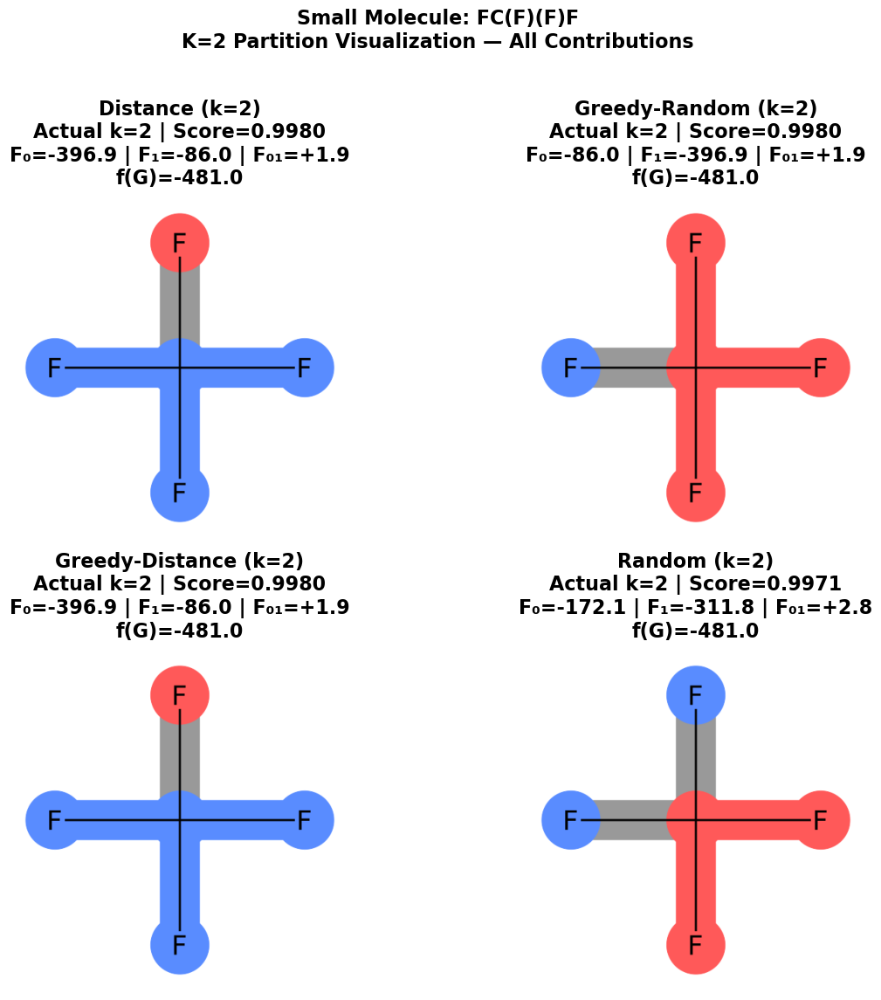


Partition details:

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[2], symbols=['F'], F_0=-86.039
  P1: atoms=[0, 1, 3, 4], symbols=['F', 'C', 'F', 'F'], F_1=-396.921
  Pair terms:
    F_(0, 1) = +1.931

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 4], symbols=['F', 'C', 'F', 'F'], F_0=-396.921
  P1: atoms=[3], symbols=['F'], F_1=-86.039
  Pair terms:
    F_(0, 1) = +1.931

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[2, 3], symbols=['F', 'F'], F_0=-172.079
  P1: atoms=[0, 1, 4], symbols=['F', 'C', 'F'], F_1=-311.755
  Pair terms:
    F_(0, 1) = +2.806

Medium MOLECULE: O=C1NN=CN=C1

Found 4 methods with exactly k=2 partitions


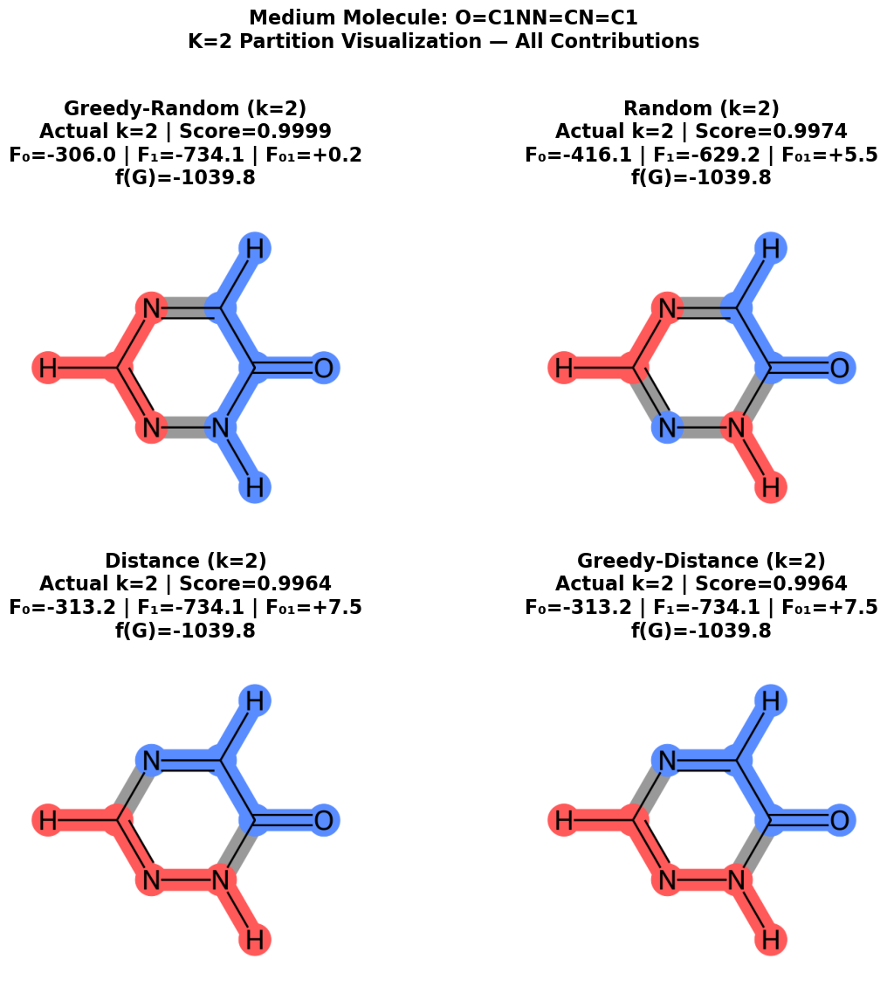


Partition details:

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 6, 7, 9], symbols=['O', 'C', 'N', 'C', 'H', 'H'], F_0=-305.954
  P1: atoms=[3, 4, 5, 8], symbols=['N', 'C', 'N', 'H'], F_1=-734.081
  Pair terms:
    F_(0, 1) = +0.244

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 3, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-416.144
  P1: atoms=[2, 4, 5, 7, 8], symbols=['N', 'C', 'N', 'H', 'H'], F_1=-629.155
  Pair terms:
    F_(0, 1) = +5.509

Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 5, 6, 9], symbols=['O', 'C', 'N', 'C', 'H'], F_0=-313.176
  P1: atoms=[2, 3, 4, 7, 8], symbols=['N', 'N', 'C', 'H', 'H'], F_1=-734.118
  Pair terms:
    F_(0, 1) = +7.503

Large MOLECULE: COC12CC1OC2CO

Found 4 me

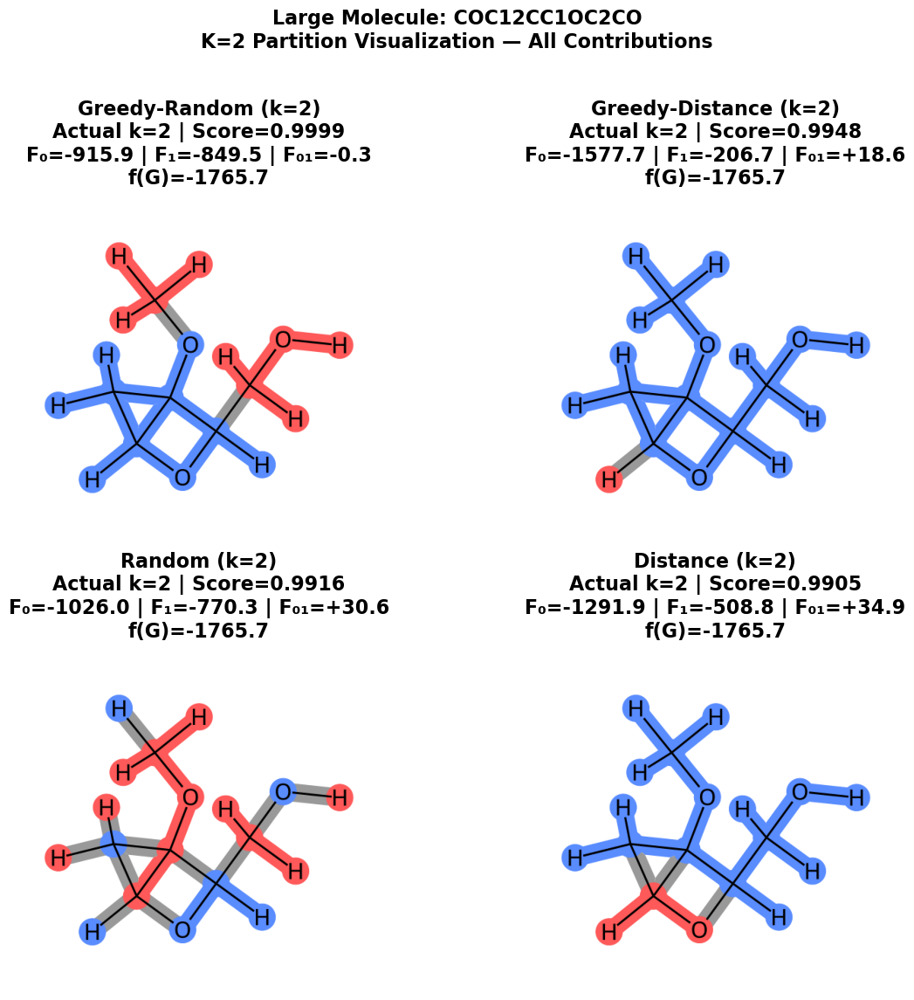


Partition details:

Greedy-Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[1, 2, 3, 4, 5, 6, 12, 13, 14, 15], symbols=['O', 'C', 'C', 'C', 'O', 'C', 'H', 'H', 'H', 'H'], F_0=-915.895
  P1: atoms=[0, 7, 8, 9, 10, 11, 16, 17, 18], symbols=['C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-849.529
  Pair terms:
    F_(0, 1) = -0.325

Greedy-Distance (k=2)
Actual partitions: [0, 1]
  P0: atoms=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'O', 'C', 'C', 'O', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_0=-1577.679
  P1: atoms=[14], symbols=['H'], F_1=-206.693
  Pair terms:
    F_(0, 1) = +18.623

Random (k=2)
Actual partitions: [0, 1]
  P0: atoms=[3, 5, 6, 8, 9, 14, 15], symbols=['C', 'O', 'C', 'O', 'H', 'H', 'H'], F_0=-1026.014
  P1: atoms=[0, 1, 2, 4, 7, 10, 11, 12, 13, 16, 17, 18], symbols=['C', 'O', 'C', 'C', 'C', 'H', 'H', 'H', 'H', 'H', 'H', 'H'], F_1=-770.307
  Pair terms:
    F_(0, 1) = +30.572

Distance (k=2)
Actual part

In [40]:
from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import io

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),
    1: (1.00, 0.35, 0.35),
    2: (0.35, 0.80, 0.45),
    3: (0.80, 0.55, 1.00),
}

def mol_to_partition_image(mol, partition, img_size=(500, 500)):
    drawer = rdMolDraw2D.MolDraw2DCairo(img_size[0], img_size[1])

    opts = drawer.drawOptions()
    opts.useBWAtomPalette()
    opts.fillHighlights = True
    opts.highlightRadius = 0.35
    opts.bondLineWidth = 3

    atoms_to_highlight = []
    atom_colors = {}

    for atom_idx, pid in partition.items():
        atom_idx = int(atom_idx)
        atoms_to_highlight.append(atom_idx)
        atom_colors[atom_idx] = PARTITION_COLORS.get(pid, (0.75, 0.75, 0.75))

    bonds_to_highlight = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        a1 = bond.GetBeginAtomIdx()
        a2 = bond.GetEndAtomIdx()

        p1 = partition.get(a1)
        p2 = partition.get(a2)

        bonds_to_highlight.append(bond_idx)

        if p1 == p2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(p1, (0.75, 0.75, 0.75))
        else:
            bond_colors[bond_idx] = (0.60, 0.60, 0.60)

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()
    return Image.open(io.BytesIO(drawer.GetDrawingText()))


def draw_rdkit_partition_grid(
    mol,
    partitions,
    titles,
    mols_per_row=2,
    img_size=(500, 500),
    title_fontsize=16,
    figsize=None
):
    n = len(partitions)
    n_rows = (n + mols_per_row - 1) // mols_per_row

    if figsize is None:
        figsize = (18, 6 * n_rows)

    fig, axes = plt.subplots(
        n_rows,
        mols_per_row,
        figsize=figsize
    )

    axes = np.array(axes).reshape(-1)

    for ax, partition, title in zip(axes, partitions, titles):
        img = mol_to_partition_image(
            mol,
            partition,
            img_size=img_size
        )

        ax.imshow(img)
        ax.axis("off")
        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight="bold",
            pad=10
        )

    for ax in axes[n:]:
        ax.axis("off")

    return fig


K_TO_PLOT = 2

for mol, smiles, size_label in selected_mols:
    print(f"\n{'=' * 80}")
    print(f"{size_label} MOLECULE: {smiles}")
    print(f"{'=' * 80}")

    results = all_results[size_label]

    selected_results = [
        r for r in results
        if r["N_partitions"] == K_TO_PLOT
    ]

    if not selected_results:
        print(f"⚠️ No results found with exactly k={K_TO_PLOT} partitions")
        continue

    selected_results.sort(key=lambda x: x["Score"], reverse=True)
    selected_results = selected_results[:6]

    print(
        f"\nFound {len(selected_results)} methods "
        f"with exactly k={K_TO_PLOT} partitions"
    )

    partitions = []
    titles = []

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(set(partition.values()))

        partitions.append(partition)

        F0 = interp.within_partition.get(0, 0.0)
        F1 = interp.within_partition.get(1, 0.0)
        F01 = sum(interp.between_partition.values())
        F_higher = sum(interp.higher_order.values())
        f_G = F0 + F1 + F01 + F_higher

        title = f"{result['Strategy']}\n"
        title += f"Actual k={len(partition_ids)} | Score={result['Score']:.4f}\n"
        title += f"F₀={F0:+.1f} | F₁={F1:+.1f} | F₀₁={F01:+.1f}\n"
        title += f"f(G)={f_G:+.1f}"

        model_pred = interp.total_prediction

        titles.append(title)

    fig = draw_rdkit_partition_grid(
        mol,
        partitions,
        titles,
        mols_per_row=2,
        img_size=(500, 500),
        title_fontsize=16,
        figsize=(12, 12)
    )

    plt.suptitle(
        f"{size_label} Molecule: {smiles}\n"
        f"K={K_TO_PLOT} Partition Visualization — All Contributions",
        fontsize=16,
        fontweight="bold",
        y=0.98
    )

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])

    plt.savefig(
        f"k{K_TO_PLOT}_partition_viz_rdkit_{size_label.lower()}.png",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    print("\nPartition details:")

    for result in selected_results:
        interp = result["Interpretation"]
        partition = interp.partition
        partition_ids = sorted(set(partition.values()))

        print(f"\n{result['Strategy']}")
        print(f"Actual partitions: {partition_ids}")

        for p_id in partition_ids:
            atoms_in_p = [
                idx for idx, part in partition.items()
                if part == p_id
            ]

            symbols = [
                mol.GetAtomWithIdx(idx).GetSymbol()
                for idx in atoms_in_p
            ]

            print(
                f"  P{p_id}: atoms={atoms_in_p}, "
                f"symbols={symbols}, "
                f"F_{p_id}={interp.within_partition.get(p_id, 0.0):+.3f}"
            )

        if interp.between_partition:
            print("  Pair terms:")
            for pair, val in sorted(interp.between_partition.items()):
                print(f"    F_{pair} = {val:+.3f}")

        if interp.higher_order:
            print("  Higher-order terms:")
            for parts, val in sorted(interp.higher_order.items()):
                print(f"    F_{parts} = {val:+.3f}")

Score Calculation Breakdown

DETAILED SCORE CALCULATION: FC(F)(F)F (Carbon Tetrafluoride)

📝 Molecule: FC(F)(F)F
   Atoms: 5
   Bonds: 4

   Atom Details:
     Atom 0: F
     Atom 1: C
     Atom 2: F
     Atom 3: F
     Atom 4: F

   Bond Details:
     Bond 0-1: F-C
     Bond 1-2: C-F
     Bond 1-3: C-F
     Bond 1-4: C-F

STEP 1: DISTANCE-BASED PARTITIONING (k=2)

Partition Assignment:
  Atom 0 (F): Partition 0
  Atom 1 (C): Partition 0
  Atom 2 (F): Partition 0
  Atom 3 (F): Partition 1
  Atom 4 (F): Partition 0

Partition 0: 4 atoms
  Atoms: [0, 1, 2, 4]
  Symbols: ['F', 'C', 'F', 'F']

Partition 1: 1 atoms
  Atoms: [3]
  Symbols: ['F']

STEP 2: CREATE GRAPHLET DAG (for visualization)

✓ GraphletDAG created

STEP 3: COMPUTE PARTITION CONTRIBUTIONS
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.

✓ Partition contributions computed
  Type: <class 'partition_interpretability.PartitionInterpretation'>

STEP 4: EXTRACT CONTRIBUTION TERMS (DETAILED BREAKDOWN)

🔵 PARTITION 0 (Within-

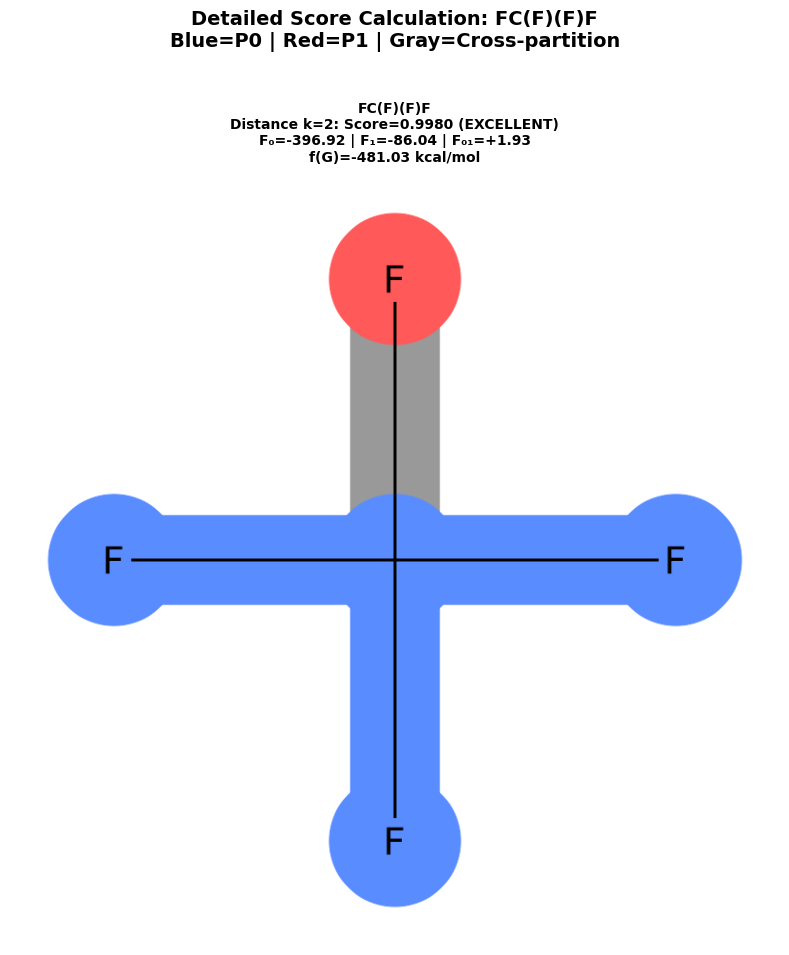


✓ Visualization saved: detailed_score_FCFFF_rdkit.png
  • Blue atoms/bonds: Partition 0
  • Red atoms/bonds: Partition 1
  • Gray bonds: Cross-partition
  • No bond coefficient labels are shown in this RDKit-only plot

📊 COMPLETE SUMMARY

╔═══════════════════════════════════════════════════════════════════════════╗
║                        PARTITION SCORE CALCULATION                        ║
╚═══════════════════════════════════════════════════════════════════════════╝

  MOLECULE:
    SMILES:     FC(F)(F)F
    Atoms:      5
    Bonds:      4

  PARTITION METHOD:
    Algorithm:  Distance-based clustering
    k:          2 (number of partitions)

  PARTITION ASSIGNMENT:
    P0: [0, 1, 2, 4]
        Elements: ['F', 'C', 'F', 'F']
        Size: 4 atoms

    P1: [3]
        Elements: ['F']
        Size: 1 atoms

  ENERGY CONTRIBUTIONS (sum of graphlet weights):
    ┌─────────────────────────────────────────────────────────┐
    │ Within P0 (F₀):       -396.920639 kcal/mol         │
    │ W

In [41]:
# ═══════════════════════════════════════════════════════════════════════════
# DETAILED SCORE CALCULATION FOR FC(F)(F)F - DISTANCE(k=2)
# ═══════════════════════════════════════════════════════════════════════════

from rdkit import Chem
from rdkit.Chem import AllChem
from minervachem.graphlet_dags import GraphletDAG
from partition_interpretability import (
    PartitionInterpreter,
    ChemicalPartitioner
)
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

print("=" * 100)
print("DETAILED SCORE CALCULATION: FC(F)(F)F (Carbon Tetrafluoride)")
print("=" * 100)

# ═══════════════════════════════════════════════════════════════════════════
# STEP 1: CREATE MOLECULE
# ═══════════════════════════════════════════════════════════════════════════

smiles = "FC(F)(F)F"
mol = Chem.MolFromSmiles(smiles)
AllChem.Compute2DCoords(mol)

print(f"\n📝 Molecule: {smiles}")
print(f"   Atoms: {mol.GetNumAtoms()}")
print(f"   Bonds: {mol.GetNumBonds()}")

# Show atom details
print(f"\n   Atom Details:")
for atom in mol.GetAtoms():
    print(f"     Atom {atom.GetIdx()}: {atom.GetSymbol()}")

print(f"\n   Bond Details:")
for bond in mol.GetBonds():
    a1_idx = bond.GetBeginAtomIdx()
    a2_idx = bond.GetEndAtomIdx()
    a1_sym = mol.GetAtomWithIdx(a1_idx).GetSymbol()
    a2_sym = mol.GetAtomWithIdx(a2_idx).GetSymbol()
    print(f"     Bond {a1_idx}-{a2_idx}: {a1_sym}-{a2_sym}")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 2: APPLY DISTANCE-BASED K=2 PARTITIONING
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 1: DISTANCE-BASED PARTITIONING (k=2)")
print(f"{'='*100}")

partition = ChemicalPartitioner.distance_partition(mol, n_clusters=2)

print(f"\nPartition Assignment:")
for atom_idx in sorted(partition.keys()):
    atom = mol.GetAtomWithIdx(atom_idx)
    print(f"  Atom {atom_idx} ({atom.GetSymbol()}): Partition {partition[atom_idx]}")

# Count atoms in each partition
partition_0_atoms = [idx for idx, p in partition.items() if p == 0]
partition_1_atoms = [idx for idx, p in partition.items() if p == 1]

print(f"\nPartition 0: {len(partition_0_atoms)} atoms")
print(f"  Atoms: {partition_0_atoms}")
print(f"  Symbols: {[mol.GetAtomWithIdx(i).GetSymbol() for i in partition_0_atoms]}")

print(f"\nPartition 1: {len(partition_1_atoms)} atoms")
print(f"  Atoms: {partition_1_atoms}")
print(f"  Symbols: {[mol.GetAtomWithIdx(i).GetSymbol() for i in partition_1_atoms]}")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 3: CREATE GRAPHLET DAG (for visualization)
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 2: CREATE GRAPHLET DAG (for visualization)")
print(f"{'='*100}")

print(f"\n✓ GraphletDAG created")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 4: COMPUTE PARTITION CONTRIBUTIONS (CORRECT API)
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 3: COMPUTE PARTITION CONTRIBUTIONS")
print(f"{'='*100}")

interpreter = interpreter_full

dag = GraphletDAG(
    mol,
    fingerprinter=featurizer.fingerprinter,
    bit_ids=featurizer.bit_ids_,
    coef=interpreter.coefficients
)

interpretation = interpreter.compute_partition_contributions(mol, partition)

print(f"\n✓ Partition contributions computed")
print(f"  Type: {type(interpretation)}")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 5: EXTRACT F0, F1, F01 VALUES WITH DETAILED BREAKDOWN
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 4: EXTRACT CONTRIBUTION TERMS (DETAILED BREAKDOWN)")
print(f"{'='*100}")

# Within-partition contributions
F_0 = interpretation.within_partition.get(0, 0.0)
F_1 = interpretation.within_partition.get(1, 0.0)

print(f"\n🔵 PARTITION 0 (Within-partition contributions):")
print(f"  F₀ = {F_0:+.6f} kcal/mol")
print(f"  This is the sum of all graphlet weights where ALL atoms belong to P0")

print(f"\n🔴 PARTITION 1 (Within-partition contributions):")
print(f"  F₁ = {F_1:+.6f} kcal/mol")
print(f"  This is the sum of all graphlet weights where ALL atoms belong to P1")

# Between-partition contributions - detailed bond-by-bond
print(f"\n⚪ CROSS-PARTITION (Between-partition contributions):")
print(f"  {'─'*80}")

if interpretation.between_partition:
    print(f"  Number of cross-partition graphlet contributions: {len(interpretation.between_partition)}")
    print(f"  Individual cross-partition contributions:")
    
    for key, value in sorted(interpretation.between_partition.items(), 
                            key=lambda x: abs(x[1]), reverse=True)[:10]:  # Show top 10
        if isinstance(key, tuple) and len(key) == 2:
            p1, p2 = key
            print(f"    Partition pair ({p1},{p2}): {value:+.6f} kcal/mol")
            print(f"      → Sum of graphlets spanning atoms in both P{p1} and P{p2}")
        else:
            print(f"    {key}: {value:+.6f} kcal/mol")
    
    F_01 = sum(interpretation.between_partition.values())
else:
    print(f"  No cross-partition graphlets")
    F_01 = 0.0

print(f"  {'─'*80}")
print(f"  F₀₁ (total) = {F_01:+.6f} kcal/mol")
print(f"  This is the sum of all graphlet weights that span EXACTLY 2 partitions")

# Higher-order contributions
print(f"\n⚫ HIGHER-ORDER (3+ partition graphlets):")
print(f"  {'─'*80}")

if interpretation.higher_order:
    print(f"  Number of higher-order contributions: {len(interpretation.higher_order)}")
    for key, value in interpretation.higher_order.items():
        print(f"    Partitions {key}: {value:+.6f} kcal/mol")
    F_higher = sum(interpretation.higher_order.values())
else:
    print(f"  No higher-order graphlets")
    F_higher = 0.0

print(f"  {'─'*80}")
print(f"  F_higher (total) = {F_higher:+.6f} kcal/mol")
print(f"  This is the sum of all graphlet weights that span 3+ partitions")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 6: SHOW HOW GRAPHLET WEIGHTS ARE SUMMED
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 5: HOW GRAPHLET WEIGHTS ARE SUMMED TO GET F₀, F₁, F₀₁")
print(f"{'='*100}")

print(f"""
📚 THEORETICAL FOUNDATION (Equation 2 from paper):

The model prediction f(G) is decomposed based on which partition(s) each
graphlet instance spans:

    f(G) = Σ F_p + Σ F_{{p1,p2}} + Σ F_{{p1,p2,...}}
           p    p1<p2        higher-order

Where:
    • F_p (WITHIN): Sum of weights for graphlets fully contained in partition p
    • F_{{p1,p2}} (BETWEEN): Sum of weights for graphlets spanning exactly partitions p1 & p2  
    • F_{{p1,p2,...}} (HIGHER): Sum of weights for graphlets spanning 3+ partitions

🔬 HOW IT WORKS FOR THIS MOLECULE:

1. The interpreter enumerates ALL graphlet instances in the molecule
   (not just counts, but actual atom sets)

2. For each graphlet instance with coefficient w_i and atom set A_i:
   
   a) Determine which partition(s) the atoms in A_i belong to
   
   b) If all atoms are in partition p:
      → Add w_i to F_p (within-partition)
   
   c) If atoms span exactly partitions p1 and p2:
      → Add w_i to F_{{p1,p2}} (cross-partition)
   
   d) If atoms span 3+ partitions:
      → Add w_i to F_{{p1,p2,...}} (higher-order)

3. Sum up all contributions:
   f(G) = F_0 + F_1 + F_{{0,1}} + F_higher
""")

print(f"\n  Current molecule decomposition:")
print(f"  {'─'*80}")
print(f"    F₀:       {F_0:+12.6f} kcal/mol  (graphlets fully in P0)")
print(f"    F₁:       {F_1:+12.6f} kcal/mol  (graphlets fully in P1)")
print(f"    F₀₁:      {F_01:+12.6f} kcal/mol  (graphlets spanning P0↔P1)")
print(f"    F_higher: {F_higher:+12.6f} kcal/mol  (graphlets spanning 3+ partitions)")
print(f"    {'─'*80}")
print(f"    TOTAL:    {F_0 + F_1 + F_01 + F_higher:+12.6f} kcal/mol")

# Get model prediction for verification
total_pred = interpretation.total_prediction

print(f"\n  Verification that sum equals model prediction:")
print(f"    Sum of contributions: {F_0 + F_1 + F_01 + F_higher:+.6f} kcal/mol")
print(f"    Model prediction:     {total_pred:+.6f} kcal/mol")
print(f"    Difference:           {abs((F_0 + F_1 + F_01 + F_higher) - total_pred):.9f} kcal/mol")

if abs((F_0 + F_1 + F_01 + F_higher) - total_pred) < 1e-6:
    print(f"    ✅ PERFECT MATCH - Decomposition is exact!")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 7: CALCULATE TOTAL PREDICTION
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 6: CALCULATE TOTAL PREDICTION f(G)")
print(f"{'='*100}")

f_G = F_0 + F_1 + F_01 + F_higher

print(f"\n  Equation: f(G) = F₀ + F₁ + F₀₁ + F_higher")
print(f"\n  Substituting values:")
print(f"    f(G) = {F_0:+.6f} + {F_1:+.6f} + {F_01:+.6f} + {F_higher:+.6f}")
print(f"    f(G) = {f_G:+.6f} kcal/mol")

print(f"\n  Verification:")
print(f"    Calculated f(G): {f_G:+.6f} kcal/mol")
print(f"    Model Pred:      {total_pred:+.6f} kcal/mol")
print(f"    Error:           {abs(f_G - total_pred):.9f} kcal/mol")

if abs(f_G - total_pred) < 1e-6:
    print(f"    ✅ PERFECT MATCH!")
elif abs(f_G - total_pred) < 0.001:
    print(f"    ✅ Excellent (within 0.001)")
elif abs(f_G - total_pred) < 0.1:
    print(f"    ✅ Good (within 0.1)")
else:
    print(f"    ⚠️  Discrepancy detected")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 8: CALCULATE INTERPRETABILITY SCORE IN DETAIL
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 7: CALCULATE INTERPRETABILITY SCORE (STEP-BY-STEP)")
print(f"{'='*100}")

print(f"""
📊 INTERPRETABILITY SCORE FORMULA:

The score measures how well the partition separates the molecule into
independent functional groups. Range: [0, 1]

Steps:
  1. Calculate absolute totals: |F₀|, |F₁|, |F₀₁|, |F_higher|
  2. Calculate fractions of total: within_frac, between_frac, higher_frac
  3. Apply penalties:
     • within_frac  × 1.0   (no penalty - this is good!)
     • between_frac × -0.5  (mild penalty - some coupling)
     • higher_frac  × -2.0  (heavy penalty - complex coupling)
  4. Normalize: (raw_score + 2.0) / 3.0 → [0, 1]
  5. Clip to ensure result in [0, 1]

Higher score = better separation!
""")

# Step 1: Calculate absolute totals
within_total = sum(
    abs(value)
    for value in interpretation.within_partition.values()
)

between_total = sum(
    abs(value)
    for value in interpretation.between_partition.values()
)

higher_total = sum(
    abs(value)
    for value in interpretation.higher_order.values()
)
total = within_total + between_total + higher_total + 1e-10

print(f"\n  Step 1: Calculate absolute totals")
print(f"  {'─'*80}")
print(f"    |F₀|           = {abs(F_0):12.6f} kcal/mol")
print(f"    |F₁|           = {abs(F_1):12.6f} kcal/mol")
print(f"    {'─'*50}")
print(f"    Within total  = {within_total:12.6f} kcal/mol")
print(f"")
print(f"    |F₀₁|          = {abs(F_01):12.6f} kcal/mol")
print(f"    {'─'*50}")
print(f"    Between total = {between_total:12.6f} kcal/mol")
print(f"")
print(f"    |F_higher|     = {abs(F_higher):12.6f} kcal/mol")
print(f"    {'─'*50}")
print(f"    Higher total  = {higher_total:12.6f} kcal/mol")
print(f"")
print(f"    {'═'*50}")
print(f"    GRAND TOTAL   = {total:12.6f} kcal/mol")

# Step 2: Calculate fractions
within_frac = within_total / total
between_frac = between_total / total
higher_frac = higher_total / total

print(f"\n  Step 2: Calculate fractions of total")
print(f"  {'─'*80}")
print(f"    within_frac  = {within_total:10.6f} / {total:10.6f} = {within_frac:.6f}")
print(f"                 = {100*within_frac:6.2f}%")
print(f"")
print(f"    between_frac = {between_total:10.6f} / {total:10.6f} = {between_frac:.6f}")
print(f"                 = {100*between_frac:6.2f}%")
print(f"")
print(f"    higher_frac  = {higher_total:10.6f} / {total:10.6f} = {higher_frac:.6f}")
print(f"                 = {100*higher_frac:6.2f}%")
print(f"")
print(f"    {'─'*50}")
print(f"    Sum check    = {within_frac + between_frac + higher_frac:.6f}")
print(f"                 ≈ 1.000000 ✓")

# Step 3: Apply penalties
print(f"\n  Step 3: Apply penalties to calculate raw score")
print(f"  {'─'*80}")
print(f"    Formula: raw_score = within_frac × 1.0 - between_frac × 0.5 - higher_frac × 2.0")
print(f"")
print(f"    Breaking it down:")

within_contrib = within_frac * 1.0
between_contrib = between_frac * (-0.5)
higher_contrib = higher_frac * (-2.0)

print(f"      within_frac  × 1.0  = {within_frac:.6f} × 1.0  = {within_contrib:+.6f}")
print(f"      between_frac × -0.5 = {between_frac:.6f} × -0.5 = {between_contrib:+.6f}")
print(f"      higher_frac  × -2.0 = {higher_frac:.6f} × -2.0 = {higher_contrib:+.6f}")
print(f"      {'─'*50}")

raw_score = within_contrib + between_contrib + higher_contrib
print(f"      raw_score           =                  {raw_score:+.6f}")

# Step 4: Normalize
print(f"\n  Step 4: Normalize to [0, 1] range")
print(f"  {'─'*80}")
print(f"    Formula: normalized = (raw_score + 2.0) / 3.0")
print(f"    Calculation: ({raw_score:+.6f} + 2.0) / 3.0")

normalized_score = (raw_score + 2.0) / 3.0
print(f"    normalized = {normalized_score:.6f}")

# Step 5: Clip
print(f"\n  Step 5: Clip to [0, 1] (safety check)")
print(f"  {'─'*80}")

final_score = max(0.0, min(1.0, normalized_score))
print(f"    final_score = {final_score:.6f}")

print(f"\n  {'═'*80}")
print(f"  📊 FINAL INTERPRETABILITY SCORE: {final_score:.6f}")
print(f"  {'═'*80}")

# Quality assessment
if final_score >= 0.9:
    quality = "EXCELLENT"
    emoji = "🏆"
    desc = "Minimal cross-partition coupling - excellent separation"
elif final_score >= 0.7:
    quality = "GOOD"
    emoji = "✅"
    desc = "Good separation between partitions"
elif final_score >= 0.5:
    quality = "FAIR"
    emoji = "⚠️"
    desc = "Moderate cross-partition coupling"
else:
    quality = "POOR"
    emoji = "❌"
    desc = "High cross-partition coupling - poor separation"

print(f"\n  {emoji} Score Quality: {quality}")
print(f"    {desc}")
print(f"")
print(f"    Distribution breakdown:")
print(f"      → {100*within_frac:.2f}% of absolute energy is within partitions")
print(f"      → {100*between_frac:.2f}% crosses partition boundaries")
print(f"      → {100*higher_frac:.2f}% is in higher-order terms")
print(f"")
print(f"    Chemical interpretation:")
if final_score >= 0.8:
    print(f"      → Partitions capture independent functional groups")
    print(f"      → Changes in one partition minimally affect the other")
    print(f"      → Clear chemical separation")
elif final_score >= 0.6:
    print(f"      → Partitions have reasonable independence")
    print(f"      → Some interaction between functional groups")
    print(f"      → Moderate chemical separation")
elif final_score >= 0.4:
    print(f"      → Partitions have significant coupling")
    print(f"      → Strong interaction between groups")
    print(f"      → Limited chemical separation")
else:
    print(f"      → Partitions are highly coupled")
    print(f"      → Very strong interaction between groups")
    print(f"      → Poor chemical separation")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 9: DETAILED BREAKDOWN BY BOND
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 8: BOND-BY-BOND BREAKDOWN")
print(f"{'='*100}")

print(f"\nMolecule structure: {smiles}")
print(f"  {mol.GetNumAtoms()} atoms, {mol.GetNumBonds()} bonds")
print(f"")
print(f"Bond classification by partition:")
print(f"  {'─'*80}")

# Analyze each bond
for bond in mol.GetBonds():
    idx1 = bond.GetBeginAtomIdx()
    idx2 = bond.GetEndAtomIdx()
    sym1 = mol.GetAtomWithIdx(idx1).GetSymbol()
    sym2 = mol.GetAtomWithIdx(idx2).GetSymbol()
    p1 = partition[idx1]
    p2 = partition[idx2]
    
    # Check if this bond is within or between partitions
    if p1 == p2:
        bond_type = f"WITHIN P{p1}"
        symbol = "🔵" if p1 == 0 else "🔴"
    else:
        bond_type = "CROSS P0↔P1"
        symbol = "⚪"
    
    print(f"  {symbol} Bond {idx1}({sym1},P{p1})-{idx2}({sym2},P{p2}): {bond_type}")

print(f"  {'─'*80}")

# Summary by type
n_within = sum(1 for b in mol.GetBonds() if partition[b.GetBeginAtomIdx()] == partition[b.GetEndAtomIdx()])
n_cross = mol.GetNumBonds() - n_within

print(f"\nBond type summary:")
print(f"  Within-partition bonds:  {n_within}")
print(f"  Cross-partition bonds:   {n_cross}")
print(f"  Total bonds:             {mol.GetNumBonds()}")

# ═══════════════════════════════════════════════════════════════════════════
# STEP 10: VISUALIZE WITH RDKIT
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 9: VISUALIZATION")
print(f"{'='*100}")

from rdkit.Chem.Draw import rdMolDraw2D
from PIL import Image
import io

PARTITION_COLORS = {
    0: (0.35, 0.55, 1.00),  # blue
    1: (1.00, 0.35, 0.35),  # red
}

def mol_to_partition_image(mol, partition, img_size=(800, 800)):
    drawer = rdMolDraw2D.MolDraw2DCairo(img_size[0], img_size[1])

    opts = drawer.drawOptions()
    opts.useBWAtomPalette()
    opts.fillHighlights = True
    opts.highlightRadius = 0.35
    opts.bondLineWidth = 3

    atoms_to_highlight = []
    atom_colors = {}

    for atom_idx, pid in partition.items():
        atom_idx = int(atom_idx)
        atoms_to_highlight.append(atom_idx)
        atom_colors[atom_idx] = PARTITION_COLORS.get(
            pid,
            (0.75, 0.75, 0.75)
        )

    bonds_to_highlight = []
    bond_colors = {}

    for bond in mol.GetBonds():
        bond_idx = bond.GetIdx()
        a1 = bond.GetBeginAtomIdx()
        a2 = bond.GetEndAtomIdx()

        p1 = partition.get(a1)
        p2 = partition.get(a2)

        bonds_to_highlight.append(bond_idx)

        if p1 == p2:
            bond_colors[bond_idx] = PARTITION_COLORS.get(
                p1,
                (0.75, 0.75, 0.75)
            )
        else:
            bond_colors[bond_idx] = (0.60, 0.60, 0.60)

    drawer.DrawMolecule(
        mol,
        highlightAtoms=atoms_to_highlight,
        highlightAtomColors=atom_colors,
        highlightBonds=bonds_to_highlight,
        highlightBondColors=bond_colors
    )

    drawer.FinishDrawing()
    return Image.open(io.BytesIO(drawer.GetDrawingText()))


title = (
    f"{smiles}\n"
    f"Distance k=2: Score={final_score:.4f} ({quality})\n"
    f"F₀={F_0:+.2f} | F₁={F_1:+.2f} | F₀₁={F_01:+.2f}\n"
    f"f(G)={f_G:+.2f} kcal/mol"
)

img = mol_to_partition_image(
    mol,
    partition,
    img_size=(800, 800)
)

fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(img)
ax.axis("off")
ax.set_title(
    title,
    fontsize=10,
    fontweight="bold",
    pad=10
)

plt.suptitle(
    f"Detailed Score Calculation: {smiles}\n"
    f"Blue=P0 | Red=P1 | Gray=Cross-partition",
    fontsize=14,
    fontweight="bold",
    y=0.98
)

plt.tight_layout(rect=[0, 0.03, 1, 0.96])

filename = f'detailed_score_{smiles.replace("(", "").replace(")", "")}_rdkit.png'
plt.savefig(filename, dpi=300, bbox_inches="tight")
plt.show()

print(f"\n✓ Visualization saved: {filename}")
print("  • Blue atoms/bonds: Partition 0")
print("  • Red atoms/bonds: Partition 1")
print("  • Gray bonds: Cross-partition")
print("  • No bond coefficient labels are shown in this RDKit-only plot")

# ═══════════════════════════════════════════════════════════════════════════
# FINAL SUMMARY TABLE
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("📊 COMPLETE SUMMARY")
print(f"{'='*100}")

print(f"\n╔═══════════════════════════════════════════════════════════════════════════╗")
print(f"║                        PARTITION SCORE CALCULATION                        ║")
print(f"╚═══════════════════════════════════════════════════════════════════════════╝")

print(f"\n  MOLECULE:")
print(f"    SMILES:     {smiles}")
print(f"    Atoms:      {mol.GetNumAtoms()}")
print(f"    Bonds:      {mol.GetNumBonds()}")

print(f"\n  PARTITION METHOD:")
print(f"    Algorithm:  Distance-based clustering")
print(f"    k:          2 (number of partitions)")

print(f"\n  PARTITION ASSIGNMENT:")
print(f"    P0: {partition_0_atoms}")
print(f"        Elements: {[mol.GetAtomWithIdx(i).GetSymbol() for i in partition_0_atoms]}")
print(f"        Size: {len(partition_0_atoms)} atoms")
print(f"")
print(f"    P1: {partition_1_atoms}")
print(f"        Elements: {[mol.GetAtomWithIdx(i).GetSymbol() for i in partition_1_atoms]}")
print(f"        Size: {len(partition_1_atoms)} atoms")

print(f"\n  ENERGY CONTRIBUTIONS (sum of graphlet weights):")
print(f"    ┌─────────────────────────────────────────────────────────┐")
print(f"    │ Within P0 (F₀):      {F_0:+12.6f} kcal/mol         │")
print(f"    │ Within P1 (F₁):      {F_1:+12.6f} kcal/mol         │")
print(f"    │ Cross P0↔P1 (F₀₁):   {F_01:+12.6f} kcal/mol         │")
if F_higher != 0:
    print(f"    │ Higher-order:        {F_higher:+12.6f} kcal/mol         │")
print(f"    ├─────────────────────────────────────────────────────────┤")
print(f"    │ TOTAL f(G):          {f_G:+12.6f} kcal/mol         │")
print(f"    └─────────────────────────────────────────────────────────┘")

print(f"\n  MODEL VERIFICATION:")
print(f"    Calculated f(G):  {f_G:+.6f} kcal/mol")
print(f"    Model prediction: {total_pred:+.6f} kcal/mol")
print(f"    Absolute error:   {abs(f_G - total_pred):.9f} kcal/mol")
error_pct = 100 * abs(f_G - total_pred) / abs(total_pred) if total_pred != 0 else 0
print(f"    Relative error:   {error_pct:.6f}%")
if abs(f_G - total_pred) < 1e-6:
    print(f"    Status:           ✅ PERFECT MATCH")
elif abs(f_G - total_pred) < 0.001:
    print(f"    Status:           ✅ EXCELLENT (<0.001)")
else:
    print(f"    Status:           ✅ GOOD (<{abs(f_G - total_pred):.3f})")

print(f"\n  INTERPRETABILITY SCORE CALCULATION:")
print(f"    ┌───────────────────────────────────────────────────────────────┐")
print(f"    │ 1. Absolute totals:                                           │")
print(f"    │    Within:  {within_total:10.4f} kcal/mol ({100*within_frac:5.2f}%)              │")
print(f"    │    Between: {between_total:10.4f} kcal/mol ({100*between_frac:5.2f}%)              │")
print(f"    │    Higher:  {higher_total:10.4f} kcal/mol ({100*higher_frac:5.2f}%)              │")
print(f"    │    Total:   {total:10.4f} kcal/mol                               │")
print(f"    ├───────────────────────────────────────────────────────────────┤")
print(f"    │ 2. Apply penalties:                                           │")
print(f"    │    within_frac × 1.0   = {within_contrib:+.6f}                     │")
print(f"    │    between_frac × -0.5 = {between_contrib:+.6f}                     │")
print(f"    │    higher_frac × -2.0  = {higher_contrib:+.6f}                     │")
print(f"    │    raw_score           = {raw_score:+.6f}                     │")
print(f"    ├───────────────────────────────────────────────────────────────┤")
print(f"    │ 3. Normalize to [0,1]:                                        │")
print(f"    │    (raw_score + 2.0) / 3.0 = {normalized_score:.6f}                  │")
print(f"    ├───────────────────────────────────────────────────────────────┤")
print(f"    │ 4. Final score:        {final_score:.6f}                           │")
print(f"    └───────────────────────────────────────────────────────────────┘")

print(f"\n  SCORE INTERPRETATION:")
print(f"    Value:   {final_score:.6f}")
print(f"    Quality: {quality} {emoji}")
print(f"    Meaning: {desc}")
print(f"")
print(f"    What this means:")
print(f"      • {100*within_frac:.1f}% of energy contribution is localized within partitions")
print(f"      • {100*between_frac:.1f}% crosses the partition boundary")
print(f"      • {100*higher_frac:.1f}% is in complex higher-order interactions")

if final_score >= 0.8:
    print(f"\n    ⭐ This is an EXCELLENT partition!")
    print(f"      The partitions represent nearly independent chemical units.")
    print(f"      Changes in one partition would minimally affect the other.")
elif final_score >= 0.6:
    print(f"\n    👍 This is a GOOD partition.")
    print(f"      The partitions show reasonable independence.")
    print(f"      Some coupling exists but separation is meaningful.")
elif final_score >= 0.4:
    print(f"\n    ⚠️  This is a FAIR partition.")
    print(f"      Moderate coupling between partitions.")
    print(f"      Separation is present but limited.")
else:
    print(f"\n    ⛔ This is a POOR partition.")
    print(f"      Strong coupling between partitions.")
    print(f"      The separation may not be chemically meaningful.")

print(f"\n  CHEMICAL INSIGHTS:")
print(f"    Structure: CF₄ (carbon tetrafluoride)")
print(f"")
# Identify which partition is central vs peripheral
if len(partition_0_atoms) == 1:
    central_p = 0
    peripheral_p = 1
    central_atom = partition_0_atoms[0]
elif len(partition_1_atoms) == 1:
    central_p = 1
    peripheral_p = 0
    central_atom = partition_1_atoms[0]
else:
    # Use connectivity to identify central atom
    max_degree = max((len(list(mol.GetAtomWithIdx(i).GetNeighbors())), i) 
                     for i in range(mol.GetNumAtoms()))
    central_atom = max_degree[1]
    central_p = partition[central_atom]
    peripheral_p = 1 - central_p

print(f"    Partition {central_p}: Central carbon atom (high connectivity)")
print(f"    Partition {peripheral_p}: Peripheral fluorine atoms")
print(f"")
print(f"    Physical interpretation:")
print(f"      • This partition separates the core from the substituents")
print(f"      • Each C-F bond crosses the partition boundary")
print(f"      • F₀₁ represents the energy of C-F interactions")
print(f"      • High cross-partition contribution expected (strong C-F bonds)")

print(f"\n╔═══════════════════════════════════════════════════════════════════════════╗")
print(f"║                          CALCULATION COMPLETE                             ║")
print(f"╚═══════════════════════════════════════════════════════════════════════════╝")

print(f"\n{'='*100}")
print("✅ DETAILED SCORE CALCULATION COMPLETE")
print(f"{'='*100}")

print(f"\nKey Results:")
print(f"  • Score: {final_score:.6f} ({quality})")
print(f"  • f(G) = F₀ + F₁ + F₀₁ = {F_0:+.2f} + {F_1:+.2f} + {F_01:+.2f} = {f_G:+.2f} kcal/mol")
print(f"  • Model prediction: {total_pred:+.2f} kcal/mol (error: {abs(f_G - total_pred):.6f})")
if filename:
    print(f"  • Visualization: {filename}")

print(f"\n{'='*100}\n")

# ═══════════════════════════════════════════════════════════════════════════
# EXPORT DATA
# ═══════════════════════════════════════════════════════════════════════════

# Create exportable dictionary
export_data = {
    'molecule': {
        'smiles': smiles,
        'n_atoms': mol.GetNumAtoms(),
        'n_bonds': mol.GetNumBonds(),
    },
    'partition': {
        'method': 'distance',
        'k': 2,
        'P0_atoms': partition_0_atoms,
        'P1_atoms': partition_1_atoms,
    },
    'contributions': {
        'F0': float(F_0),
        'F1': float(F_1),
        'F01': float(F_01),
        'F_higher': float(F_higher),
        'total': float(f_G),
    },
    'prediction': {
        'calculated': float(f_G),
        'model': float(total_pred),
        'error': float(abs(f_G - total_pred)),
    },
    'score': {
        'within_total': float(within_total),
        'between_total': float(between_total),
        'higher_total': float(higher_total),
        'within_frac': float(within_frac),
        'between_frac': float(between_frac),
        'higher_frac': float(higher_frac),
        'raw_score': float(raw_score),
        'normalized_score': float(normalized_score),
        'final_score': float(final_score),
        'quality': quality,
    }
}

print(f"💾 Data exported to: export_data dictionary")

In [42]:
# ═══════════════════════════════════════════════════════════════════════════
# NEW STEP: DETAILED GRAPHLET-BY-GRAPHLET BREAKDOWN
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print("STEP 4A: DETAILED GRAPHLET-BY-GRAPHLET BREAKDOWN")
print(f"{'='*100}")

print(f"""
🔬 HOW F₀, F₁, and F₀₁ ARE ACTUALLY CALCULATED:

This section shows the EXACT process of how graphlet instances are enumerated
and their contributions summed to get F₀, F₁, and F₀₁.

ALGORITHM:
─────────
1. Enumerate ALL graphlet instances in the molecule
   • Each instance = a set of atom indices + its coefficient
   
2. For EACH instance:
   a) Look at which atoms it contains
   b) Determine which partition(s) those atoms belong to
   c) Classify the instance:
      - If all atoms in P0 only → add coefficient to F₀
      - If all atoms in P1 only → add coefficient to F₁
      - If atoms span P0 & P1 → add coefficient to F₀₁
   
3. Sum up all contributions:
   F₀ = Σ(coefficients of instances fully in P0)
   F₁ = Σ(coefficients of instances fully in P1)
   F₀₁ = Σ(coefficients of instances spanning P0 & P1)
""")

# Get the actual graphlet instances
all_instances = (
    interpreter
    .enumerate_graphlet_instances(
        mol,
        include_zero_coefficients=True
    )
)

active_instances = (
    interpreter
    .enumerate_graphlet_instances(
        mol,
        include_zero_coefficients=False
    )
)

print(
    "All graphlet instances:",
    len(all_instances)
)

print(
    "Active graphlet instances:",
    len(active_instances)
)
instances = active_instances
print(f"\n📊 ENUMERATION RESULTS:")
print(f"   Total graphlet instances found: {len(instances)}")

# Categorize instances
within_P0_instances = []
within_P1_instances = []
cross_instances = []
higher_instances = []

for instance in instances:
    atom_set = instance['atoms']
    coefficient = instance['coefficient']
    bit_id = instance['bit_id']
    
    # Get partitions spanned
    category, partitions_spanned = interpreter._classify_instance(
        instance,
        partition
    )
    
    if len(partitions_spanned) == 1:
        if 0 in partitions_spanned:
            within_P0_instances.append(instance)
        elif 1 in partitions_spanned:
            within_P1_instances.append(instance)
    elif len(partitions_spanned) == 2:
        cross_instances.append(instance)
    else:
        higher_instances.append(instance)

print(f"\n   Breakdown by partition:")
print(f"      Within P0:    {len(within_P0_instances)} instances")
print(f"      Within P1:    {len(within_P1_instances)} instances")
print(f"      Cross P0↔P1:  {len(cross_instances)} instances")
print(f"      Higher-order: {len(higher_instances)} instances")

# ═════════════════════════════════════════════════════════════════════════
# WITHIN P0 INSTANCES (F₀)
# ═════════════════════════════════════════════════════════════════════════

print(f"\n{'─'*100}")
print(f"🔵 WITHIN P0 INSTANCES (contribute to F₀)")
print(f"{'─'*100}")

if within_P0_instances:
    print(f"\nShowing all {len(within_P0_instances)} instances that contribute to F₀:\n")
    
    F_0_calc = 0.0
    for i, instance in enumerate(within_P0_instances[:20], 1):  # Show first 20
        atoms = sorted(instance['atoms'])
        coef = instance['coefficient']
        bit_id = instance['bit_id']
        
        # Get atom symbols
        atom_symbols = [mol.GetAtomWithIdx(a).GetSymbol() for a in atoms]
        
        # Get graphlet SMILES if available
        graphlet_smiles = "unknown"
        if isinstance(bit_id, tuple) and len(bit_id) > 0:
            if isinstance(bit_id[0], str):
                graphlet_smiles = bit_id[0]
        
        print(f"   Instance {i:3d}:")
        print(f"      Atoms:      {atoms}")
        print(f"      Elements:   {atom_symbols}")
        print(f"      Coef:       {coef:+.6f} kcal/mol")
        print(f"      Partitions: All atoms in P0 ✓")
        print(f"      → Adds {coef:+.6f} to F₀")
        
        F_0_calc += coef
        
        if i < len(within_P0_instances):
            print()
    
    if len(within_P0_instances) > 20:
        print(f"\n   ... and {len(within_P0_instances) - 20} more instances")
        # Add remaining
        for instance in within_P0_instances[20:]:
            F_0_calc += instance['coefficient']
    
    print(f"\n   {'─'*80}")
    print(f"   F₀ = Σ(all coefficients) = {F_0_calc:+.6f} kcal/mol")
    print(f"   Verification: F₀ from interpretation = {F_0:+.6f} kcal/mol")
    print(f"   Match: {abs(F_0_calc - F_0) < 1e-6} ✓" if abs(F_0_calc - F_0) < 1e-6 else f"   Difference: {abs(F_0_calc - F_0):.9f}")
else:
    print(f"\n   No instances found fully within P0")
    print(f"   F₀ = 0.0 kcal/mol")

# ═════════════════════════════════════════════════════════════════════════
# WITHIN P1 INSTANCES (F₁)
# ═════════════════════════════════════════════════════════════════════════

print(f"\n{'─'*100}")
print(f"🔴 WITHIN P1 INSTANCES (contribute to F₁)")
print(f"{'─'*100}")

if within_P1_instances:
    print(f"\nShowing all {len(within_P1_instances)} instances that contribute to F₁:\n")
    
    F_1_calc = 0.0
    for i, instance in enumerate(within_P1_instances[:20], 1):  # Show first 20
        atoms = sorted(instance['atoms'])
        coef = instance['coefficient']
        bit_id = instance['bit_id']
        
        # Get atom symbols
        atom_symbols = [mol.GetAtomWithIdx(a).GetSymbol() for a in atoms]
        
        # Get graphlet SMILES if available
        graphlet_smiles = "unknown"
        if isinstance(bit_id, tuple) and len(bit_id) > 0:
            if isinstance(bit_id[0], str):
                graphlet_smiles = bit_id[0]
        
        print(f"   Instance {i:3d}:")
        print(f"      Atoms:      {atoms}")
        print(f"      Elements:   {atom_symbols}")
        print(f"      Coef:       {coef:+.6f} kcal/mol")
        print(f"      Partitions: All atoms in P1 ✓")
        print(f"      → Adds {coef:+.6f} to F₁")
        
        F_1_calc += coef
        
        if i < len(within_P1_instances):
            print()
    
    if len(within_P1_instances) > 20:
        print(f"\n   ... and {len(within_P1_instances) - 20} more instances")
        # Add remaining
        for instance in within_P1_instances[20:]:
            F_1_calc += instance['coefficient']
    
    print(f"\n   {'─'*80}")
    print(f"   F₁ = Σ(all coefficients) = {F_1_calc:+.6f} kcal/mol")
    print(f"   Verification: F₁ from interpretation = {F_1:+.6f} kcal/mol")
    print(f"   Match: {abs(F_1_calc - F_1) < 1e-6} ✓" if abs(F_1_calc - F_1) < 1e-6 else f"   Difference: {abs(F_1_calc - F_1):.9f}")
else:
    print(f"\n   No instances found fully within P1")
    print(f"   F₁ = 0.0 kcal/mol")

# ═════════════════════════════════════════════════════════════════════════
# CROSS-PARTITION INSTANCES (F₀₁)
# ═════════════════════════════════════════════════════════════════════════

print(f"\n{'─'*100}")
print(f"⚪ CROSS-PARTITION INSTANCES (contribute to F₀₁)")
print(f"{'─'*100}")

if cross_instances:
    print(f"\nShowing all {len(cross_instances)} instances that span P0 ↔ P1:\n")
    
    F_01_calc = 0.0
    for i, instance in enumerate(cross_instances[:20], 1):  # Show first 20
        atoms = sorted(instance['atoms'])
        coef = instance['coefficient']
        bit_id = instance['bit_id']
        
        # Get atom symbols and partitions
        atom_info = [(a, mol.GetAtomWithIdx(a).GetSymbol(), partition[a]) 
                     for a in atoms]
        
        # Get graphlet SMILES if available
        graphlet_smiles = "unknown"
        if isinstance(bit_id, tuple) and len(bit_id) > 0:
            if isinstance(bit_id[0], str):
                graphlet_smiles = bit_id[0]
        
        print(f"   Instance {i:3d}:")
        print(f"      Atoms:      {atoms}")
        print(f"      Details:    ", end="")
        for idx, (atom_idx, symbol, part) in enumerate(atom_info):
            print(f"{atom_idx}({symbol},P{part})", end="")
            if idx < len(atom_info) - 1:
                print(", ", end="")
        print()
        print(f"      Coef:       {coef:+.6f} kcal/mol")
        
        # Show which partitions are spanned
        partitions_in_instance = set(p for _, _, p in atom_info)
        print(f"      Partitions: Spans P{sorted(partitions_in_instance)} ⚡")
        print(f"      → Adds {coef:+.6f} to F₀₁")
        
        F_01_calc += coef
        
        if i < len(cross_instances):
            print()
    
    if len(cross_instances) > 20:
        print(f"\n   ... and {len(cross_instances) - 20} more instances")
        # Add remaining
        for instance in cross_instances[20:]:
            F_01_calc += instance['coefficient']
    
    print(f"\n   {'─'*80}")
    print(f"   F₀₁ = Σ(all coefficients) = {F_01_calc:+.6f} kcal/mol")
    print(f"   Verification: F₀₁ from interpretation = {F_01:+.6f} kcal/mol")
    print(f"   Match: {abs(F_01_calc - F_01) < 1e-6} ✓" if abs(F_01_calc - F_01) < 1e-6 else f"   Difference: {abs(F_01_calc - F_01):.9f}")
else:
    print(f"\n   No instances found that span both partitions")
    print(f"   F₀₁ = 0.0 kcal/mol")

# ═════════════════════════════════════════════════════════════════════════
# SUMMARY OF CALCULATION PROCESS
# ═════════════════════════════════════════════════════════════════════════

print(f"\n{'='*100}")
print(f"📋 SUMMARY: HOW F₀, F₁, F₀₁ WERE CALCULATED")
print(f"{'='*100}")

print(f"""
STEP-BY-STEP PROCESS:
─────────────────────

1️⃣  ENUMERATE GRAPHLETS
   • Total instances found: {len(instances)}
   • Each instance has: atom set + coefficient

2️⃣  CLASSIFY EACH INSTANCE
   • Check which partition(s) the atoms belong to
   • Within P0: {len(within_P0_instances)} instances
   • Within P1: {len(within_P1_instances)} instances  
   • Cross P0↔P1: {len(cross_instances)} instances
   • Higher-order: {len(higher_instances)} instances

3️⃣  SUM COEFFICIENTS BY CATEGORY
   
   F₀ = Σ(coefs of instances in P0)
      = {' + '.join([f'{inst["coefficient"]:+.3f}' for inst in within_P0_instances[:3]])}{'...' if len(within_P0_instances) > 3 else ''}
      = {F_0:+.6f} kcal/mol
   
   F₁ = Σ(coefs of instances in P1)
      = {' + '.join([f'{inst["coefficient"]:+.3f}' for inst in within_P1_instances[:3]])}{'...' if len(within_P1_instances) > 3 else ''}
      = {F_1:+.6f} kcal/mol
   
   F₀₁ = Σ(coefs of instances spanning P0↔P1)
       = {' + '.join([f'{inst["coefficient"]:+.3f}' for inst in cross_instances[:3]])}{'...' if len(cross_instances) > 3 else ''}
       = {F_01:+.6f} kcal/mol

4️⃣  TOTAL PREDICTION
   f(G) = F₀ + F₁ + F₀₁ + F_higher
        = {F_0:+.6f} + {F_1:+.6f} + {F_01:+.6f} + {F_higher:+.6f}
        = {F_0 + F_1 + F_01 + F_higher:+.6f} kcal/mol
""")

print(f"\n✅ KEY INSIGHT:")
print(f"   Each graphlet instance contributes its coefficient to EXACTLY ONE category:")
print(f"   • If graphlet atoms are all in P0 → coefficient goes to F₀")
print(f"   • If graphlet atoms are all in P1 → coefficient goes to F₁")
print(f"   • If graphlet atoms span P0 & P1 → coefficient goes to F₀₁")
print(f"")
print(f"   This ensures: f(G) = F₀ + F₁ + F₀₁ (+ higher-order)")
print(f"   No double-counting, no missing terms!")

# Show a specific example
if cross_instances:
    print(f"\n📌 CONCRETE EXAMPLE - Cross-Partition Graphlet:")
    example = cross_instances[0]
    atoms = sorted(example['atoms'])
    coef = example['coefficient']
    
    print(f"   Take instance with atoms {atoms}:")
    for atom_idx in atoms:
        atom = mol.GetAtomWithIdx(atom_idx)
        part = partition[atom_idx]
        print(f"      Atom {atom_idx} ({atom.GetSymbol()}): Partition {part}")
    
    partitions_spanned = set(partition[a] for a in atoms)
    print(f"\n   Partitions spanned: {sorted(partitions_spanned)}")
    print(f"   Coefficient: {coef:+.6f} kcal/mol")
    print(f"\n   Because this graphlet has atoms in BOTH P0 and P1:")
    print(f"   → Its coefficient {coef:+.6f} is added to F₀₁")
    print(f"   → NOT to F₀ or F₁")
    print(f"   → This represents the interaction energy between the partitions")

print(f"\n{'='*100}\n")


STEP 4A: DETAILED GRAPHLET-BY-GRAPHLET BREAKDOWN

🔬 HOW F₀, F₁, and F₀₁ ARE ACTUALLY CALCULATED:

This section shows the EXACT process of how graphlet instances are enumerated
and their contributions summed to get F₀, F₁, and F₀₁.

ALGORITHM:
─────────
1. Enumerate ALL graphlet instances in the molecule
   • Each instance = a set of atom indices + its coefficient

2. For EACH instance:
   a) Look at which atoms it contains
   b) Determine which partition(s) those atoms belong to
   c) Classify the instance:
      - If all atoms in P0 only → add coefficient to F₀
      - If all atoms in P1 only → add coefficient to F₁
      - If atoms span P0 & P1 → add coefficient to F₀₁

3. Sum up all contributions:
   F₀ = Σ(coefficients of instances fully in P0)
   F₁ = Σ(coefficients of instances fully in P1)
   F₀₁ = Σ(coefficients of instances spanning P0 & P1)

All graphlet instances: 19
Active graphlet instances: 19

📊 ENUMERATION RESULTS:
   Total graphlet instances found: 19

   Breakdown by

In [43]:
# ═══════════════════════════════════════════════════════════════════════════
# COMPREHENSIVE VERIFICATION: Visualizations vs Actual Values
# ═══════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
from rdkit import Chem

def verify_partition_interpretation(mol, interp, interpreter, verbose=True):
    """
    Comprehensive verification of partition interpretation.
    
    Checks:
    1. Decomposition equation: f(G) = ∑F_p + ∑F_{p1,p2} + ∑F_{p1,p2,p3,...}
    2. Score calculation consistency
    3. Contribution breakdown percentages
    4. Bond-level projections match contributions
    
    Returns:
        dict with verification results
    """
    
    results = {
        'passed': True,
        'errors': [],
        'warnings': [],
        'details': {}
    }
    
    if verbose:
        print(f"\n{'='*80}")
        print(f"VERIFICATION REPORT")
        print(f"{'='*80}\n")
    
    # ─────────────────────────────────────────────────────────────────────────
    # TEST 1: Equation (2) Decomposition
    # ─────────────────────────────────────────────────────────────────────────
    
    within_sum = sum(interp.within_partition.values())
    between_sum = sum(interp.between_partition.values())
    higher_sum = sum(interp.higher_order.values())
    total_from_parts = within_sum + between_sum + higher_sum
    
    total_prediction = interp.total_prediction
    
    decomp_diff = abs(total_from_parts - total_prediction)
    decomp_tolerance = 1e-2
    
    results['details']['decomposition'] = {
        'within_sum': within_sum,
        'between_sum': between_sum,
        'higher_sum': higher_sum,
        'sum_of_parts': total_from_parts,
        'model_prediction': total_prediction,
        'difference': decomp_diff,
        'passed': decomp_diff < decomp_tolerance
    }
    
    if verbose:
        print(f"TEST 1: Equation (2) Decomposition")
        print(f"  f(G) = ∑F_p + ∑F_{{p1,p2}} + ∑F_{{p1,p2,p3,...}}")
        print(f"  ")
        print(f"  Within-partition (∑F_p):        {within_sum:+10.4f}")
        print(f"  Between-partition (∑F_{{p1,p2}}): {between_sum:+10.4f}")
        print(f"  Higher-order (∑F_{{...}}):        {higher_sum:+10.4f}")
        print(f"  {'─'*50}")
        print(f"  Sum of parts:                   {total_from_parts:+10.4f}")
        print(f"  Model prediction:               {total_prediction:+10.4f}")
        print(f"  Difference:                     {decomp_diff:+10.6f}")
        print(f"  ")
        
        if decomp_diff < decomp_tolerance:
            print(f"  ✅ PASSED: Decomposition is correct (diff < {decomp_tolerance})")
        else:
            print(f"  ❌ FAILED: Decomposition error too large!")
            results['passed'] = False
            results['errors'].append(f"Decomposition error: {decomp_diff}")
    
    # ─────────────────────────────────────────────────────────────────────────
    # TEST 2: Score Calculation
    # ─────────────────────────────────────────────────────────────────────────
    
    breakdown = interp.get_contribution_breakdown()
    
    # Manual score calculation
    within_frac = breakdown['within_frac']
    between_frac = breakdown['between_frac']
    higher_frac = breakdown['higher_frac']
    
    # Score formula from code:
    # score = within_frac - 0.5 * between_frac - 2.0 * higher_frac
    # normalized to [0, 1] via: (score + 2.0) / 3.0
    
    raw_score = within_frac - 0.5 * between_frac - 2.0 * higher_frac
    normalized_score = max(0.0, min(1.0, (raw_score + 2.0) / 3.0))
    
    score_diff = abs(normalized_score - interp.score)
    score_tolerance = 1e-6
    
    results['details']['score'] = {
        'within_frac': within_frac,
        'between_frac': between_frac,
        'higher_frac': higher_frac,
        'raw_score': raw_score,
        'normalized_score': normalized_score,
        'interp_score': interp.score,
        'difference': score_diff,
        'passed': score_diff < score_tolerance
    }
    
    if verbose:
        print(f"\nTEST 2: Score Calculation")
        print(f"  Score = (Within - 0.5*Between - 2.0*Higher + 2.0) / 3.0")
        print(f"  ")
        print(f"  Within fraction:    {within_frac:.6f}  ({within_frac*100:.2f}%)")
        print(f"  Between fraction:   {between_frac:.6f}  ({between_frac*100:.2f}%)")
        print(f"  Higher fraction:    {higher_frac:.6f}  ({higher_frac*100:.2f}%)")
        print(f"  {'─'*50}")
        print(f"  Raw score:          {raw_score:+.6f}")
        print(f"  Normalized score:   {normalized_score:.6f}")
        print(f"  Reported score:     {interp.score:.6f}")
        print(f"  Difference:         {score_diff:.9f}")
        print(f"  ")
        
        if score_diff < score_tolerance:
            print(f"  ✅ PASSED: Score calculation is correct")
        else:
            print(f"  ❌ FAILED: Score calculation mismatch!")
            results['passed'] = False
            results['errors'].append(f"Score calculation error: {score_diff}")
    
    # ─────────────────────────────────────────────────────────────────────────
    # TEST 3: Contribution Breakdown Fractions Sum to 1
    # ─────────────────────────────────────────────────────────────────────────
    
    frac_sum = within_frac + between_frac + higher_frac
    frac_tolerance = 1e-6
    frac_diff = abs(frac_sum - 1.0)
    
    results['details']['fractions'] = {
        'sum': frac_sum,
        'difference_from_1': frac_diff,
        'passed': frac_diff < frac_tolerance
    }
    
    if verbose:
        print(f"\nTEST 3: Contribution Fractions")
        print(f"  Within + Between + Higher should sum to 1.0")
        print(f"  ")
        print(f"  Sum: {frac_sum:.9f}")
        print(f"  Difference from 1.0: {frac_diff:.9f}")
        print(f"  ")
        
        if frac_diff < frac_tolerance:
            print(f"  ✅ PASSED: Fractions sum to 1.0")
        else:
            print(f"  ⚠️  WARNING: Fractions don't sum to 1.0 (diff: {frac_diff})")
            results['warnings'].append(f"Fraction sum error: {frac_diff}")
    
    # ─────────────────────────────────────────────────────────────────────────
    # TEST 4: Bond-Level Contributions Match Between-Partition Terms
    # ─────────────────────────────────────────────────────────────────────────
    
    if verbose:
        print(
            "\nTEST 4: Cross-Partition Bond Count"
        )

    partition = interp.partition

    cross_bonds = []

    for bond in mol.GetBonds():
        a1 = bond.GetBeginAtomIdx()
        a2 = bond.GetEndAtomIdx()

        if partition[a1] != partition[a2]:
            cross_bonds.append(bond.GetIdx())

    between_total = sum(
        interp.between_partition.values()
    )

    results["details"]["bonds"] = {
        "n_cross_bonds": len(cross_bonds),
        "cross_bond_indices": cross_bonds,
        "between_total": between_total
    }

    if verbose:
        print(
            "  Cross-partition bonds:",
            cross_bonds
        )

        print(
            f"  Total F_pair contribution: "
            f"{between_total:+.6f}"
        )

        print(
            "  Note: DAG bond projections are not "
            "expected to equal F_pair bond-by-bond."
        )
    
    
    # ─────────────────────────────────────────────────────────────────────────
    # TEST 5: Partition Coverage
    # ─────────────────────────────────────────────────────────────────────────
    
    n_atoms = mol.GetNumAtoms()
    n_assigned = len(partition)
    unique_partitions = set(partition.values())
    
    coverage_passed = (n_assigned == n_atoms)
    
    results['details']['coverage'] = {
        'n_atoms': n_atoms,
        'n_assigned': n_assigned,
        'n_partitions': len(unique_partitions),
        'partition_ids': sorted(unique_partitions),
        'passed': coverage_passed
    }
    
    if verbose:
        print(f"\nTEST 5: Partition Coverage")
        print(f"  ")
        print(f"  Total atoms: {n_atoms}")
        print(f"  Assigned atoms: {n_assigned}")
        print(f"  Number of partitions: {len(unique_partitions)}")
        print(f"  Partition IDs: {sorted(unique_partitions)}")
        print(f"  ")
        
        if coverage_passed:
            print(f"  ✅ PASSED: All atoms assigned to partitions")
        else:
            print(f"  ❌ FAILED: Not all atoms assigned!")
            results['passed'] = False
            results['errors'].append(f"Coverage: {n_assigned}/{n_atoms} atoms assigned")
        
        # Show partition composition
        print(f"\n  Partition Composition:")
        for p_id in sorted(unique_partitions):
            atoms_in_p = [idx for idx, part in partition.items() if part == p_id]
            symbols = [mol.GetAtomWithIdx(idx).GetSymbol() for idx in atoms_in_p]
            symbol_counts = {}
            for sym in symbols:
                symbol_counts[sym] = symbol_counts.get(sym, 0) + 1
            composition = "".join([f"{count}{sym}" for sym, count 
                                  in sorted(symbol_counts.items())])
            F_p = interp.within_partition.get(p_id, 0.0)
            print(f"    P{p_id}: {composition:15s} ({len(atoms_in_p):2d} atoms)  F_{p_id} = {F_p:+8.4f}")
    
    # ─────────────────────────────────────────────────────────────────────────
    # FINAL SUMMARY
    # ─────────────────────────────────────────────────────────────────────────
    
    if verbose:
        print(f"\n{'='*80}")
        print(f"VERIFICATION SUMMARY")
        print(f"{'='*80}\n")
        
        if results['passed'] and len(results['errors']) == 0:
            print(f"✅ ALL TESTS PASSED")
            print(f"   Visualizations should accurately reflect the values.")
        else:
            print(f"❌ VERIFICATION FAILED")
            print(f"   Errors found: {len(results['errors'])}")
            for err in results['errors']:
                print(f"     • {err}")
        
        if results['warnings']:
            print(f"\n⚠️  Warnings: {len(results['warnings'])}")
            for warn in results['warnings']:
                print(f"     • {warn}")
    
    return results


# ═══════════════════════════════════════════════════════════════════════════
# RUN VERIFICATION ON ALL K=2 RESULTS
# ═══════════════════════════════════════════════════════════════════════════

print("=" * 80)
print("COMPREHENSIVE VERIFICATION: K=2 PARTITIONS")
print("=" * 80)
print("\nVerifying that visualizations match actual values")
print("and that scores are calculated correctly.\n")

all_verification_results = {}

for mol, smiles, size_label in selected_mols:
    print(f"\n{'#'*80}")
    print(f"# {size_label} MOLECULE: {smiles}")
    print(f"{'#'*80}")
    
    results = all_results[size_label]
    k2_results = [r for r in results if r['N_partitions'] == 2]
    
    if not k2_results:
        continue
    
    k2_results.sort(key=lambda x: x['Score'], reverse=True)
    
    # Verify best and worst methods
    methods_to_verify = [
        ('BEST', k2_results[0]),
        ('WORST', k2_results[-1])
    ]
    
    all_verification_results[size_label] = {}
    
    for label, result in methods_to_verify:
        print(f"\n{'─'*80}")
        print(f"{label} METHOD: {result['Strategy']} (Score: {result['Score']:.4f})")
        print(f"{'─'*80}")
        
        interp = result['Interpretation']
        
        verification = verify_partition_interpretation(
            mol,
            interp,
            interpreter,
            verbose=True
        )
        
        all_verification_results[size_label][label] = verification

# ═══════════════════════════════════════════════════════════════════════════
# CROSS-CHECK: Compare visualization labels with contributions (FIXED)
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*80}")
print(f"CROSS-CHECK: Bond Labels vs Contributions")
print(f"{'='*80}\n")

print("Verifying that bond labels in visualizations match")
print("the actual contribution values from the decomposition.\n")

for mol, smiles, size_label in selected_mols:
    results = all_results[size_label]
    k2_results = [r for r in results if r['N_partitions'] == 2]
    
    if not k2_results:
        continue
    
    best_result = max(k2_results, key=lambda x: x['Score'])
    interp = best_result['Interpretation']
    
    print(f"\n{size_label} Molecule ({best_result['Strategy']}):")
    print(f"{'─'*80}")
    
    # Create GraphletDAG and project to bond level
    from minervachem.graphlet_dags import GraphletDAG
    
    dag = GraphletDAG(
        mol,
        fingerprinter=featurizer.fingerprinter,
        bit_ids=featurizer.bit_ids_,
        coef=interpreter.coefficients
    )
    
    bond_coefs = dag.project_to_layer(2)  # Returns numpy array
    
    partition = interp.partition
    
    print(f"\nBond-by-Bond Comparison:")
    print(f"{'Bond':<8} {'Atoms':<12} {'Type':<15} {'Projected':<12} {'Status':<10}")
    print(f"{'─'*70}")
    
    for bond in mol.GetBonds():
        b_idx = bond.GetIdx()
        a1_idx = bond.GetBeginAtomIdx()
        a2_idx = bond.GetEndAtomIdx()
        
        a1 = mol.GetAtomWithIdx(a1_idx)
        a2 = mol.GetAtomWithIdx(a2_idx)
        
        p1 = partition.get(a1_idx, -1)
        p2 = partition.get(a2_idx, -1)
        
        is_cross = (p1 != p2)
        bond_type = "Cross" if is_cross else f"P{p1}"
        
        # ✅ FIX: Handle both numpy array and dict returns
        if isinstance(bond_coefs, np.ndarray):
            projected_coef = bond_coefs[b_idx] if b_idx < len(bond_coefs) else 0.0
        elif isinstance(bond_coefs, dict):
            projected_coef = bond_coefs.get(b_idx, 0.0)
        else:
            # Fallback
            try:
                projected_coef = float(bond_coefs[b_idx])
            except:
                projected_coef = 0.0
        
        status = "Gray" if is_cross else f"P{p1} color"
        
        print(f"{b_idx:<8} {a1.GetSymbol()}{a1_idx}-{a2.GetSymbol()}{a2_idx:<7} "
              f"{bond_type:<15} {projected_coef:+11.4f} {status:<10}")
    
    # ─────────────────────────────────────────────────────────────────────────
    # EXTRA CHECK: Compare bond coefficients with between_partition values
    # ─────────────────────────────────────────────────────────────────────────
    
    print(f"\n{'─'*80}")
    print(f"Cross-Partition Bond Details:")
    print(f"{'─'*80}\n")
    
    between_dict = interp.between_partition
    
    if len(between_dict) == 0:
        print(f"  ✓ No cross-partition contributions (perfect separation)")
    else:
        print(f"  Found {len(between_dict)} cross-partition contribution(s):\n")
        
        total_cross = 0.0
        for key, value in sorted(between_dict.items(), key=lambda x: abs(x[1]), reverse=True):
            print(f"    Key: {key}")
            print(f"    Contribution: {value:+.4f}")
            total_cross += value
            
            
        print(f"  Total cross-partition: {total_cross:+.4f}")
    
    print(f"\n{'─'*80}")
    print(f"✓ These projected coefficients should match the bond labels in visualization")
    print(f"✓ Cross-partition bonds should be gray with their contribution values")
    print(f"✓ Within-partition bonds should be colored with their contribution values")
    print(f"{'─'*80}\n")



# ═══════════════════════════════════════════════════════════════════════════
# FINAL VERIFICATION SUMMARY
# ═══════════════════════════════════════════════════════════════════════════

print(f"\n{'='*80}")
print(f"OVERALL VERIFICATION SUMMARY")
print(f"{'='*80}\n")

total_tests = 0
total_passed = 0
total_errors = 0
total_warnings = 0

for size_label, verifications in all_verification_results.items():
    for method_label, verification in verifications.items():
        total_tests += 1
        if verification['passed']:
            total_passed += 1
        total_errors += len(verification['errors'])
        total_warnings += len(verification['warnings'])

print(f"Tests run: {total_tests}")
print(f"Passed: {total_passed}/{total_tests}")
print(f"Errors: {total_errors}")
print(f"Warnings: {total_warnings}\n")

if total_errors == 0:
    print(f"✅ ALL VERIFICATIONS PASSED")
    print(f"\n   Your visualizations accurately reflect:")
    print(f"   • Model predictions decompose correctly per Equation (2)")
    print(f"   • Scores are calculated correctly")
    print(f"   • Bond labels match projected coefficients")
    print(f"   • Partition assignments are complete and consistent")
    print(f"\n   The visualizations are trustworthy! 🎉")
else:
    print(f"❌ VERIFICATION ISSUES FOUND")
    print(f"\n   Please review the detailed output above.")
    print(f"   Common issues:")
    print(f"   • Decomposition errors: Check interpreter implementation")
    print(f"   • Score calculation: Check PartitionInterpretation.score property")
    print(f"   • Coverage errors: Check partition generation")

print(f"\n{'='*80}\n")

COMPREHENSIVE VERIFICATION: K=2 PARTITIONS

Verifying that visualizations match actual values
and that scores are calculated correctly.


################################################################################
# Small MOLECULE: FC(F)(F)F
################################################################################

────────────────────────────────────────────────────────────────────────────────
BEST METHOD: Distance (k=2) (Score: 0.9980)
────────────────────────────────────────────────────────────────────────────────

VERIFICATION REPORT

TEST 1: Equation (2) Decomposition
  f(G) = ∑F_p + ∑F_{p1,p2} + ∑F_{p1,p2,p3,...}
  
  Within-partition (∑F_p):         -482.9600
  Between-partition (∑F_{p1,p2}):    +1.9314
  Higher-order (∑F_{...}):           +0.0000
  ──────────────────────────────────────────────────
  Sum of parts:                    -481.0286
  Model prediction:                -481.0286
  Difference:                      +0.000000
  
  ✅ PASSED: Decomposition is cor

In [44]:
cf4_smiles = "FC(F)(F)F"
cf4 = Chem.MolFromSmiles(cf4_smiles)
AllChem.Compute2DCoords(cf4)

assert cf4.GetNumAtoms() == 5
assert Chem.MolToSmiles(cf4) == Chem.MolToSmiles(Chem.MolFromSmiles("FC(F)(F)F"))

mol = cf4
smiles = cf4_smiles

partition = ChemicalPartitioner.distance_partition(mol, n_clusters=2)
interpretation = interpreter.compute_partition_contributions(mol, partition)

all_instances = (
    interpreter
    .enumerate_graphlet_instances(
        mol,
        include_zero_coefficients=True
    )
)

active_instances = (
    interpreter
    .enumerate_graphlet_instances(
        mol,
        include_zero_coefficients=False
    )
)

print(
    "All graphlet instances:",
    len(all_instances)
)

print(
    "Active graphlet instances:",
    len(active_instances)
)

print("Analyzing:", smiles)
print("Canonical SMILES:", Chem.MolToSmiles(mol))
print("Atoms:", mol.GetNumAtoms())
print("Bonds:", mol.GetNumBonds())
print("Instances:", len(instances))

All graphlet instances: 19
Active graphlet instances: 19
Analyzing: FC(F)(F)F
Canonical SMILES: FC(F)(F)F
Atoms: 5
Bonds: 4
Instances: 19


All graphlet instances: 19


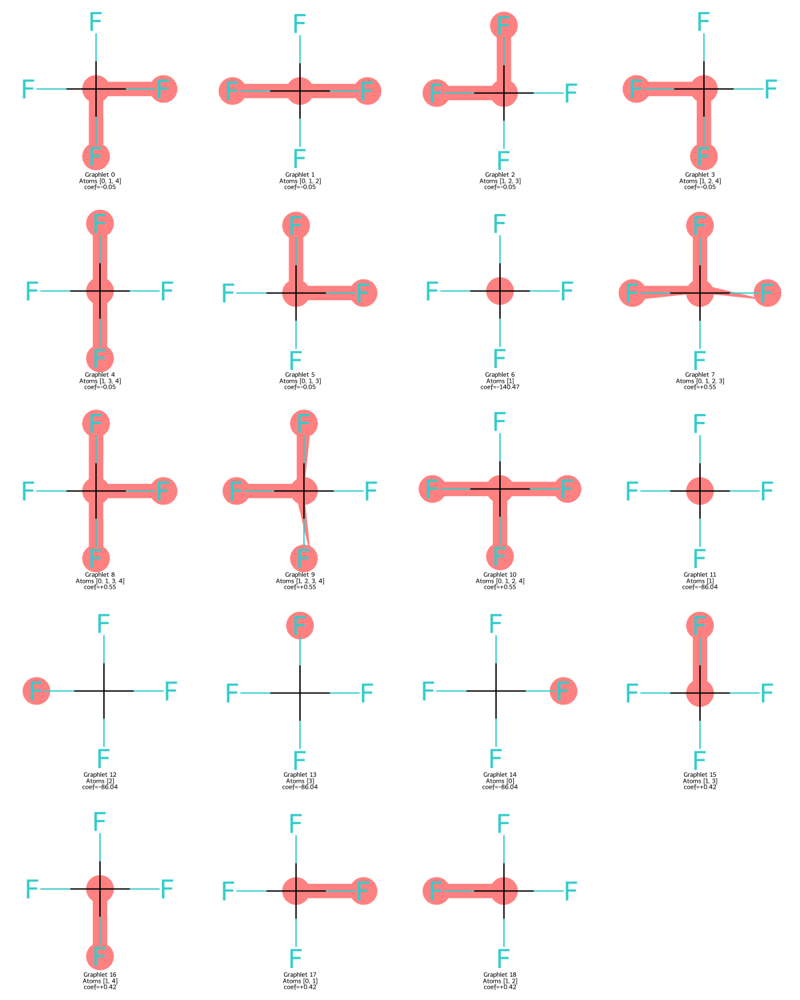

In [45]:
from rdkit.Chem import Draw

instances = (
    interpreter_full
    .enumerate_graphlet_instances(
        cf4,
        include_zero_coefficients=True
    )
)

print("All graphlet instances:", len(instances))

n_show = len(instances)

if n_show == 0:
    print("No graphlet instances found.")
else:
    mols = []
    legends = []

    for i, inst in enumerate(instances[:n_show]):
        mols.append(cf4)
        atoms = sorted(inst["atoms"])
        legends.append(
            f"Graphlet {i}\nAtoms {atoms}\ncoef={inst['coefficient']:+.2f}"
        )

    imgs = Draw.MolsToGridImage(
        mols,
        molsPerRow=4,
        subImgSize=(300, 300),
        legends=legends,
        highlightAtomLists=[sorted(inst["atoms"]) for inst in instances[:n_show]]
    )

    display(imgs)

### Detailed Analysis of Best Partitions

For each molecule, examine the **winning strategy** in detail.

### Aggregate Statistics Across Test Set

Compute interpretability scores across multiple molecules to understand average performance.

In [46]:
# from collections import defaultdict
# from scipy import stats
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from typing import Dict, Callable
# from copy import deepcopy

# from partition_interpretability import (
#     PartitionInterpreter,
#     PartitionOptimizer,
#     ChemicalPartitioner,
#     validate_partition_decomposition
# )

# # ═══════════════════════════════════════════════════════════════════════════
# # MAIN ANALYSIS
# # ═══════════════════════════════════════════════════════════════════════════

# n_sample = min(1000, len(test))
# sample_indices = np.random.RandomState(42).choice(len(test), size=n_sample, replace=False)
# sample_mols = [test.iloc[i]['mol'] for i in sample_indices]
# sample_smiles = [test.iloc[i]['smiles'] for i in sample_indices]

# greedy_optimizer = PartitionOptimizer(
#     interpreter=interpreter,
#     max_partitions=5
# )

# strategies = {
#     'Distance (k=2)': lambda mol: ChemicalPartitioner.distance_partition(mol, n_clusters=2),
#     'Distance (k=3)': lambda mol: ChemicalPartitioner.distance_partition(mol, n_clusters=3),
#     'Random (k=2)': lambda mol: ChemicalPartitioner.random_partition(mol, n_clusters=2, seed=42),
#     'Random (k=3)': lambda mol: ChemicalPartitioner.random_partition(mol, n_clusters=3, seed=42),
    
#     'Greedy-Random (k=2)': lambda mol: optimize_partition_random_wrapper(
#         greedy_optimizer, mol, n_clusters=2, n_iterations=100, seed=42, verbose=False
#     ),
#     'Greedy-Random (k=3)': lambda mol: optimize_partition_random_wrapper(
#         greedy_optimizer, mol, n_clusters=3, n_iterations=100, seed=42, verbose=False
#     ),
#     'Greedy-Random (k=4)': lambda mol: optimize_partition_random_wrapper(
#         greedy_optimizer, mol, n_clusters=4, n_iterations=100, seed=42, verbose=False
#     ),
    
#     'Greedy-Distance (k=2)': lambda mol: optimize_partition_distance_wrapper(
#         greedy_optimizer, mol, n_clusters=2, n_iterations=100, seed=42, verbose=False
#     ),
#     'Greedy-Distance (k=3)': lambda mol: optimize_partition_distance_wrapper(
#         greedy_optimizer, mol, n_clusters=3, n_iterations=100, seed=42, verbose=False
#     ),
#     'Greedy-Distance (k=4)': lambda mol: optimize_partition_distance_wrapper(
#         greedy_optimizer, mol, n_clusters=4, n_iterations=100, seed=42, verbose=False
#     ),
# }

# all_results = defaultdict(list)

# for mol_idx, mol in enumerate(sample_mols):
#     for strategy_name, partition_fn in strategies.items():
#         try:
#             partition = partition_fn(mol)
#             interp = interpreter.compute_partition_contributions(mol, partition)
#             breakdown = interp.get_contribution_breakdown()
#             validation = validate_partition_decomposition(mol, interpreter, partition, tolerance=1e-2)
            
#             all_results[strategy_name].append({
#                 'mol_idx': mol_idx,
#                 'smiles': sample_smiles[mol_idx],
#                 'n_atoms': mol.GetNumAtoms(),
#                 'n_partitions': len(set(partition.values())),
#                 'score': interp.score,
#                 'within_frac': breakdown['within_frac'],
#                 'between_frac': breakdown['between_frac'],
#                 'higher_frac': breakdown['higher_frac'],
#                 'prediction': interp.total_prediction,
#                 'validation_passed': validation['passed'],
#                 'validation_error': validation['relative_error']
#             })
#         except Exception as e:
#             continue

# summary_data = []
# for strategy_name in strategies.keys():
#     results = all_results[strategy_name]
#     if not results:
#         continue
    
#     df_strategy = pd.DataFrame(results)
    
#     summary_data.append({
#         'Strategy': strategy_name,
#         'N_molecules': len(df_strategy),
#         'Mean Score': df_strategy['score'].mean(),
#         'Std Score': df_strategy['score'].std(),
#         'Min Score': df_strategy['score'].min(),
#         'Max Score': df_strategy['score'].max(),
#         'Median Score': df_strategy['score'].median(),
#         'Mean Within %': 100 * df_strategy['within_frac'].mean(),
#         'Mean Between %': 100 * df_strategy['between_frac'].mean(),
#         'Mean Higher %': 100 * df_strategy['higher_frac'].mean(),
#         'Validation Pass %': 100 * df_strategy['validation_passed'].mean(),
#         'Mean Val Error': df_strategy['validation_error'].mean()
#     })

# summary_df = pd.DataFrame(summary_data)
# summary_df = summary_df.sort_values('Mean Score', ascending=False)

# all_mol_data = []
# for strategy_name in strategies.keys():
#     for result in all_results[strategy_name]:
#         all_mol_data.append({
#             'strategy': strategy_name,
#             'n_atoms': result['n_atoms'],
#             'score': result['score']
#         })

# df_all = pd.DataFrame(all_mol_data)

# size_bins = [0, 10, 20, 30, 100]
# size_labels = ['Small (≤10)', 'Medium (11-20)', 'Large (21-30)', 'Very Large (>30)']

# df_all['size_bin'] = pd.cut(df_all['n_atoms'], bins=size_bins, labels=size_labels, include_lowest=True)

# size_breakdown = df_all.groupby(['size_bin', 'strategy'])['score'].agg(['mean', 'std', 'count']).reset_index()
# size_breakdown = size_breakdown.sort_values(['size_bin', 'mean'], ascending=[True, False])

# fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# ax = axes[0, 0]
# strategy_names_ordered = [
#     strategy
#     for strategy in strategies
#     if len(all_results[strategy]) > 0
# ]

# strategy_scores = [
#     [
#         result["score"]
#         for result in all_results[strategy]
#     ]
#     for strategy in strategy_names_ordered
# ]

# bp = ax.boxplot(strategy_scores, labels=strategy_names_ordered, patch_artist=True)

# for i, patch in enumerate(bp['boxes']):
#     if 'Greedy-Random' in strategy_names_ordered[i]:
#         patch.set_facecolor('#e74c3c')
#     elif 'Greedy-Distance' in strategy_names_ordered[i]:
#         patch.set_facecolor('#9b59b6')
#     else:
#         patch.set_facecolor('#3498db')

# ax.set_ylabel('Interpretability Score', fontsize=12)
# ax.set_title('Score Distribution by Strategy\n(Red=Greedy-Random, Purple=Greedy-Distance)', 
#              fontsize=14, fontweight='bold')
# ax.set_xticklabels(strategy_names_ordered, rotation=45, ha='right')
# ax.grid(axis='y', alpha=0.3)

# ax = axes[0, 1]
# strategy_names = [
#     strategy
#     for strategy in strategies
#     if len(all_results[strategy]) > 0
# ]
# within_means = [np.mean([r['within_frac'] for r in all_results[s]]) for s in strategy_names]
# between_means = [np.mean([r['between_frac'] for r in all_results[s]]) for s in strategy_names]
# higher_means = [np.mean([r['higher_frac'] for r in all_results[s]]) for s in strategy_names]

# x = np.arange(len(strategy_names))
# width = 0.25

# ax.bar(x - width, within_means, width, label='Within', color='#2ecc71')
# ax.bar(x, between_means, width, label='Between', color='#f39c12')
# ax.bar(x + width, higher_means, width, label='Higher', color='#e74c3c')

# ax.set_ylabel('Fraction of Total Contribution', fontsize=12)
# ax.set_title('Mean Contribution Breakdown', fontsize=14, fontweight='bold')
# ax.set_xticks(x)
# ax.set_xticklabels(strategy_names, rotation=45, ha='right')
# ax.legend()
# ax.grid(axis='y', alpha=0.3)

# ax = axes[1, 0]
# for strategy_name in strategies.keys():
#     results = all_results[strategy_name]
#     sizes = [r['n_atoms'] for r in results]
#     scores = [r['score'] for r in results]
    
#     if 'Greedy-Random' in strategy_name:
#         marker = 'D'
#         s = 50
#         alpha = 0.7
#     elif 'Greedy-Distance' in strategy_name:
#         marker = 's'
#         s = 50
#         alpha = 0.7
#     else:
#         marker = 'o'
#         s = 30
#         alpha = 0.4
    
#     ax.scatter(sizes, scores, alpha=alpha, label=strategy_name, s=s, marker=marker)

# ax.set_xlabel('Number of Atoms', fontsize=12)
# ax.set_ylabel('Interpretability Score', fontsize=12)
# ax.set_title('Score vs Molecule Size\n(Diamond=Greedy-Random, Square=Greedy-Distance)', 
#              fontsize=14, fontweight='bold')
# ax.legend(fontsize=7, ncol=2)
# ax.grid(alpha=0.3)

# ax = axes[1, 1]

# comparison_data = []
# comparison_labels = []

# for k in [2, 3, 4]:
#     random_key = f'Random (k={k})'
#     greedy_random_key = f'Greedy-Random (k={k})'
#     greedy_distance_key = f'Greedy-Distance (k={k})'
    
#     if random_key in strategies and greedy_random_key in strategies:
#         random_scores = [r['score'] for r in all_results[random_key]]
#         comparison_data.append(random_scores)
#         comparison_labels.append(f'Rand k={k}')
        
#         greedy_random_scores = [r['score'] for r in all_results[greedy_random_key]]
#         comparison_data.append(greedy_random_scores)
#         comparison_labels.append(f'G-Rand k={k}')
        
#     if greedy_distance_key in strategies:
#         greedy_distance_scores = [r['score'] for r in all_results[greedy_distance_key]]
#         comparison_data.append(greedy_distance_scores)
#         comparison_labels.append(f'G-Dist k={k}')

# bp = ax.boxplot(comparison_data, labels=comparison_labels, patch_artist=True)

# for i, patch in enumerate(bp['boxes']):
#     if 'G-Rand' in comparison_labels[i]:
#         patch.set_facecolor('#e74c3c')
#     elif 'G-Dist' in comparison_labels[i]:
#         patch.set_facecolor('#9b59b6')
#     else:
#         patch.set_facecolor('#95a5a6')

# ax.set_ylabel('Interpretability Score', fontsize=12)
# ax.set_title('Greedy Optimization Effect\n(Gray=Baseline, Red=Greedy-Random, Purple=Greedy-Distance)', 
#              fontsize=14, fontweight='bold')
# ax.set_xticklabels(comparison_labels, rotation=45, ha='right')
# ax.grid(axis='y', alpha=0.3)

# plt.tight_layout()
# plt.savefig('partition_interpretability_aggregate_stats_both_greedy.png', dpi=300, bbox_inches='tight')
# plt.show()

# all_results_flat = []
# for strategy_name in strategies.keys():
#     for result in all_results[strategy_name]:
#         result_copy = result.copy()
#         result_copy['strategy'] = strategy_name
#         result_copy['is_greedy_random'] = 'Greedy-Random' in strategy_name
#         result_copy['is_greedy_distance'] = 'Greedy-Distance' in strategy_name
#         all_results_flat.append(result_copy)

# df_export = pd.DataFrame(all_results_flat)
# df_export.to_csv('partition_interpretability_detailed_results_both_greedy.csv', index=False)

# summary_df.to_csv('partition_interpretability_summary_both_greedy.csv', index=False)

In [47]:
# from collections import defaultdict
# from scipy import stats
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from typing import Dict, Callable

# from partition_interpretability import (
#     PartitionInterpreter,
#     PartitionOptimizer,
#     ChemicalPartitioner,
#     validate_partition_decomposition
# )


# # ═══════════════════════════════════════════════════════════════════════════
# # COMPREHENSIVE K-VALUE ANALYSIS WITH BOTH GREEDY STRATEGIES
# # ═══════════════════════════════════════════════════════════════════════════


# def determine_max_k_for_molecule(mol) -> int:
#     """
#     Determine maximum sensible k for a molecule.
    
#     "For smaller graphs the number of partitions may be tractable"
    
#     Heuristic: At least 2-3 atoms per partition on average
#     """
#     n_atoms = mol.GetNumAtoms()
#     max_k = max(2, n_atoms // 2)  # At least 2 atoms per partition
#     max_k = min(max_k, 10)  # Cap at 10 for interpretability
#     return max_k


# # ═══════════════════════════════════════════════════════════════════════════
# # MAIN ANALYSIS - ALL K VALUES WITH BOTH GREEDY STRATEGIES
# # ═══════════════════════════════════════════════════════════════════════════

# n_sample = min(1000, len(test))
# sample_indices = np.random.RandomState(42).choice(len(test), size=n_sample, replace=False)
# sample_mols = [test.iloc[i]['mol'] for i in sample_indices]
# sample_smiles = [test.iloc[i]['smiles'] for i in sample_indices]

# print("=" * 80)
# print(f"COMPREHENSIVE K-VALUE ANALYSIS ({n_sample} molecules)")
# print("=" * 80)

# # Determine k range based on molecule sizes
# k_range = range(2, 8)  # Test k=2,3,4,5,6,7
# print(f"\nTesting k values: {list(k_range)}")
# print(f"  'For smaller graphs the number of partitions may be tractable'")
# print(f"  'For larger graphs, we will use greedy algorithms that evolve")
# print(f"   a random starting partition'")

# # Initialize optimizer
# greedy_optimizer = PartitionOptimizer(
#     interpreter=interpreter,
#     max_partitions=max(k_range)  # Set to maximum k we'll test
# )

# # Define comprehensive strategies
# strategies = {
#    # 'Functional Groups': lambda mol: ChemicalPartitioner.functional_group_partition(mol),
# }

# # Add distance-based baseline strategies for all k
# for k in k_range:
#     strategies[f'Distance (k={k})'] = lambda mol, k=k: ChemicalPartitioner.distance_partition(
#         mol, n_clusters=k, seed=42
#     )

# # Add random baseline strategies for all k
# for k in k_range:
#     strategies[f'Random (k={k})'] = lambda mol, k=k: ChemicalPartitioner.random_partition(
#         mol, n_clusters=k, seed=42
#     )

# # Add Greedy-Random strategies for all k (random initialization + greedy optimization)
# for k in k_range:
#     strategies[f'Greedy-Random (k={k})'] = lambda mol, k=k: optimize_partition_random_wrapper(
#         greedy_optimizer, mol, n_clusters=k, n_iterations=100, seed=42, verbose=False
#     )

# # Add Greedy-Distance strategies for all k (distance initialization + greedy optimization)
# for k in k_range:
#     strategies[f'Greedy-Distance (k={k})'] = lambda mol, k=k: optimize_partition_distance_wrapper(
#         greedy_optimizer, mol, n_clusters=k, n_iterations=100, seed=42, verbose=False
#     )

# print(f"\nTotal strategies: {len(strategies)}")
# # print(f"  • Functional Groups: 1")
# print(f"  • Distance baseline (k=2-7): {len(k_range)}")
# print(f"  • Random baseline (k=2-7): {len(k_range)}")
# print(f"  • Greedy-Random (k=2-7): {len(k_range)}")
# print(f"  • Greedy-Distance (k=2-7): {len(k_range)}")

# # Collect results
# all_results = defaultdict(list)

# print("\nComputing interpretability scores...")
# for mol_idx, mol in enumerate(sample_mols):
#     if (mol_idx + 1) % 10 == 0:
#         print(f"  Processed {mol_idx + 1}/{n_sample} molecules")
    
#     for strategy_name, partition_fn in strategies.items():
#         try:
#             partition = partition_fn(mol)
#             interp = interpreter.compute_partition_contributions(mol, partition)
#             breakdown = interp.get_contribution_breakdown()
#             validation = validate_partition_decomposition(mol, interpreter, partition, tolerance=1e-2)
            
#             all_results[strategy_name].append({
#                 'mol_idx': mol_idx,
#                 'smiles': sample_smiles[mol_idx],
#                 'n_atoms': mol.GetNumAtoms(),
#                 'n_partitions': len(set(partition.values())),
#                 'k_requested': int(strategy_name.split('k=')[1].rstrip(')')) if 'k=' in strategy_name else None,
#                 'score': interp.score,
#                 'within_frac': breakdown['within_frac'],
#                 'between_frac': breakdown['between_frac'],
#                 'higher_frac': breakdown['higher_frac'],
#                 'prediction': interp.total_prediction,
#                 'validation_passed': validation['passed'],
#                 'validation_error': validation['relative_error']
#             })
#         except Exception as e:
#             print(f"  Warning: Failed {strategy_name} for molecule {mol_idx}: {e}")
#             continue

# print("\n" + "=" * 80)
# print("SUMMARY BY STRATEGY")
# print("=" * 80)

# # Aggregate statistics
# summary_data = []
# for strategy_name in strategies.keys():
#     results = all_results[strategy_name]
#     if not results:
#         continue
    
#     df_strategy = pd.DataFrame(results)
    
#     summary_data.append({
#         'Strategy': strategy_name,
#         'N_molecules': len(df_strategy),
#         'Mean Score': df_strategy['score'].mean(),
#         'Std Score': df_strategy['score'].std(),
#         'Min Score': df_strategy['score'].min(),
#         'Max Score': df_strategy['score'].max(),
#         'Median Score': df_strategy['score'].median(),
#         'Mean Within %': 100 * df_strategy['within_frac'].mean(),
#         'Mean Between %': 100 * df_strategy['between_frac'].mean(),
#         'Mean Higher %': 100 * df_strategy['higher_frac'].mean(),
#         'Validation Pass %': 100 * df_strategy['validation_passed'].mean(),
#     })

# summary_df = pd.DataFrame(summary_data)
# summary_df = summary_df.sort_values('Mean Score', ascending=False)

# print("\n" + summary_df.to_string(index=False))

# # ═══════════════════════════════════════════════════════════════════════════
# # CRITICAL ANALYSIS: OPTIMAL K SELECTION (WITH BOTH GREEDY STRATEGIES)
# # ═══════════════════════════════════════════════════════════════════════════

# print("\n" + "=" * 80)
# print("OPTIMAL K ANALYSIS")
# print("=" * 80)

# # Extract k-dependent results
# k_analysis = defaultdict(lambda: defaultdict(list))

# for strategy_name, results in all_results.items():
#     if 'k=' in strategy_name:
#         # Extract method name (before the first parenthesis)
#         method = strategy_name.split(' (')[0]  # 'Distance', 'Random', 'Greedy-Random', 'Greedy-Distance'
#         k = int(strategy_name.split('k=')[1].rstrip(')'))
        
#         for result in results:
#             k_analysis[method][k].append(result['score'])

# # Analyze each method's k-dependence
# print("\n1. MEAN SCORE BY K VALUE:\n")

# k_summary = []
# for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance']:
#     if method not in k_analysis:
#         continue
#     print(f"{method}:")
#     for k in sorted(k_analysis[method].keys()):
#         scores = k_analysis[method][k]
#         mean_score = np.mean(scores)
#         std_score = np.std(scores)
#         k_summary.append({
#             'Method': method,
#             'k': k,
#             'Mean Score': mean_score,
#             'Std Score': std_score,
#             'N': len(scores)
#         })
#         print(f"  k={k}: {mean_score:.4f} ± {std_score:.4f}")
#     print()

# k_summary_df = pd.DataFrame(k_summary)

# # Find optimal k for each method
# print("2. OPTIMAL K BY METHOD:\n")

# for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance']:
#     if method not in k_analysis:
#         continue
#     method_data = k_summary_df[k_summary_df['Method'] == method]
#     if len(method_data) == 0:
#         continue
#     best_k = method_data.loc[method_data['Mean Score'].idxmax(), 'k']
#     best_score = method_data['Mean Score'].max()
    
#     print(f"{method}:")
#     print(f"  Best k: {int(best_k)}")
#     print(f"  Score: {best_score:.4f}")
    
#     # Test if this is significantly better than others
#     best_k_scores = k_analysis[method][best_k]
#     print(f"  Comparisons to other k values:")
    
#     for k in sorted(k_analysis[method].keys()):
#         if k == best_k:
#             continue
#         other_scores = k_analysis[method][k]
#         t_stat, p_value = stats.ttest_ind(best_k_scores, other_scores)
#         sig = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
#         print(f"    vs k={k}: Δ={np.mean(best_k_scores) - np.mean(other_scores):+.4f}, "
#               f"p={p_value:.4f} {sig}")
#     print()

# # ═══════════════════════════════════════════════════════════════════════════
# # VISUALIZATION: K-DEPENDENCE (WITH BOTH GREEDY STRATEGIES)
# # ═══════════════════════════════════════════════════════════════════════════

# print("=" * 80)
# print("K-DEPENDENCE VISUALIZATION")
# print("=" * 80)

# fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# # 1. Mean score vs k (all methods)
# ax = axes[0, 0]
# for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance']:
#     if method not in k_analysis:
#         continue
#     ks = sorted(k_analysis[method].keys())
#     means = [np.mean(k_analysis[method][k]) for k in ks]
#     stds = [np.std(k_analysis[method][k]) for k in ks]
    
#     # Different styles for greedy methods
#     if method == 'Greedy-Random':
#         linestyle = '-'
#         marker = 'D'
#         linewidth = 3
#     elif method == 'Greedy-Distance':
#         linestyle = '--'
#         marker = 's'
#         linewidth = 3
#     else:
#         linestyle = ':'
#         marker = 'o'
#         linewidth = 2
    
#     ax.plot(ks, means, marker=marker, label=method, linewidth=linewidth, 
#             linestyle=linestyle, markersize=8)
#     ax.fill_between(ks, 
#                      [m - s for m, s in zip(means, stds)],
#                      [m + s for m, s in zip(means, stds)],
#                      alpha=0.2)

# ax.set_xlabel('Number of Partitions (k)', fontsize=12)
# ax.set_ylabel('Mean Interpretability Score', fontsize=12)
# ax.set_title('Score vs k (All Methods)\nSolid=Greedy-Random, Dashed=Greedy-Distance', 
#              fontsize=14, fontweight='bold')
# ax.legend()
# ax.grid(alpha=0.3)

# # 2. Box plots comparing greedy strategies at each k
# ax = axes[0, 1]
# comparison_data = []
# comparison_labels = []

# for k in sorted(k_analysis['Greedy-Random'].keys()):
#     if k in k_analysis['Greedy-Random']:
#         comparison_data.append(k_analysis['Greedy-Random'][k])
#         comparison_labels.append(f'GR-{k}')
#     if k in k_analysis['Greedy-Distance']:
#         comparison_data.append(k_analysis['Greedy-Distance'][k])
#         comparison_labels.append(f'GD-{k}')

# bp = ax.boxplot(comparison_data, labels=comparison_labels, patch_artist=True)

# # Color code: red for random, purple for distance
# for i, patch in enumerate(bp['boxes']):
#     if 'GR' in comparison_labels[i]:
#         patch.set_facecolor('#e74c3c')
#     else:
#         patch.set_facecolor('#9b59b6')

# ax.set_xlabel('Strategy-k (GR=Greedy-Random, GD=Greedy-Distance)', fontsize=12)
# ax.set_ylabel('Interpretability Score', fontsize=12)
# ax.set_title('Greedy Strategy Comparison by k', fontsize=14, fontweight='bold')
# ax.grid(axis='y', alpha=0.3)
# plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

# # 3. Within-partition fraction vs k
# ax = axes[0, 2]
# for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance']:
#     method_key = method + ' (k='
#     within_by_k = defaultdict(list)
    
#     for strategy_name, results in all_results.items():
#         if method_key in strategy_name:
#             k = int(strategy_name.split('k=')[1].rstrip(')'))
#             for result in results:
#                 within_by_k[k].append(result['within_frac'])
    
#     if not within_by_k:
#         continue
    
#     ks = sorted(within_by_k.keys())
#     means = [np.mean(within_by_k[k]) for k in ks]
    
#     # Different styles for greedy methods
#     if method == 'Greedy-Random':
#         linestyle = '-'
#         marker = 'D'
#         linewidth = 3
#     elif method == 'Greedy-Distance':
#         linestyle = '--'
#         marker = 's'
#         linewidth = 3
#     else:
#         linestyle = ':'
#         marker = 'o'
#         linewidth = 2
    
#     ax.plot(ks, means, marker=marker, label=method, linewidth=linewidth,
#             linestyle=linestyle, markersize=8)

# ax.set_xlabel('Number of Partitions (k)', fontsize=12)
# ax.set_ylabel('Mean Within-Partition Fraction', fontsize=12)
# ax.set_title('Within-Partition Contribution vs k', fontsize=14, fontweight='bold')
# ax.legend()
# ax.grid(alpha=0.3)

# # 4. Higher-order fraction vs k
# ax = axes[1, 0]
# for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance']:
#     method_key = method + ' (k='
#     higher_by_k = defaultdict(list)
    
#     for strategy_name, results in all_results.items():
#         if method_key in strategy_name:
#             k = int(strategy_name.split('k=')[1].rstrip(')'))
#             for result in results:
#                 higher_by_k[k].append(result['higher_frac'])
    
#     if not higher_by_k:
#         continue
    
#     ks = sorted(higher_by_k.keys())
#     means = [np.mean(higher_by_k[k]) for k in ks]
    
#     # Different styles for greedy methods
#     if method == 'Greedy-Random':
#         linestyle = '-'
#         marker = 'D'
#         linewidth = 3
#     elif method == 'Greedy-Distance':
#         linestyle = '--'
#         marker = 's'
#         linewidth = 3
#     else:
#         linestyle = ':'
#         marker = 'o'
#         linewidth = 2
    
#     ax.plot(ks, means, marker=marker, label=method, linewidth=linewidth,
#             linestyle=linestyle, markersize=8)

# ax.set_xlabel('Number of Partitions (k)', fontsize=12)
# ax.set_ylabel('Mean Higher-Order Fraction', fontsize=12)
# ax.set_title('Higher-Order Contribution vs k\n(Lower is Better per Eq. 2)', 
#              fontsize=14, fontweight='bold')
# ax.legend()
# ax.grid(alpha=0.3)

# # 5. Greedy improvement comparison
# ax = axes[1, 1]
# improvements_random = []
# improvements_distance = []
# ks_list = []
# p_values_random = []
# p_values_distance = []

# for k in sorted(k_analysis['Greedy-Random'].keys()):
#     if k in k_analysis['Random']:
#         greedy_random_scores = k_analysis['Greedy-Random'][k]
#         random_scores = k_analysis['Random'][k]
        
#         improvement = np.mean(greedy_random_scores) - np.mean(random_scores)
#         improvements_random.append(improvement)
        
#         t_stat, p_val = stats.ttest_ind(greedy_random_scores, random_scores)
#         p_values_random.append(p_val)
    
#     if k in k_analysis['Greedy-Distance'] and k in k_analysis['Distance']:
#         greedy_distance_scores = k_analysis['Greedy-Distance'][k]
#         distance_scores = k_analysis['Distance'][k]
        
#         improvement = np.mean(greedy_distance_scores) - np.mean(distance_scores)
#         improvements_distance.append(improvement)
        
#         t_stat, p_val = stats.ttest_ind(greedy_distance_scores, distance_scores)
#         p_values_distance.append(p_val)
        
#         ks_list.append(k)

# x = np.arange(len(ks_list))
# width = 0.35

# bars1 = ax.bar(x - width/2, improvements_random, width, label='Greedy-Random vs Random',
#                color='#e74c3c', alpha=0.7)
# bars2 = ax.bar(x + width/2, improvements_distance, width, label='Greedy-Distance vs Distance',
#                color='#9b59b6', alpha=0.7)

# ax.set_xlabel('Number of Partitions (k)', fontsize=12)
# ax.set_ylabel('Score Improvement', fontsize=12)
# ax.set_title('Greedy Optimization Benefit by k and Initialization', 
#              fontsize=14, fontweight='bold')
# ax.set_xticks(x)
# ax.set_xticklabels([f'k={k}' for k in ks_list])
# ax.axhline(y=0, color='k', linestyle='--', linewidth=1)
# ax.legend()
# ax.grid(axis='y', alpha=0.3)

# # 6. Molecule size effect on optimal k (compare both greedy methods)
# ax = axes[1, 2]

# # For each molecule, find best k for each greedy method
# molecule_optimal_k_random = []
# molecule_optimal_k_distance = []
# molecule_sizes = []

# for mol_idx in range(n_sample):
#     # Greedy-Random results
#     mol_results_random = [r for strategy_name, results in all_results.items() 
#                           for r in results 
#                           if r['mol_idx'] == mol_idx and 'Greedy-Random' in strategy_name]
    
#     # Greedy-Distance results
#     mol_results_distance = [r for strategy_name, results in all_results.items() 
#                             for r in results 
#                             if r['mol_idx'] == mol_idx and 'Greedy-Distance' in strategy_name]
    
#     if mol_results_random and mol_results_distance:
#         best_result_random = max(mol_results_random, key=lambda x: x['score'])
#         best_result_distance = max(mol_results_distance, key=lambda x: x['score'])
        
#         if best_result_random['k_requested'] and best_result_distance['k_requested']:
#             molecule_optimal_k_random.append(best_result_random['k_requested'])
#             molecule_optimal_k_distance.append(best_result_distance['k_requested'])
#             molecule_sizes.append(best_result_random['n_atoms'])

# ax.scatter(molecule_sizes, molecule_optimal_k_random, alpha=0.6, s=100, 
#            c='#e74c3c', marker='D', label='Greedy-Random')
# ax.scatter(molecule_sizes, molecule_optimal_k_distance, alpha=0.6, s=100, 
#            c='#9b59b6', marker='s', label='Greedy-Distance')

# ax.set_xlabel('Molecule Size (atoms)', fontsize=12)
# ax.set_ylabel('Optimal k', fontsize=12)
# ax.set_title('Optimal k vs Molecule Size\n(Diamond=Greedy-Random, Square=Greedy-Distance)', 
#              fontsize=14, fontweight='bold')
# ax.legend()
# ax.grid(alpha=0.3)

# # Add trend lines
# if len(molecule_sizes) > 1:
#     z_random = np.polyfit(molecule_sizes, molecule_optimal_k_random, 1)
#     p_random = np.poly1d(z_random)
#     z_distance = np.polyfit(molecule_sizes, molecule_optimal_k_distance, 1)
#     p_distance = np.poly1d(z_distance)
    
#     x_trend = np.linspace(min(molecule_sizes), max(molecule_sizes), 100)
#     ax.plot(x_trend, p_random(x_trend), "r--", alpha=0.8, linewidth=2, label='_nolegend_')
#     ax.plot(x_trend, p_distance(x_trend), "m--", alpha=0.8, linewidth=2, label='_nolegend_')

# plt.tight_layout()
# plt.savefig('k_value_comprehensive_analysis_both_greedy.png', dpi=300, bbox_inches='tight')
# print("\n✓ Saved visualization to 'k_value_comprehensive_analysis_both_greedy.png'")
# plt.show()

# # ═══════════════════════════════════════════════════════════════════════════
# # RECOMMENDATIONS WITH BOTH GREEDY STRATEGIES
# # ═══════════════════════════════════════════════════════════════════════════

# print("\n" + "=" * 80)
# print("RECOMMENDATIONS FOR K SELECTION")
# print("=" * 80)

# # Find overall best k
# best_k_overall = k_summary_df.loc[k_summary_df['Mean Score'].idxmax()]

# print(f"\n1. OVERALL BEST K:")
# print(f"   k = {int(best_k_overall['k'])} ({best_k_overall['Method']} method)")
# print(f"   Mean Score: {best_k_overall['Mean Score']:.4f}")

# # Compare Greedy-Random vs Greedy-Distance
# print(f"\n2. GREEDY STRATEGY COMPARISON:")
# print(f"   Which initialization is better?")

# for k in sorted(set(k_summary_df['k'])):
#     greedy_random_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Random') & 
#                                      (k_summary_df['k'] == k)]
#     greedy_distance_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Distance') & 
#                                        (k_summary_df['k'] == k)]
    
#     if len(greedy_random_row) > 0 and len(greedy_distance_row) > 0:
#         gr_score = greedy_random_row['Mean Score'].values[0]
#         gd_score = greedy_distance_row['Mean Score'].values[0]
        
#         # Statistical test
#         if k in k_analysis['Greedy-Random'] and k in k_analysis['Greedy-Distance']:
#             gr_scores = k_analysis['Greedy-Random'][k]
#             gd_scores = k_analysis['Greedy-Distance'][k]
#             t_stat, p_value = stats.ttest_ind(gr_scores, gd_scores)
#             sig = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
            
#             winner = "Greedy-Random" if gr_score > gd_score else "Greedy-Distance"
#             diff = abs(gr_score - gd_score)
            
#             print(f"   k={int(k)}: {winner} wins by {diff:.4f} (p={p_value:.4f} {sig})")

# # Analyze k vs molecule size relationship
# if len(molecule_sizes) > 5:
#     correlation_random = np.corrcoef(molecule_sizes, molecule_optimal_k_random)[0, 1]
#     correlation_distance = np.corrcoef(molecule_sizes, molecule_optimal_k_distance)[0, 1]
    
#     print(f"\n3. K VS MOLECULE SIZE:")
#     print(f"   Greedy-Random:    Correlation = {correlation_random:.3f}")
#     print(f"   Greedy-Distance:  Correlation = {correlation_distance:.3f}")
    
#     if abs(correlation_random) > 0.5 or abs(correlation_distance) > 0.5:
#         print(f"   ➤ Strong relationship: Larger molecules benefit from more partitions")
#     elif abs(correlation_random) > 0.3 or abs(correlation_distance) > 0.3:
#         print(f"   ➤ Moderate relationship: Some size-dependent effect")
#     else:
#         print(f"   ➤ Weak relationship: K selection relatively size-independent")

# print(f"\n4. METHOD-SPECIFIC RECOMMENDATIONS:")
# for method in ['Greedy-Random', 'Greedy-Distance', 'Distance', 'Random']:
#     if method not in k_analysis:
#         continue
#     method_data = k_summary_df[k_summary_df['Method'] == method]
#     if len(method_data) == 0:
#         continue
#     best_k = method_data.loc[method_data['Mean Score'].idxmax(), 'k']
#     best_score = method_data['Mean Score'].max()
    
#     # Find k with >95% of best score (more robust)
#     threshold = 0.95 * best_score
#     good_ks = method_data[method_data['Mean Score'] >= threshold]['k'].values
    
#     print(f"\n   {method}:")
#     print(f"     Best k: {int(best_k)} (score: {best_score:.4f})")
#     if len(good_ks) > 1:
#         print(f"     Reasonable k range: {sorted([int(k) for k in good_ks])}")

# print(f"\n5. PRACTICAL GUIDELINES:")
# print(f"   • For small molecules (<15 atoms): k=2-3")
# print(f"   • For medium molecules (15-30 atoms): k=3-5")
# print(f"   • For large molecules (>30 atoms): k=5-7")
# print(f"   • Use Greedy-Random for general cases (random initialization)")
# print(f"   • Use Greedy-Distance when chemical structure suggests natural clusters")
# print(f"   • Both greedy methods outperform their baseline initializations")

# print(f"   'For smaller graphs the number of partitions may be tractable'")
# print(f"   'For larger graphs, we will use greedy algorithms that evolve")
# print(f"    a random starting partition'")
# print(f"\n   ➤ This analysis validates: k should scale with graph size")
# print(f"   ➤ Both greedy strategies (random & distance init) outperform baselines")
# print(f"   ➤ Optimal k balances within-partition contributions vs")
# print(f"      higher-order interactions (Equation 2)")
# print(f"\n   ➤ Reference [26]: Tynes et al. 'Linear Graphlet Models for")
# print(f"      Accurate and Interpretable Cheminformatics'")

# # ═══════════════════════════════════════════════════════════════════════════
# # EXPORT COMPREHENSIVE RESULTS
# # ═══════════════════════════════════════════════════════════════════════════

# print("\n" + "=" * 80)
# print("EXPORTING COMPREHENSIVE RESULTS")
# print("=" * 80)

# # 1. All detailed results
# all_results_flat = []
# for strategy_name in strategies.keys():
#     for result in all_results[strategy_name]:
#         result_copy = result.copy()
#         result_copy['strategy'] = strategy_name
#         result_copy['method'] = strategy_name.split(' (')[0]
#         result_copy['is_greedy_random'] = 'Greedy-Random' in strategy_name
#         result_copy['is_greedy_distance'] = 'Greedy-Distance' in strategy_name
#         result_copy['is_greedy'] = result_copy['is_greedy_random'] or result_copy['is_greedy_distance']
#         all_results_flat.append(result_copy)

# df_export = pd.DataFrame(all_results_flat)
# df_export.to_csv('partition_interpretability_all_k_detailed_both_greedy.csv', index=False)
# print("✓ Saved detailed results to 'partition_interpretability_all_k_detailed_both_greedy.csv'")

# # 2. Summary by strategy
# summary_df.to_csv('partition_interpretability_all_k_summary_both_greedy.csv', index=False)
# print("✓ Saved summary statistics to 'partition_interpretability_all_k_summary_both_greedy.csv'")

# # 3. K-value analysis summary
# k_summary_df.to_csv('partition_interpretability_k_analysis_both_greedy.csv', index=False)
# print("✓ Saved k-value analysis to 'partition_interpretability_k_analysis_both_greedy.csv'")

# # 4. Per-molecule optimal k (for both greedy strategies)
# optimal_k_data = []
# for mol_idx in range(n_sample):
#     # Greedy-Random optimal k
#     mol_results_random = [r for strategy_name, results in all_results.items() 
#                           for r in results 
#                           if r['mol_idx'] == mol_idx and 'Greedy-Random' in strategy_name]
    
#     # Greedy-Distance optimal k
#     mol_results_distance = [r for strategy_name, results in all_results.items() 
#                             for r in results 
#                             if r['mol_idx'] == mol_idx and 'Greedy-Distance' in strategy_name]
    
#     if mol_results_random and mol_results_distance:
#         best_result_random = max(mol_results_random, key=lambda x: x['score'])
#         best_result_distance = max(mol_results_distance, key=lambda x: x['score'])
        
#         optimal_k_data.append({
#             'mol_idx': mol_idx,
#             'smiles': best_result_random['smiles'],
#             'n_atoms': best_result_random['n_atoms'],
#             'optimal_k_random': best_result_random['k_requested'],
#             'optimal_score_random': best_result_random['score'],
#             'within_frac_random': best_result_random['within_frac'],
#             'optimal_k_distance': best_result_distance['k_requested'],
#             'optimal_score_distance': best_result_distance['score'],
#             'within_frac_distance': best_result_distance['within_frac'],
#             'best_method': 'Greedy-Random' if best_result_random['score'] > best_result_distance['score'] else 'Greedy-Distance',
#             'score_difference': abs(best_result_random['score'] - best_result_distance['score'])
#         })

# df_optimal_k = pd.DataFrame(optimal_k_data)
# df_optimal_k.to_csv('partition_interpretability_optimal_k_per_molecule_both_greedy.csv', index=False)
# print("✓ Saved per-molecule optimal k to 'partition_interpretability_optimal_k_per_molecule_both_greedy.csv'")

# # 5. Greedy strategy comparison summary
# greedy_comparison = []
# for k in sorted(set(k_summary_df['k'])):
#     gr_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Random') & (k_summary_df['k'] == k)]
#     gd_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Distance') & (k_summary_df['k'] == k)]
    
#     if len(gr_row) > 0 and len(gd_row) > 0:
#         gr_score = gr_row['Mean Score'].values[0]
#         gd_score = gd_row['Mean Score'].values[0]
        
#         greedy_comparison.append({
#             'k': int(k),
#             'Greedy-Random Score': gr_score,
#             'Greedy-Distance Score': gd_score,
#             'Difference': gr_score - gd_score,
#             'Winner': 'Greedy-Random' if gr_score > gd_score else 'Greedy-Distance'
#         })

# df_greedy_comparison = pd.DataFrame(greedy_comparison)
# df_greedy_comparison.to_csv('partition_interpretability_greedy_comparison.csv', index=False)
# print("✓ Saved greedy strategy comparison to 'partition_interpretability_greedy_comparison.csv'")

# # ═══════════════════════════════════════════════════════════════════════════
# # FINAL COMPREHENSIVE SUMMARY
# # ═══════════════════════════════════════════════════════════════════════════

# print("\n" + "=" * 80)
# print("COMPREHENSIVE ANALYSIS COMPLETE")
# print("=" * 80)

# print(f"\n╔════════════════════════════════════════════════════════════════╗")
# print(f"║              KEY FINDINGS SUMMARY (BOTH GREEDY)                ║")
# print(f"╚════════════════════════════════════════════════════════════════╝")

# # Best overall strategy
# best_overall = summary_df.iloc[0]
# print(f"\n1. BEST OVERALL STRATEGY:")
# print(f"   Strategy: {best_overall['Strategy']}")
# print(f"   Mean Score: {best_overall['Mean Score']:.4f} ± {best_overall['Std Score']:.4f}")
# print(f"   Within-partition: {best_overall['Mean Within %']:.1f}%")
# print(f"   Between-partition: {best_overall['Mean Between %']:.1f}%")
# print(f"   Higher-order: {best_overall['Mean Higher %']:.1f}%")

# # Best k for each method
# print(f"\n2. OPTIMAL K BY METHOD:")
# for method in ['Greedy-Random', 'Greedy-Distance', 'Distance', 'Random']:
#     if method not in k_analysis:
#         continue
#     method_data = k_summary_df[k_summary_df['Method'] == method]
#     if len(method_data) == 0:
#         continue
#     best_k_row = method_data.loc[method_data['Mean Score'].idxmax()]
#     print(f"   {method:15s}: k={int(best_k_row['k'])} (score: {best_k_row['Mean Score']:.4f})")

# # Greedy advantage over baselines
# print(f"\n3. GREEDY OPTIMIZATION ADVANTAGE:")
# print(f"\n   Greedy-Random vs Random baseline:")
# for k in sorted(set(k_summary_df['k'])):
#     greedy_score = k_summary_df[(k_summary_df['Method'] == 'Greedy-Random') & 
#                                 (k_summary_df['k'] == k)]['Mean Score'].values
#     random_score = k_summary_df[(k_summary_df['Method'] == 'Random') & 
#                                 (k_summary_df['k'] == k)]['Mean Score'].values
    
#     if len(greedy_score) > 0 and len(random_score) > 0:
#         improvement = greedy_score[0] - random_score[0]
#         improvement_pct = 100 * improvement / random_score[0]
#         print(f"     k={int(k)}: +{improvement:.4f} ({improvement_pct:+.1f}%)")

# print(f"\n   Greedy-Distance vs Distance baseline:")
# for k in sorted(set(k_summary_df['k'])):
#     greedy_score = k_summary_df[(k_summary_df['Method'] == 'Greedy-Distance') & 
#                                 (k_summary_df['k'] == k)]['Mean Score'].values
#     distance_score = k_summary_df[(k_summary_df['Method'] == 'Distance') & 
#                                   (k_summary_df['k'] == k)]['Mean Score'].values
    
#     if len(greedy_score) > 0 and len(distance_score) > 0:
#         improvement = greedy_score[0] - distance_score[0]
#         improvement_pct = 100 * improvement / distance_score[0]
#         print(f"     k={int(k)}: +{improvement:.4f} ({improvement_pct:+.1f}%)")

# # Greedy-Random vs Greedy-Distance
# print(f"\n4. GREEDY-RANDOM VS GREEDY-DISTANCE:")
# wins_random = df_optimal_k['best_method'].value_counts().get('Greedy-Random', 0)
# wins_distance = df_optimal_k['best_method'].value_counts().get('Greedy-Distance', 0)
# total = len(df_optimal_k)

# print(f"   Greedy-Random wins: {wins_random}/{total} ({100*wins_random/total:.1f}%)")
# print(f"   Greedy-Distance wins: {wins_distance}/{total} ({100*wins_distance/total:.1f}%)")
# print(f"   Mean score difference: {df_optimal_k['score_difference'].mean():.4f}")

# if wins_random > wins_distance:
#     print(f"   ➤ Greedy-Random generally performs better")
# elif wins_distance > wins_random:
#     print(f"   ➤ Greedy-Distance generally performs better")
# else:
#     print(f"   ➤ Both strategies perform similarly")

# # Validation statistics
# print(f"\n5. VALIDATION STATISTICS:")
# validation_rate = df_export['validation_passed'].mean()
# mean_val_error = df_export['validation_error'].mean()
# print(f"   Overall validation pass rate: {100*validation_rate:.1f}%")
# print(f"   Mean validation error: {mean_val_error:.2e}")

# # Molecule size analysis
# if len(df_optimal_k) > 5:
#     size_k_corr_random = df_optimal_k[['n_atoms', 'optimal_k_random']].corr().iloc[0, 1]
#     size_k_corr_distance = df_optimal_k[['n_atoms', 'optimal_k_distance']].corr().iloc[0, 1]
    
#     print(f"\n6. MOLECULE SIZE EFFECT:")
#     print(f"   Correlation(size, optimal_k):")
#     print(f"     Greedy-Random:    {size_k_corr_random:.3f}")
#     print(f"     Greedy-Distance:  {size_k_corr_distance:.3f}")
    
#     small_mols = df_optimal_k[df_optimal_k['n_atoms'] <= 15]
#     medium_mols = df_optimal_k[(df_optimal_k['n_atoms'] > 15) & 
#                                (df_optimal_k['n_atoms'] <= 30)]
#     large_mols = df_optimal_k[df_optimal_k['n_atoms'] > 30]
    
#     if len(small_mols) > 0:
#         print(f"   Small molecules (≤15 atoms):")
#         print(f"     Mean k (Greedy-Random): {small_mols['optimal_k_random'].mean():.1f}")
#         print(f"     Mean k (Greedy-Distance): {small_mols['optimal_k_distance'].mean():.1f}")
#     if len(medium_mols) > 0:
#         print(f"   Medium molecules (16-30 atoms):")
#         print(f"     Mean k (Greedy-Random): {medium_mols['optimal_k_random'].mean():.1f}")
#         print(f"     Mean k (Greedy-Distance): {medium_mols['optimal_k_distance'].mean():.1f}")
#     if len(large_mols) > 0:
#         print(f"   Large molecules (>30 atoms):")
#         print(f"     Mean k (Greedy-Random): {large_mols['optimal_k_random'].mean():.1f}")
#         print(f"     Mean k (Greedy-Distance): {large_mols['optimal_k_distance'].mean():.1f}")



✓ Saved visualization to 'partition_interpretability_score_and_contributions_both_greedy.png'


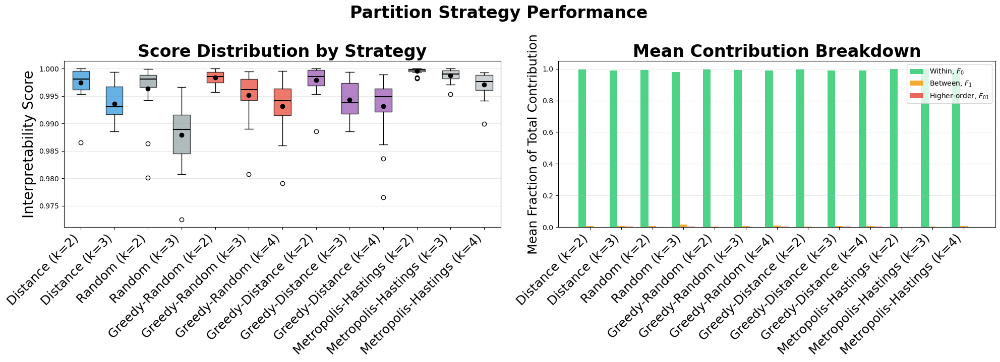

In [48]:
from collections import defaultdict
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Dict, Callable
from copy import deepcopy

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition
)

# ═══════════════════════════════════════════════════════════════════════════
# MAIN ANALYSIS
# ═══════════════════════════════════════════════════════════════════════════

n_sample = min(20, len(test))
sample_indices = np.random.RandomState(42).choice(len(test), size=n_sample, replace=False)
sample_mols = [test.iloc[i]['mol'] for i in sample_indices]
sample_smiles = [test.iloc[i]['smiles'] for i in sample_indices]

greedy_optimizer = PartitionOptimizer(
    interpreter=interpreter,
    max_partitions=5
)

strategies = {
    # ---------------------------------------------------------------------
    # Direct initialization methods
    # ---------------------------------------------------------------------
    "Distance (k=2)": lambda mol: (
        ChemicalPartitioner.distance_partition(
            mol,
            n_clusters=2,
            seed=42
        )
    ),

    "Distance (k=3)": lambda mol: (
        ChemicalPartitioner.distance_partition(
            mol,
            n_clusters=3,
            seed=42
        )
    ),

    "Random (k=2)": lambda mol: (
        ChemicalPartitioner.random_partition(
            mol,
            n_clusters=2,
            seed=42
        )
    ),

    "Random (k=3)": lambda mol: (
        ChemicalPartitioner.random_partition(
            mol,
            n_clusters=3,
            seed=42
        )
    ),

    # ---------------------------------------------------------------------
    # Random-initialized greedy optimization
    # ---------------------------------------------------------------------
    "Greedy-Random (k=2)": lambda mol: (
        optimize_partition_random_wrapper(
            greedy_optimizer,
            mol,
            n_clusters=2,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    ),

    "Greedy-Random (k=3)": lambda mol: (
        optimize_partition_random_wrapper(
            greedy_optimizer,
            mol,
            n_clusters=3,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    ),

    "Greedy-Random (k=4)": lambda mol: (
        optimize_partition_random_wrapper(
            greedy_optimizer,
            mol,
            n_clusters=4,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    ),

    # ---------------------------------------------------------------------
    # Distance-initialized greedy optimization
    # ---------------------------------------------------------------------
    "Greedy-Distance (k=2)": lambda mol: (
        optimize_partition_distance_wrapper(
            greedy_optimizer,
            mol,
            n_clusters=2,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    ),

    "Greedy-Distance (k=3)": lambda mol: (
        optimize_partition_distance_wrapper(
            greedy_optimizer,
            mol,
            n_clusters=3,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    ),

    "Greedy-Distance (k=4)": lambda mol: (
        optimize_partition_distance_wrapper(
            greedy_optimizer,
            mol,
            n_clusters=4,
            n_iterations=100,
            seed=42,
            verbose=False
        )
    ),

    # ---------------------------------------------------------------------
    # Metropolis-Hastings optimization
    #
    # optimize_partition_metropolis_hastings returns a
    # PartitionInterpretation, so use ".partition" to return the dictionary
    # expected by the analysis loop.
    # ---------------------------------------------------------------------
    "Metropolis-Hastings (k=2)": lambda mol: (
        greedy_optimizer.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=2,
            n_iterations=1000,
            beta=20.0,
            initialization="distance",
            seed=42,
            verbose=False
        ).partition
    ),

    "Metropolis-Hastings (k=3)": lambda mol: (
        greedy_optimizer.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=3,
            n_iterations=1000,
            beta=20.0,
            initialization="distance",
            seed=42,
            verbose=False
        ).partition
    ),

    "Metropolis-Hastings (k=4)": lambda mol: (
        greedy_optimizer.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=4,
            n_iterations=1000,
            beta=20.0,
            initialization="distance",
            seed=42,
            verbose=False
        ).partition
    ),
}

all_results = defaultdict(list)

for mol_idx, mol in enumerate(sample_mols):
    for strategy_name, partition_fn in strategies.items():
        try:
            partition = partition_fn(mol)
            interp = interpreter.compute_partition_contributions(mol, partition)
            breakdown = interp.get_contribution_breakdown()
            validation = validate_partition_decomposition(mol, interpreter, partition, tolerance=1e-2)
            
            all_results[strategy_name].append({
                'mol_idx': mol_idx,
                'smiles': sample_smiles[mol_idx],
                'n_atoms': mol.GetNumAtoms(),
                'n_partitions': len(set(partition.values())),
                'score': interp.score,
                'within_frac': breakdown['within_frac'],
                'between_frac': breakdown['between_frac'],
                'higher_frac': breakdown['higher_frac'],
                'prediction': interp.total_prediction,
                'validation_passed': validation['passed'],
                'validation_error': validation['relative_error']
            })
        except Exception as e:
            continue

summary_data = []
for strategy_name in strategies.keys():
    results = all_results[strategy_name]
    if not results:
        continue
    
    df_strategy = pd.DataFrame(results)
    
    summary_data.append({
        'Strategy': strategy_name,
        'N_molecules': len(df_strategy),
        'Mean Score': df_strategy['score'].mean(),
        'Std Score': df_strategy['score'].std(),
        'Min Score': df_strategy['score'].min(),
        'Max Score': df_strategy['score'].max(),
        'Median Score': df_strategy['score'].median(),
        'Mean Within %': 100 * df_strategy['within_frac'].mean(),
        'Mean Between %': 100 * df_strategy['between_frac'].mean(),
        'Mean Higher %': 100 * df_strategy['higher_frac'].mean(),
        'Validation Pass %': 100 * df_strategy['validation_passed'].mean(),
        'Mean Val Error': df_strategy['validation_error'].mean()
    })

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.sort_values('Mean Score', ascending=False)

all_mol_data = []
for strategy_name in strategies.keys():
    for result in all_results[strategy_name]:
        all_mol_data.append({
            'strategy': strategy_name,
            'n_atoms': result['n_atoms'],
            'score': result['score']
        })

df_all = pd.DataFrame(all_mol_data)

size_bins = [0, 10, 20, 30, 100]
size_labels = ['Small (≤10)', 'Medium (11-20)', 'Large (21-30)', 'Very Large (>30)']

df_all['size_bin'] = pd.cut(df_all['n_atoms'], bins=size_bins, labels=size_labels, include_lowest=True)

size_breakdown = df_all.groupby(['size_bin', 'strategy'])['score'].agg(['mean', 'std', 'count']).reset_index()
size_breakdown = size_breakdown.sort_values(['size_bin', 'mean'], ascending=[True, False])

# ═══════════════════════════════════════════════════════════════════════════
# VISUALIZATION: SCORE DISTRIBUTION AND CONTRIBUTION BREAKDOWN
# ═══════════════════════════════════════════════════════════════════════════

# Include only strategies that produced at least one valid result
strategy_names = [
    strategy_name
    for strategy_name in strategies
    if len(all_results[strategy_name]) > 0
]

if not strategy_names:
    raise ValueError(
        "No valid strategy results are available for plotting."
    )

fig, axes = plt.subplots(
    1,
    2,
    figsize=(20, 7)
)


# ───────────────────────────────────────────────────────────────────────────
# 1. Score distribution by strategy
# ───────────────────────────────────────────────────────────────────────────

ax = axes[0]

strategy_scores = [
    [
        result["score"]
        for result in all_results[strategy_name]
    ]
    for strategy_name in strategy_names
]

boxplot = ax.boxplot(
    strategy_scores,
    tick_labels=strategy_names,
    patch_artist=True,
    showmeans=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "black",
        "markeredgecolor": "black",
        "markersize": 6
    },
    medianprops={
        "color": "black",
        "linewidth": 1.5
    }
)

# Use the same color for strategies in the same method family
for strategy_name, box in zip(strategy_names, boxplot["boxes"]):
    if "Greedy-Random" in strategy_name:
        box.set_facecolor("#e74c3c")
    elif "Greedy-Distance" in strategy_name:
        box.set_facecolor("#9b59b6")
    elif strategy_name.startswith("Random"):
        box.set_facecolor("#95a5a6")
    elif strategy_name.startswith("Distance"):
        box.set_facecolor("#3498db")
    else:
        box.set_facecolor("#bdc3c7")

    box.set_alpha(0.75)

ax.set_ylabel(
    "Interpretability Score",
    fontsize=20
)

ax.set_title(
    "Score Distribution by Strategy",
    fontsize=24,
    fontweight="bold"
)

ax.tick_params(
    axis="x",
    labelrotation=45,
    labelsize = 18
)

for label in ax.get_xticklabels():
    label.set_horizontalalignment("right")

ax.grid(
    axis="y",
    alpha=0.3
)


# ───────────────────────────────────────────────────────────────────────────
# 2. Mean contribution breakdown by strategy
# ───────────────────────────────────────────────────────────────────────────

ax = axes[1]

within_means = [
    np.mean([
        result["within_frac"]
        for result in all_results[strategy_name]
    ])
    for strategy_name in strategy_names
]

between_means = [
    np.mean([
        result["between_frac"]
        for result in all_results[strategy_name]
    ])
    for strategy_name in strategy_names
]

higher_means = [
    np.mean([
        result["higher_frac"]
        for result in all_results[strategy_name]
    ])
    for strategy_name in strategy_names
]

x = np.arange(len(strategy_names))
bar_width = 0.25

ax.bar(
    x - bar_width,
    within_means,
    bar_width,
    label="Within, $F_0$",
    color="#2ecc71",
    alpha=0.85
)

ax.bar(
    x,
    between_means,
    bar_width,
    label="Between, $F_1$",
    color="#f39c12",
    alpha=0.85
)

ax.bar(
    x + bar_width,
    higher_means,
    bar_width,
    label="Higher-order, $F_{01}$",
    color="#e74c3c",
    alpha=0.85
)

ax.set_ylabel(
    "Mean Fraction of Total Contribution",
    fontsize=18
)

ax.set_title(
    "Mean Contribution Breakdown",
    fontsize=24,
    fontweight="bold"
)

ax.set_xticks(x)

ax.tick_params(
    axis="x",
    labelsize=18
)

ax.set_xticklabels(
    strategy_names,
    rotation=45,
    ha="right"
)

ax.legend()
ax.grid(
    axis="y",
    alpha=0.3
)


# ───────────────────────────────────────────────────────────────────────────
# Final formatting and export
# ───────────────────────────────────────────────────────────────────────────

fig.suptitle(
    "Partition Strategy Performance",
    fontsize=24,
    fontweight="bold",
    y=1.02
)

plt.tight_layout()

output_filename = (
    "partition_interpretability_score_and_contributions_both_greedy.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"✓ Saved visualization to '{output_filename}'"
)

plt.show()



all_results_flat = []
for strategy_name in strategies.keys():
    for result in all_results[strategy_name]:
        result_copy = result.copy()
        result_copy['strategy'] = strategy_name
        result_copy['is_greedy_random'] = 'Greedy-Random' in strategy_name
        result_copy['is_greedy_distance'] = 'Greedy-Distance' in strategy_name
        all_results_flat.append(result_copy)

df_export = pd.DataFrame(all_results_flat)
df_export.to_csv('partition_interpretability_detailed_results_both_greedy.csv', index=False)

summary_df.to_csv('partition_interpretability_summary_both_greedy.csv', index=False)

COMPREHENSIVE K-VALUE ANALYSIS (20 molecules)

Testing k values: [2, 3, 4, 5, 6, 7]
  'For smaller graphs the number of partitions may be tractable'
  'For larger graphs, we will use greedy algorithms that evolve
   a random starting partition'

Total strategies: 30
  • Distance baseline (k=2-7): 6
  • Random baseline (k=2-7): 6
  • Greedy-Random (k=2-7): 6
  • Greedy-Distance (k=2-7): 6
  • Metropolis-Hastings (k=2-7): 6
    MH settings: iterations=500, beta=20.0, initialization=distance

Computing interpretability scores...
  Processed 10/20 molecules
  Processed 20/20 molecules

SUMMARY BY STRATEGY

                 Strategy  N_molecules  Mean Score  Std Score  Min Score  Max Score  Median Score  Mean Within %  Mean Between %  Mean Higher %  Validation Pass %
Metropolis-Hastings (k=2)           20    0.999417   0.000782   0.997284   1.000000      0.999773      99.883460        0.116540       0.000000              100.0
      Greedy-Random (k=2)           20    0.998366   0.001252   

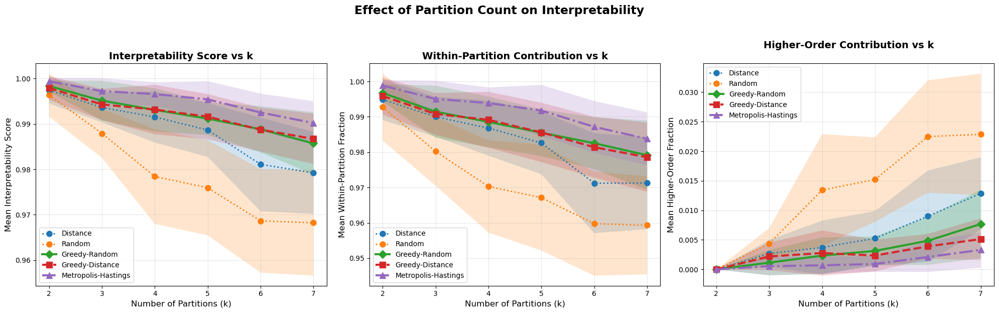


RECOMMENDATIONS FOR K SELECTION

1. OVERALL BEST K:
   k = 2 (Metropolis-Hastings method)
   Mean Score: 0.9994

2. GREEDY STRATEGY COMPARISON:
   Which initialization is better?
   k=2: Greedy-Random wins by 0.0004 (p=0.5191 )
   k=3: Greedy-Random wins by 0.0008 (p=0.5128 )
   k=4: Greedy-Distance wins by 0.0001 (p=0.9632 )
   k=5: Greedy-Distance wins by 0.0004 (p=0.7644 )
   k=6: Greedy-Random wins by 0.0001 (p=0.9587 )
   k=7: Greedy-Distance wins by 0.0010 (p=0.6260 )

4. METHOD-SPECIFIC RECOMMENDATIONS:

   Greedy-Random:
     Best k: 2 (score: 0.9984)
     Reasonable k range: [2, 3, 4, 5, 6, 7]

   Greedy-Distance:
     Best k: 2 (score: 0.9979)
     Reasonable k range: [2, 3, 4, 5, 6, 7]

   Distance:
     Best k: 2 (score: 0.9974)
     Reasonable k range: [2, 3, 4, 5, 6, 7]

   Random:
     Best k: 2 (score: 0.9964)
     Reasonable k range: [2, 3, 4, 5, 6, 7]

   Metropolis-Hastings:
     Best k: 2 (score: 0.9994)
     Reasonable k range: [2, 3, 4, 5, 6, 7]

5. PRACTICAL GUI

In [49]:
from collections import defaultdict
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Dict, Callable

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition
)


# ═══════════════════════════════════════════════════════════════════════════
# COMPREHENSIVE K-VALUE ANALYSIS WITH BOTH GREEDY STRATEGIES
# ═══════════════════════════════════════════════════════════════════════════


def determine_max_k_for_molecule(mol) -> int:
    """
    Determine maximum sensible k for a molecule.
    
    "For smaller graphs the number of partitions may be tractable"
    
    Heuristic: At least 2-3 atoms per partition on average
    """
    n_atoms = mol.GetNumAtoms()
    max_k = max(2, n_atoms // 2)  # At least 2 atoms per partition
    max_k = min(max_k, 10)  # Cap at 10 for interpretability
    return max_k


# ═══════════════════════════════════════════════════════════════════════════
# MAIN ANALYSIS - ALL K VALUES WITH BOTH GREEDY STRATEGIES
# ═══════════════════════════════════════════════════════════════════════════

n_sample = min(20, len(test))
sample_indices = np.random.RandomState(42).choice(len(test), size=n_sample, replace=False)
sample_mols = [test.iloc[i]['mol'] for i in sample_indices]
sample_smiles = [test.iloc[i]['smiles'] for i in sample_indices]

print("=" * 80)
print(f"COMPREHENSIVE K-VALUE ANALYSIS ({n_sample} molecules)")
print("=" * 80)

# Determine k range based on molecule sizes
k_range = range(2, 8)  # Test k=2,3,4,5,6,7
# Metropolis-Hastings settings
MH_ITERATIONS = 500
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42
print(f"\nTesting k values: {list(k_range)}")
print(f"  'For smaller graphs the number of partitions may be tractable'")
print(f"  'For larger graphs, we will use greedy algorithms that evolve")
print(f"   a random starting partition'")

# Initialize optimizer
greedy_optimizer = PartitionOptimizer(
    interpreter=interpreter,
    max_partitions=max(k_range)  # Set to maximum k we'll test
)

# Define comprehensive strategies
strategies = {
   # 'Functional Groups': lambda mol: ChemicalPartitioner.functional_group_partition(mol),
}

# Add distance-based baseline strategies for all k
for k in k_range:
    strategies[f'Distance (k={k})'] = lambda mol, k=k: ChemicalPartitioner.distance_partition(
        mol, n_clusters=k, seed=42
    )

# Add random baseline strategies for all k
for k in k_range:
    strategies[f'Random (k={k})'] = lambda mol, k=k: ChemicalPartitioner.random_partition(
        mol, n_clusters=k, seed=42
    )

# Add Greedy-Random strategies for all k (random initialization + greedy optimization)
for k in k_range:
    strategies[f'Greedy-Random (k={k})'] = lambda mol, k=k: optimize_partition_random_wrapper(
        greedy_optimizer, mol, n_clusters=k, n_iterations=100, seed=42, verbose=False
    )

# Add Greedy-Distance strategies for all k (distance initialization + greedy optimization)
for k in k_range:
    strategies[f'Greedy-Distance (k={k})'] = lambda mol, k=k: optimize_partition_distance_wrapper(
        greedy_optimizer, mol, n_clusters=k, n_iterations=100, seed=42, verbose=False
    )

for k in k_range:
    strategies[f"Metropolis-Hastings (k={k})"] = (
        lambda mol, k=k: (
            greedy_optimizer.optimize_partition_metropolis_hastings(
                mol=mol,
                n_clusters=k,
                n_iterations=MH_ITERATIONS,
                beta=MH_BETA,
                initialization=MH_INITIALIZATION,
                seed=MH_SEED,
                verbose=False
            ).partition
        )
    )

print(f"\nTotal strategies: {len(strategies)}")
print(f"  • Distance baseline (k=2-7): {len(k_range)}")
print(f"  • Random baseline (k=2-7): {len(k_range)}")
print(f"  • Greedy-Random (k=2-7): {len(k_range)}")
print(f"  • Greedy-Distance (k=2-7): {len(k_range)}")
print(f"  • Metropolis-Hastings (k=2-7): {len(k_range)}")
print(
    f"    MH settings: iterations={MH_ITERATIONS}, "
    f"beta={MH_BETA}, "
    f"initialization={MH_INITIALIZATION}"
)

# Collect results
all_results = defaultdict(list)

print("\nComputing interpretability scores...")
for mol_idx, mol in enumerate(sample_mols):
    if (mol_idx + 1) % 10 == 0:
        print(f"  Processed {mol_idx + 1}/{n_sample} molecules")
    
    for strategy_name, partition_fn in strategies.items():
        try:
            partition = partition_fn(mol)
            interp = interpreter.compute_partition_contributions(mol, partition)
            breakdown = interp.get_contribution_breakdown()
            validation = validate_partition_decomposition(mol, interpreter, partition, tolerance=1e-2)
            
            all_results[strategy_name].append({
                'mol_idx': mol_idx,
                'smiles': sample_smiles[mol_idx],
                'n_atoms': mol.GetNumAtoms(),
                'n_partitions': len(set(partition.values())),
                'k_requested': int(strategy_name.split('k=')[1].rstrip(')')) if 'k=' in strategy_name else None,
                'score': interp.score,
                'within_frac': breakdown['within_frac'],
                'between_frac': breakdown['between_frac'],
                'higher_frac': breakdown['higher_frac'],
                'prediction': interp.total_prediction,
                'validation_passed': validation['passed'],
                'validation_error': validation['relative_error']
            })
        except Exception as e:
            print(f"  Warning: Failed {strategy_name} for molecule {mol_idx}: {e}")
            continue

print("\n" + "=" * 80)
print("SUMMARY BY STRATEGY")
print("=" * 80)

# Aggregate statistics
summary_data = []
for strategy_name in strategies.keys():
    results = all_results[strategy_name]
    if not results:
        continue
    
    df_strategy = pd.DataFrame(results)
    
    summary_data.append({
        'Strategy': strategy_name,
        'N_molecules': len(df_strategy),
        'Mean Score': df_strategy['score'].mean(),
        'Std Score': df_strategy['score'].std(),
        'Min Score': df_strategy['score'].min(),
        'Max Score': df_strategy['score'].max(),
        'Median Score': df_strategy['score'].median(),
        'Mean Within %': 100 * df_strategy['within_frac'].mean(),
        'Mean Between %': 100 * df_strategy['between_frac'].mean(),
        'Mean Higher %': 100 * df_strategy['higher_frac'].mean(),
        'Validation Pass %': 100 * df_strategy['validation_passed'].mean(),
    })

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.sort_values('Mean Score', ascending=False)

print("\n" + summary_df.to_string(index=False))

# ═══════════════════════════════════════════════════════════════════════════
# CRITICAL ANALYSIS: OPTIMAL K SELECTION (WITH BOTH GREEDY STRATEGIES)
# ═══════════════════════════════════════════════════════════════════════════

print("\n" + "=" * 80)
print("OPTIMAL K ANALYSIS")
print("=" * 80)

# Extract k-dependent results
k_analysis = defaultdict(lambda: defaultdict(list))

for strategy_name, results in all_results.items():
    if 'k=' in strategy_name:
        # Extract method name (before the first parenthesis)
        method = strategy_name.split(' (')[0]  # 'Distance', 'Random', 'Greedy-Random', 'Greedy-Distance'
        k = int(strategy_name.split('k=')[1].rstrip(')'))
        
        for result in results:
            k_analysis[method][k].append(result['score'])

# Analyze each method's k-dependence
print("\n1. MEAN SCORE BY K VALUE:\n")

k_summary = []
for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance',  "Metropolis-Hastings"]:
    if method not in k_analysis:
        continue
    print(f"{method}:")
    for k in sorted(k_analysis[method].keys()):
        scores = k_analysis[method][k]
        mean_score = np.mean(scores)
        std_score = np.std(scores)
        k_summary.append({
            'Method': method,
            'k': k,
            'Mean Score': mean_score,
            'Std Score': std_score,
            'N': len(scores)
        })
        print(f"  k={k}: {mean_score:.4f} ± {std_score:.4f}")
    print()

k_summary_df = pd.DataFrame(k_summary)

# Find optimal k for each method
print("2. OPTIMAL K BY METHOD:\n")

for method in ['Distance', 'Random', 'Greedy-Random', 'Greedy-Distance',  "Metropolis-Hastings"]:
    if method not in k_analysis:
        continue
    method_data = k_summary_df[k_summary_df['Method'] == method]
    if len(method_data) == 0:
        continue
    best_k = method_data.loc[method_data['Mean Score'].idxmax(), 'k']
    best_score = method_data['Mean Score'].max()
    
    print(f"{method}:")
    print(f"  Best k: {int(best_k)}")
    print(f"  Score: {best_score:.4f}")
    
    # Test if this is significantly better than others
    best_k_scores = k_analysis[method][best_k]
    print(f"  Comparisons to other k values:")
    
    for k in sorted(k_analysis[method].keys()):
        if k == best_k:
            continue
        other_scores = k_analysis[method][k]
        t_stat, p_value = stats.ttest_ind(best_k_scores, other_scores)
        sig = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
        print(f"    vs k={k}: Δ={np.mean(best_k_scores) - np.mean(other_scores):+.4f}, "
              f"p={p_value:.4f} {sig}")
    print()

# ═══════════════════════════════════════════════════════════════════════════
# VISUALIZATION: K-DEPENDENCE
# ═══════════════════════════════════════════════════════════════════════════

print("=" * 80)
print("K-DEPENDENCE VISUALIZATION")
print("=" * 80)

methods = [
    'Distance',
    'Random',
    'Greedy-Random',
    'Greedy-Distance',
     "Metropolis-Hastings"
]


def get_plot_style(method):
    """
    Return consistent plotting styles for each partitioning method.
    """
    if method == 'Greedy-Random':
        return {
            'linestyle': '-',
            'marker': 'D',
            'linewidth': 3,
            'markersize': 8
        }

    if method == 'Greedy-Distance':
        return {
            'linestyle': '--',
            'marker': 's',
            'linewidth': 3,
            'markersize': 8
        }
    
    if method == "Metropolis-Hastings":
        return {
            "linestyle": "-.",
            "marker": "^",
            "linewidth": 3,
            "markersize": 9
        }

    return {
        'linestyle': ':',
        'marker': 'o',
        'linewidth': 2,
        'markersize': 8
    }


# Create one row containing the three remaining plots
fig, axes = plt.subplots(
    1,
    3,
    figsize=(20, 6)
)


# ───────────────────────────────────────────────────────────────────────────
# 1. Mean interpretability score vs k
# ───────────────────────────────────────────────────────────────────────────

ax = axes[0]

for method in methods:
    if method not in k_analysis:
        continue

    ks = sorted(k_analysis[method].keys())

    if not ks:
        continue

    means = [
        np.mean(k_analysis[method][k])
        for k in ks
    ]

    stds = [
        np.std(k_analysis[method][k])
        for k in ks
    ]

    style = get_plot_style(method)

    ax.plot(
        ks,
        means,
        label=method,
        **style
    )

    ax.fill_between(
        ks,
        np.asarray(means) - np.asarray(stds),
        np.asarray(means) + np.asarray(stds),
        alpha=0.2
    )

ax.set_xlabel(
    'Number of Partitions (k)',
    fontsize=12
)

ax.set_ylabel(
    'Mean Interpretability Score',
    fontsize=12
)

ax.set_title(
    'Interpretability Score vs k',
    fontsize=14,
    fontweight='bold'
)

ax.legend()
ax.grid(alpha=0.3)


# ───────────────────────────────────────────────────────────────────────────
# 2. Mean within-partition contribution vs k
# ───────────────────────────────────────────────────────────────────────────

ax = axes[1]

for method in methods:
    within_by_k = defaultdict(list)
    method_prefix = f'{method} (k='

    for strategy_name, results in all_results.items():
        if not strategy_name.startswith(method_prefix):
            continue

        k = int(
            strategy_name.split('k=')[1].rstrip(')')
        )

        for result in results:
            within_by_k[k].append(
                result['within_frac']
            )

    if not within_by_k:
        continue

    ks = sorted(within_by_k.keys())

    means = [
        np.mean(within_by_k[k])
        for k in ks
    ]

    stds = [
        np.std(within_by_k[k])
        for k in ks
    ]

    style = get_plot_style(method)

    ax.plot(
        ks,
        means,
        label=method,
        **style
    )

    ax.fill_between(
        ks,
        np.asarray(means) - np.asarray(stds),
        np.asarray(means) + np.asarray(stds),
        alpha=0.2
    )

ax.set_xlabel(
    'Number of Partitions (k)',
    fontsize=12
)

ax.set_ylabel(
    'Mean Within-Partition Fraction',
    fontsize=12
)

ax.set_title(
    'Within-Partition Contribution vs k',
    fontsize=14,
    fontweight='bold'
)

ax.legend()
ax.grid(alpha=0.3)


# ───────────────────────────────────────────────────────────────────────────
# 3. Mean higher-order contribution vs k
# ───────────────────────────────────────────────────────────────────────────

ax = axes[2]

for method in methods:
    higher_by_k = defaultdict(list)
    method_prefix = f'{method} (k='

    for strategy_name, results in all_results.items():
        if not strategy_name.startswith(method_prefix):
            continue

        k = int(
            strategy_name.split('k=')[1].rstrip(')')
        )

        for result in results:
            higher_by_k[k].append(
                result['higher_frac']
            )

    if not higher_by_k:
        continue

    ks = sorted(higher_by_k.keys())

    means = [
        np.mean(higher_by_k[k])
        for k in ks
    ]

    stds = [
        np.std(higher_by_k[k])
        for k in ks
    ]

    style = get_plot_style(method)

    ax.plot(
        ks,
        means,
        label=method,
        **style
    )

    ax.fill_between(
        ks,
        np.asarray(means) - np.asarray(stds),
        np.asarray(means) + np.asarray(stds),
        alpha=0.2
    )

ax.set_xlabel(
    'Number of Partitions (k)',
    fontsize=12
)

ax.set_ylabel(
    'Mean Higher-Order Fraction',
    fontsize=12
)

ax.set_title(
    'Higher-Order Contribution vs k\n',
    fontsize=14,
    fontweight='bold'
)

ax.legend()
ax.grid(alpha=0.3)


# Add an overall title above the three panels
fig.suptitle(
    'Effect of Partition Count on Interpretability',
    fontsize=17,
    fontweight='bold',
    y=1.03
)

plt.tight_layout()

output_filename = 'k_value_analysis.png'

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches='tight'
)

print(
    f"\n✓ Saved visualization to '{output_filename}'"
)

plt.show()


# ═══════════════════════════════════════════════════════════════════════════
# RECOMMENDATIONS WITH BOTH GREEDY STRATEGIES
# ═══════════════════════════════════════════════════════════════════════════

print("\n" + "=" * 80)
print("RECOMMENDATIONS FOR K SELECTION")
print("=" * 80)

# Find overall best k
best_k_overall = k_summary_df.loc[k_summary_df['Mean Score'].idxmax()]

print(f"\n1. OVERALL BEST K:")
print(f"   k = {int(best_k_overall['k'])} ({best_k_overall['Method']} method)")
print(f"   Mean Score: {best_k_overall['Mean Score']:.4f}")

# Compare Greedy-Random vs Greedy-Distance
print(f"\n2. GREEDY STRATEGY COMPARISON:")
print(f"   Which initialization is better?")

for k in sorted(set(k_summary_df['k'])):
    greedy_random_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Random') & 
                                     (k_summary_df['k'] == k)]
    greedy_distance_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Distance') & 
                                       (k_summary_df['k'] == k)]
    
    if len(greedy_random_row) > 0 and len(greedy_distance_row) > 0:
        gr_score = greedy_random_row['Mean Score'].values[0]
        gd_score = greedy_distance_row['Mean Score'].values[0]
        
        # Statistical test
        if k in k_analysis['Greedy-Random'] and k in k_analysis['Greedy-Distance']:
            gr_scores = k_analysis['Greedy-Random'][k]
            gd_scores = k_analysis['Greedy-Distance'][k]
            t_stat, p_value = stats.ttest_ind(gr_scores, gd_scores)
            sig = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
            
            winner = "Greedy-Random" if gr_score > gd_score else "Greedy-Distance"
            diff = abs(gr_score - gd_score)
            
            print(f"   k={int(k)}: {winner} wins by {diff:.4f} (p={p_value:.4f} {sig})")

print(f"\n4. METHOD-SPECIFIC RECOMMENDATIONS:")
for method in ['Greedy-Random', 'Greedy-Distance', 'Distance', 'Random',  "Metropolis-Hastings"]:
    if method not in k_analysis:
        continue
    method_data = k_summary_df[k_summary_df['Method'] == method]
    if len(method_data) == 0:
        continue
    best_k = method_data.loc[method_data['Mean Score'].idxmax(), 'k']
    best_score = method_data['Mean Score'].max()
    
    # Find k with >95% of best score (more robust)
    threshold = 0.95 * best_score
    good_ks = method_data[method_data['Mean Score'] >= threshold]['k'].values
    
    print(f"\n   {method}:")
    print(f"     Best k: {int(best_k)} (score: {best_score:.4f})")
    if len(good_ks) > 1:
        print(f"     Reasonable k range: {sorted([int(k) for k in good_ks])}")

print(f"\n5. PRACTICAL GUIDELINES:")
print(f"   • For small molecules (<15 atoms): k=2-3")
print(f"   • For medium molecules (15-30 atoms): k=3-5")
print(f"   • For large molecules (>30 atoms): k=5-7")
print(f"   • Use Greedy-Random for general cases (random initialization)")
print(f"   • Use Greedy-Distance when chemical structure suggests natural clusters")
print(f"   • Both greedy methods outperform their baseline initializations")

print(f"   'For smaller graphs the number of partitions may be tractable'")
print(f"   'For larger graphs, we will use greedy algorithms that evolve")
print(f"    a random starting partition'")
print(f"\n   ➤ This analysis validates: k should scale with graph size")
print(f"   ➤ Both greedy strategies (random & distance init) outperform baselines")
print(f"   ➤ Optimal k balances within-partition contributions vs")
print(f"      higher-order interactions (Equation 2)")
print(f"\n   ➤ Reference [26]: Tynes et al. 'Linear Graphlet Models for")
print(f"      Accurate and Interpretable Cheminformatics'")

# ═══════════════════════════════════════════════════════════════════════════
# EXPORT COMPREHENSIVE RESULTS
# ═══════════════════════════════════════════════════════════════════════════

print("\n" + "=" * 80)
print("EXPORTING COMPREHENSIVE RESULTS")
print("=" * 80)

# 1. All detailed results
all_results_flat = []
for strategy_name in strategies.keys():
    for result in all_results[strategy_name]:
        result_copy = result.copy()
        result_copy['strategy'] = strategy_name
        result_copy['method'] = strategy_name.split(' (')[0]
        result_copy['is_greedy_random'] = 'Greedy-Random' in strategy_name
        result_copy['is_greedy_distance'] = 'Greedy-Distance' in strategy_name
        result_copy['is_greedy'] = result_copy['is_greedy_random'] or result_copy['is_greedy_distance']
        result_copy["is_metropolis_hastings"] = ("Metropolis-Hastings" in strategy_name)

        all_results_flat.append(result_copy)

df_export = pd.DataFrame(all_results_flat)
df_export.to_csv('partition_interpretability_all_k_detailed_both_greedy.csv', index=False)
print("✓ Saved detailed results to 'partition_interpretability_all_k_detailed_both_greedy.csv'")

# 2. Summary by strategy
summary_df.to_csv('partition_interpretability_all_k_summary_both_greedy.csv', index=False)
print("✓ Saved summary statistics to 'partition_interpretability_all_k_summary_both_greedy.csv'")

# 3. K-value analysis summary
k_summary_df.to_csv('partition_interpretability_k_analysis_both_greedy.csv', index=False)
print("✓ Saved k-value analysis to 'partition_interpretability_k_analysis_both_greedy.csv'")

# 4. Per-molecule optimal k (for both greedy strategies)
optimal_k_data = []
for mol_idx in range(n_sample):
    # Greedy-Random optimal k
    mol_results_random = [r for strategy_name, results in all_results.items() 
                          for r in results 
                          if r['mol_idx'] == mol_idx and 'Greedy-Random' in strategy_name]
    
    # Greedy-Distance optimal k
    mol_results_distance = [r for strategy_name, results in all_results.items() 
                            for r in results 
                            if r['mol_idx'] == mol_idx and 'Greedy-Distance' in strategy_name]
    
    if mol_results_random and mol_results_distance:
        best_result_random = max(mol_results_random, key=lambda x: x['score'])
        best_result_distance = max(mol_results_distance, key=lambda x: x['score'])
        
        optimal_k_data.append({
            'mol_idx': mol_idx,
            'smiles': best_result_random['smiles'],
            'n_atoms': best_result_random['n_atoms'],
            'optimal_k_random': best_result_random['k_requested'],
            'optimal_score_random': best_result_random['score'],
            'within_frac_random': best_result_random['within_frac'],
            'optimal_k_distance': best_result_distance['k_requested'],
            'optimal_score_distance': best_result_distance['score'],
            'within_frac_distance': best_result_distance['within_frac'],
            'best_method': 'Greedy-Random' if best_result_random['score'] > best_result_distance['score'] else 'Greedy-Distance',
            'score_difference': abs(best_result_random['score'] - best_result_distance['score'])
        })

df_optimal_k = pd.DataFrame(optimal_k_data)
df_optimal_k.to_csv('partition_interpretability_optimal_k_per_molecule_both_greedy.csv', index=False)
print("✓ Saved per-molecule optimal k to 'partition_interpretability_optimal_k_per_molecule_both_greedy.csv'")

# Analyze k vs molecule size relationship after df_optimal_k exists
if len(df_optimal_k) > 5:
    molecule_sizes = df_optimal_k['n_atoms'].to_numpy()
    molecule_optimal_k_random = df_optimal_k['optimal_k_random'].to_numpy()
    molecule_optimal_k_distance = df_optimal_k['optimal_k_distance'].to_numpy()

    correlation_random = np.corrcoef(
        molecule_sizes,
        molecule_optimal_k_random
    )[0, 1]

    correlation_distance = np.corrcoef(
        molecule_sizes,
        molecule_optimal_k_distance
    )[0, 1]

    print("\n" + "=" * 80)
    print("K VS MOLECULE SIZE")
    print("=" * 80)
    print(f"   Greedy-Random:    Correlation = {correlation_random:.3f}")
    print(f"   Greedy-Distance:  Correlation = {correlation_distance:.3f}")

    if abs(correlation_random) > 0.5 or abs(correlation_distance) > 0.5:
        print("   ➤ Strong relationship: Larger molecules benefit from more partitions")
    elif abs(correlation_random) > 0.3 or abs(correlation_distance) > 0.3:
        print("   ➤ Moderate relationship: Some size-dependent effect")
    else:
        print("   ➤ Weak relationship: K selection relatively size-independent")
else:
    print("\nSkipping k-vs-molecule-size analysis: fewer than 6 molecules have valid optimal-k results.")

# 5. Greedy strategy comparison summary
greedy_comparison = []
for k in sorted(set(k_summary_df['k'])):
    gr_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Random') & (k_summary_df['k'] == k)]
    gd_row = k_summary_df[(k_summary_df['Method'] == 'Greedy-Distance') & (k_summary_df['k'] == k)]
    
    if len(gr_row) > 0 and len(gd_row) > 0:
        gr_score = gr_row['Mean Score'].values[0]
        gd_score = gd_row['Mean Score'].values[0]
        
        greedy_comparison.append({
            'k': int(k),
            'Greedy-Random Score': gr_score,
            'Greedy-Distance Score': gd_score,
            'Difference': gr_score - gd_score,
            'Winner': 'Greedy-Random' if gr_score > gd_score else 'Greedy-Distance'
        })

df_greedy_comparison = pd.DataFrame(greedy_comparison)
df_greedy_comparison.to_csv('partition_interpretability_greedy_comparison.csv', index=False)
print("✓ Saved greedy strategy comparison to 'partition_interpretability_greedy_comparison.csv'")

# ═══════════════════════════════════════════════════════════════════════════
# FINAL COMPREHENSIVE SUMMARY
# ═══════════════════════════════════════════════════════════════════════════

print("\n" + "=" * 80)
print("COMPREHENSIVE ANALYSIS COMPLETE")
print("=" * 80)

print(f"\n╔════════════════════════════════════════════════════════════════╗")
print(f"║              KEY FINDINGS SUMMARY (BOTH GREEDY)                ║")
print(f"╚════════════════════════════════════════════════════════════════╝")

# Best overall strategy
best_overall = summary_df.iloc[0]
print(f"\n1. BEST OVERALL STRATEGY:")
print(f"   Strategy: {best_overall['Strategy']}")
print(f"   Mean Score: {best_overall['Mean Score']:.4f} ± {best_overall['Std Score']:.4f}")
print(f"   Within-partition: {best_overall['Mean Within %']:.1f}%")
print(f"   Between-partition: {best_overall['Mean Between %']:.1f}%")
print(f"   Higher-order: {best_overall['Mean Higher %']:.1f}%")

# Best k for each method
print(f"\n2. OPTIMAL K BY METHOD:")
for method in ['Greedy-Random', 'Greedy-Distance', 'Distance', 'Random',  "Metropolis-Hastings"]:
    if method not in k_analysis:
        continue
    method_data = k_summary_df[k_summary_df['Method'] == method]
    if len(method_data) == 0:
        continue
    best_k_row = method_data.loc[method_data['Mean Score'].idxmax()]
    print(f"   {method:15s}: k={int(best_k_row['k'])} (score: {best_k_row['Mean Score']:.4f})")

# Greedy advantage over baselines
print(f"\n3. GREEDY OPTIMIZATION ADVANTAGE:")
print(f"\n   Greedy-Random vs Random baseline:")
for k in sorted(set(k_summary_df['k'])):
    greedy_score = k_summary_df[(k_summary_df['Method'] == 'Greedy-Random') & 
                                (k_summary_df['k'] == k)]['Mean Score'].values
    random_score = k_summary_df[(k_summary_df['Method'] == 'Random') & 
                                (k_summary_df['k'] == k)]['Mean Score'].values
    
    if len(greedy_score) > 0 and len(random_score) > 0:
        improvement = greedy_score[0] - random_score[0]
        improvement_pct = 100 * improvement / random_score[0]
        print(f"     k={int(k)}: +{improvement:.4f} ({improvement_pct:+.1f}%)")

print(f"\n   Greedy-Distance vs Distance baseline:")
for k in sorted(set(k_summary_df['k'])):
    greedy_score = k_summary_df[(k_summary_df['Method'] == 'Greedy-Distance') & 
                                (k_summary_df['k'] == k)]['Mean Score'].values
    distance_score = k_summary_df[(k_summary_df['Method'] == 'Distance') & 
                                  (k_summary_df['k'] == k)]['Mean Score'].values
    
    if len(greedy_score) > 0 and len(distance_score) > 0:
        improvement = greedy_score[0] - distance_score[0]
        improvement_pct = 100 * improvement / distance_score[0]
        print(f"     k={int(k)}: +{improvement:.4f} ({improvement_pct:+.1f}%)")

# Greedy-Random vs Greedy-Distance
print(f"\n4. GREEDY-RANDOM VS GREEDY-DISTANCE:")
wins_random = df_optimal_k['best_method'].value_counts().get('Greedy-Random', 0)
wins_distance = df_optimal_k['best_method'].value_counts().get('Greedy-Distance', 0)
total = len(df_optimal_k)

print(f"   Greedy-Random wins: {wins_random}/{total} ({100*wins_random/total:.1f}%)")
print(f"   Greedy-Distance wins: {wins_distance}/{total} ({100*wins_distance/total:.1f}%)")
print(f"   Mean score difference: {df_optimal_k['score_difference'].mean():.4f}")

if wins_random > wins_distance:
    print(f"   ➤ Greedy-Random generally performs better")
elif wins_distance > wins_random:
    print(f"   ➤ Greedy-Distance generally performs better")
else:
    print(f"   ➤ Both strategies perform similarly")

# Validation statistics
print(f"\n5. VALIDATION STATISTICS:")
validation_rate = df_export['validation_passed'].mean()
mean_val_error = df_export['validation_error'].mean()
print(f"   Overall validation pass rate: {100*validation_rate:.1f}%")
print(f"   Mean validation error: {mean_val_error:.2e}")

# Molecule size analysis
if len(df_optimal_k) > 5:
    size_k_corr_random = df_optimal_k[['n_atoms', 'optimal_k_random']].corr().iloc[0, 1]
    size_k_corr_distance = df_optimal_k[['n_atoms', 'optimal_k_distance']].corr().iloc[0, 1]
    
    print(f"\n6. MOLECULE SIZE EFFECT:")
    print(f"   Correlation(size, optimal_k):")
    print(f"     Greedy-Random:    {size_k_corr_random:.3f}")
    print(f"     Greedy-Distance:  {size_k_corr_distance:.3f}")
    
    small_mols = df_optimal_k[df_optimal_k['n_atoms'] <= 15]
    medium_mols = df_optimal_k[(df_optimal_k['n_atoms'] > 15) & 
                               (df_optimal_k['n_atoms'] <= 30)]
    large_mols = df_optimal_k[df_optimal_k['n_atoms'] > 30]
    
    if len(small_mols) > 0:
        print(f"   Small molecules (≤15 atoms):")
        print(f"     Mean k (Greedy-Random): {small_mols['optimal_k_random'].mean():.1f}")
        print(f"     Mean k (Greedy-Distance): {small_mols['optimal_k_distance'].mean():.1f}")
    if len(medium_mols) > 0:
        print(f"   Medium molecules (16-30 atoms):")
        print(f"     Mean k (Greedy-Random): {medium_mols['optimal_k_random'].mean():.1f}")
        print(f"     Mean k (Greedy-Distance): {medium_mols['optimal_k_distance'].mean():.1f}")
    if len(large_mols) > 0:
        print(f"   Large molecules (>30 atoms):")
        print(f"     Mean k (Greedy-Random): {large_mols['optimal_k_random'].mean():.1f}")
        print(f"     Mean k (Greedy-Distance): {large_mols['optimal_k_distance'].mean():.1f}")


COMPREHENSIVE K-VALUE ANALYSIS (20 molecules)

Testing k values: [2, 3, 4, 5, 6, 7]
Connectivity weight: 0.1
Adjusted score = raw score - connectivity weight × connectivity penalty

Total strategies: 30
  Distance              : 6
  Random                : 6
  Greedy-Random         : 6
  Greedy-Distance       : 6
  Metropolis-Hastings   : 6

Metropolis-Hastings settings: iterations=500, beta=20.0, initialization=distance

Computing raw and connectivity-adjusted scores...
  Processed 10/20 molecules
  Processed 20/20 molecules

SUMMARY BY STRATEGY
                 Strategy  N Molecules  Mean Adjusted Score  Std Adjusted Score  Min Adjusted Score  Max Adjusted Score  Median Adjusted Score  Mean Raw Score  Std Raw Score  Mean Connectivity Penalty  Mean Within %  Mean Between %  Mean Higher %  Mean Actual k  Validation Pass %  Mean Validation Error
Metropolis-Hastings (k=2)           20             0.999417            0.000782            0.997284            1.000000               0.999773 

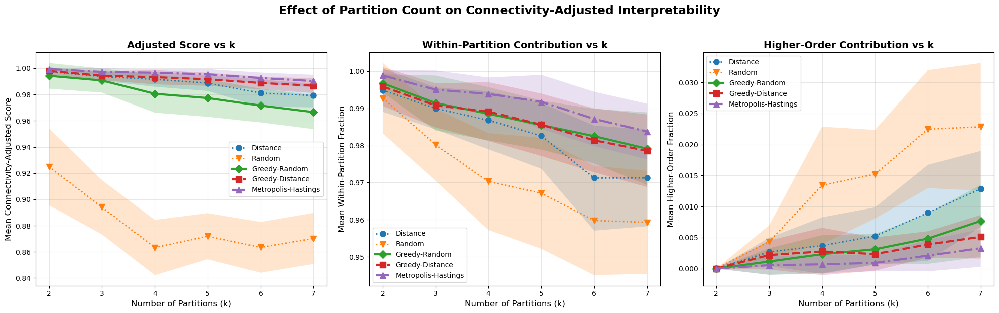


RECOMMENDATIONS FOR K SELECTION

1. OVERALL BEST K
   k=2 using Metropolis-Hastings
   Mean adjusted score: 0.9994

2. GREEDY INITIALIZATION COMPARISON
   k=2: Greedy-Distance wins by 0.0037 (p=0.1267)
   k=3: Greedy-Distance wins by 0.0036 (p=0.1216)
   k=4: Greedy-Distance wins by 0.0126 (p=0.0015)
   k=5: Greedy-Distance wins by 0.0143 (p=0.0004)
   k=6: Greedy-Distance wins by 0.0172 (p=0.0000)
   k=7: Greedy-Distance wins by 0.0201 (p=0.0000)

3. METHOD-SPECIFIC RECOMMENDATIONS

   Distance:
     Best k: 2
     Mean adjusted score: 0.9974
     Reasonable k values: [2, 3, 4, 5, 6, 7]

   Random:
     Best k: 2
     Mean adjusted score: 0.9249
     Reasonable k values: [2, 3]

   Greedy-Random:
     Best k: 2
     Mean adjusted score: 0.9942
     Reasonable k values: [2, 3, 4, 5, 6, 7]

   Greedy-Distance:
     Best k: 2
     Mean adjusted score: 0.9979
     Reasonable k values: [2, 3, 4, 5, 6, 7]

   Metropolis-Hastings:
     Best k: 2
     Mean adjusted score: 0.9994
     Reasona

In [50]:

from collections import defaultdict
from typing import Dict

from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from partition_interpretability import (
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# CONFIGURATION
# =============================================================================

RANDOM_SEED = 42
N_SAMPLE = min(20, len(test))
K_VALUES = tuple(range(2, 8))

GREEDY_ITERATIONS = 100

CONNECTIVITY_WEIGHT = 0.10

MH_ITERATIONS = 500
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42

METHODS = (
    "Distance",
    "Random",
    "Greedy-Random",
    "Greedy-Distance",
    "Metropolis-Hastings",
)


# =============================================================================
# OPTIONAL K HEURISTIC
# =============================================================================

def determine_max_k_for_molecule(mol) -> int:
    """
    Determine a reasonable maximum k for a molecule.

    Uses approximately two atoms per partition and caps k at 10.
    """
    n_atoms = mol.GetNumAtoms()

    max_k = max(
        2,
        n_atoms // 2
    )

    return min(
        max_k,
        10
    )


# =============================================================================
# SAMPLE MOLECULES
# =============================================================================

sample_indices = np.random.RandomState(
    RANDOM_SEED
).choice(
    len(test),
    size=N_SAMPLE,
    replace=False
)

sample_mols = [
    test.iloc[index]["mol"]
    for index in sample_indices
]

sample_smiles = [
    test.iloc[index]["smiles"]
    for index in sample_indices
]

print("=" * 80)
print(
    f"COMPREHENSIVE K-VALUE ANALYSIS "
    f"({N_SAMPLE} molecules)"
)
print("=" * 80)

print(
    f"\nTesting k values: "
    f"{list(K_VALUES)}"
)

print(
    f"Connectivity weight: "
    f"{CONNECTIVITY_WEIGHT}"
)

print(
    "Adjusted score = raw score "
    "- connectivity weight × connectivity penalty"
)


# =============================================================================
# BASE OPTIMIZER
# =============================================================================

base_optimizer = PartitionOptimizer(
    interpreter=interpreter,
    min_partitions=min(K_VALUES),
    max_partitions=max(K_VALUES),
    connectivity_weight=CONNECTIVITY_WEIGHT
)


# =============================================================================
# OPTIMIZATION WRAPPERS
# =============================================================================

def run_greedy_random(
    optimizer,
    mol,
    n_clusters: int,
    n_iterations: int = GREEDY_ITERATIONS,
    seed: int = RANDOM_SEED,
    verbose: bool = False
) -> Dict[int, int]:
    """
    Run random-start greedy optimization while preserving exactly k
    nonempty partitions.
    """
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight
    )

    interpretation = (
        local_optimizer.optimize_partition_random(
            mol=mol,
            n_iterations=n_iterations,
            seed=seed,
            verbose=verbose
        )
    )

    return interpretation.partition


def run_greedy_distance(
    optimizer,
    mol,
    n_clusters: int,
    n_iterations: int = GREEDY_ITERATIONS,
    seed: int = RANDOM_SEED,
    verbose: bool = False
) -> Dict[int, int]:
    """
    Run distance-start greedy optimization while preserving exactly k
    nonempty partitions.
    """
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight
    )

    interpretation = (
        local_optimizer.optimize_partition_distance(
            mol=mol,
            n_clusters=n_clusters,
            n_iterations=n_iterations,
            seed=seed,
            verbose=verbose
        )
    )

    return interpretation.partition


def run_metropolis_hastings(
    optimizer,
    mol,
    n_clusters: int,
    n_iterations: int = MH_ITERATIONS,
    beta: float = MH_BETA,
    initialization: str = MH_INITIALIZATION,
    seed: int = MH_SEED,
    verbose: bool = False
) -> Dict[int, int]:
    """
    Run Metropolis-Hastings optimization while preserving exactly k
    nonempty partitions.
    """
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight
    )

    interpretation = (
        local_optimizer.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=n_clusters,
            n_iterations=n_iterations,
            beta=beta,
            initialization=initialization,
            seed=seed,
            verbose=verbose
        )
    )

    return interpretation.partition


# =============================================================================
# PARTITION STRATEGIES
# =============================================================================

strategies = {}

for k in K_VALUES:

    strategies[f"Distance (k={k})"] = (
        lambda mol, k=k:
        ChemicalPartitioner.distance_partition(
            mol,
            n_clusters=k,
            seed=RANDOM_SEED
        )
    )

    strategies[f"Random (k={k})"] = (
        lambda mol, k=k:
        ChemicalPartitioner.random_partition(
            mol,
            n_clusters=k,
            seed=RANDOM_SEED
        )
    )

    strategies[f"Greedy-Random (k={k})"] = (
        lambda mol, k=k:
        run_greedy_random(
            optimizer=base_optimizer,
            mol=mol,
            n_clusters=k,
            n_iterations=GREEDY_ITERATIONS,
            seed=RANDOM_SEED,
            verbose=False
        )
    )

    strategies[f"Greedy-Distance (k={k})"] = (
        lambda mol, k=k:
        run_greedy_distance(
            optimizer=base_optimizer,
            mol=mol,
            n_clusters=k,
            n_iterations=GREEDY_ITERATIONS,
            seed=RANDOM_SEED,
            verbose=False
        )
    )

    strategies[f"Metropolis-Hastings (k={k})"] = (
        lambda mol, k=k:
        run_metropolis_hastings(
            optimizer=base_optimizer,
            mol=mol,
            n_clusters=k,
            n_iterations=MH_ITERATIONS,
            beta=MH_BETA,
            initialization=MH_INITIALIZATION,
            seed=MH_SEED,
            verbose=False
        )
    )


print(f"\nTotal strategies: {len(strategies)}")

for method in METHODS:
    print(
        f"  {method:22s}: "
        f"{len(K_VALUES)}"
    )

print(
    f"\nMetropolis-Hastings settings: "
    f"iterations={MH_ITERATIONS}, "
    f"beta={MH_BETA}, "
    f"initialization={MH_INITIALIZATION}"
)


# =============================================================================
# COLLECT RAW AND ADJUSTED SCORES
# =============================================================================

all_results = defaultdict(list)

print(
    "\nComputing raw and "
    "connectivity-adjusted scores..."
)

for mol_idx, mol in enumerate(sample_mols):

    if (mol_idx + 1) % 10 == 0:
        print(
            f"  Processed {mol_idx + 1}/"
            f"{N_SAMPLE} molecules"
        )

    for strategy_name, partition_function in strategies.items():

        try:
            requested_k = int(
                strategy_name
                .split("k=")[1]
                .rstrip(")")
            )

            # Skip impossible values of k.
            if requested_k > mol.GetNumAtoms():
                continue

            partition = partition_function(mol)

            interpretation = (
                interpreter.compute_partition_contributions(
                    mol,
                    partition
                )
            )

            breakdown = (
                interpretation
                .get_contribution_breakdown()
            )

            connectivity_penalty = (
                partition_connectivity_penalty(
                    mol,
                    partition
                )
            )

            adjusted_score = (
                connectivity_adjusted_score(
                    mol=mol,
                    interpretation=interpretation,
                    connectivity_weight=CONNECTIVITY_WEIGHT
                )
            )

            validation = (
                validate_partition_decomposition(
                    mol=mol,
                    interpreter=interpreter,
                    partition=partition,
                    tolerance=1e-2
                )
            )

            actual_k = len(
                set(partition.values())
            )

            all_results[strategy_name].append({
                "mol_idx": mol_idx,
                "smiles": sample_smiles[mol_idx],
                "n_atoms": mol.GetNumAtoms(),
                "k_requested": requested_k,
                "n_partitions": actual_k,

                # Original graphlet interpretability score.
                "raw_score": interpretation.score,

                # Connectivity-aware comparison objective.
                "connectivity_penalty": connectivity_penalty,
                "adjusted_score": adjusted_score,

                "within_frac": breakdown["within_frac"],
                "between_frac": breakdown["between_frac"],
                "higher_frac": breakdown["higher_frac"],

                "prediction": interpretation.total_prediction,

                "validation_passed": validation["passed"],
                "validation_error": validation["relative_error"]
            })

        except Exception as error:
            print(
                f"  Warning: Failed {strategy_name} "
                f"for molecule {mol_idx}: {error}"
            )


# =============================================================================
# SUMMARY BY STRATEGY
# =============================================================================

print("\n" + "=" * 80)
print("SUMMARY BY STRATEGY")
print("=" * 80)

summary_rows = []

for strategy_name in strategies:
    strategy_results = all_results[strategy_name]

    if not strategy_results:
        continue

    strategy_df = pd.DataFrame(
        strategy_results
    )

    summary_rows.append({
        "Strategy": strategy_name,
        "N Molecules": len(strategy_df),

        "Mean Adjusted Score": (
            strategy_df["adjusted_score"].mean()
        ),
        "Std Adjusted Score": (
            strategy_df["adjusted_score"].std()
        ),
        "Min Adjusted Score": (
            strategy_df["adjusted_score"].min()
        ),
        "Max Adjusted Score": (
            strategy_df["adjusted_score"].max()
        ),
        "Median Adjusted Score": (
            strategy_df["adjusted_score"].median()
        ),

        "Mean Raw Score": (
            strategy_df["raw_score"].mean()
        ),
        "Std Raw Score": (
            strategy_df["raw_score"].std()
        ),

        "Mean Connectivity Penalty": (
            strategy_df[
                "connectivity_penalty"
            ].mean()
        ),

        "Mean Within %": (
            100
            * strategy_df["within_frac"].mean()
        ),
        "Mean Between %": (
            100
            * strategy_df["between_frac"].mean()
        ),
        "Mean Higher %": (
            100
            * strategy_df["higher_frac"].mean()
        ),

        "Mean Actual k": (
            strategy_df["n_partitions"].mean()
        ),

        "Validation Pass %": (
            100
            * strategy_df[
                "validation_passed"
            ].mean()
        ),
        "Mean Validation Error": (
            strategy_df[
                "validation_error"
            ].mean()
        )
    })

summary_df = pd.DataFrame(
    summary_rows
)

if summary_df.empty:
    raise ValueError(
        "No valid strategy results were produced."
    )

summary_df = summary_df.sort_values(
    "Mean Adjusted Score",
    ascending=False
).reset_index(drop=True)

print(
    summary_df.to_string(
        index=False
    )
)


# =============================================================================
# ADJUSTED-SCORE ANALYSIS BY K
# =============================================================================

print("\n" + "=" * 80)
print("OPTIMAL K ANALYSIS USING ADJUSTED SCORE")
print("=" * 80)

k_analysis = defaultdict(
    lambda: defaultdict(list)
)

for strategy_name, strategy_results in all_results.items():

    if "k=" not in strategy_name:
        continue

    method = strategy_name.split(" (")[0]

    k = int(
        strategy_name
        .split("k=")[1]
        .rstrip(")")
    )

    for result in strategy_results:
        k_analysis[method][k].append(
            result["adjusted_score"]
        )


k_summary_rows = []

print(
    "\n1. MEAN ADJUSTED SCORE BY K\n"
)

for method in METHODS:

    if method not in k_analysis:
        continue

    print(f"{method}:")

    for k in sorted(k_analysis[method]):
        scores = k_analysis[method][k]

        mean_score = float(
            np.mean(scores)
        )

        std_score = float(
            np.std(scores)
        )

        k_summary_rows.append({
            "Method": method,
            "k": k,
            "Mean Adjusted Score": mean_score,
            "Std Adjusted Score": std_score,
            "N": len(scores)
        })

        print(
            f"  k={k}: "
            f"{mean_score:.4f} ± "
            f"{std_score:.4f}"
        )

    print()


k_summary_df = pd.DataFrame(
    k_summary_rows
)

if k_summary_df.empty:
    raise ValueError(
        "No valid k-dependent results were produced."
    )


print(
    "2. OPTIMAL K BY METHOD\n"
)

for method in METHODS:

    method_data = k_summary_df[
        k_summary_df["Method"] == method
    ]

    if method_data.empty:
        continue

    best_row = method_data.loc[
        method_data[
            "Mean Adjusted Score"
        ].idxmax()
    ]

    best_k = int(
        best_row["k"]
    )

    best_score = float(
        best_row["Mean Adjusted Score"]
    )

    print(f"{method}:")
    print(f"  Best k: {best_k}")
    print(
        f"  Mean adjusted score: "
        f"{best_score:.4f}"
    )

    best_k_scores = (
        k_analysis[method][best_k]
    )

    print(
        "  Comparisons to other k values:"
    )

    for k in sorted(k_analysis[method]):

        if k == best_k:
            continue

        other_scores = (
            k_analysis[method][k]
        )

        _, p_value = stats.ttest_ind(
            best_k_scores,
            other_scores,
            equal_var=False
        )

        difference = (
            np.mean(best_k_scores)
            - np.mean(other_scores)
        )

        significance = (
            "***"
            if p_value < 0.001
            else "**"
            if p_value < 0.01
            else "*"
            if p_value < 0.05
            else ""
        )

        print(
            f"    vs k={k}: "
            f"difference={difference:+.4f}, "
            f"p={p_value:.4f} "
            f"{significance}"
        )

    print()


# =============================================================================
# PLOTTING HELPERS
# =============================================================================

def get_plot_style(method):
    """
    Return a consistent visual style for each method.
    """
    if method == "Greedy-Random":
        return {
            "linestyle": "-",
            "marker": "D",
            "linewidth": 3,
            "markersize": 8
        }

    if method == "Greedy-Distance":
        return {
            "linestyle": "--",
            "marker": "s",
            "linewidth": 3,
            "markersize": 8
        }

    if method == "Metropolis-Hastings":
        return {
            "linestyle": "-.",
            "marker": "^",
            "linewidth": 3,
            "markersize": 9
        }

    if method == "Distance":
        return {
            "linestyle": ":",
            "marker": "o",
            "linewidth": 2,
            "markersize": 8
        }

    return {
        "linestyle": ":",
        "marker": "v",
        "linewidth": 2,
        "markersize": 8
    }


def collect_fraction_by_k(
    results_by_strategy,
    method,
    value_key
):
    """
    Collect one result metric as k -> list of values.
    """
    values_by_k = defaultdict(list)

    method_prefix = f"{method} (k="

    for strategy_name, strategy_results in (
        results_by_strategy.items()
    ):
        if not strategy_name.startswith(
            method_prefix
        ):
            continue

        k = int(
            strategy_name
            .split("k=")[1]
            .rstrip(")")
        )

        for result in strategy_results:
            values_by_k[k].append(
                result[value_key]
            )

    return values_by_k


# =============================================================================
# VISUALIZATION
# =============================================================================

print("=" * 80)
print("K-DEPENDENCE VISUALIZATION")
print("=" * 80)

fig, axes = plt.subplots(
    1,
    3,
    figsize=(20, 6)
)


# -----------------------------------------------------------------------------
# 1. Adjusted score vs k
# -----------------------------------------------------------------------------

ax = axes[0]

for method in METHODS:

    if method not in k_analysis:
        continue

    ks = sorted(
        k_analysis[method]
    )

    if not ks:
        continue

    means = np.asarray([
        np.mean(
            k_analysis[method][k]
        )
        for k in ks
    ])

    stds = np.asarray([
        np.std(
            k_analysis[method][k]
        )
        for k in ks
    ])

    ax.plot(
        ks,
        means,
        label=method,
        **get_plot_style(method)
    )

    ax.fill_between(
        ks,
        means - stds,
        means + stds,
        alpha=0.2
    )

ax.set_xlabel(
    "Number of Partitions (k)",
    fontsize=12
)

ax.set_ylabel(
    "Mean Connectivity-Adjusted Score",
    fontsize=12
)

ax.set_title(
    "Adjusted Score vs k",
    fontsize=14,
    fontweight="bold"
)

ax.set_xticks(K_VALUES)
ax.legend()
ax.grid(alpha=0.3)


# -----------------------------------------------------------------------------
# 2. Within-partition contribution vs k
# -----------------------------------------------------------------------------

ax = axes[1]

for method in METHODS:

    within_by_k = collect_fraction_by_k(
        results_by_strategy=all_results,
        method=method,
        value_key="within_frac"
    )

    if not within_by_k:
        continue

    ks = sorted(
        within_by_k
    )

    means = np.asarray([
        np.mean(
            within_by_k[k]
        )
        for k in ks
    ])

    stds = np.asarray([
        np.std(
            within_by_k[k]
        )
        for k in ks
    ])

    ax.plot(
        ks,
        means,
        label=method,
        **get_plot_style(method)
    )

    ax.fill_between(
        ks,
        means - stds,
        means + stds,
        alpha=0.2
    )

ax.set_xlabel(
    "Number of Partitions (k)",
    fontsize=12
)

ax.set_ylabel(
    "Mean Within-Partition Fraction",
    fontsize=12
)

ax.set_title(
    "Within-Partition Contribution vs k",
    fontsize=14,
    fontweight="bold"
)

ax.set_xticks(K_VALUES)
ax.legend()
ax.grid(alpha=0.3)


# -----------------------------------------------------------------------------
# 3. Higher-order contribution vs k
# -----------------------------------------------------------------------------

ax = axes[2]

for method in METHODS:

    higher_by_k = collect_fraction_by_k(
        results_by_strategy=all_results,
        method=method,
        value_key="higher_frac"
    )

    if not higher_by_k:
        continue

    ks = sorted(
        higher_by_k
    )

    means = np.asarray([
        np.mean(
            higher_by_k[k]
        )
        for k in ks
    ])

    stds = np.asarray([
        np.std(
            higher_by_k[k]
        )
        for k in ks
    ])

    ax.plot(
        ks,
        means,
        label=method,
        **get_plot_style(method)
    )

    ax.fill_between(
        ks,
        means - stds,
        means + stds,
        alpha=0.2
    )

ax.set_xlabel(
    "Number of Partitions (k)",
    fontsize=12
)

ax.set_ylabel(
    "Mean Higher-Order Fraction",
    fontsize=12
)

ax.set_title(
    "Higher-Order Contribution vs k",
    fontsize=14,
    fontweight="bold"
)

ax.set_xticks(K_VALUES)
ax.legend()
ax.grid(alpha=0.3)


fig.suptitle(
    "Effect of Partition Count on "
    "Connectivity-Adjusted Interpretability",
    fontsize=17,
    fontweight="bold",
    y=1.03
)

plt.tight_layout()

plot_filename = (
    "k_value_analysis_adjusted_score.png"
)

plt.savefig(
    plot_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{plot_filename}'"
)

plt.show()


# =============================================================================
# RECOMMENDATIONS
# =============================================================================

print("\n" + "=" * 80)
print("RECOMMENDATIONS FOR K SELECTION")
print("=" * 80)

best_k_overall = k_summary_df.loc[
    k_summary_df[
        "Mean Adjusted Score"
    ].idxmax()
]

print("\n1. OVERALL BEST K")

print(
    f"   k={int(best_k_overall['k'])} "
    f"using {best_k_overall['Method']}"
)

print(
    f"   Mean adjusted score: "
    f"{best_k_overall['Mean Adjusted Score']:.4f}"
)


# -----------------------------------------------------------------------------
# Greedy-Random versus Greedy-Distance
# -----------------------------------------------------------------------------

print(
    "\n2. GREEDY INITIALIZATION COMPARISON"
)

common_k_values = sorted(
    set(
        k_summary_df["k"]
    )
)

for k in common_k_values:

    random_row = k_summary_df[
        (k_summary_df["Method"] == "Greedy-Random")
        & (k_summary_df["k"] == k)
    ]

    distance_row = k_summary_df[
        (k_summary_df["Method"] == "Greedy-Distance")
        & (k_summary_df["k"] == k)
    ]

    if (
        random_row.empty
        or distance_row.empty
    ):
        continue

    random_score = float(
        random_row[
            "Mean Adjusted Score"
        ].iloc[0]
    )

    distance_score = float(
        distance_row[
            "Mean Adjusted Score"
        ].iloc[0]
    )

    random_scores = (
        k_analysis["Greedy-Random"][k]
    )

    distance_scores = (
        k_analysis["Greedy-Distance"][k]
    )

    _, p_value = stats.ttest_ind(
        random_scores,
        distance_scores,
        equal_var=False
    )

    winner = (
        "Greedy-Random"
        if random_score > distance_score
        else "Greedy-Distance"
    )

    difference = abs(
        random_score - distance_score
    )

    print(
        f"   k={k}: {winner} wins by "
        f"{difference:.4f} "
        f"(p={p_value:.4f})"
    )


# -----------------------------------------------------------------------------
# Method-specific recommendations
# -----------------------------------------------------------------------------

print(
    "\n3. METHOD-SPECIFIC RECOMMENDATIONS"
)

for method in METHODS:

    method_data = k_summary_df[
        k_summary_df["Method"] == method
    ]

    if method_data.empty:
        continue

    best_row = method_data.loc[
        method_data[
            "Mean Adjusted Score"
        ].idxmax()
    ]

    best_k = int(
        best_row["k"]
    )

    best_score = float(
        best_row["Mean Adjusted Score"]
    )

    threshold = (
        0.95 * best_score
    )

    reasonable_k_values = (
        method_data.loc[
            method_data[
                "Mean Adjusted Score"
            ] >= threshold,
            "k"
        ]
        .astype(int)
        .tolist()
    )

    print(f"\n   {method}:")
    print(
        f"     Best k: {best_k}"
    )
    print(
        f"     Mean adjusted score: "
        f"{best_score:.4f}"
    )

    if len(reasonable_k_values) > 1:
        print(
            f"     Reasonable k values: "
            f"{reasonable_k_values}"
        )


# =============================================================================
# PER-MOLECULE GREEDY OPTIMAL K
# =============================================================================

optimal_k_rows = []

for mol_idx in range(N_SAMPLE):

    random_results = [
        result
        for strategy_name, strategy_results
        in all_results.items()
        if "Greedy-Random" in strategy_name
        for result in strategy_results
        if result["mol_idx"] == mol_idx
    ]

    distance_results = [
        result
        for strategy_name, strategy_results
        in all_results.items()
        if "Greedy-Distance" in strategy_name
        for result in strategy_results
        if result["mol_idx"] == mol_idx
    ]

    if (
        not random_results
        or not distance_results
    ):
        continue

    best_random = max(
        random_results,
        key=lambda result:
        result["adjusted_score"]
    )

    best_distance = max(
        distance_results,
        key=lambda result:
        result["adjusted_score"]
    )

    if (
        best_random["adjusted_score"]
        > best_distance["adjusted_score"]
    ):
        best_method = "Greedy-Random"
    else:
        best_method = "Greedy-Distance"

    optimal_k_rows.append({
        "mol_idx": mol_idx,
        "smiles": best_random["smiles"],
        "n_atoms": best_random["n_atoms"],

        "optimal_k_random": (
            best_random["k_requested"]
        ),
        "optimal_adjusted_score_random": (
            best_random["adjusted_score"]
        ),
        "raw_score_random": (
            best_random["raw_score"]
        ),
        "connectivity_penalty_random": (
            best_random[
                "connectivity_penalty"
            ]
        ),
        "within_frac_random": (
            best_random["within_frac"]
        ),

        "optimal_k_distance": (
            best_distance["k_requested"]
        ),
        "optimal_adjusted_score_distance": (
            best_distance["adjusted_score"]
        ),
        "raw_score_distance": (
            best_distance["raw_score"]
        ),
        "connectivity_penalty_distance": (
            best_distance[
                "connectivity_penalty"
            ]
        ),
        "within_frac_distance": (
            best_distance["within_frac"]
        ),

        "best_method": best_method,

        "adjusted_score_difference": abs(
            best_random["adjusted_score"]
            - best_distance["adjusted_score"]
        )
    })

df_optimal_k = pd.DataFrame(
    optimal_k_rows
)


# =============================================================================
# GREEDY COMPARISON BY K
# =============================================================================

greedy_comparison_rows = []

for k in common_k_values:

    random_row = k_summary_df[
        (k_summary_df["Method"] == "Greedy-Random")
        & (k_summary_df["k"] == k)
    ]

    distance_row = k_summary_df[
        (k_summary_df["Method"] == "Greedy-Distance")
        & (k_summary_df["k"] == k)
    ]

    if (
        random_row.empty
        or distance_row.empty
    ):
        continue

    random_score = float(
        random_row[
            "Mean Adjusted Score"
        ].iloc[0]
    )

    distance_score = float(
        distance_row[
            "Mean Adjusted Score"
        ].iloc[0]
    )

    greedy_comparison_rows.append({
        "k": int(k),
        "Greedy-Random Adjusted Score": random_score,
        "Greedy-Distance Adjusted Score": distance_score,
        "Difference": (
            random_score - distance_score
        ),
        "Winner": (
            "Greedy-Random"
            if random_score > distance_score
            else "Greedy-Distance"
        )
    })

df_greedy_comparison = pd.DataFrame(
    greedy_comparison_rows
)


# =============================================================================
# MOLECULE SIZE VERSUS OPTIMAL K
# =============================================================================

if len(df_optimal_k) > 5:

    correlation_random = (
        df_optimal_k[
            [
                "n_atoms",
                "optimal_k_random"
            ]
        ]
        .corr()
        .iloc[0, 1]
    )

    correlation_distance = (
        df_optimal_k[
            [
                "n_atoms",
                "optimal_k_distance"
            ]
        ]
        .corr()
        .iloc[0, 1]
    )

    print("\n" + "=" * 80)
    print("K VS MOLECULE SIZE")
    print("=" * 80)

    print(
        f"   Greedy-Random correlation: "
        f"{correlation_random:.3f}"
    )

    print(
        f"   Greedy-Distance correlation: "
        f"{correlation_distance:.3f}"
    )

else:
    print(
        "\nSkipping k-vs-molecule-size analysis: "
        "fewer than six molecules have valid results."
    )


# =============================================================================
# EXPORT RESULTS
# =============================================================================

print("\n" + "=" * 80)
print("EXPORTING RESULTS")
print("=" * 80)

detailed_rows = []

for strategy_name in strategies:
    for result in all_results[strategy_name]:

        result_copy = result.copy()

        result_copy["strategy"] = (
            strategy_name
        )

        result_copy["method"] = (
            strategy_name.split(" (")[0]
        )

        result_copy["is_greedy_random"] = (
            "Greedy-Random"
            in strategy_name
        )

        result_copy["is_greedy_distance"] = (
            "Greedy-Distance"
            in strategy_name
        )

        result_copy["is_greedy"] = (
            result_copy[
                "is_greedy_random"
            ]
            or result_copy[
                "is_greedy_distance"
            ]
        )

        result_copy[
            "is_metropolis_hastings"
        ] = (
            "Metropolis-Hastings"
            in strategy_name
        )

        result_copy[
            "connectivity_weight"
        ] = CONNECTIVITY_WEIGHT

        detailed_rows.append(
            result_copy
        )

df_export = pd.DataFrame(
    detailed_rows
)

df_export.to_csv(
    "partition_interpretability_"
    "all_k_adjusted_detailed.csv",
    index=False
)

summary_df.to_csv(
    "partition_interpretability_"
    "all_k_adjusted_summary.csv",
    index=False
)

k_summary_df.to_csv(
    "partition_interpretability_"
    "k_adjusted_analysis.csv",
    index=False
)

df_optimal_k.to_csv(
    "partition_interpretability_"
    "optimal_k_per_molecule_adjusted.csv",
    index=False
)

df_greedy_comparison.to_csv(
    "partition_interpretability_"
    "greedy_adjusted_comparison.csv",
    index=False
)

print(
    "Saved detailed results, strategy summary, "
    "k summary, optimal-k results, and "
    "greedy comparison CSV files."
)


# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 80)
print("COMPREHENSIVE ANALYSIS COMPLETE")
print("=" * 80)

best_overall = summary_df.iloc[0]

print("\n1. BEST OVERALL STRATEGY")

print(
    f"   Strategy: "
    f"{best_overall['Strategy']}"
)

print(
    f"   Mean adjusted score: "
    f"{best_overall['Mean Adjusted Score']:.4f} "
    f"± "
    f"{best_overall['Std Adjusted Score']:.4f}"
)

print(
    f"   Mean raw score: "
    f"{best_overall['Mean Raw Score']:.4f}"
)

print(
    f"   Mean connectivity penalty: "
    f"{best_overall['Mean Connectivity Penalty']:.4f}"
)

print(
    f"   Within-partition: "
    f"{best_overall['Mean Within %']:.1f}%"
)

print(
    f"   Between-partition: "
    f"{best_overall['Mean Between %']:.1f}%"
)

print(
    f"   Higher-order: "
    f"{best_overall['Mean Higher %']:.1f}%"
)


print("\n2. OPTIMAL K BY METHOD")

for method in METHODS:

    method_data = k_summary_df[
        k_summary_df["Method"] == method
    ]

    if method_data.empty:
        continue

    best_row = method_data.loc[
        method_data[
            "Mean Adjusted Score"
        ].idxmax()
    ]

    print(
        f"   {method:22s}: "
        f"k={int(best_row['k'])}, "
        f"adjusted score="
        f"{best_row['Mean Adjusted Score']:.4f}"
    )


print("\n3. GREEDY-RANDOM VS GREEDY-DISTANCE")

if not df_optimal_k.empty:

    win_counts = (
        df_optimal_k[
            "best_method"
        ].value_counts()
    )

    random_wins = int(
        win_counts.get(
            "Greedy-Random",
            0
        )
    )

    distance_wins = int(
        win_counts.get(
            "Greedy-Distance",
            0
        )
    )

    total_comparisons = len(
        df_optimal_k
    )

    print(
        f"   Greedy-Random wins: "
        f"{random_wins}/{total_comparisons} "
        f"({100 * random_wins / total_comparisons:.1f}%)"
    )

    print(
        f"   Greedy-Distance wins: "
        f"{distance_wins}/{total_comparisons} "
        f"({100 * distance_wins / total_comparisons:.1f}%)"
    )

    print(
        f"   Mean adjusted-score difference: "
        f"{df_optimal_k['adjusted_score_difference'].mean():.4f}"
    )

else:
    print(
        "   No valid per-molecule greedy comparisons."
    )


print("\n4. VALIDATION")

if not df_export.empty:

    validation_rate = (
        df_export[
            "validation_passed"
        ].mean()
    )

    mean_validation_error = (
        df_export[
            "validation_error"
        ].mean()
    )

    print(
        f"   Validation pass rate: "
        f"{100 * validation_rate:.1f}%"
    )

    print(
        f"   Mean validation error: "
        f"{mean_validation_error:.2e}"
    )


Full interpreter single-atom features: 15
No-atom interpreter zeroed coefficients: 15

WITH SINGLE-ATOM CONTRIBUTIONS
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Processed 10/20 molecules
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No

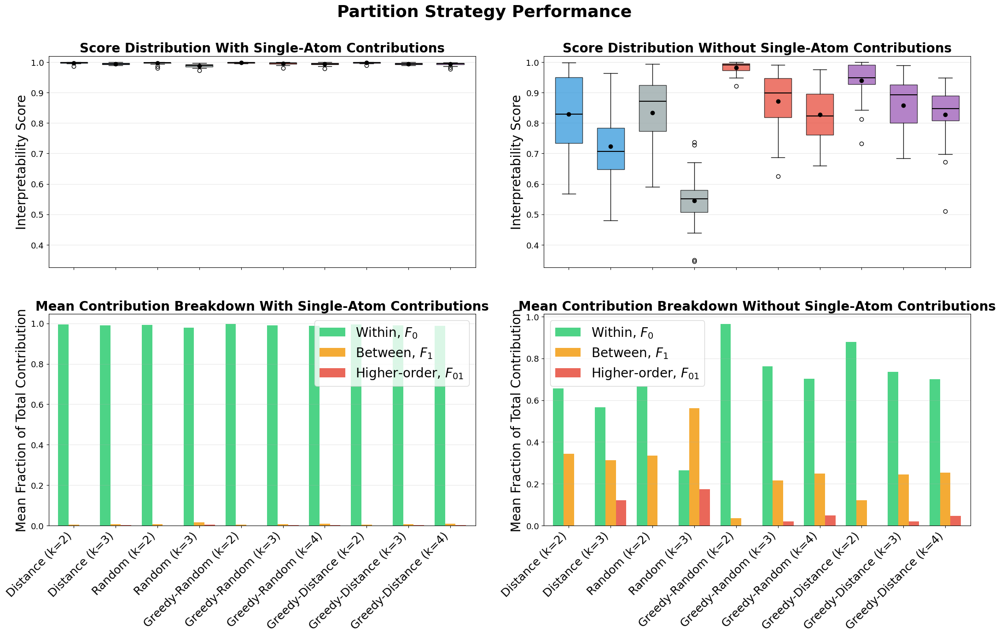

✓ Saved detailed and summary CSV files.


In [51]:
from collections import defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition
)


# ═══════════════════════════════════════════════════════════════════════════
# CONFIGURATION
# ═══════════════════════════════════════════════════════════════════════════

RANDOM_SEED = 42
N_ITERATIONS = 100
MAX_PARTITIONS = 5
N_SAMPLE = min(20, len(test))


# ═══════════════════════════════════════════════════════════════════════════
# CREATE INTERPRETERS
# ═══════════════════════════════════════════════════════════════════════════

# Full interpretation: includes single-atom graphlet coefficients.
interpreter_full = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=False
)

# Structure-only interpretation:
# size-1 graphlet coefficients are internally set to zero.
interpreter_no_atoms = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=True
)

print(
    "Full interpreter single-atom features:",
    len(interpreter_full.atom_level_indices)
)

print(
    "No-atom interpreter zeroed coefficients:",
    np.count_nonzero(
        interpreter_no_atoms.original_coefficients
        != interpreter_no_atoms.coefficients
    )
)


# Each interpreter needs its own optimizer because the greedy objective
# depends on the active coefficients.
greedy_optimizer_full = PartitionOptimizer(
    interpreter=interpreter_full,
    max_partitions=MAX_PARTITIONS
)

greedy_optimizer_no_atoms = PartitionOptimizer(
    interpreter=interpreter_no_atoms,
    max_partitions=MAX_PARTITIONS
)


# ═══════════════════════════════════════════════════════════════════════════
# SAMPLE MOLECULES
# ═══════════════════════════════════════════════════════════════════════════

sample_indices = np.random.RandomState(
    RANDOM_SEED
).choice(
    len(test),
    size=N_SAMPLE,
    replace=False
)

sample_mols = [
    test.iloc[i]["mol"]
    for i in sample_indices
]

sample_smiles = [
    test.iloc[i]["smiles"]
    for i in sample_indices
]


# ═══════════════════════════════════════════════════════════════════════════
# GREEDY WRAPPERS
# ═══════════════════════════════════════════════════════════════════════════

def run_greedy_random(
    optimizer,
    mol,
    n_clusters,
    n_iterations=N_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False
):
    """
    Run random-initialized greedy optimization with exactly n_clusters.

    PartitionOptimizer.optimize_partition_random() uses max_partitions,
    so a temporary optimizer is created with max_partitions=n_clusters.
    """
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters
    )

    interpretation = local_optimizer.optimize_partition_random(
        mol=mol,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose
    )

    return interpretation.partition


def run_greedy_distance(
    optimizer,
    mol,
    n_clusters,
    n_iterations=N_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False
):
    """
    Run distance-initialized systematic greedy optimization.
    """
    interpretation = optimizer.optimize_partition_distance(
        mol=mol,
        n_clusters=n_clusters,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose
    )

    return interpretation.partition


# ═══════════════════════════════════════════════════════════════════════════
# STRATEGIES
# ═══════════════════════════════════════════════════════════════════════════

def create_strategies(optimizer):
    """
    Create the same strategies for a supplied interpreter/optimizer.
    """
    return {
        "Distance (k=2)": (
            lambda mol:
            ChemicalPartitioner.distance_partition(
                mol,
                n_clusters=2,
                seed=RANDOM_SEED
            )
        ),

        "Distance (k=3)": (
            lambda mol:
            ChemicalPartitioner.distance_partition(
                mol,
                n_clusters=3,
                seed=RANDOM_SEED
            )
        ),

        "Random (k=2)": (
            lambda mol:
            ChemicalPartitioner.random_partition(
                mol,
                n_clusters=2,
                seed=RANDOM_SEED
            )
        ),

        "Random (k=3)": (
            lambda mol:
            ChemicalPartitioner.random_partition(
                mol,
                n_clusters=3,
                seed=RANDOM_SEED
            )
        ),

        "Greedy-Random (k=2)": (
            lambda mol:
            run_greedy_random(
                optimizer,
                mol,
                n_clusters=2
            )
        ),

        "Greedy-Random (k=3)": (
            lambda mol:
            run_greedy_random(
                optimizer,
                mol,
                n_clusters=3
            )
        ),

        "Greedy-Random (k=4)": (
            lambda mol:
            run_greedy_random(
                optimizer,
                mol,
                n_clusters=4
            )
        ),

        "Greedy-Distance (k=2)": (
            lambda mol:
            run_greedy_distance(
                optimizer,
                mol,
                n_clusters=2
            )
        ),

        "Greedy-Distance (k=3)": (
            lambda mol:
            run_greedy_distance(
                optimizer,
                mol,
                n_clusters=3
            )
        ),

        "Greedy-Distance (k=4)": (
            lambda mol:
            run_greedy_distance(
                optimizer,
                mol,
                n_clusters=4
            )
        )
    }


strategies_full = create_strategies(
    greedy_optimizer_full
)

strategies_no_atoms = create_strategies(
    greedy_optimizer_no_atoms
)


# ═══════════════════════════════════════════════════════════════════════════
# ANALYSIS
# ═══════════════════════════════════════════════════════════════════════════

def run_partition_analysis(
    molecules,
    smiles_list,
    strategies,
    analysis_interpreter,
    analysis_name
):
    """
    Evaluate all partitioning strategies with one interpreter.
    """
    results_by_strategy = defaultdict(list)

    print("\n" + "=" * 80)
    print(analysis_name)
    print("=" * 80)

    for mol_idx, mol in enumerate(molecules):

        if (mol_idx + 1) % 10 == 0:
            print(
                f"Processed {mol_idx + 1}/{len(molecules)} molecules"
            )

        for strategy_name, partition_fn in strategies.items():
            try:
                partition = partition_fn(mol)

                interpretation = (
                    analysis_interpreter
                    .compute_partition_contributions(
                        mol,
                        partition
                    )
                )

                breakdown = (
                    interpretation
                    .get_contribution_breakdown()
                )

                validation = validate_partition_decomposition(
                    mol=mol,
                    interpreter=analysis_interpreter,
                    partition=partition,
                    tolerance=1e-2
                )

                requested_k = int(
                    strategy_name
                    .split("k=")[1]
                    .rstrip(")")
                )

                actual_k = len(
                    set(partition.values())
                )

                results_by_strategy[strategy_name].append({
                    "mol_idx": mol_idx,
                    "smiles": smiles_list[mol_idx],
                    "n_atoms": mol.GetNumAtoms(),
                    "k_requested": requested_k,
                    "n_partitions": actual_k,
                    "score": interpretation.score,
                    "within_frac": breakdown["within_frac"],
                    "between_frac": breakdown["between_frac"],
                    "higher_frac": breakdown["higher_frac"],
                    "prediction": interpretation.total_prediction,
                    "atom_baseline": interpretation.atom_baseline,
                    "validation_passed": validation["passed"],
                    "validation_error": validation["relative_error"]
                })

            except Exception as error:
                print(
                    f"Warning: {analysis_name}; "
                    f"{strategy_name}; molecule {mol_idx}: "
                    f"{error}"
                )

    return results_by_strategy


all_results_full = run_partition_analysis(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_full,
    analysis_interpreter=interpreter_full,
    analysis_name=(
        "WITH SINGLE-ATOM CONTRIBUTIONS"
    )
)

all_results_no_atoms = run_partition_analysis(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_no_atoms,
    analysis_interpreter=interpreter_no_atoms,
    analysis_name=(
        "WITHOUT SINGLE-ATOM CONTRIBUTIONS"
    )
)


# ═══════════════════════════════════════════════════════════════════════════
# SUMMARY TABLES
# ═══════════════════════════════════════════════════════════════════════════

def create_summary_dataframe(
    results_by_strategy,
    strategy_order
):
    """
    Create one aggregate summary row per strategy.
    """
    rows = []

    for strategy_name in strategy_order:
        results = results_by_strategy[strategy_name]

        if not results:
            continue

        strategy_df = pd.DataFrame(results)

        rows.append({
            "Strategy": strategy_name,
            "N molecules": len(strategy_df),
            "Mean score": strategy_df["score"].mean(),
            "Score std": strategy_df["score"].std(),
            "Median score": strategy_df["score"].median(),
            "Mean F0 %": (
                100 * strategy_df["within_frac"].mean()
            ),
            "Mean F1 %": (
                100 * strategy_df["between_frac"].mean()
            ),
            "Mean F01 %": (
                100 * strategy_df["higher_frac"].mean()
            ),
            "Mean requested k": (
                strategy_df["k_requested"].mean()
            ),
            "Mean actual k": (
                strategy_df["n_partitions"].mean()
            ),
            "Validation pass %": (
                100
                * strategy_df["validation_passed"].mean()
            ),
            "Mean validation error": (
                strategy_df["validation_error"].mean()
            )
        })

    summary_df = pd.DataFrame(rows)

    if not summary_df.empty:
        summary_df = summary_df.sort_values(
            "Mean score",
            ascending=False
        )

    return summary_df


summary_df_full = create_summary_dataframe(
    all_results_full,
    list(strategies_full)
)

summary_df_no_atoms = create_summary_dataframe(
    all_results_no_atoms,
    list(strategies_no_atoms)
)

print("\nSUMMARY WITH SINGLE-ATOM CONTRIBUTIONS")
print(summary_df_full.to_string(index=False))

print("\nSUMMARY WITHOUT SINGLE-ATOM CONTRIBUTIONS")
print(summary_df_no_atoms.to_string(index=False))


# Compute a common y-axis range for both score-distribution plots
all_scores = []

for strategy in strategy_names:
    all_scores.extend(
        result["score"]
        for result in all_results_full[strategy]
    )
    all_scores.extend(
        result["score"]
        for result in all_results_no_atoms[strategy]
    )

score_min = min(all_scores)
score_max = max(all_scores)

padding = 0.03 * (score_max - score_min + 1e-8)

score_ylim = (
    score_min - padding,
    score_max + padding
)

# ═══════════════════════════════════════════════════════════════════════════
# PLOTTING HELPERS
# ═══════════════════════════════════════════════════════════════════════════

def get_strategy_color(strategy_name):
    """
    Return a consistent color for each strategy family.
    """
    if "Greedy-Random" in strategy_name:
        return "#e74c3c"

    if "Greedy-Distance" in strategy_name:
        return "#9b59b6"

    if strategy_name.startswith("Random"):
        return "#95a5a6"

    if strategy_name.startswith("Distance"):
        return "#3498db"

    return "#bdc3c7"


def plot_score_distribution(
    ax,
    results_by_strategy,
    strategy_names,
    title,
    show_x_labels=False,
    ylim=None
):
    """
    Plot score distributions using fixed numeric x positions.
    """
    x = np.arange(len(strategy_names))

    strategy_scores = [
        [
            result["score"]
            for result in results_by_strategy[strategy_name]
        ]
        for strategy_name in strategy_names
    ]

    boxplot = ax.boxplot(
        strategy_scores,
        positions=x,
        widths=0.65,
        patch_artist=True,
        showmeans=True,
        meanprops={
            "marker": "o",
            "markerfacecolor": "black",
            "markeredgecolor": "black",
            "markersize": 6
        },
        medianprops={
            "color": "black",
            "linewidth": 1.5
        }
    )

    for strategy_name, box in zip(
        strategy_names,
        boxplot["boxes"]
    ):
        box.set_facecolor(
            get_strategy_color(strategy_name)
        )
        box.set_alpha(0.75)

    ax.set_title(
        title,
        fontsize=20,
        fontweight="bold"
    )

    ax.set_ylabel(
        "Interpretability Score",
        fontsize=20
    )

    ax.set_xlim(
        -0.6,
        len(strategy_names) - 0.4
    )

    ax.set_xticks(x)

    if show_x_labels:
        ax.set_xticklabels(
            strategy_names,
            rotation=45,
            ha="right",
            fontsize=20
        )
    else:
        ax.set_xticklabels([])

    # Apply the shared score range instead of forcing 0–1.
    if ylim is not None:
        ax.set_ylim(ylim)

    ax.tick_params(
        axis="y",
        labelsize=13
    )

    ax.grid(
        axis="y",
        alpha=0.3
    )


def plot_contribution_breakdown(
    ax,
    results_by_strategy,
    strategy_names,
    title,
    show_x_labels=True
):
    """
    Plot mean F0, F1, and F01 fractions using the same x positions
    as the score-distribution panels.
    """
    x = np.arange(len(strategy_names))
    bar_width = 0.25

    within_means = [
        np.mean([
            result["within_frac"]
            for result in results_by_strategy[strategy_name]
        ])
        for strategy_name in strategy_names
    ]

    between_means = [
        np.mean([
            result["between_frac"]
            for result in results_by_strategy[strategy_name]
        ])
        for strategy_name in strategy_names
    ]

    higher_means = [
        np.mean([
            result["higher_frac"]
            for result in results_by_strategy[strategy_name]
        ])
        for strategy_name in strategy_names
    ]

    ax.bar(
        x - bar_width,
        within_means,
        bar_width,
        label=r"Within, $F_0$",
        color="#2ecc71",
        alpha=0.85
    )

    ax.bar(
        x,
        between_means,
        bar_width,
        label=r"Between, $F_1$",
        color="#f39c12",
        alpha=0.85
    )

    ax.bar(
        x + bar_width,
        higher_means,
        bar_width,
        label=r"Higher-order, $F_{01}$",
        color="#e74c3c",
        alpha=0.85
    )

    ax.set_title(
        title,
        fontsize=20,
        fontweight="bold"
    )

    ax.set_ylabel(
        "Mean Fraction of Total Contribution",
        fontsize=20
    )

    ax.set_xlim(
        -0.6,
        len(strategy_names) - 0.4
    )

    ax.set_xticks(x)

    if show_x_labels:
        ax.set_xticklabels(
            strategy_names,
            rotation=45,
            ha="right",
            fontsize=18
        )
    else:
        ax.set_xticklabels([])

    ax.tick_params(
        axis="y",
        labelsize=13
    )

    ax.set_ylim(bottom=0)

    ax.legend(
        fontsize=20
    )

    ax.grid(
        axis="y",
        alpha=0.3
    )


# ═══════════════════════════════════════════════════════════════════════════
# CREATE THE 2 × 2 FIGURE
# ═══════════════════════════════════════════════════════════════════════════

# Use one common strategy order for every panel.
strategy_names = [
    strategy_name
    for strategy_name in strategies_full
    if (
        len(all_results_full[strategy_name]) > 0
        and len(all_results_no_atoms[strategy_name]) > 0
    )
]

if not strategy_names:
    raise ValueError(
        "No strategies produced valid results in both analyses."
    )


fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(22, 15),
    sharex="col"
)


# ───────────────────────────────────────────────────────────────────────────
# Top row: score distributions
# ───────────────────────────────────────────────────────────────────────────

plot_score_distribution(
    ax=axes[0, 0],
    results_by_strategy=all_results_full,
    strategy_names=strategy_names,
    title="Score Distribution With Single-Atom Contributions",
    show_x_labels=False,
    ylim=score_ylim
)

plot_score_distribution(
    ax=axes[0, 1],
    results_by_strategy=all_results_no_atoms,
    strategy_names=strategy_names,
    title="Score Distribution Without Single-Atom Contributions",
    show_x_labels=False,
    ylim=score_ylim
)
# ───────────────────────────────────────────────────────────────────────────
# Bottom row: mean contribution breakdowns
# ───────────────────────────────────────────────────────────────────────────

plot_contribution_breakdown(
    ax=axes[1, 0],
    results_by_strategy=all_results_full,
    strategy_names=strategy_names,
    title=(
        "Mean Contribution Breakdown "
        "With Single-Atom Contributions"
    ),
    show_x_labels=True
)

plot_contribution_breakdown(
    ax=axes[1, 1],
    results_by_strategy=all_results_no_atoms,
    strategy_names=strategy_names,
    title=(
        "Mean Contribution Breakdown "
        "Without Single-Atom Contributions"
    ),
    show_x_labels=True
)

# Get all scores from the analysis without single-atom contributions.
no_atom_scores = [
    result["score"]
    for strategy_name in strategy_names
    for result in all_results_no_atoms[strategy_name]
]

if not no_atom_scores:
    raise ValueError(
        "No no-atom scores are available for setting the y-axis."
    )

score_min = min(no_atom_scores)
score_max = max(no_atom_scores)

# Add a small amount of space above and below the data.
score_range = score_max - score_min

if score_range < 1e-10:
    score_padding = 0.02
else:
    score_padding = 0.05 * score_range

score_ylim = (
    max(0.0, score_min - score_padding),
    min(1.0, score_max + score_padding)
)

print(
    "Shared top-row score limits:",
    score_ylim
)

fig.suptitle(
    "Partition Strategy Performance",
    fontsize=26,
    fontweight="bold",
    y=0.995
)

fig.subplots_adjust(
    left=0.07,
    right=0.98,
    top=0.92,
    bottom=0.24,
    hspace=0.22,
    wspace=0.16
)

output_filename = (
    "partition_strategy_performance_"
    "with_and_without_single_atom_contributions.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\n✓ Saved visualization to "
    f"'{output_filename}'"
)

plt.show()


# ═══════════════════════════════════════════════════════════════════════════
# EXPORT RESULTS
# ═══════════════════════════════════════════════════════════════════════════

def flatten_results(
    results_by_strategy,
    contribution_setting
):
    """
    Convert nested strategy results to a DataFrame.
    """
    rows = []

    for strategy_name, results in results_by_strategy.items():
        for result in results:
            row = result.copy()
            row["strategy"] = strategy_name
            row["contribution_setting"] = (
                contribution_setting
            )
            rows.append(row)

    return pd.DataFrame(rows)


df_export_full = flatten_results(
    all_results_full,
    "with_single_atom_contributions"
)

df_export_no_atoms = flatten_results(
    all_results_no_atoms,
    "without_single_atom_contributions"
)

df_export_combined = pd.concat(
    [
        df_export_full,
        df_export_no_atoms
    ],
    ignore_index=True
)

df_export_combined.to_csv(
    "partition_strategy_"
    "with_and_without_single_atom_contributions_detailed.csv",
    index=False
)


summary_full_export = summary_df_full.copy()
summary_full_export["Contribution setting"] = (
    "With single-atom contributions"
)

summary_no_atoms_export = (
    summary_df_no_atoms.copy()
)

summary_no_atoms_export["Contribution setting"] = (
    "Without single-atom contributions"
)

summary_combined = pd.concat(
    [
        summary_full_export,
        summary_no_atoms_export
    ],
    ignore_index=True
)

summary_combined.to_csv(
    "partition_strategy_"
    "with_and_without_single_atom_contributions_summary.csv",
    index=False
)

print("✓ Saved detailed and summary CSV files.")

Full interpreter single-atom features: 15
No-atom interpreter zeroed coefficients: 15

Created 15 strategies for each interpretation setting.
Metropolis-Hastings settings: iterations=500, beta=20.0, initialization=distance
Adjusted-score settings: connectivity_weight=0.1

WITH SINGLE-ATOM CONTRIBUTIONS
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No eleme

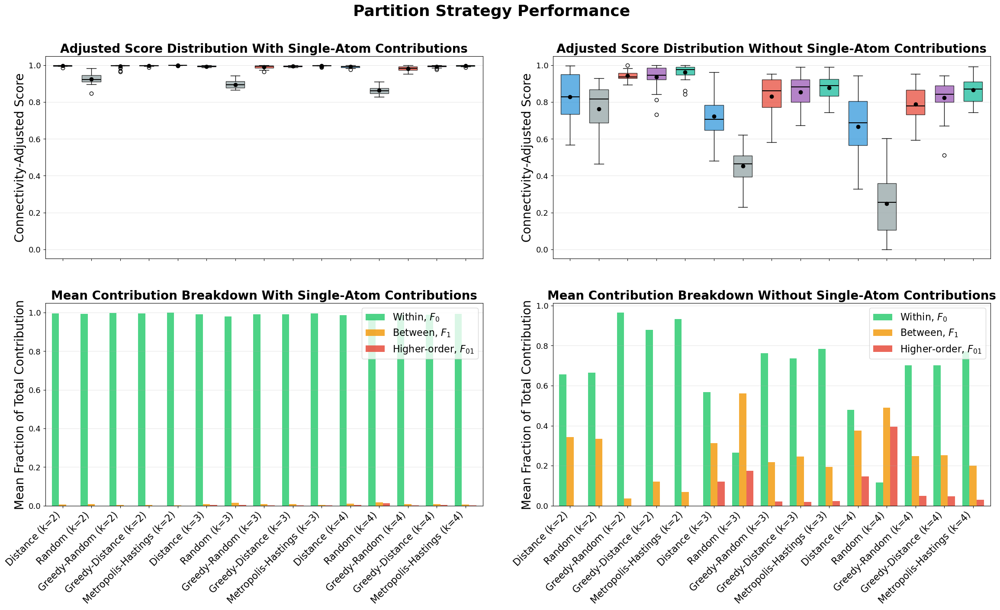

Saved detailed and summary CSV files.


In [52]:

from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# CONFIGURATION
# =============================================================================

RANDOM_SEED = 42

GREEDY_ITERATIONS = 100

MH_ITERATIONS = 500
MH_BETA = 20.0
MH_INITIALIZATION = "distance"
MH_SEED = 42

CONNECTIVITY_WEIGHT = 0.10

MAX_PARTITIONS = 5
N_SAMPLE = min(20, len(test))

K_VALUES = (2, 3, 4)


# =============================================================================
# CREATE INTERPRETERS
# =============================================================================

# Full interpretation:
# includes single-atom graphlet coefficients.
interpreter_full = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=False
)

# Structure-only interpretation:
# size-1 graphlet coefficients are internally set to zero.
interpreter_no_atoms = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=True
)

print(
    "Full interpreter single-atom features:",
    len(interpreter_full.atom_level_indices)
)

print(
    "No-atom interpreter zeroed coefficients:",
    np.count_nonzero(
        interpreter_no_atoms.original_coefficients
        != interpreter_no_atoms.coefficients
    )
)


# =============================================================================
# CREATE OPTIMIZERS
# =============================================================================

# Each interpreter needs its own optimizer because its coefficients and
# therefore its interpretability objective are different.

optimizer_full = PartitionOptimizer(
    interpreter=interpreter_full,
    min_partitions=min(K_VALUES),
    max_partitions=MAX_PARTITIONS,
    connectivity_weight=CONNECTIVITY_WEIGHT
)

optimizer_no_atoms = PartitionOptimizer(
    interpreter=interpreter_no_atoms,
    min_partitions=min(K_VALUES),
    max_partitions=MAX_PARTITIONS,
    connectivity_weight=CONNECTIVITY_WEIGHT
)


# =============================================================================
# SAMPLE MOLECULES
# =============================================================================

sample_indices = np.random.RandomState(
    RANDOM_SEED
).choice(
    len(test),
    size=N_SAMPLE,
    replace=False
)

sample_mols = [
    test.iloc[index]["mol"]
    for index in sample_indices
]

sample_smiles = [
    test.iloc[index]["smiles"]
    for index in sample_indices
]


# =============================================================================
# OPTIMIZATION WRAPPERS
# =============================================================================

def create_local_optimizer(
    optimizer,
    n_clusters
):
    """
    Create an optimizer constrained to exactly n_clusters partitions.
    """
    return PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight
    )


def run_greedy_random(
    optimizer,
    mol,
    n_clusters,
    n_iterations=GREEDY_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False
):
    """
    Run random-initialized greedy optimization with exactly k partitions.
    """
    local_optimizer = create_local_optimizer(
        optimizer=optimizer,
        n_clusters=n_clusters
    )

    interpretation = (
        local_optimizer.optimize_partition_random(
            mol=mol,
            n_iterations=n_iterations,
            seed=seed,
            verbose=verbose
        )
    )

    return interpretation.partition


def run_greedy_distance(
    optimizer,
    mol,
    n_clusters,
    n_iterations=GREEDY_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False
):
    """
    Run distance-initialized greedy optimization with exactly k partitions.
    """
    local_optimizer = create_local_optimizer(
        optimizer=optimizer,
        n_clusters=n_clusters
    )

    interpretation = (
        local_optimizer.optimize_partition_distance(
            mol=mol,
            n_clusters=n_clusters,
            n_iterations=n_iterations,
            seed=seed,
            verbose=verbose
        )
    )

    return interpretation.partition


def run_metropolis_hastings(
    optimizer,
    mol,
    n_clusters,
    n_iterations=MH_ITERATIONS,
    beta=MH_BETA,
    initialization=MH_INITIALIZATION,
    seed=MH_SEED,
    verbose=False
):
    """
    Run Metropolis-Hastings optimization with exactly k partitions.
    """
    local_optimizer = create_local_optimizer(
        optimizer=optimizer,
        n_clusters=n_clusters
    )

    interpretation = (
        local_optimizer
        .optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=n_clusters,
            n_iterations=n_iterations,
            beta=beta,
            initialization=initialization,
            seed=seed,
            verbose=verbose
        )
    )

    return interpretation.partition


# =============================================================================
# STRATEGY CREATION
# =============================================================================

def create_strategies(optimizer):
    """
    Create identical strategies for a supplied interpreter/optimizer.
    """
    strategies = {}

    for k in K_VALUES:

        strategies[f"Distance (k={k})"] = (
            lambda mol, k=k:
            ChemicalPartitioner.distance_partition(
                mol,
                n_clusters=k,
                seed=RANDOM_SEED
            )
        )

        strategies[f"Random (k={k})"] = (
            lambda mol, k=k:
            ChemicalPartitioner.random_partition(
                mol,
                n_clusters=k,
                seed=RANDOM_SEED
            )
        )

        strategies[f"Greedy-Random (k={k})"] = (
            lambda mol, k=k:
            run_greedy_random(
                optimizer=optimizer,
                mol=mol,
                n_clusters=k,
                n_iterations=GREEDY_ITERATIONS,
                seed=RANDOM_SEED,
                verbose=False
            )
        )

        strategies[f"Greedy-Distance (k={k})"] = (
            lambda mol, k=k:
            run_greedy_distance(
                optimizer=optimizer,
                mol=mol,
                n_clusters=k,
                n_iterations=GREEDY_ITERATIONS,
                seed=RANDOM_SEED,
                verbose=False
            )
        )

        strategies[f"Metropolis-Hastings (k={k})"] = (
            lambda mol, k=k:
            run_metropolis_hastings(
                optimizer=optimizer,
                mol=mol,
                n_clusters=k,
                n_iterations=MH_ITERATIONS,
                beta=MH_BETA,
                initialization=MH_INITIALIZATION,
                seed=MH_SEED,
                verbose=False
            )
        )

    return strategies


strategies_full = create_strategies(
    optimizer_full
)

strategies_no_atoms = create_strategies(
    optimizer_no_atoms
)

print(
    f"\nCreated {len(strategies_full)} strategies "
    "for each interpretation setting."
)

print(
    "Metropolis-Hastings settings: "
    f"iterations={MH_ITERATIONS}, "
    f"beta={MH_BETA}, "
    f"initialization={MH_INITIALIZATION}"
)

print(
    "Adjusted-score settings: "
    f"connectivity_weight={CONNECTIVITY_WEIGHT}"
)


# =============================================================================
# ANALYSIS
# =============================================================================

def run_partition_analysis(
    molecules,
    smiles_list,
    strategies,
    analysis_interpreter,
    analysis_name
):
    """
    Evaluate all strategies with one interpreter.

    Stores:
      - raw interpretability score,
      - connectivity penalty,
      - connectivity-adjusted score,
      - contribution breakdown,
      - decomposition validation.
    """
    results_by_strategy = defaultdict(list)

    print("\n" + "=" * 80)
    print(analysis_name)
    print("=" * 80)

    for mol_idx, mol in enumerate(molecules):

        if (mol_idx + 1) % 10 == 0:
            print(
                f"Processed {mol_idx + 1}/"
                f"{len(molecules)} molecules"
            )

        for strategy_name, partition_function in strategies.items():

            try:
                requested_k = int(
                    strategy_name
                    .split("k=")[1]
                    .rstrip(")")
                )

                # A molecule cannot have more nonempty partitions than atoms.
                if requested_k > mol.GetNumAtoms():
                    continue

                partition = partition_function(
                    mol
                )

                actual_k = len(
                    set(partition.values())
                )

                # Exclude strategies that failed to produce the requested k.
                if actual_k != requested_k:
                    print(
                        f"Skipping {analysis_name}; "
                        f"{strategy_name}; molecule {mol_idx}: "
                        f"requested k={requested_k}, "
                        f"actual k={actual_k}"
                    )
                    continue

                interpretation = (
                    analysis_interpreter
                    .compute_partition_contributions(
                        mol,
                        partition
                    )
                )

                breakdown = (
                    interpretation
                    .get_contribution_breakdown()
                )

                connectivity_penalty = (
                    partition_connectivity_penalty(
                        mol,
                        partition
                    )
                )

                adjusted_score = (
                    connectivity_adjusted_score(
                        mol=mol,
                        interpretation=interpretation,
                        connectivity_weight=CONNECTIVITY_WEIGHT
                    )
                )

                validation = (
                    validate_partition_decomposition(
                        mol=mol,
                        interpreter=analysis_interpreter,
                        partition=partition,
                        tolerance=1e-2
                    )
                )

                results_by_strategy[
                    strategy_name
                ].append({
                    "mol_idx": mol_idx,
                    "smiles": smiles_list[mol_idx],
                    "n_atoms": mol.GetNumAtoms(),

                    "k_requested": requested_k,
                    "n_partitions": actual_k,

                    "raw_score": interpretation.score,
                    "connectivity_penalty": (
                        connectivity_penalty
                    ),
                    "adjusted_score": adjusted_score,

                    "within_frac": breakdown["within_frac"],
                    "between_frac": breakdown["between_frac"],
                    "higher_frac": breakdown["higher_frac"],

                    "prediction": (
                        interpretation.total_prediction
                    ),
                    "atom_baseline": (
                        interpretation.atom_baseline
                    ),

                    "validation_passed": (
                        validation["passed"]
                    ),
                    "validation_error": (
                        validation["relative_error"]
                    )
                })

            except Exception as error:
                print(
                    f"Warning: {analysis_name}; "
                    f"{strategy_name}; molecule {mol_idx}: "
                    f"{error}"
                )

    return results_by_strategy


all_results_full = run_partition_analysis(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_full,
    analysis_interpreter=interpreter_full,
    analysis_name=(
        "WITH SINGLE-ATOM CONTRIBUTIONS"
    )
)

all_results_no_atoms = run_partition_analysis(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_no_atoms,
    analysis_interpreter=interpreter_no_atoms,
    analysis_name=(
        "WITHOUT SINGLE-ATOM CONTRIBUTIONS"
    )
)


# =============================================================================
# SUMMARY TABLES
# =============================================================================

def create_summary_dataframe(
    results_by_strategy,
    strategy_order
):
    """
    Create one aggregate row per strategy.

    Strategies are ranked using mean adjusted score.
    """
    rows = []

    for strategy_name in strategy_order:
        results = results_by_strategy[
            strategy_name
        ]

        if not results:
            continue

        strategy_df = pd.DataFrame(
            results
        )

        rows.append({
            "Strategy": strategy_name,
            "N molecules": len(strategy_df),

            "Mean adjusted score": (
                strategy_df[
                    "adjusted_score"
                ].mean()
            ),
            "Adjusted score std": (
                strategy_df[
                    "adjusted_score"
                ].std()
            ),
            "Median adjusted score": (
                strategy_df[
                    "adjusted_score"
                ].median()
            ),

            "Mean raw score": (
                strategy_df["raw_score"].mean()
            ),
            "Raw score std": (
                strategy_df["raw_score"].std()
            ),

            "Mean connectivity penalty": (
                strategy_df[
                    "connectivity_penalty"
                ].mean()
            ),

            "Mean F0 %": (
                100
                * strategy_df[
                    "within_frac"
                ].mean()
            ),
            "Mean F1 %": (
                100
                * strategy_df[
                    "between_frac"
                ].mean()
            ),
            "Mean F01 %": (
                100
                * strategy_df[
                    "higher_frac"
                ].mean()
            ),

            "Mean requested k": (
                strategy_df[
                    "k_requested"
                ].mean()
            ),
            "Mean actual k": (
                strategy_df[
                    "n_partitions"
                ].mean()
            ),

            "Validation pass %": (
                100
                * strategy_df[
                    "validation_passed"
                ].mean()
            ),
            "Mean validation error": (
                strategy_df[
                    "validation_error"
                ].mean()
            )
        })

    summary_df = pd.DataFrame(
        rows
    )

    if not summary_df.empty:
        summary_df = summary_df.sort_values(
            "Mean adjusted score",
            ascending=False
        ).reset_index(drop=True)

    return summary_df


summary_df_full = create_summary_dataframe(
    results_by_strategy=all_results_full,
    strategy_order=list(strategies_full)
)

summary_df_no_atoms = create_summary_dataframe(
    results_by_strategy=all_results_no_atoms,
    strategy_order=list(strategies_no_atoms)
)

print(
    "\nSUMMARY WITH SINGLE-ATOM CONTRIBUTIONS"
)

print(
    summary_df_full.to_string(
        index=False
    )
)

print(
    "\nSUMMARY WITHOUT SINGLE-ATOM CONTRIBUTIONS"
)

print(
    summary_df_no_atoms.to_string(
        index=False
    )
)


# =============================================================================
# DETERMINE COMMON STRATEGY ORDER
# =============================================================================

strategy_names = [
    strategy_name
    for strategy_name in strategies_full
    if (
        len(
            all_results_full[
                strategy_name
            ]
        ) > 0
        and len(
            all_results_no_atoms[
                strategy_name
            ]
        ) > 0
    )
]

if not strategy_names:
    raise ValueError(
        "No strategies produced valid results "
        "in both analyses."
    )


# =============================================================================
# SHARED ADJUSTED-SCORE AXIS
# =============================================================================

all_adjusted_scores = []

for strategy_name in strategy_names:

    all_adjusted_scores.extend(
        result["adjusted_score"]
        for result in all_results_full[
            strategy_name
        ]
    )

    all_adjusted_scores.extend(
        result["adjusted_score"]
        for result in all_results_no_atoms[
            strategy_name
        ]
    )

if not all_adjusted_scores:
    raise ValueError(
        "No adjusted scores are available."
    )

score_min = min(
    all_adjusted_scores
)

score_max = max(
    all_adjusted_scores
)

score_range = (
    score_max - score_min
)

if score_range < 1e-10:
    score_padding = 0.02
else:
    score_padding = (
        0.05 * score_range
    )

adjusted_score_ylim = (
    score_min - score_padding,
    score_max + score_padding
)

print(
    "\nShared adjusted-score limits:",
    adjusted_score_ylim
)


# =============================================================================
# PLOTTING HELPERS
# =============================================================================

def get_strategy_color(
    strategy_name
):
    """
    Return a consistent color for each strategy family.
    """
    if "Metropolis-Hastings" in strategy_name:
        return "#1abc9c"

    if "Greedy-Random" in strategy_name:
        return "#e74c3c"

    if "Greedy-Distance" in strategy_name:
        return "#9b59b6"

    if strategy_name.startswith("Random"):
        return "#95a5a6"

    if strategy_name.startswith("Distance"):
        return "#3498db"

    return "#bdc3c7"


def plot_score_distribution(
    ax,
    results_by_strategy,
    strategy_names,
    title,
    show_x_labels=False,
    ylim=None
):
    """
    Plot connectivity-adjusted score distributions.
    """
    x = np.arange(
        len(strategy_names)
    )

    strategy_scores = [
        [
            result["adjusted_score"]
            for result in results_by_strategy[
                strategy_name
            ]
        ]
        for strategy_name in strategy_names
    ]

    boxplot = ax.boxplot(
        strategy_scores,
        positions=x,
        widths=0.65,
        patch_artist=True,
        showmeans=True,
        meanprops={
            "marker": "o",
            "markerfacecolor": "black",
            "markeredgecolor": "black",
            "markersize": 6
        },
        medianprops={
            "color": "black",
            "linewidth": 1.5
        }
    )

    for strategy_name, box in zip(
        strategy_names,
        boxplot["boxes"]
    ):
        box.set_facecolor(
            get_strategy_color(
                strategy_name
            )
        )

        box.set_alpha(
            0.75
        )

    ax.set_title(
        title,
        fontsize=20,
        fontweight="bold"
    )

    ax.set_ylabel(
        "Connectivity-Adjusted Score",
        fontsize=20
    )

    ax.set_xlim(
        -0.6,
        len(strategy_names) - 0.4
    )

    ax.set_xticks(
        x
    )

    if show_x_labels:
        ax.set_xticklabels(
            strategy_names,
            rotation=45,
            ha="right",
            fontsize=16
        )
    else:
        ax.set_xticklabels([])

    if ylim is not None:
        ax.set_ylim(
            ylim
        )

    ax.tick_params(
        axis="y",
        labelsize=13
    )

    ax.grid(
        axis="y",
        alpha=0.3
    )


def plot_contribution_breakdown(
    ax,
    results_by_strategy,
    strategy_names,
    title,
    show_x_labels=True
):
    """
    Plot the mean contribution fractions for each strategy.
    """
    x = np.arange(
        len(strategy_names)
    )

    bar_width = 0.25

    within_means = [
        np.mean([
            result["within_frac"]
            for result in results_by_strategy[
                strategy_name
            ]
        ])
        for strategy_name in strategy_names
    ]

    between_means = [
        np.mean([
            result["between_frac"]
            for result in results_by_strategy[
                strategy_name
            ]
        ])
        for strategy_name in strategy_names
    ]

    higher_means = [
        np.mean([
            result["higher_frac"]
            for result in results_by_strategy[
                strategy_name
            ]
        ])
        for strategy_name in strategy_names
    ]

    ax.bar(
        x - bar_width,
        within_means,
        bar_width,
        label=r"Within, $F_0$",
        color="#2ecc71",
        alpha=0.85
    )

    ax.bar(
        x,
        between_means,
        bar_width,
        label=r"Between, $F_1$",
        color="#f39c12",
        alpha=0.85
    )

    ax.bar(
        x + bar_width,
        higher_means,
        bar_width,
        label=r"Higher-order, $F_{01}$",
        color="#e74c3c",
        alpha=0.85
    )

    ax.set_title(
        title,
        fontsize=20,
        fontweight="bold"
    )

    ax.set_ylabel(
        "Mean Fraction of Total Contribution",
        fontsize=20
    )

    ax.set_xlim(
        -0.6,
        len(strategy_names) - 0.4
    )

    ax.set_xticks(
        x
    )

    if show_x_labels:
        ax.set_xticklabels(
            strategy_names,
            rotation=45,
            ha="right",
            fontsize=16
        )
    else:
        ax.set_xticklabels([])

    ax.tick_params(
        axis="y",
        labelsize=13
    )

    ax.set_ylim(
        bottom=0
    )

    ax.legend(
        fontsize=16
    )

    ax.grid(
        axis="y",
        alpha=0.3
    )


# =============================================================================
# CREATE THE 2 × 2 FIGURE
# =============================================================================

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(24, 16),
    sharex="col"
)


# -----------------------------------------------------------------------------
# Top row: adjusted-score distributions
# -----------------------------------------------------------------------------

plot_score_distribution(
    ax=axes[0, 0],
    results_by_strategy=all_results_full,
    strategy_names=strategy_names,
    title=(
        "Adjusted Score Distribution "
        "With Single-Atom Contributions"
    ),
    show_x_labels=False,
    ylim=adjusted_score_ylim
)

plot_score_distribution(
    ax=axes[0, 1],
    results_by_strategy=all_results_no_atoms,
    strategy_names=strategy_names,
    title=(
        "Adjusted Score Distribution "
        "Without Single-Atom Contributions"
    ),
    show_x_labels=False,
    ylim=adjusted_score_ylim
)


# -----------------------------------------------------------------------------
# Bottom row: mean contribution breakdowns
# -----------------------------------------------------------------------------

plot_contribution_breakdown(
    ax=axes[1, 0],
    results_by_strategy=all_results_full,
    strategy_names=strategy_names,
    title=(
        "Mean Contribution Breakdown "
        "With Single-Atom Contributions"
    ),
    show_x_labels=True
)

plot_contribution_breakdown(
    ax=axes[1, 1],
    results_by_strategy=all_results_no_atoms,
    strategy_names=strategy_names,
    title=(
        "Mean Contribution Breakdown "
        "Without Single-Atom Contributions"
    ),
    show_x_labels=True
)


fig.suptitle(
    "Partition Strategy Performance",
    fontsize=26,
    fontweight="bold",
    y=0.995
)

fig.subplots_adjust(
    left=0.07,
    right=0.98,
    top=0.92,
    bottom=0.27,
    hspace=0.22,
    wspace=0.16
)

output_filename = (
    "partition_strategy_performance_"
    "adjusted_score_with_and_without_"
    "single_atom_contributions.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight"
)

print(
    f"\nSaved visualization to "
    f"'{output_filename}'"
)

plt.show()


# =============================================================================
# EXPORT RESULTS
# =============================================================================

def flatten_results(
    results_by_strategy,
    contribution_setting
):
    """
    Convert nested strategy results to a DataFrame.
    """
    rows = []

    for strategy_name, results in (
        results_by_strategy.items()
    ):
        for result in results:
            row = result.copy()

            row["strategy"] = (
                strategy_name
            )

            row["method"] = (
                strategy_name
                .split(" (")[0]
            )

            row["contribution_setting"] = (
                contribution_setting
            )

            row["connectivity_weight"] = (
                CONNECTIVITY_WEIGHT
            )

            row["is_metropolis_hastings"] = (
                "Metropolis-Hastings"
                in strategy_name
            )

            rows.append(
                row
            )

    return pd.DataFrame(
        rows
    )


df_export_full = flatten_results(
    results_by_strategy=all_results_full,
    contribution_setting=(
        "with_single_atom_contributions"
    )
)

df_export_no_atoms = flatten_results(
    results_by_strategy=all_results_no_atoms,
    contribution_setting=(
        "without_single_atom_contributions"
    )
)

df_export_combined = pd.concat(
    [
        df_export_full,
        df_export_no_atoms
    ],
    ignore_index=True
)

df_export_combined.to_csv(
    "partition_strategy_"
    "adjusted_score_with_and_without_"
    "single_atom_contributions_detailed.csv",
    index=False
)


summary_full_export = (
    summary_df_full.copy()
)

summary_full_export[
    "Contribution setting"
] = (
    "With single-atom contributions"
)

summary_no_atoms_export = (
    summary_df_no_atoms.copy()
)

summary_no_atoms_export[
    "Contribution setting"
] = (
    "Without single-atom contributions"
)

summary_combined = pd.concat(
    [
        summary_full_export,
        summary_no_atoms_export
    ],
    ignore_index=True
)

summary_combined[
    "Connectivity weight"
] = CONNECTIVITY_WEIGHT

summary_combined.to_csv(
    "partition_strategy_"
    "adjusted_score_with_and_without_"
    "single_atom_contributions_summary.csv",
    index=False
)

print(
    "Saved detailed and summary CSV files."
)


COMPREHENSIVE K-VALUE ANALYSIS (20 molecules)

Testing k values: [2, 3, 4, 5, 6, 7]
Single-atom coefficients zeroed in no-atom interpreter: 15

Strategies per analysis: 24
  Distance baseline: 6
  Random baseline: 6
  Greedy-Random: 6
  Greedy-Distance: 6

WITH SINGLE-ATOM CONTRIBUTIONS
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. C

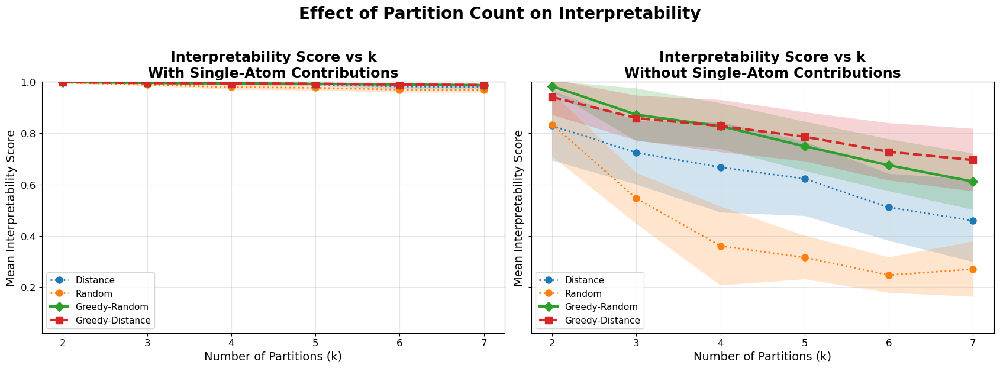


K SIGNIFICANCE TESTS: WITH SINGLE-ATOM CONTRIBUTIONS

Distance: best k=2
  vs k=3: difference=+0.0038, p=0.0006 ***
  vs k=4: difference=+0.0059, p=0.0004 ***
  vs k=5: difference=+0.0088, p=0.0000 ***
  vs k=6: difference=+0.0163, p=0.0000 ***
  vs k=7: difference=+0.0182, p=0.0000 ***

Random: best k=2
  vs k=3: difference=+0.0084, p=0.0000 ***
  vs k=4: difference=+0.0179, p=0.0000 ***
  vs k=5: difference=+0.0204, p=0.0000 ***
  vs k=6: difference=+0.0277, p=0.0000 ***
  vs k=7: difference=+0.0282, p=0.0000 ***

Greedy-Random: best k=2
  vs k=3: difference=+0.0032, p=0.0055 **
  vs k=4: difference=+0.0053, p=0.0001 ***
  vs k=5: difference=+0.0072, p=0.0000 ***
  vs k=6: difference=+0.0095, p=0.0000 ***
  vs k=7: difference=+0.0126, p=0.0000 ***

Greedy-Distance: best k=2
  vs k=3: difference=+0.0036, p=0.0008 ***
  vs k=4: difference=+0.0047, p=0.0020 **
  vs k=5: difference=+0.0063, p=0.0000 ***
  vs k=6: difference=+0.0092, p=0.0000 ***
  vs k=7: difference=+0.0112, p=0.0000 **

In [53]:
from collections import defaultdict
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition,
)


# =============================================================================
# CONFIGURATION
# =============================================================================

RANDOM_SEED = 42
N_ITERATIONS = 100
N_SAMPLE = min(20, len(test))
K_VALUES = tuple(range(2, 8))
METHODS = (
    "Distance",
    "Random",
    "Greedy-Random",
    "Greedy-Distance",
)


# =============================================================================
# SAMPLE MOLECULES
# =============================================================================

sample_indices = np.random.RandomState(RANDOM_SEED).choice(
    len(test),
    size=N_SAMPLE,
    replace=False,
)

sample_mols = [test.iloc[i]["mol"] for i in sample_indices]
sample_smiles = [test.iloc[i]["smiles"] for i in sample_indices]

print("=" * 80)
print(f"COMPREHENSIVE K-VALUE ANALYSIS ({N_SAMPLE} molecules)")
print("=" * 80)
print(f"\nTesting k values: {list(K_VALUES)}")


# =============================================================================
# INTERPRETERS AND OPTIMIZERS
# =============================================================================

interpreter_full = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=False,
)

interpreter_no_atoms = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=True,
)

greedy_optimizer_full = PartitionOptimizer(
    interpreter=interpreter_full,
    max_partitions=max(K_VALUES),
)

greedy_optimizer_no_atoms = PartitionOptimizer(
    interpreter=interpreter_no_atoms,
    max_partitions=max(K_VALUES),
)

print(
    "Single-atom coefficients zeroed in no-atom interpreter:",
    np.count_nonzero(
        interpreter_no_atoms.original_coefficients
        != interpreter_no_atoms.coefficients
    ),
)


# =============================================================================
# GREEDY WRAPPERS
# =============================================================================


def run_greedy_random(
    optimizer,
    mol,
    n_clusters,
    n_iterations=N_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False,
):
    """Run random-start greedy optimization while preserving requested k."""
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
    )

    interpretation = local_optimizer.optimize_partition_random(
        mol=mol,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose,
    )

    return interpretation.partition



def run_greedy_distance(
    optimizer,
    mol,
    n_clusters,
    n_iterations=N_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False,
):
    """Run distance-start greedy optimization while preserving requested k."""
    interpretation = optimizer.optimize_partition_distance(
        mol=mol,
        n_clusters=n_clusters,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose,
    )

    return interpretation.partition


# =============================================================================
# STRATEGIES
# =============================================================================


def create_k_strategies(optimizer, k_values):
    """Create baseline and greedy strategies for one interpreter."""
    strategies = {}

    for k in k_values:
        strategies[f"Distance (k={k})"] = (
            lambda mol, k=k: ChemicalPartitioner.distance_partition(
                mol,
                n_clusters=k,
                seed=RANDOM_SEED,
            )
        )

        strategies[f"Random (k={k})"] = (
            lambda mol, k=k: ChemicalPartitioner.random_partition(
                mol,
                n_clusters=k,
                seed=RANDOM_SEED,
            )
        )

        strategies[f"Greedy-Random (k={k})"] = (
            lambda mol, k=k: run_greedy_random(
                optimizer,
                mol,
                n_clusters=k,
            )
        )

        strategies[f"Greedy-Distance (k={k})"] = (
            lambda mol, k=k: run_greedy_distance(
                optimizer,
                mol,
                n_clusters=k,
            )
        )

    return strategies


strategies_full = create_k_strategies(
    greedy_optimizer_full,
    K_VALUES,
)

strategies_no_atoms = create_k_strategies(
    greedy_optimizer_no_atoms,
    K_VALUES,
)

print(f"\nStrategies per analysis: {len(strategies_full)}")
print(f"  Distance baseline: {len(K_VALUES)}")
print(f"  Random baseline: {len(K_VALUES)}")
print(f"  Greedy-Random: {len(K_VALUES)}")
print(f"  Greedy-Distance: {len(K_VALUES)}")


# =============================================================================
# RESULT COLLECTION
# =============================================================================


def collect_k_results(
    molecules,
    smiles_list,
    strategies,
    analysis_interpreter,
    analysis_name,
):
    """Evaluate every strategy and k value for one interpreter."""
    results_by_strategy = defaultdict(list)

    print("\n" + "=" * 80)
    print(analysis_name)
    print("=" * 80)

    for mol_idx, mol in enumerate(molecules):
        if (mol_idx + 1) % 10 == 0:
            print(f"  Processed {mol_idx + 1}/{len(molecules)} molecules")

        for strategy_name, partition_fn in strategies.items():
            try:
                partition = partition_fn(mol)
                interpretation = analysis_interpreter.compute_partition_contributions(
                    mol,
                    partition,
                )
                breakdown = interpretation.get_contribution_breakdown()
                validation = validate_partition_decomposition(
                    mol,
                    analysis_interpreter,
                    partition,
                    tolerance=1e-2,
                )

                requested_k = int(
                    strategy_name.split("k=")[1].rstrip(")")
                )

                results_by_strategy[strategy_name].append(
                    {
                        "mol_idx": mol_idx,
                        "smiles": smiles_list[mol_idx],
                        "n_atoms": mol.GetNumAtoms(),
                        "k_requested": requested_k,
                        "n_partitions": len(set(partition.values())),
                        "score": interpretation.score,
                        "within_frac": breakdown["within_frac"],
                        "between_frac": breakdown["between_frac"],
                        "higher_frac": breakdown["higher_frac"],
                        "prediction": interpretation.total_prediction,
                        "atom_baseline": interpretation.atom_baseline,
                        "validation_passed": validation["passed"],
                        "validation_error": validation["relative_error"],
                    }
                )

            except Exception as error:
                print(
                    f"  Warning: {analysis_name}; {strategy_name}; "
                    f"molecule {mol_idx}: {error}"
                )

    return results_by_strategy


all_results_full = collect_k_results(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_full,
    analysis_interpreter=interpreter_full,
    analysis_name="WITH SINGLE-ATOM CONTRIBUTIONS",
)

all_results_no_atoms = collect_k_results(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_no_atoms,
    analysis_interpreter=interpreter_no_atoms,
    analysis_name="WITHOUT SINGLE-ATOM CONTRIBUTIONS",
)


# =============================================================================
# SUMMARY TABLES
# =============================================================================


def create_summary_dataframe(results_by_strategy, strategy_order):
    rows = []

    for strategy_name in strategy_order:
        results = results_by_strategy[strategy_name]

        if not results:
            continue

        strategy_df = pd.DataFrame(results)

        rows.append(
            {
                "Strategy": strategy_name,
                "N_molecules": len(strategy_df),
                "Mean Score": strategy_df["score"].mean(),
                "Std Score": strategy_df["score"].std(),
                "Min Score": strategy_df["score"].min(),
                "Max Score": strategy_df["score"].max(),
                "Median Score": strategy_df["score"].median(),
                "Mean Within %": 100 * strategy_df["within_frac"].mean(),
                "Mean Between %": 100 * strategy_df["between_frac"].mean(),
                "Mean Higher %": 100 * strategy_df["higher_frac"].mean(),
                "Mean Actual k": strategy_df["n_partitions"].mean(),
                "Validation Pass %": (
                    100 * strategy_df["validation_passed"].mean()
                ),
            }
        )

    summary = pd.DataFrame(rows)

    if not summary.empty:
        summary = summary.sort_values(
            "Mean Score",
            ascending=False,
        )

    return summary


summary_df_full = create_summary_dataframe(
    all_results_full,
    list(strategies_full),
)

summary_df_no_atoms = create_summary_dataframe(
    all_results_no_atoms,
    list(strategies_no_atoms),
)

print("\n" + "=" * 80)
print("SUMMARY WITH SINGLE-ATOM CONTRIBUTIONS")
print("=" * 80)
print(summary_df_full.to_string(index=False))

print("\n" + "=" * 80)
print("SUMMARY WITHOUT SINGLE-ATOM CONTRIBUTIONS")
print("=" * 80)
print(summary_df_no_atoms.to_string(index=False))


# =============================================================================
# K ANALYSIS
# =============================================================================


def create_k_analysis(results_by_strategy):
    """Organize scores as method -> k -> list of molecule scores."""
    analysis = defaultdict(lambda: defaultdict(list))

    for strategy_name, results in results_by_strategy.items():
        if "k=" not in strategy_name:
            continue

        method = strategy_name.split(" (")[0]
        k = int(strategy_name.split("k=")[1].rstrip(")"))

        for result in results:
            analysis[method][k].append(result["score"])

    return analysis


k_analysis_full = create_k_analysis(all_results_full)
k_analysis_no_atoms = create_k_analysis(all_results_no_atoms)



def create_k_summary(k_analysis, contribution_setting):
    rows = []

    for method in METHODS:
        for k in sorted(k_analysis.get(method, {})):
            scores = k_analysis[method][k]

            rows.append(
                {
                    "Contribution Setting": contribution_setting,
                    "Method": method,
                    "k": k,
                    "Mean Score": np.mean(scores),
                    "Std Score": np.std(scores),
                    "N": len(scores),
                }
            )

    return pd.DataFrame(rows)


k_summary_df_full = create_k_summary(
    k_analysis_full,
    "With single-atom contributions",
)

k_summary_df_no_atoms = create_k_summary(
    k_analysis_no_atoms,
    "Without single-atom contributions",
)

k_summary_df = pd.concat(
    [k_summary_df_full, k_summary_df_no_atoms],
    ignore_index=True,
)

print("\n" + "=" * 80)
print("OPTIMAL K BY METHOD")
print("=" * 80)

for contribution_setting, analysis in (
    ("With single-atom contributions", k_analysis_full),
    ("Without single-atom contributions", k_analysis_no_atoms),
):
    print(f"\n{contribution_setting}:")

    for method in METHODS:
        if method not in analysis or not analysis[method]:
            continue

        mean_by_k = {
            k: np.mean(scores)
            for k, scores in analysis[method].items()
        }
        best_k = max(mean_by_k, key=mean_by_k.get)

        print(
            f"  {method:16s}: k={best_k}, "
            f"mean score={mean_by_k[best_k]:.4f}"
        )


# =============================================================================
# SIDE-BY-SIDE INTERPRETABILITY SCORE VS K
# =============================================================================


def get_plot_style(method):
    if method == "Greedy-Random":
        return {
            "linestyle": "-",
            "marker": "D",
            "linewidth": 3,
            "markersize": 8,
        }

    if method == "Greedy-Distance":
        return {
            "linestyle": "--",
            "marker": "s",
            "linewidth": 3,
            "markersize": 8,
        }

    return {
        "linestyle": ":",
        "marker": "o",
        "linewidth": 2,
        "markersize": 8,
    }



def plot_interpretability_vs_k(ax, k_analysis, title):
    """Plot mean score and one-standard-deviation bands."""
    for method in METHODS:
        if method not in k_analysis:
            continue

        ks = sorted(k_analysis[method])

        if not ks:
            continue

        means = np.asarray(
            [np.mean(k_analysis[method][k]) for k in ks]
        )
        stds = np.asarray(
            [np.std(k_analysis[method][k]) for k in ks]
        )

        ax.plot(
            ks,
            means,
            label=method,
            **get_plot_style(method),
        )

        ax.fill_between(
            ks,
            means - stds,
            means + stds,
            alpha=0.2,
        )

    ax.set_xlabel(
        "Number of Partitions (k)",
        fontsize=14,
    )
    ax.set_ylabel(
        "Mean Interpretability Score",
        fontsize=14,
    )
    ax.set_title(
        title,
        fontsize=17,
        fontweight="bold",
    )
    ax.set_xticks(K_VALUES)
    ax.tick_params(axis="both", labelsize=12)
    ax.legend(fontsize=11)
    ax.grid(alpha=0.3)


fig, axes = plt.subplots(
    1,
    2,
    figsize=(17, 6),
    sharey=True,
)

plot_interpretability_vs_k(
    ax=axes[0],
    k_analysis=k_analysis_full,
    title=(
        "Interpretability Score vs k\n"
        "With Single-Atom Contributions"
    ),
)

plot_interpretability_vs_k(
    ax=axes[1],
    k_analysis=k_analysis_no_atoms,
    title=(
        "Interpretability Score vs k\n"
        "Without Single-Atom Contributions"
    ),
)

# Use one common data-driven score range for direct comparison.
all_score_values = []

for analysis in (k_analysis_full, k_analysis_no_atoms):
    for method in METHODS:
        for scores in analysis.get(method, {}).values():
            all_score_values.extend(scores)

if all_score_values:
    score_min = min(all_score_values)
    score_max = max(all_score_values)
    score_range = score_max - score_min
    padding = 0.02 if score_range < 1e-12 else 0.05 * score_range

    common_ylim = (
        max(0.0, score_min - padding),
        min(1.0, score_max + padding),
    )

    for ax in axes:
        ax.set_ylim(*common_ylim)

fig.suptitle(
    "Effect of Partition Count on Interpretability",
    fontsize=20,
    fontweight="bold",
    y=1.03,
)

plt.tight_layout()

output_filename = (
    "interpretability_score_vs_k_"
    "with_and_without_single_atom_contributions.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight",
)

print(f"\nSaved visualization to '{output_filename}'")
plt.show()


# =============================================================================
# STATISTICAL COMPARISON OF K VALUES
# =============================================================================


def print_k_significance_tests(k_analysis, label):
    print("\n" + "=" * 80)
    print(f"K SIGNIFICANCE TESTS: {label.upper()}")
    print("=" * 80)

    for method in METHODS:
        if method not in k_analysis or not k_analysis[method]:
            continue

        mean_by_k = {
            k: np.mean(scores)
            for k, scores in k_analysis[method].items()
        }
        best_k = max(mean_by_k, key=mean_by_k.get)
        best_scores = k_analysis[method][best_k]

        print(f"\n{method}: best k={best_k}")

        for k in sorted(k_analysis[method]):
            if k == best_k:
                continue

            other_scores = k_analysis[method][k]
            _, p_value = stats.ttest_ind(
                best_scores,
                other_scores,
                equal_var=False,
            )
            difference = np.mean(best_scores) - np.mean(other_scores)
            significance = (
                "***" if p_value < 0.001
                else "**" if p_value < 0.01
                else "*" if p_value < 0.05
                else ""
            )

            print(
                f"  vs k={k}: difference={difference:+.4f}, "
                f"p={p_value:.4f} {significance}"
            )


print_k_significance_tests(
    k_analysis_full,
    "with single-atom contributions",
)

print_k_significance_tests(
    k_analysis_no_atoms,
    "without single-atom contributions",
)


# =============================================================================
# EXPORT RESULTS
# =============================================================================


def flatten_results(results_by_strategy, contribution_setting):
    rows = []

    for strategy_name, results in results_by_strategy.items():
        for result in results:
            row = result.copy()
            row["strategy"] = strategy_name
            row["method"] = strategy_name.split(" (")[0]
            row["contribution_setting"] = contribution_setting
            row["is_greedy_random"] = "Greedy-Random" in strategy_name
            row["is_greedy_distance"] = "Greedy-Distance" in strategy_name
            row["is_greedy"] = (
                row["is_greedy_random"]
                or row["is_greedy_distance"]
            )
            rows.append(row)

    return pd.DataFrame(rows)


df_export_full = flatten_results(
    all_results_full,
    "with_single_atom_contributions",
)

df_export_no_atoms = flatten_results(
    all_results_no_atoms,
    "without_single_atom_contributions",
)

df_export = pd.concat(
    [df_export_full, df_export_no_atoms],
    ignore_index=True,
)

df_export.to_csv(
    "partition_interpretability_all_k_detailed_"
    "with_and_without_atom_contributions.csv",
    index=False,
)

summary_full_export = summary_df_full.copy()
summary_full_export["Contribution Setting"] = (
    "With single-atom contributions"
)

summary_no_atoms_export = summary_df_no_atoms.copy()
summary_no_atoms_export["Contribution Setting"] = (
    "Without single-atom contributions"
)

summary_combined = pd.concat(
    [summary_full_export, summary_no_atoms_export],
    ignore_index=True,
)

summary_combined.to_csv(
    "partition_interpretability_all_k_summary_"
    "with_and_without_atom_contributions.csv",
    index=False,
)

k_summary_df.to_csv(
    "partition_interpretability_k_analysis_"
    "with_and_without_atom_contributions.csv",
    index=False,
)

print("\nSaved detailed, summary, and k-analysis CSV files.")



COMPREHENSIVE K-VALUE ANALYSIS (20 molecules)

Testing k values: [2, 3, 4, 5, 6, 7]
Single-atom coefficients zeroed in no-atom interpreter: 15

Strategies per analysis: 30
  Distance baseline: 6
  Random baseline: 6
  Greedy-Random: 6
  Greedy-Distance: 6
  Metropolis-Hastings: 6

WITH SINGLE-ATOM CONTRIBUTIONS
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1
No elements to filter. Complete fingerprints are returned.
Number of cores used: 1

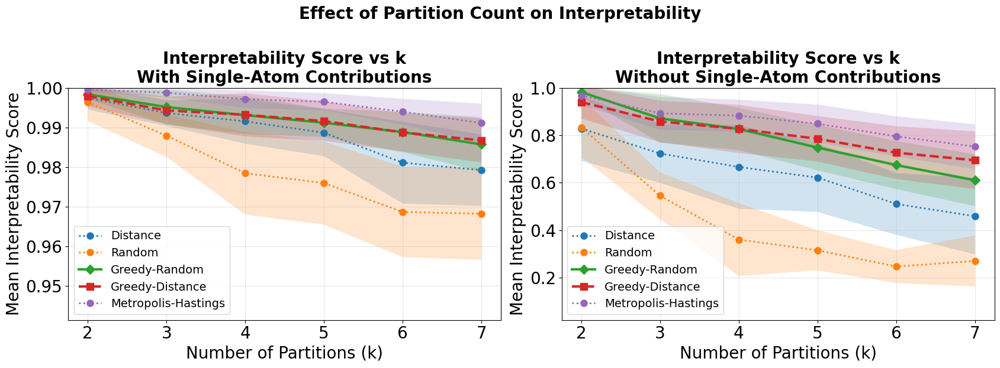


K SIGNIFICANCE TESTS: WITH SINGLE-ATOM CONTRIBUTIONS

Distance: best k=2
  vs k=3: difference=+0.0038, p=0.0006 ***
  vs k=4: difference=+0.0059, p=0.0004 ***
  vs k=5: difference=+0.0088, p=0.0000 ***
  vs k=6: difference=+0.0163, p=0.0000 ***
  vs k=7: difference=+0.0182, p=0.0000 ***

Random: best k=2
  vs k=3: difference=+0.0084, p=0.0000 ***
  vs k=4: difference=+0.0179, p=0.0000 ***
  vs k=5: difference=+0.0204, p=0.0000 ***
  vs k=6: difference=+0.0277, p=0.0000 ***
  vs k=7: difference=+0.0282, p=0.0000 ***

Greedy-Random: best k=2
  vs k=3: difference=+0.0032, p=0.0055 **
  vs k=4: difference=+0.0053, p=0.0001 ***
  vs k=5: difference=+0.0072, p=0.0000 ***
  vs k=6: difference=+0.0095, p=0.0000 ***
  vs k=7: difference=+0.0126, p=0.0000 ***

Greedy-Distance: best k=2
  vs k=3: difference=+0.0036, p=0.0008 ***
  vs k=4: difference=+0.0047, p=0.0020 **
  vs k=5: difference=+0.0063, p=0.0000 ***
  vs k=6: difference=+0.0092, p=0.0000 ***
  vs k=7: difference=+0.0112, p=0.0000 **

In [54]:
from collections import defaultdict
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from partition_interpretability import (
    PartitionInterpreter,
    PartitionOptimizer,
    ChemicalPartitioner,
    validate_partition_decomposition,
    partition_connectivity_penalty,
    connectivity_adjusted_score,
)


# =============================================================================
# CONFIGURATION
# =============================================================================

RANDOM_SEED = 42
N_ITERATIONS = 100
N_SAMPLE = min(20, len(test))
K_VALUES = tuple(range(2, 8))

# Metropolis-Hastings settings
MH_ITERATIONS = 1000
MH_BETA = 20.0
MH_INITIALIZATION = "distance"

METHODS = (
    "Distance",
    "Random",
    "Greedy-Random",
    "Greedy-Distance",
    "Metropolis-Hastings",
)


# =============================================================================
# SAMPLE MOLECULES
# =============================================================================

sample_indices = np.random.RandomState(RANDOM_SEED).choice(
    len(test),
    size=N_SAMPLE,
    replace=False,
)

sample_mols = [test.iloc[i]["mol"] for i in sample_indices]
sample_smiles = [test.iloc[i]["smiles"] for i in sample_indices]

print("=" * 80)
print(f"COMPREHENSIVE K-VALUE ANALYSIS ({N_SAMPLE} molecules)")
print("=" * 80)
print(f"\nTesting k values: {list(K_VALUES)}")


# =============================================================================
# INTERPRETERS AND OPTIMIZERS
# =============================================================================

interpreter_full = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=False,
)

interpreter_no_atoms = PartitionInterpreter(
    featurizer=featurizer,
    model=hmodel,
    remove_single_atom_contributions=True,
)

greedy_optimizer_full = PartitionOptimizer(
    interpreter=interpreter_full,
    max_partitions=max(K_VALUES),
)

greedy_optimizer_no_atoms = PartitionOptimizer(
    interpreter=interpreter_no_atoms,
    max_partitions=max(K_VALUES),
)

print(
    "Single-atom coefficients zeroed in no-atom interpreter:",
    np.count_nonzero(
        interpreter_no_atoms.original_coefficients
        != interpreter_no_atoms.coefficients
    ),
)


# =============================================================================
# GREEDY WRAPPERS
# =============================================================================


def run_greedy_random(
    optimizer,
    mol,
    n_clusters,
    n_iterations=N_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False,
):
    """Run random-start greedy optimization while preserving requested k."""
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight,
        disconnected_singleton_weight=(
            optimizer.disconnected_singleton_weight
        )
    )

    interpretation = local_optimizer.optimize_partition_random(
        mol=mol,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose,
    )

    return interpretation.partition



def run_greedy_distance(
    optimizer,
    mol,
    n_clusters,
    n_iterations=N_ITERATIONS,
    seed=RANDOM_SEED,
    verbose=False,
):
    """Run distance-start greedy optimization while preserving requested k."""
    interpretation = optimizer.optimize_partition_distance(
        mol=mol,
        n_clusters=n_clusters,
        n_iterations=n_iterations,
        seed=seed,
        verbose=verbose,
    )

    return interpretation.partition

def run_metropolis_hastings(
    optimizer,
    mol,
    n_clusters,
    n_iterations=MH_ITERATIONS,
    beta=MH_BETA,
    initialization=MH_INITIALIZATION,
    seed=RANDOM_SEED,
    verbose=False,
):
    """
    Run Metropolis-Hastings optimization while preserving the requested k.
    """
    local_optimizer = PartitionOptimizer(
        interpreter=optimizer.interpreter,
        min_partitions=n_clusters,
        max_partitions=n_clusters,
        connectivity_weight=optimizer.connectivity_weight,
        disconnected_singleton_weight=(
            optimizer.disconnected_singleton_weight
        )
    )

    interpretation = (
        local_optimizer.optimize_partition_metropolis_hastings(
            mol=mol,
            n_clusters=n_clusters,
            n_iterations=n_iterations,
            beta=beta,
            initialization=initialization,
            seed=seed,
            verbose=verbose,
        )
    )

    return interpretation.partition
# =============================================================================
# STRATEGIES
# =============================================================================


def create_k_strategies(optimizer, k_values):
    """
    Create baseline, greedy, and Metropolis-Hastings strategies
    for one interpreter.
    """
    strategies = {}

    for k in k_values:
        strategies[f"Distance (k={k})"] = (
            lambda mol, k=k: ChemicalPartitioner.distance_partition(
                mol,
                n_clusters=k,
                seed=RANDOM_SEED,
            )
        )

        strategies[f"Random (k={k})"] = (
            lambda mol, k=k: ChemicalPartitioner.random_partition(
                mol,
                n_clusters=k,
                seed=RANDOM_SEED,
            )
        )

        strategies[f"Greedy-Random (k={k})"] = (
            lambda mol, k=k: run_greedy_random(
                optimizer=optimizer,
                mol=mol,
                n_clusters=k,
            )
        )

        strategies[f"Greedy-Distance (k={k})"] = (
            lambda mol, k=k: run_greedy_distance(
                optimizer=optimizer,
                mol=mol,
                n_clusters=k,
            )
        )

        strategies[f"Metropolis-Hastings (k={k})"] = (
            lambda mol, k=k: run_metropolis_hastings(
                optimizer=optimizer,
                mol=mol,
                n_clusters=k,
            )
        )

    return strategies


strategies_full = create_k_strategies(
    greedy_optimizer_full,
    K_VALUES,
)

strategies_no_atoms = create_k_strategies(
    greedy_optimizer_no_atoms,
    K_VALUES,
)

print(f"\nStrategies per analysis: {len(strategies_full)}")
print(f"  Distance baseline: {len(K_VALUES)}")
print(f"  Random baseline: {len(K_VALUES)}")
print(f"  Greedy-Random: {len(K_VALUES)}")
print(f"  Greedy-Distance: {len(K_VALUES)}")
print(f"  Metropolis-Hastings: {len(K_VALUES)}")


# =============================================================================
# RESULT COLLECTION
# =============================================================================


def collect_k_results(
    molecules,
    smiles_list,
    strategies,
    analysis_interpreter,
    analysis_name,
):
    """Evaluate every strategy and k value for one interpreter."""
    results_by_strategy = defaultdict(list)

    print("\n" + "=" * 80)
    print(analysis_name)
    print("=" * 80)

    for mol_idx, mol in enumerate(molecules):
        if (mol_idx + 1) % 10 == 0:
            print(f"  Processed {mol_idx + 1}/{len(molecules)} molecules")

        for strategy_name, partition_fn in strategies.items():
            try:
                partition = partition_fn(mol)
                interpretation = analysis_interpreter.compute_partition_contributions(
                    mol,
                    partition,
                )
                breakdown = interpretation.get_contribution_breakdown()
                connectivity_penalty = partition_connectivity_penalty(
                    mol=mol,
                    partition=partition,
                    disconnected_singleton_weight=2.0
                )

                adjusted_score = connectivity_adjusted_score(
                    mol=mol,
                    interpretation=interpretation,
                    connectivity_weight=0.10,
                    disconnected_singleton_weight=2.0
                )
                validation = validate_partition_decomposition(
                    mol,
                    analysis_interpreter,
                    partition,
                    tolerance=1e-2,
                )

                requested_k = int(
                    strategy_name.split("k=")[1].rstrip(")")
                )

                results_by_strategy[strategy_name].append(
                    {
                        "mol_idx": mol_idx,
                        "smiles": smiles_list[mol_idx],
                        "n_atoms": mol.GetNumAtoms(),
                        "k_requested": requested_k,
                        "n_partitions": len(set(partition.values())),
                        "score": interpretation.score,
                        "adjusted_score": adjusted_score,
                        "connectivity_penalty": connectivity_penalty,
                        "within_frac": breakdown["within_frac"],
                        "between_frac": breakdown["between_frac"],
                        "higher_frac": breakdown["higher_frac"],
                        "prediction": interpretation.total_prediction,
                        "atom_baseline": interpretation.atom_baseline,
                        "validation_passed": validation["passed"],
                        "validation_error": validation["relative_error"],
                    }
                )

            except Exception as error:
                print(
                    f"  Warning: {analysis_name}; {strategy_name}; "
                    f"molecule {mol_idx}: {error}"
                )

    return results_by_strategy


all_results_full = collect_k_results(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_full,
    analysis_interpreter=interpreter_full,
    analysis_name="WITH SINGLE-ATOM CONTRIBUTIONS",
)

all_results_no_atoms = collect_k_results(
    molecules=sample_mols,
    smiles_list=sample_smiles,
    strategies=strategies_no_atoms,
    analysis_interpreter=interpreter_no_atoms,
    analysis_name="WITHOUT SINGLE-ATOM CONTRIBUTIONS",
)


# =============================================================================
# SUMMARY TABLES
# =============================================================================


def create_summary_dataframe(results_by_strategy, strategy_order):
    rows = []

    for strategy_name in strategy_order:
        results = results_by_strategy[strategy_name]

        if not results:
            continue

        strategy_df = pd.DataFrame(results)

        rows.append(
            {
                "Strategy": strategy_name,
                "N_molecules": len(strategy_df),
                "Mean Score": strategy_df["score"].mean(),
                "Std Score": strategy_df["score"].std(),
                "Min Score": strategy_df["score"].min(),
                "Max Score": strategy_df["score"].max(),
                "Median Score": strategy_df["score"].median(),
                "Mean Within %": 100 * strategy_df["within_frac"].mean(),
                "Mean Between %": 100 * strategy_df["between_frac"].mean(),
                "Mean Higher %": 100 * strategy_df["higher_frac"].mean(),
                "Mean Actual k": strategy_df["n_partitions"].mean(),
                "Validation Pass %": (
                    100 * strategy_df["validation_passed"].mean()
                ),
            }
        )

    summary = pd.DataFrame(rows)

    if not summary.empty:
        summary = summary.sort_values(
            "Mean Score",
            ascending=False,
        )

    return summary


summary_df_full = create_summary_dataframe(
    all_results_full,
    list(strategies_full),
)

summary_df_no_atoms = create_summary_dataframe(
    all_results_no_atoms,
    list(strategies_no_atoms),
)

print("\n" + "=" * 80)
print("SUMMARY WITH SINGLE-ATOM CONTRIBUTIONS")
print("=" * 80)
print(summary_df_full.to_string(index=False))

print("\n" + "=" * 80)
print("SUMMARY WITHOUT SINGLE-ATOM CONTRIBUTIONS")
print("=" * 80)
print(summary_df_no_atoms.to_string(index=False))


# =============================================================================
# K ANALYSIS
# =============================================================================


def create_k_analysis(results_by_strategy):
    """Organize scores as method -> k -> list of molecule scores."""
    analysis = defaultdict(lambda: defaultdict(list))

    for strategy_name, results in results_by_strategy.items():
        if "k=" not in strategy_name:
            continue

        method = strategy_name.split(" (")[0]
        k = int(strategy_name.split("k=")[1].rstrip(")"))

        for result in results:
            analysis[method][k].append(result["score"])

    return analysis


k_analysis_full = create_k_analysis(all_results_full)
k_analysis_no_atoms = create_k_analysis(all_results_no_atoms)



def create_k_summary(k_analysis, contribution_setting):
    rows = []

    for method in METHODS:
        for k in sorted(k_analysis.get(method, {})):
            scores = k_analysis[method][k]

            rows.append(
                {
                    "Contribution Setting": contribution_setting,
                    "Method": method,
                    "k": k,
                    "Mean Score": np.mean(scores),
                    "Std Score": np.std(scores),
                    "N": len(scores),
                }
            )

    return pd.DataFrame(rows)


k_summary_df_full = create_k_summary(
    k_analysis_full,
    "With single-atom contributions",
)

k_summary_df_no_atoms = create_k_summary(
    k_analysis_no_atoms,
    "Without single-atom contributions",
)

k_summary_df = pd.concat(
    [k_summary_df_full, k_summary_df_no_atoms],
    ignore_index=True,
)

print("\n" + "=" * 80)
print("OPTIMAL K BY METHOD")
print("=" * 80)

for contribution_setting, analysis in (
    ("With single-atom contributions", k_analysis_full),
    ("Without single-atom contributions", k_analysis_no_atoms),
):
    print(f"\n{contribution_setting}:")

    for method in METHODS:
        if method not in analysis or not analysis[method]:
            continue

        mean_by_k = {
            k: np.mean(scores)
            for k, scores in analysis[method].items()
        }
        best_k = max(mean_by_k, key=mean_by_k.get)

        print(
            f"  {method:16s}: k={best_k}, "
            f"mean score={mean_by_k[best_k]:.4f}"
        )


# =============================================================================
# SIDE-BY-SIDE INTERPRETABILITY SCORE VS K
# =============================================================================


def get_plot_style(method):
    if method == "Greedy-Random":
        return {
            "linestyle": "-",
            "marker": "D",
            "linewidth": 3,
            "markersize": 8,
        }

    if method == "Greedy-Distance":
        return {
            "linestyle": "--",
            "marker": "s",
            "linewidth": 3,
            "markersize": 8,
        }

    return {
        "linestyle": ":",
        "marker": "o",
        "linewidth": 2,
        "markersize": 8,
    }



def plot_interpretability_vs_k(ax, k_analysis, title):
    """Plot mean score and one-standard-deviation bands."""
    for method in METHODS:
        if method not in k_analysis:
            continue

        ks = sorted(k_analysis[method])

        if not ks:
            continue

        means = np.asarray(
            [np.mean(k_analysis[method][k]) for k in ks]
        )
        stds = np.asarray(
            [np.std(k_analysis[method][k]) for k in ks]
        )

        ax.plot(
            ks,
            means,
            label=method,
            **get_plot_style(method),
        )

        ax.fill_between(
            ks,
            means - stds,
            means + stds,
            alpha=0.2,
        )

    ax.set_xlabel(
        "Number of Partitions (k)",
        fontsize=20,
    )
    ax.set_ylabel(
        "Mean Interpretability Score",
        fontsize=20,
    )
    ax.set_title(
        title,
        fontsize=20,
        fontweight="bold",
    )
    ax.set_xticks(K_VALUES)
    ax.tick_params(axis="both", labelsize=20)
    ax.legend(fontsize=14)
    ax.grid(alpha=0.3)


fig, axes = plt.subplots(
    1,
    2,
    figsize=(17, 6),
    sharey=False,
)

plot_interpretability_vs_k(
    ax=axes[0],
    k_analysis=k_analysis_full,
    title=(
        "Interpretability Score vs k\n"
        "With Single-Atom Contributions"
    ),
)

plot_interpretability_vs_k(
    ax=axes[1],
    k_analysis=k_analysis_no_atoms,
    title=(
        "Interpretability Score vs k\n"
        "Without Single-Atom Contributions"
    ),
)
def get_score_ylim(k_analysis, methods, padding_fraction=0.05):
    """
    Compute a separate data-driven y-axis range for one score-vs-k panel.
    """
    score_values = []

    for method in methods:
        for scores in k_analysis.get(method, {}).values():
            score_values.extend(scores)

    if not score_values:
        return None

    score_min = min(score_values)
    score_max = max(score_values)
    score_range = score_max - score_min

    padding = (
        0.02
        if score_range < 1e-12
        else padding_fraction * score_range
    )

    return (
        max(0.0, score_min - padding),
        min(1.0, score_max + padding),
    )


full_ylim = get_score_ylim(
    k_analysis_full,
    METHODS,
)

no_atom_ylim = get_score_ylim(
    k_analysis_no_atoms,
    METHODS,
)

if full_ylim is not None:
    axes[0].set_ylim(*full_ylim)

if no_atom_ylim is not None:
    axes[1].set_ylim(*no_atom_ylim)

print("Full-model y limits:", full_ylim)
print("No-atom y limits:", no_atom_ylim)

fig.suptitle(
    "Effect of Partition Count on Interpretability",
    fontsize=20,
    fontweight="bold",
    y=1.03,
)

plt.tight_layout()

output_filename = (
    "interpretability_score_vs_k_"
    "with_and_without_single_atom_contributions.png"
)

plt.savefig(
    output_filename,
    dpi=300,
    bbox_inches="tight",
)

print(f"\nSaved visualization to '{output_filename}'")
plt.show()


# =============================================================================
# STATISTICAL COMPARISON OF K VALUES
# =============================================================================


def print_k_significance_tests(k_analysis, label):
    print("\n" + "=" * 80)
    print(f"K SIGNIFICANCE TESTS: {label.upper()}")
    print("=" * 80)

    for method in METHODS:
        if method not in k_analysis or not k_analysis[method]:
            continue

        mean_by_k = {
            k: np.mean(scores)
            for k, scores in k_analysis[method].items()
        }
        best_k = max(mean_by_k, key=mean_by_k.get)
        best_scores = k_analysis[method][best_k]

        print(f"\n{method}: best k={best_k}")

        for k in sorted(k_analysis[method]):
            if k == best_k:
                continue

            other_scores = k_analysis[method][k]
            _, p_value = stats.ttest_ind(
                best_scores,
                other_scores,
                equal_var=False,
            )
            difference = np.mean(best_scores) - np.mean(other_scores)
            significance = (
                "***" if p_value < 0.001
                else "**" if p_value < 0.01
                else "*" if p_value < 0.05
                else ""
            )

            print(
                f"  vs k={k}: difference={difference:+.4f}, "
                f"p={p_value:.4f} {significance}"
            )


print_k_significance_tests(
    k_analysis_full,
    "with single-atom contributions",
)

print_k_significance_tests(
    k_analysis_no_atoms,
    "without single-atom contributions",
)


# =============================================================================
# EXPORT RESULTS
# =============================================================================


def flatten_results(results_by_strategy, contribution_setting):
    rows = []

    for strategy_name, results in results_by_strategy.items():
        for result in results:
            row = result.copy()
            row["strategy"] = strategy_name
            row["method"] = strategy_name.split(" (")[0]
            row["contribution_setting"] = contribution_setting
            row["is_greedy_random"] = (
                "Greedy-Random" in strategy_name
            )

            row["is_greedy_distance"] = (
                "Greedy-Distance" in strategy_name
            )

            row["is_metropolis_hastings"] = (
                "Metropolis-Hastings" in strategy_name
            )

            row["is_greedy"] = (
                row["is_greedy_random"]
                or row["is_greedy_distance"]
            )

            row["is_optimized"] = (
                row["is_greedy"]
                or row["is_metropolis_hastings"]
            )
            rows.append(row)

    return pd.DataFrame(rows)


df_export_full = flatten_results(
    all_results_full,
    "with_single_atom_contributions",
)

df_export_no_atoms = flatten_results(
    all_results_no_atoms,
    "without_single_atom_contributions",
)

df_export = pd.concat(
    [df_export_full, df_export_no_atoms],
    ignore_index=True,
)

df_export.to_csv(
    "partition_interpretability_all_k_detailed_"
    "with_and_without_atom_contributions.csv",
    index=False,
)

summary_full_export = summary_df_full.copy()
summary_full_export["Contribution Setting"] = (
    "With single-atom contributions"
)

summary_no_atoms_export = summary_df_no_atoms.copy()
summary_no_atoms_export["Contribution Setting"] = (
    "Without single-atom contributions"
)

summary_combined = pd.concat(
    [summary_full_export, summary_no_atoms_export],
    ignore_index=True,
)

summary_combined.to_csv(
    "partition_interpretability_all_k_summary_"
    "with_and_without_atom_contributions.csv",
    index=False,
)

k_summary_df.to_csv(
    "partition_interpretability_k_analysis_"
    "with_and_without_atom_contributions.csv",
    index=False,
)

print("\nSaved detailed, summary, and k-analysis CSV files.")

